In [1]:
import numpy as np
import cluster_funcs as cl
import matplotlib.animation as animation
import matplotlib.pyplot as plt
from IPython.display import HTML
from scipy.ndimage import measurements
from scipy.ndimage import convolve
import Observables_functions as obs

# Cluster algorithms for the XY model

## Percolation

In [36]:
fig = plt.figure(figsize=(10,10))
final_inv = cl.percolation_cluster(L=15, p=0.45)

<Figure size 720x720 with 0 Axes>

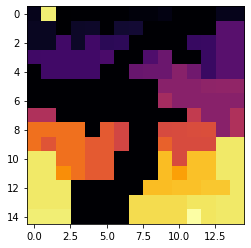

In [37]:
plt.imshow(final_inv, cmap='inferno')

In [396]:
cl.percolation(final_inv)

False

In [ ]:
L=5
p = 0.1
percolation_array = np.random.rand(L,L)
percolation_array = percolation_array<p

In [ ]:
plt.imshow(percolation_array)

In [ ]:
HTML(ani.to_html5_video())

## Swedensen Wang algorithm

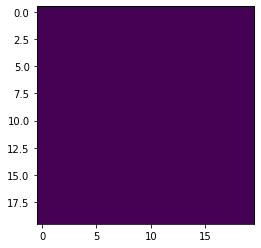

In [399]:
L = 20
#spins = 2*np.pi*np.random.rand(L, L)
spins = 2*np.pi*np.ones((L, L))
plt.imshow(spins)

In [484]:
def sweden_wang_cluster(spins, random_vector, temp):

    L = len(spins)
    array = np.resize(np.arange(1, L*L+1), (L, L))
    boolean_array = array < np.max(array)+1
    cluster_elements = cl.get_cluster_borders(array)

    random_elements = [cl.get_random_cluster_element(element) for element in cluster_elements]
    neighbors = np.array([[0, 1], [0, -1], [1, 0], [-1, 0]])

    for element in random_elements:
        initial = cl.index_format(element)
        for neighbor in neighbors:
            final = cl.index_format((element+neighbor) % len(array))

            # Check if the site to move to hasn't been already used
            # Check if they are already in the same cluster
            if boolean_array[final]:

                projection = np.dot(random_vector,spins[initial].T)*np.dot(random_vector,spins[final].T)
                #print(projection)
                if projection > 0:

                    if np.random.rand() < get_probability(temp, projection):

                        array[np.where(array == array[final])] = array[initial]
                        #array[final] = array[initial]
        boolean_array[initial] = False
    array = cl.relabel_clusters(array)
    return array

def get_probability(temp, spins_pojection, J=1):
    #print(spins_pojection)
    p = 1 - np.exp(-2*J*spins_pojection/temp)
    return p

def sweden_wang_evolution(spins, temperature):

    random_vector = cl.get_vector_components(2*np.pi*np.random.rand())
    clusters = sweden_wang_cluster(spins, random_vector, temperature)
    spins = rotate_clusters(spins, clusters, random_vector)

    return spins

def rotate_clusters(spins, invaded, random_vector):
    """
    Rotate spins for each cluster from invaded around random vector
    with probability 1/2.
    """
    x, y = random_vector
    rot_mat = np.array([[x,-y],[y,x]])
    #print(rot_mat)
    for i in range(int(np.max(invaded.flatten()))):
        #print(invaded)
        if np.random.rand() < 1/2:
            for element in np.column_stack(np.where(invaded == i+1)):
                #print(spins)
                #print(spins[tuple(element)] - 2* np.dot(spins[tuple(element)],random_vector)* spins[tuple(element)])
                spins[tuple(element)] = spins[tuple(element)] - 2* np.dot(spins[tuple(element)],random_vector)* random_vector
            
                #print(spins)
                
    return spins

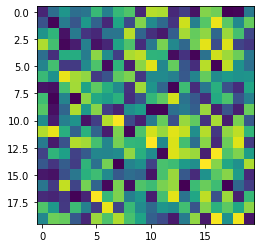

In [446]:
L=20
spins = cl.get_vector_components(2*np.pi*np.random.rand(L, L)).T
plt.imshow(np.arctan(spins[:,:,0]/spins[:,:,1]))

In [471]:
for i in range(10):
    spins = sweden_wang_evolution(spins, temperature=1)

<ipython-input-424-254ce46aef6f>:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  if boolean_array[final] and not array[initial] == array[final]:
<ipython-input-424-254ce46aef6f>:20: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  projection = np.dot(random_vector,spins[initial].T)*np.dot(random_vector,spins[final].T)
<ipython-input-424-254ce46aef6f>:28: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index

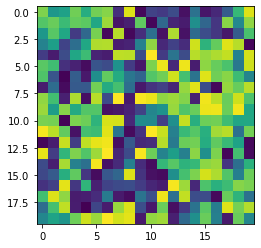

In [472]:
plt.imshow(np.arctan(spins[:,:,0]/spins[:,:,1]))

In [355]:
a=np.eye(10)
np.column_stack(np.where(a==1))


array([[0, 0],
       [1, 1],
       [2, 2],
       [3, 3],
       [4, 4],
       [5, 5],
       [6, 6],
       [7, 7],
       [8, 8],
       [9, 9]])

In [ ]:
fig = plt.figure()
nsteps = 20
pics = []
for i in range(nsteps):
    spins = cl.sweden_wang_evolution(spins, temperature=10)
    pics.append([plt.imshow(spins)])

In [473]:
def SW_algorithm(L, T_i, T_f, T_steps, relaxation_time, extra_time):
    
    #spins = 2*np.pi*np.ones((L, L))
    spins = cl.get_vector_components(2*np.pi*np.ones((L, L))).T
    T_n = np.linspace(T_i, T_f, T_steps)
    ave_M2 = np.zeros(T_steps)
    ave_E = np.zeros(T_steps)
    ave_E2 = np.zeros(T_steps)
    pics = []
    i = 0
    
    for temp in T_n:
        for rel_time in range(relaxation_time):
            spins = sweden_wang_evolution(spins,temp)
        for ext_time in range(extra_time):
            spins = sweden_wang_evolution(spins,temp)
            spins_angle = np.arctan(spins[:,:,0]/spins[:,:,1])
            E = obs.get_energy(L=L, lattice=spins_angle, J=1)
            ave_E2[i] += E**2
            ave_E[i] += E
            ave_M2[i] += obs.get_magnetisation_squared(spins_angle)
        pics.append([plt.imshow(spins_angle)])
        i += 1
        
    ave_M2 = ave_M2/(extra_time*L**4)
    ave_E2 = ave_E2/(extra_time)
    ave_E = (ave_E/(extra_time))**2
    Cv = (ave_E2-ave_E)
    return ave_M2, Cv, pics

<ipython-input-484-c0699d59cea8>:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  if boolean_array[final]:
<ipython-input-484-c0699d59cea8>:20: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  projection = np.dot(random_vector,spins[initial].T)*np.dot(random_vector,spins[final].T)
<ipython-input-484-c0699d59cea8>:34: RuntimeWarning: divide by zero encountered in true_divide
  p = 1 - np.exp(-2*J*spins_pojection/temp)
<ipython-input-484-c0699d59cea8>:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

CPU times: user 1min 14s, sys: 4 ms, total: 1min 14s
Wall time: 1min 14s


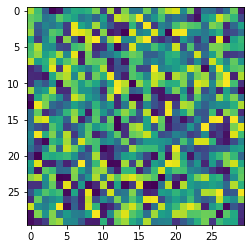

In [485]:
%%time
fig = plt.figure()
ave_M2, Cv, pics = SW_algorithm(L=30, T_i=0, T_f=1.5, T_steps=30, relaxation_time=10, extra_time=10)

In [488]:
ave_M2

array([1.        , 0.99506357, 0.6944174 , 0.71648197, 0.54774772,
       0.7544024 , 0.79515839, 0.5755217 , 0.60873308, 0.73250012,
       0.61804703, 0.59900567, 0.52426059, 0.43849108, 0.30324391,
       0.52848671, 0.43759321, 0.41281547, 0.38574324, 0.33285009,
       0.46757276, 0.40628268, 0.37443379, 0.41889348, 0.40434972,
       0.40730512, 0.40572546, 0.4003726 , 0.41374572, 0.40079228])

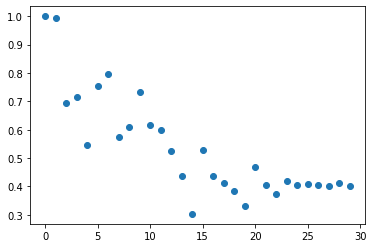

In [489]:
plt.scatter(range(len(ave_M2)),ave_M2)

In [ ]:
a = np.array([[1,1,0],[0,1,0]])
b = np.array([[1,1,0],[0,1,0]])

In [ ]:
fill bonds in a latticeL = 5
p = 0.5
z = 2*np.pi*np.random.rand(L,L)
rand_ang = 2*np.pi*np.random.rand()
rand_ang_mat = rand_ang*np.ones((L,L))
vecs = get_vector_components(z).T
rand_vecs = get_vector_components(rand_ang_mat).T
inner_p = np.inner(rand_vecs,vecs)[0][0]

In [ ]:
def get_vector_components(angle):
    """Get x and y components of a unit vector with angle"""
    return np.array([np.cos(angle), np.sin(angle)])

In [ ]:
vecs = get_vector_components(z).T
rand_vecs = get_vector_components(rand_ang_mat).T
inner_p = np.inner(rand_vecs,vecs)[0][0]

In [ ]:
kernel = np.array([[0, 1, 0],[1, 0, 1],[0, 1, 0]])
neighbour_sums = convolve(inner_p, kernel, mode='wrap')

In [ ]:
inner_p

In [ ]:
shifted_column = reorder_columns(inner_p)

In [21]:
def get_vector_components(angle):
    """Get x and y components of a unit vector with angle"""
    return np.array([np.cos(angle), np.sin(angle)])

In [22]:
def create_random_links(L):
    return np.random.rand(L, L)

In [23]:
def spin_onto_random_vector(spins, random_angle):
    rand_ang_mat = random_angle*np.ones((L,L))
    vecs = get_vector_components(spins).T
    rand_vecs = get_vector_components(rand_ang_mat).T
    inner_p = np.inner(rand_vecs,vecs)[0][0]
    return inner_p

In [24]:
def get_links_horizontal(array, T):
    shifted_column = reorder_columns(array)
    return 1-np.exp(-2*array*shifted_column/T)

def get_links_vertical(array, T):
    shifted_column = reorder_columns(array.T).T
    return 1-np.exp(-2*array*shifted_column/T)

In [25]:
def reorder_columns(array):
    L = len(array)
    aux = np.copy(array)
    for i in range(L):
        aux[:,i] = array[:,i-1]
    return aux

In [26]:
def fill_bonds(L, v_bonds, h_bonds):
    array = np.zeros((L,L))
    k = 1
    for i in range(L):
        for j in range(L):
            if h_bonds[i,j]:
                array[i,j] = k
                array[i,j-1] = array[i,j]
            else:
                k += 1
            if v_bonds[i,j]:
                array[i,j] = k
                array[i-1,j] = array[i,j]
            else:
                k += 1
            if not h_bonds[i,j] and not v_bonds[i,j]:
                k += 1
    return array

In [27]:
L=5
T= 0.4
#spins = 2*np.pi*np.random.rand(L,L)
spins = 2*np.pi*np.ones((L,L))
random_angle = 2*np.pi*np.random.rand()
inner_p = spin_onto_random_vector(spins, random_angle)
v_rand_links = create_random_links(L)
h_rand_links = create_random_links(L)

In [31]:
fill_bonds(L, v_rand_links, h_rand_links)

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [28]:
spins = 2*np.pi*np.ones((L,L))
spins = get_vector_components(spins).T

In [29]:
spins.T[spins.T<1e-10] = 0

In [30]:
spins.T

array([[[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]],

       [[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]]])

In [ ]:
h_links = get_links_horizontal(inner_p, T)
v_links = get_links_vertical(inner_p, T)

In [ ]:
v_rand_links = v_rand_links < v_links
h_rand_links = h_rand_links < h_links

In [ ]:
v_rand_links

In [ ]:
h_rand_links

In [567]:
def rotate_clusters(spins, invaded, random_vector):
    """
    Rotate spins for each cluster from invaded around random vector
    with probability 1/2.
    """
    x, y = random_vector
    rot_mat = np.array([[x,-y],[y,x]])
    #print(rot_mat)
    for i in range(int(np.max(invaded.flatten()))):
        #print(invaded)
        if np.random.rand() < 1/2:
            for element in np.column_stack(np.where(invaded == i+1)):
                #print(spins)
                #print(spins[tuple(element)] - 2* np.dot(spins[tuple(element)],random_vector)* spins[tuple(element)])
                spins[tuple(element)] = spins[tuple(element)] - 2* np.dot(spins[tuple(element)],random_vector)* random_vector
            
                #print(spins)
                
    return spins

In [656]:
def check_neighbours(spins,cluster,seed,T,random_vector,cluster_number,J=1):
    
    neighbors = np.array([[0, 1], [0, -1], [1, 0], [-1, 0]])
    
    for neighbor in neighbors:
        
        goto = (seed + neighbor)%len(spins)
        #print('goto')
        #print(goto)
        projection = np.dot(random_vector,spins[tuple(goto)])*np.dot(random_vector,spins[tuple(seed)])

        cluster[tuple(seed)] = cluster_number
        #print(projection)
        if projection>0 and cluster[tuple(goto)] == 0:

            p =  1-np.exp(-2*projection/T)
            #print(p)
            #print(percolation(cluster))
            if np.random.rand() < p:
                
                check_neighbours(spins,cluster,goto,T,random_vector,cluster_number)         
    return cluster

In [726]:
def check_neighbours_ic(spins,cluster,seed,T,random_vector,cluster_number,J=1):
    
    neighbors = np.array([[0, 1], [0, -1], [1, 0], [-1, 0]])
    
    for neighbor in neighbors:
        
        goto = (seed + neighbor)%len(spins)
        projection = np.dot(random_vector,spins[tuple(goto)])*np.dot(random_vector,spins[tuple(seed)])

        cluster[tuple(seed)] = cluster_number
        
        perc, pc = percolation(cluster)
        if perc:
            new_beta = np.log(1/(1-pc))/projection
            new_t = 1.0/new_beta
            print(cluster)
            print(1.0/new_beta)
            return cluster, perc, new_T
        
        if projection>0 and cluster[tuple(goto)] == 0:

            p =  1-np.exp(-2*projection/T)
            
            if np.random.rand() < p:
                
                check_neighbours_ic(spins,cluster,goto,T,random_vector,cluster_number)         
    return cluster, perc, T

In [727]:
def sw_evolution(spins, T, J=1):
    #L = len(spins)
    #print(spins)
    clusters = np.zeros((L,L))
    random_vector = get_vector_components(2*np.pi*np.random.rand())
    cluster_number = 1
    seed = np.random.randint(low=0,high=L-1,size=2)
    rest = np.column_stack(np.where(clusters==0))
    while len(rest) > 0:
        seed = rest[np.random.choice(len(rest))]
        #print('seed')
        #print(seed)
        clusters = check_neighbours(spins,clusters,seed,T,random_vector,cluster_number)
        #print(clusters)
        cluster_number += 1
        rest = np.column_stack(np.where(clusters==0))
        
    spins = rotate_clusters(spins, clusters, random_vector)
    #print(spins)
    return spins, clusters

In [744]:
def ic_evolution(spins, T, J=1):
    #L = len(spins)
    #print(spins)
    clusters = np.zeros((L,L))
    random_vector = get_vector_components(2*np.pi*np.random.rand())
    cluster_number = 1
    seed = np.random.randint(low=0,high=L-1,size=2)
    rest = np.column_stack(np.where(clusters==0))
    while len(rest) > 0:
        seed = rest[np.random.choice(len(rest))]
        #print('seed')
        #print(seed)
        clusters, perc, new_T = check_neighbours_ic(spins,clusters,seed,T,random_vector,cluster_number)
        if perc:
            print('perc')
            print(new_T)
            break
        cluster_number += 1
        rest = np.column_stack(np.where(clusters==0))
        
    spins = rotate_clusters(spins, clusters, random_vector)
    #print(new_T)
    return spins, clusters, new_T

In [745]:
def percolation(invaded):

    L = len(invaded)
    ones_vec = np.ones(L)
    ones_cluster = np.zeros((L, L))
    ones_cluster[np.where(invaded == np.max(invaded))] = 1
    path_1 = ones_cluster.dot(ones_vec)
    path_2 = ones_cluster.T.dot(ones_vec)

    if 0. not in path_1 or 0. not in path_2:
        percolation = True
    else:
        percolation = False
    pc = len(ones_cluster[ones_cluster==1])/len(ones_cluster)**2
    return percolation, pc

In [746]:
def get_T_from_pc(pc):
    return np.log(1-pc)

In [747]:
len(a[a!=0])

10

In [748]:
def get_vector_components(angle):
    """Get x and y components of a unit vector with angle"""
    return np.array([np.cos(angle), np.sin(angle)])

In [749]:
import sys
sys.setrecursionlimit(10000000)

In [750]:
L = 30
#spins0 = 2*np.pi*np.ones((L,L))
spins0 = 2*np.pi*np.random.rand(L,L)
spins = get_vector_components(spins0).T
random_vector = get_vector_components(2*np.pi*np.random.rand())

<ipython-input-656-63a9cfdcf16a>:16: RuntimeWarning: divide by zero encountered in double_scalars
  p =  1-np.exp(-2*projection/T)


CPU times: user 3.67 s, sys: 26.1 ms, total: 3.69 s
Wall time: 3.66 s


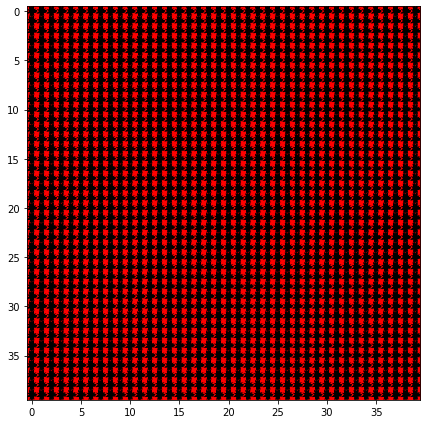

In [756]:
%%time
fig = plt.figure(figsize=(6,6))

L = 40
spins0 = 2*np.pi*np.ones((L,L))
#spins0 = 2*np.pi*np.random.rand(L,L)
spins = get_vector_components(spins0).T
random_vector = get_vector_components(2*np.pi*np.random.rand())

ts = np.linspace(0,1,20)
ims = []
new_T = 0
for i in range(50):
    spins, _ = sw_evolution(spins, T=new_T)
    spins_angle = np.arctan(spins[:,:,0]/spins[:,:,1])
    X, Y = np.mgrid[0:L, 0:L]
    U = spins[:,:,0]
    V = spins[:,:,1]
    #ims.append([plt.quiver(X,Y,U,V)])
    #ims.append([plt.imshow(spins_angle)])
    quiver = plt.quiver(X,Y,U,V)
    imsh = plt.imshow(spins_angle,cmap='hsv')
    plt.title('Relaxations step: '+str(i))
    ims.append([quiver,imsh])
    plt.title('')

In [757]:
%matplotlib inline
ani = animation.ArtistAnimation(fig, ims, interval=400, blit=True,
                                repeat_delay=1)
HTML(ani.to_html5_video())

CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '432x432', '-pix_fmt', 'rgba', '-r', '2.5', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmp2z02_6m6/temp.m4v']' returned non-zero exit status 255.

In [616]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=2, metadata=dict(artist='Me'), bitrate=1800)
ani.save('relax.mp4', writer=writer)

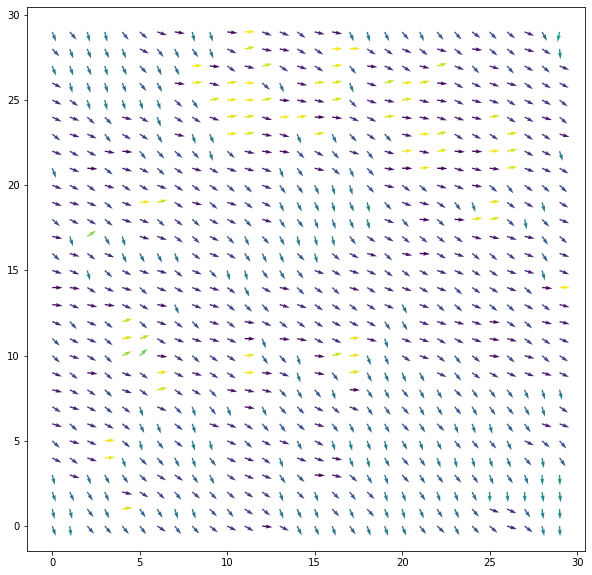

In [554]:
fig = plt.figure(figsize=(10,10))
X, Y = np.mgrid[0:L, 0:L]
U = spins[:,:,0]
V = spins[:,:,1]
spins_angle = np.arctan(spins[:,:,0]/spins[:,:,1])
plt.quiver(X,Y,U,V,spins_angle)
#plt.imshow(spins_angle,cmap='hsv')

In [ ]:
%%time
fig = plt.figure(figsize=(6,6))

L = 25
#spins0 = 2*np.pi*np.ones((L,L))
spins0 = 2*np.pi*np.random.rand(L,L)
spins = get_vector_components(spins0).T
random_vector = get_vector_components(2*np.pi*np.random.rand())

ts = np.linspace(0,1,20)
ims = []
for i in range(50):
    spins, _, pc = ic_evolution(spins, T=0)
    spins_angle = np.arctan(spins[:,:,0]/spins[:,:,1])
    X, Y = np.mgrid[0:L, 0:L]
    U = spins[:,:,0]
    V = spins[:,:,1]
    #ims.append([plt.quiver(X,Y,U,V)])
    #ims.append([plt.imshow(spins_angle)])
    quiver = plt.quiver(X,Y,U,V)
    imsh = plt.imshow(spins_angle,cmap='hsv')
    plt.title('Relaxations step: '+str(i))
    ims.append([quiver,imsh])
    plt.title('')

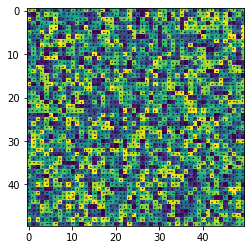

<ipython-input-497-6cef6a632993>:16: RuntimeWarning: divide by zero encountered in double_scalars
  p =  1-np.exp(-2*projection/T)


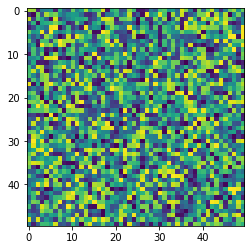

In [518]:
L = 50
spins0 = 2*np.pi*np.ones((L,L))
#spins0 = 2*np.pi*np.random.rand(L,L)
spins = get_vector_components(spins0).T
random_vector = get_vector_components(2*np.pi*np.random.rand())

fig = plt.figure()

ts = np.linspace(0,2,40)
ims = []
m = []
for t in ts:
    for i in range(10):
        spins, _ = sw_evolution(spins, T=t)
    for j  in range(10):
        spins, _ = sw_evolution(spins, T=t)
        mag_i = []
        mag = np.sum(spins[:,:,0])**2+np.sum(spins[:,:,1])**2
        mag_i.append(mag/len(spins)**4)
    m.append(np.mean(mag_i))
    spins_angle = np.arctan(spins[:,:,0]/spins[:,:,1])
    ims.append([plt.imshow(spins_angle)])

In [524]:
%matplotlib inline
ani = animation.ArtistAnimation(fig, ims, interval=300, blit=True,
                                repeat_delay=1)
HTML(ani.to_html5_video())

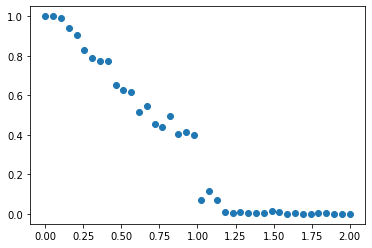

In [525]:
plt.scatter(ts,m)

In [521]:
np.sum(spins[:,:,None])**2

1441.4344848789956

In [522]:
spins[6,5,0]

0.6332326403171651

In [523]:
np.mean(spins[0][1])

0.6723245121078136

In [28]:
def SW_algorithm(L, T_i, T_f, T_steps, relaxation_time, extra_time):
    
    spins = 2*np.pi*np.random.rand(L,L)
    spins = get_vector_components(spins).T
    T_n = np.linspace(T_i, T_f, T_steps)
    ave_M2 = np.zeros(T_steps)
    ave_E = np.zeros(T_steps)
    ave_E2 = np.zeros(T_steps)
    pics = []
    i = 0
    
    for temp in T_n:
        for rel_time in range(relaxation_time):
            spins = sw_evolution(spins, T=temp)
        for ext_time in range(extra_time):
            spins = sw_evolution(spins, T=temp)
            spins_angle = np.arctan(spins[:,:,1]/spins[:,:,0])
            E = obs.get_energy(L=L, lattice=spins_angle, J=1)
            ave_E2[i] += E**2
            ave_E[i] += E
            ave_M2[i] += obs.get_magnetisation_squared(spins_angle)
        pics.append([plt.imshow(spins_angle)])
        i += 1
        
    ave_M2 = ave_M2/(extra_time*L**4)
    ave_E2 = ave_E2/(extra_time)
    ave_E = (ave_E/(extra_time))**2
    Cv = (ave_E2-ave_E)
    return ave_M2, Cv, pics

In [222]:
fig = plt.figure()
ave_M2, Cv, pics = SW_algorithm(L=30, T_i=0, T_f=2, T_steps=30, relaxation_time=5, extra_time=5)

seed
[9 9]
goto
[ 9 10]
goto
[9 8]
goto
[10  9]
goto
[8 9]
goto
[ 8 10]


<ipython-input-217-7f8ba3104ae0>:16: RuntimeWarning: divide by zero encountered in true_divide
  threeshold =  1-np.exp(-2*J*projection/T)


IndexError: index 10 is out of bounds for axis 1 with size 10

<Figure size 432x288 with 0 Axes>

In [ ]:
fig = plt.figure()

L = 64
spins = 2*np.pi*np.random.rand(L,L)
spins = get_vector_components(spins).T
random_vector = get_vector_components(2*np.pi*np.random.rand())

n_realx = 6
ims = []
for i in range(n_realx):
    spins, clusters = sw_evolution(spins, T=0)
    ims.append([plt.imshow(np.arctan(spins[:,:,1]/spins[:,:,0]))])
    

In [225]:
%matplotlib inline
ani = animation.ArtistAnimation(fig, ims, interval=300, blit=True,
                                repeat_delay=1)
HTML(ani.to_html5_video())

In [ ]:
def f(T):
    return 1-np.exp(-2/T)

In [ ]:
x = np.linspace(0,100,100000)

In [ ]:
plt.plot(x,f(x))

In [ ]:
def spins_aligned(element, direction, spins, random_vector):

    initial = index_format(element)
    final = index_format((element+direction) % len(spins))
    #print(get_vector_components(spins[initial]).flatt)
    #print(random_vector)

    proj1 = np.dot(get_vector_components(spins[initial]).flatten(), random_vector)
    proj2 = np.dot(get_vector_components(spins[final]).flatten(), random_vector)

    return proj1*proj2

In [ ]:
fig = plt.figure()
ave_M2, Cv, pics = SW_algorithm(L=30, T_i=0, T_f=2, T_steps=30, relaxation_time=5, extra_time=5)

In [56]:
def SW_algorithm(L, T_i, T_f, T_steps, relaxation_time, extra_time):
    
    spins = 2*np.pi*np.ones((L, L))
    T_n = np.linspace(T_i, T_f, T_steps)
    ave_M2 = np.zeros(T_steps)
    ave_E = np.zeros(T_steps)
    ave_E2 = np.zeros(T_steps)
    pics = []
    i = 0
    
    for temp in T_n:
        for rel_time in range(relaxation_time):
            spins = cl.sweden_wang_evolution(spins,temp)
        for ext_time in range(extra_time):
            spins = cl.sweden_wang_evolution(spins,temp)
            spins_angle = spins
            E = obs.get_energy(L=L, lattice=spins_angle, J=1)
            ave_E2[i] += E**2
            ave_E[i] += E
            ave_M2[i] += obs.get_magnetisation_squared(spins_angle)
        pics.append([plt.imshow(spins_angle)])
        i += 1
        
    ave_M2 = ave_M2/(extra_time*L**4)
    ave_E2 = ave_E2/(extra_time)
    ave_E = (ave_E/(extra_time))**2
    Cv = (ave_E2-ave_E)
    return ave_M2, Cv, pics

/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:152: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  if boolean_array[final] and not array[initial][0] == array[final][0]:
/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:272: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  proj1 = np.dot(get_vector_components(spins[initial]).flatten(), random_vector)
/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:273: FutureWar

0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.02871680687

0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.028716806871602572
0.02871680687

0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923
0.04018443021349923


0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198
0.08652216689568198


0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.41627704

0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.416277048545505
0.41627704

0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086
0.09978754114311086


0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477442738
0.5748079477

/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:152: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  if boolean_array[final] and not array[initial][0] == array[final][0]:
/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:272: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  proj1 = np.dot(get_vector_components(spins[initial]).flatten(), random_vector)
/home/juandaanieel/c/TUDelft/AP_master/semester2/CP/project_3/Project-3_kwo/cluster_funcs.py:273: FutureWar

2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.701418395

2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.7014183959529873e-05
2.701418395

0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.040775377198593386
0.04077537719

0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166553998
0.5036359166

0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809
0.05711456666418809


0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771


0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771
0.01389051991751771


0.15584141220829575
0.15584141220829575
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.15584141220829575
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.019547746835213

0.019547746835213813
0.15584141220829575
0.15584141220829575
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.15584141220829575
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.019547746835213813
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.15584141220829575
0.01954774683521

0.6977529257053852
0.6977529257053852
0.18344796433157937
0.18344796433157937
0.41775901033015805
0.35777276842579375
0.18344796433157937
0.18344796433157937
0.18344796433157937
0.18344796433157937
0.35777276842579375
0.41775901033015805
0.18344796433157937
0.6977529257053852
0.6977529257053852
0.8147421979046261
0.9513465649397244
0.9513465649397244
0.6977529257053852
0.9247192837250102
0.9513465649397244
0.9513465649397244
0.18344796433157937
0.18344796433157937
0.18344796433157937
0.6977529257053852
0.9513465649397244
0.35777276842579375
0.6977529257053852
0.6977529257053852
0.8147421979046261
0.8147421979046261
0.35777276842579375
0.41775901033015805
0.8147421979046261
0.6977529257053852
0.18344796433157937
0.18344796433157937
0.35777276842579375
0.35777276842579375
0.18344796433157937
0.18344796433157937
0.18344796433157937
0.35777276842579375
0.8147421979046261
0.8147421979046261
0.9513465649397244
0.9513465649397244
0.8147421979046261
0.7919383423796152
0.8147421979046261
0.9513

0.32075228480339996
0.32075228480339996
0.32075228480339996
0.46314570710562114
0.46314570710562114
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.031689223333382484
0.46314570710562114
0.46314570710562114
0.46314570710562114
0.46314570710562114
0.13681958105488318
0.46314570710562114
0.46314570710562114
0.46314570710562114
0.031689223333382484
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.031689223333382484
0.031689223333382484
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.32075228480339996
0.46314570710562114
0.46314570710562114
0.46314570710562114
0.031689223333382484
0.46314570710562114
0.46314570710562114
0.031689223333382484
0.031689223333382484
0.32075228480339996
0.32075228480339996
0.46314570710562114
0.040418376922933916
0.0031307863514939745
0.46314570710562114
0.46314570710562114
0.46314570

0.596160826441287
0.8887316433609576
0.596160826441287
0.44283611899211806
0.44283611899211806
0.6649740026282973
0.07957865088532654
0.12046006069409422
0.014300463320701708
0.07957865088532654
0.014300463320701708
0.032767485758502767
0.12046006069409422
0.18088589724548912
0.021646945008501416
0.032767485758502767
0.12046006069409422
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.021646945008501416
0.12046006069409422
0.021646945008501416
0.014300463320701708
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.032767485758502767
0.032767485758502767
0.021646945008501416
0.12046006069409422
0.12046006069409422
0.032767485758502767
0.44283611899211806
0.12046006069409422
0.44283611899211806
0.12046006069409422
0.44283611899211806
0.021646945008501416
0.032767485758502767
0.021646945008501416
0.021646945008501416
0.032767485758502767
0.032767485758502767
0.032767485758502767
0

0.032767485758502767
0.032767485758502767
0.032767485758502767
0.6649740026282973
0.032767485758502767
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.12046006069409422
0.032767485758502767
0.12046006069409422
0.44283611899211806
0.12046006069409422
0.18088589724548912
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.032767485758502767
0.18088589724548912
0.032767485758502767
0.032767485758502767
0.021646945008501416
0.18088589724548912
0.6649740026282973
0.12046006069409422
0.18088589724548912
0.18088589724548912
0.18088589724548912
0.07957865088532654
0.44283611899211806
0.021646945008501416
0.014300463320701708
0.021646945008501416
0.032767485758502767
0.9985419102170597
0.44283611899211806
0.44283611899211806
0.44283611899211806
0.12046006069409422
0.12046006069409422

0.8953723883557306
0.8087335912007018
0.8087335912007018
0.9912927106682912
0.9912927106682912
0.8953723883557306
0.9912927106682912
0.2774745164254781
0.8087335912007018
0.8087335912007018
0.8087335912007018
0.2774745164254781
0.8953723883557306
0.9912927106682912
0.09520082769314074
0.6813794078010729
0.8087335912007018
0.8087335912007018
0.3072000757516157
0.3072000757516157
0.8953723883557306
0.9912927106682912
0.9912927106682912
0.9912927106682912
0.9912927106682912
0.9912927106682912
0.9912927106682912
0.8953723883557306
0.9912927106682912
0.8087335912007018
0.8087335912007018
0.8087335912007018
0.8953723883557306
0.9912927106682912
0.2774745164254781
0.8953723883557306
0.5156966587405433
0.8087335912007018
0.8087335912007018
0.5156966587405433
0.5156966587405433
0.5156966587405433
0.9912927106682912
0.09520082769314074
0.8953723883557306
0.8087335912007018
0.8087335912007018
0.8953723883557306
0.8953723883557306
0.9912927106682912
0.8953723883557306
0.9912927106682912
0.98360846

0.8374722191156718
0.9990181585832535
0.9990181585832535
0.8374584477710616
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990345866500672
0.7020259298766989
0.8374584477710616
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.18766292143898705
0.9990181585832535
0.8374584477710616
0.37531626934170037
0.31462068796813847
0.7020259298766989
0.15731435664327797
0.03525198394087105
0.04316140738631991
0.03525198394087105
0.03525198394087105
0.03525198394087105
0.18766292143898705
0.03525198394087105
0.03525198394087105
0.03525198394087105
0.9990181585832535
0.5604211571898913
0.9990510149870275
0.9990181585832535
0.9990181585832535
0.8374584477710616
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990345866500672
0.8374584477710616
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.9990181585832535
0.8374584477710616
0.7020259298766989
0.7020259298766989
0.0431614073863199

0.3359774263087188
0.39580254265896836
0.5636717896980782
0.5922109078964198
0.5922109078964198
0.39580254265896836
0.5922109078964198
0.5922109078964198
0.3359774263087188
0.39580254265896836
0.39580254265896836
0.39580254265896836
0.5922109078964198
0.39580254265896836
0.3646652157925226
0.5922109078964198
0.5922109078964198
0.39580254265896836
0.8860826337179042
0.5922109078964198
0.8860826337179042
0.8860826337179042
0.39580254265896836
0.3646652157925226
0.39580254265896836
0.39580254265896836
0.8860826337179042
0.8860826337179042
0.8860826337179042
0.8860826337179042
0.8860826337179042
0.8433816015687361
0.12377937821043793
0.8860826337179042
0.8433816015687361
0.8027383663757656
0.8433816015687361
0.5636717896980782
0.8433816015687361
0.3646652157925226
0.5922109078964198
0.39580254265896836
0.39580254265896836
0.39580254265896836
0.39580254265896836
0.3646652157925226
0.5922109078964198
0.39580254265896836
0.39580254265896836
0.5922109078964198
0.5922109078964198
0.395802542658

0.3646652157925226
0.39580254265896836
0.04180974732987242
0.05937713786479167
0.1028608980869896
0.8027383663757656
0.8433816015687361
0.5636717896980782
0.08379472439885828
0.5565811234522241
0.5863620341572539
0.5565811234522241
0.5565811234522241
0.013914733098011117
0.5565811234522241
0.7286955540382171
0.01465926683517039
0.005440772026879182
0.017934119278515365
0.6177364280133468
0.5863620341572539
0.6177364280133468
0.6177364280133468
0.6177364280133468
0.6177364280133468
0.5863620341572539
0.5863620341572539
0.6177364280133468
0.5565811234522241
0.5565811234522241
0.5863620341572539
0.5565811234522241
0.5565811234522241
0.2370230178297635
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.21762767462644939
0.5565811234522241
0.5565811234522241
0.21762767462644939
0.30944860633583454
0.5565811234522241
0.5863620341572539
0.3260062309565237
0.12099688217155995
0.1720475882639416
0.5863620341572539
0.2292722491042791
0.2292722491042791
0.55658112345222

0.010967909393552723
0.2370230178297635
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.7802667910834663
0.9674677722111756
0.6177364280133468
0.7286955540382171
0.7286955540382171
0.5565811234522241
0.5565811234522241
0.21762767462644939
0.21762767462644939
0.21762767462644939
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.5863620341572539
0.6177364280133468
0.21762767462644939
0.5565811234522241
0.08509416285904847
0.08509416285904847
0.6587835797261241
0.5565811234522241
0.010967909393552723
0.08509416285904847
0.010967909393552723
0.010967909393552723
0.2370230178297635
0.5565811234522241
0.5565811234522241
0.30944860633583454
0.41178053319556895
0.2889378978306587
0.6177364280133468
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.21762767462644939
0.08509416285904847
0.21762767462644939
0.5565811234522241
0.5565811234522241
0.5565811234522241
0.2370230178297635
0.21762767462644939
0.6177364280133468
0.5863620341572539
0.22927224

0.8159428634384494
0.989493535419871
0.989493535419871
0.989493535419871
0.981250330498542
0.8985378059070882
0.989493535419871
0.989493535419871
0.989493535419871
0.989493535419871
0.8985378059070882
0.981250330498542
0.989493535419871
0.8159428634384494
0.8159428634384494
0.30202375528251824
0.10068890767405739
0.10068890767405739
0.5111358186881079
0.7474918480521063
0.973075797503752
0.973075797503752
0.989493535419871
0.989493535419871
0.989493535419871
0.8159428634384494
0.973075797503752
0.9467967730338437
0.9026141597216573
0.9984918771110635
0.8985378059070882
0.981250330498542
0.8910523287427423
0.8159428634384494
0.989493535419871
0.989493535419871
0.8985378059070882
0.8985378059070882
0.989493535419871
0.989493535419871
0.989493535419871
0.8985378059070882
0.30202375528251824
0.10068890767405739
0.10068890767405739
0.28662936982113335
0.10068890767405739
0.28662936982113335
0.42878498309509305
0.8910523287427423
0.973075797503752
0.989493535419871
0.8985378059070882
0.98949

0.977269052168038
0.977269052168038
0.977269052168038
0.07531293197717871
0.3836573561646071
0.3836573561646071
0.4131192150947983
0.4131192150947983
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.07531293197717871
0.07531293197717871
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3979259796322014
0.3979259796322014
0.3979259796322014
0.07531293197717871
0.977269052168038
0.977269052168038
0.07531293197717871
0.07531293197717871
0.3836573561646071
0.3836573561646071
0.977269052168038
0.018520550202438348
0.06906995541369255
0.977269052168038
0.977269052168038
0.977269052168038
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.3836573561646071
0.07531293197717871
0.3836573561646071
0.07531293197717871
0.014784123468143734
0.014784123468143734
0.07531293197717871
0.014784123468143734
0.3836573561646071
0.3

0.6498156486120007
0.6189329011969247
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.0675272647367529
0.5895178686482735
0.6189329011969247
0.5895178686482735
0.5895178686482735
0.5895178686482735
0.5895178686482735
0.6189329011969247
0.6189329011969247
0.5895178686482735
0.6498156486120007
0.6498156486120007
0.6189329011969247
0.6074532432392077
0.6498156486120007
0.6498156486120007
0.6074532432392077
0.7506995205612861
0.5678525032599797
0.6498156486120007
0.6498156486120007
0.6074532432392077
0.6498156486120007
0.6498156486120007
0.8030515949919029
0.6498156486120007
0.6498156486120007
0.8030515949919029
0.786883503744918
0.6498156486120007
0.6189329011969247
0.7494865519430473
0.8804629578382762
0.9528635541302404
0.6189329011969247
0.7648862482164253
0.7648862482164253
0.6498156486120007
0.8030515949919029
0.8030515949919029
0.6498156486120007
0.6498156486120007
0.7546840878277301
0.6498156486120007
0.6189329011969247
0.6189329011969247
0.6498156486120007
0.64981564861

0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.992422798060529
0.6074532432392077
0.6498156486120007
0.6074532432392077
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.8030515949919029
0.9724420366067241
0.07057987670565131
0.05439775990481716
0.5895178686482735
0.6498156486120007
0.8030515949919029
0.992422798060529
0.8030515949919029
0.727094424147426
0.8030515949919029
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.8030515949919029
0.6189329011969247
0.8030515949919029
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.8030515949919029
0.7506995205612861
0.5678525032599797
0.6074532432392077
0.6074532432392077
0.6074532432392077
0.07057987670565131
0.06915886976924218
0.005019553163752606
0.05439775990481716
0.004804343086446695
0.6498156486120007
0.8030515949919029
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498156486120007
0.6498

0.009550954294416441
0.07669800692923301
0.6159158640677065
0.6159158640677065
0.07669800692923301
0.6159158640677065
0.07669800692923301
0.842247742796225
0.2386173523525708
0.18778893726897156
0.18778893726897156
0.016512276484912408
0.2386173523525708
0.5797281219528767
0.3574268868027176
0.716271421333761
0.21168301540800338
0.009550954294416441
0.18778893726897156
0.18778893726897156
0.009550954294416441
0.009550954294416441
0.009550954294416441
0.18778893726897156
0.18778893726897156
0.18778893726897156
0.18778893726897156
0.32994928083944575
0.18778893726897156
0.02573760460052929
0.6159158640677065
0.6159158640677065
0.6159158640677065
0.6159158640677065
0.37710874299986097
0.18778893726897156
0.18778893726897156
0.21168301540800338
0.18778893726897156
0.21168301540800338
0.18778893726897156
0.716271421333761
0.40766219785717495
0.32994928083944575
0.18778893726897156
0.009550954294416441
0.18778893726897156
0.18778893726897156
0.0929704319357612
0.009550954294416441
0.18778893

0.9717443501829568
0.9717443501829568
0.17002571924786053
0.22824156261015402
0.9717443501829568
0.9717443501829568
0.9717443501829568
0.24862809200972608
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.6138818448069326
0.6138818448069326
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.24345963884639257
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.2135478743790783
0.2135478743790783
0.2135478743790783
0.1852365318179136
0.10855191904899322
0.5844008016294153
0.5844008016294153
0.9717443501829568
0.057650387523181676
0.9717443501829568
0.9717443501829568
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.5844008016294153
0.10142456270072382
0.04259876206461339
0.20110094581827037
0.10225411824704046
0

0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.9163232742408516
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.697670187109334
0.0005913415310157504
0.02395268043260316
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.9702191877524817
0.8638496503626755
0.8638496503626755
0.08109673996145124
0.8638496503626755
0.007613224395719919
0.07894051344002882
0.007613224395719919
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.8638496503626755
0.9163232742408516
0.9163232742408516
0.8638496503626755
0.9163232742408516
0.8638496503626755
0.0860228747682395
0.9376637090164711
0.904554923237016
0.7232065168294286
0.9376637090164711
0.6272705792761244
0.697670187109334
0.731213916593387
0.07461163199058632
0.1600427110689008
0.9702191877524817
0.529

0.08719575521953736
0.5739035972852669
0.501863317729318
0.501863317729318
0.5707050861363077
0.5388603265260061
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.6692152585202831
0.09529355177512283
0.5087924719044148
0.5388603265260061
0.5087924719044148
0.5087924719044148
0.5087924719044148
0.5087924719044148
0.5388603265260061
0.5388603265260061
0.5087924719044148
0.5707050861363077
0.5707050861363077
0.5388603265260061
0.6076869013311772
0.5707050861363077
0.5707050861363077
0.6076869013311772
0.7930290245741456
0.6470651462904397
0.5707050861363077
0.5707050861363077
0.6076869013311772
0.5707050861363077
0.5707050861363077
0.7447679006849774
0.5707050861363077
0.5707050861363077
0.6926220849988504
0.7216952707413306
0.5707050861363077
0.5388603265260061
0.6814254133895423
0.8253740023453783
0.9126325951228751
0.5388603265260061
0.6539744816510396
0.29339397912605664
0.5707050861363077
0.6926220849988504
0.7447679006849774
0.5707050861363077
0.5707050861363077
0.683385572

0.5087924719044148
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.31073253658975625
0.792124163181887
0.7447679006849774
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.00045273420674412604
0.31073253658975625
0.5087924719044148
0.5388603265260061
0.7032106142003823
0.6926220849988504
0.6539744816510396
0.5707050861363077
0.5707050861363077
0.4055047424182186
0.9038691063801759
0.8517612459553578
0.9719191914792719
0.3998812547663036
0.5707050861363077
0.5707050861363077
0.9418094998296919
0.8758675808178844
0.6814254133895423
0.8405836294116654
0.5388603265260061
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.9038691063801759
0.6076869013311772
0.5707050861363077
0.6076869013311772
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.5707050861363077
0.7447679006849774
0.7447679006849774
0.9418094998296919
0.6100984789705777
0.6100984789705777
0.5087924719044148
0.5707050861363077
0.31073253658975625
0.4055047424182186
0.7447

0.9249715261873113
0.9348990174175571
0.9100390283011737
0.948189429033291
0.9502394337812381
0.9502394337812381
0.9249715261873113
0.6057848503685398
0.9502394337812381
0.9502394337812381
0.9502394337812381
0.4229165151146316
0.18543316267437265
0.18543316267437265
0.18543316267437265
0.4086067550308778
0.3437347015225742
0.9100390283011737
0.919806252714968
0.9502394337812381
0.9249715261873113
0.9502394337812381
0.9249715261873113
0.919806252714968
0.6821905474868863
0.9249715261873113
0.9365905234015705
0.5332046425123604
0.32372723057726943
0.9348990174175571
0.5896763675201665
0.948189429033291
0.9502394337812381
0.9502394337812381
0.5896763675201665
0.3861924393894585
0.9502394337812381
0.9502394337812381
0.9502394337812381
0.9502394337812381
0.9502394337812381
0.04785929571355657
0.9319074452362727
0.18543316267437265
0.18543316267437265
0.18543316267437265
0.22009909289540536
0.9502394337812381
0.9249715261873113
0.6057848503685398
0.9502394337812381
0.9348990174175571
0.92497

0.24849829169955823
0.20448672001025392
0.9608454835646919
0.9608454835646919
0.8564754068840945
0.005298291283952822
0.006506022600762884
0.5752149718904933
0.8564754068840945
0.8564754068840945
0.8564754068840945
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.5891625406390539
0.9608454835646919
0.5891625406390539
0.6010005786787898
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.5891625406390539
0.9608454835646919
0.8844120428474512
0.9403593870638812
0.9608454835646919
0.9218369253724848
0.9608454835646919
0.8564754068840945
0.8564754068840945
0.7955477933030118
0.7934335569971269
0.8867687065325955
0.9218369253724848
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.9608454835646919
0.5891625406390539
0.9608454835646919
0.5652436258454665
0.9403593870638812
0.9218369253724848
0.9608454835646919
0.11919065378726149
0.9218369253724848
0.921

0.37923422400737766
0.4220949055403215
0.4220949055403215
0.4220949055403215
0.4220949055403215
0.4220949055403215
0.2450074957477549
0.2712474339537479
0.2450074957477549
0.08171946616084856
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.4390119498260278
0.2450074957477549
0.026285903641732968
0.19232043706280144
0.19232043706280144
0.19232043706280144
0.19232043706280144
0.632982838865476
0.6251131596370535
0.1839064236329145
0.4220949055403215
0.4220949055403215
0.20476426651738927
0.4220949055403215
0.4220949055403215
0.2450074957477549
0.49234057801530146
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2712474339537479
0.49714306441719847
0.015114423800113248
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.2450074957477549
0.4390119498260278
0.2450074957477549
0.19232043706280144

0.08614338922499282
0.08614338922499282
0.7532812692980302
0.0335644439425576
0.4155597578179869
0.4155597578179869
0.2712474339537479
0.13956393562122718
0.020913571211391695
0.016133415404293062
0.026285903641732968
0.7675118502024667
0.5450096323120704
0.5748862824352728
0.5450096323120704
0.5450096323120704
0.5416553294452873
0.5450096323120704
0.41592426398740223
0.5713481014731008
0.7176932419375991
0.6064007278737572
0.5748862824352728
0.6064007278737572
0.6064007278737572
0.6064007278737572
0.6064007278737572
0.5748862824352728
0.5748862824352728
0.6064007278737572
0.5450096323120704
0.5450096323120704
0.5748862824352728
0.043074864331321294
0.5450096323120704
0.5450096323120704
0.043074864331321294
0.04432738873664126
0.003404424118690282
0.5450096323120704
0.5450096323120704
0.043074864331321294
0.5450096323120704
0.5450096323120704
0.20712536743792437
0.5450096323120704
0.5450096323120704
0.20670344684372396
0.29838070211195616
0.5450096323120704
0.5748862824352728
0.3147375

0.08436657612657689
0.7221338624143978
0.7221338624143978
0.5450096323120704
0.21314812761846486
0.023699794390287486
0.1714265212479849
0.09804714929761234
0.5450096323120704
0.5450096323120704
0.29838070211195616
0.4006534101170108
0.2793254452745702
0.6064007278737572
0.5450096323120704
0.5450096323120704
0.5450096323120704
0.5608573401621672
0.5450096323120704
0.5781601046206962
0.5450096323120704
0.5450096323120704
0.12672995094888495
0.06391232522209732
0.6064007278737572
0.20712536743792437
0.5748862824352728
0.2184796844402324
0.5450096323120704
0.5450096323120704
0.078555542581084
0.078555542581084
0.21271393848089123
0.1683810111017686
0.21314812761846486
0.5450096323120704
0.5450096323120704
0.1133965509914824
0.1133965509914824
0.31473750630768443
0.07839552258153722
0.5748862824352728
0.5450096323120704
0.5450096323120704
0.5450096323120704
0.5450096323120704
0.5450096323120704
0.043074864331321294
0.043074864331321294
0.5450096323120704
0.5450096323120704
0.54500963231207

0.0510701774244355
0.7518979668143329
0.7770112462309283
0.18577858784764595
0.044418512434771136
0.38323738020883935
0.044418512434771136
0.07136759198614442
0.044418512434771136
0.07136759198614442
0.08205487724154345
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.05712883739050067
0.05712883739050067
0.05712883739050067
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.05712883739050067
0.044418512434771136
0.05712883739050067
0.05712883739050067
0.05712883739050067
0.05712883739050067
0.011521790007048534
0.044418512434771136
0.044418512434771136
0.044418512434771136
0.10749120722591506
0.044418512434771136
0.05712883739050067
0.044418512434771136
0.044418512434771136
0.19745904274581386
0.5037208157815729
0.39980926378490445
0.044418512434771136
0.044418512434771

0.4753764519539436
0.2347891168108244
0.35216229965002877
0.27008829698313536
0.34117445751307035
0.951064059720413
0.5613162822533512
0.5780676151646642
0.5780676151646642
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.582940213692165
0.34117445751307035
0.7546056119439174
0.9752777595845317
0.14574475610195545
0.02814918627029394
0.14574475610195545
0.02814918627029394
0.14574475610195545
0.02814918627029394
0.14574475610195545
0.02814918627029394
0.02814918627029394
0.02814918627029394
0.02814918627029394
0.02814918627029394
0.14574475610195545
0.02814918627029394
0.7546056119439174
0.7546056119439174
0.7546056119439174
0.7681515023912594
0.7546056119439174
0.7546056119439174
0.7546056119439174
0.19584948751983813
0.05065781605315385
0.2116233402237804
0.27413902052698874
0.27413902052698874
0.34117445751307035
0.34117445751307035
0.34117445751307035
0.34117445751307035

0.08970131802085128
0.9003890810843641
0.8600058815035859
0.6934895681143831
0.6934895681143831
0.7546056119439174
0.42137180047534145
0.3720821492926851
0.7546056119439174
0.6663361849171622
0.7546056119439174
0.8626956367209434
0.14574475610195545
0.7546056119439174
0.02814918627029394
0.14574475610195545
0.02814918627029394
0.14574475610195545
0.14574475610195545
0.14574475610195545
0.7546056119439174
0.7546056119439174
0.14574475610195545
0.02814918627029394
0.7546056119439174
0.08129651027778313
0.4209194521150146
0.02814918627029394
0.02814918627029394
0.03349320272304455
0.03349320272304455
0.18802271823801633
0.3221005141708572
0.18802271823801633
0.18802271823801633
0.3221005141708572
0.3221005141708572
0.3221005141708572
0.6877976386433401
0.40228680946965656
0.6877976386433401
0.14001341703845624
0.8059924578874872
0.8059924578874872
0.7546056119439174
0.7546056119439174
0.6663361849171622
0.5883920080930396
0.5883920080930396
0.811011696738222
0.7546056119439174
0.145744756

0.021127250859860388
0.11826229994466048
0.021127250859860388
0.11826229994466048
0.9289472344595696
0.9998512470012546
0.9944827463921301
0.8113784199846374
0.06617217567964956
0.9944827463921301
0.06635054339269264
0.03814830720717182
0.9998512470012546
0.19604952154086644
0.7556424648200668
0.4243385014732998
0.6650304865836345
0.5007020922181702
0.783252271122934
0.4954207334094778
0.3590978114810854
0.5759327632069485
0.9652509866893023
0.5733200235891025
0.33051940884915315
0.5759327632069485
0.5762270753765056
0.9944827463921301
0.5733200235891025
0.5733200235891025
0.5733200235891025
0.33051940884915315
0.7124421629701044
0.12833510460062456
0.7183710144959546
0.021127250859860388
0.021127250859860388
0.021127250859860388
0.021127250859860388
0.021127250859860388
0.14374249951950285
0.6239517208453308
0.9944827463921301
0.8113784199846374
0.5733200235891025
0.9971633838551252
0.5744025834433676
0.8625475766276329
0.7556424648200668
0.5580517924300777
0.4738211030356467
0.330519

0.8187613941081923
0.22130334341556046
0.37015940870127884
0.38287099015114157
0.37015940870127884
0.37015940870127884
0.9139295828950005
0.9636281736550537
0.9026010343643233
0.9026010343643233
0.22130334341556046
0.20227981997507452
0.9956231634425428
0.08145146968349597
0.2230598347177888
0.9956231634425428
0.7518982322295326
0.059816168861075825
0.059816168861075825
0.059816168861075825
0.5456794476725223
0.059816168861075825
0.059816168861075825
0.059816168861075825
0.059816168861075825
0.059816168861075825
0.13492164448236021
0.8187613941081923
0.8187613941081923
0.3048779589535655
0.7437781725379364
0.8888841555090173
0.05467429313120047
0.22130334341556046
0.2230598347177888
0.049974419731546
0.9919554000014739
0.967289311371768
0.966837221347504
0.1367483983142439
0.235775642272944
0.2230598347177888
0.2214017066077686
0.9882221413966868
0.7518982322295326
0.2554296987362637
0.5456794476725223
0.7518982322295326
0.3960190978628206
0.059816168861075825
0.059816168861075825
0.05

0.4534499918873099
0.21452967842671924
0.21452967842671924
0.21452967842671924
0.4534499918873099
0.21452967842671924
0.9584543110795631
0.9584543110795631
0.9584543110795631
0.9644163466308313
0.9584543110795631
0.9584543110795631
0.9584543110795631
0.4882201515703696
0.2963005944080706
0.026987137986365976
8.168555027286779e-05
0.008068106201042272
8.168555027286779e-05
0.008068106201042272
8.168555027286779e-05
0.971945887218742
0.971945887218742
0.971945887218742
0.971945887218742
0.9584543110795631
0.9584543110795631
0.2902263144805534
0.9418335423032288
0.9584543110795631
0.9584543110795631
0.4534499918873099
0.21452967842671924
0.21452967842671924
0.21452967842671924
0.4534499918873099
0.9644163466308313
0.9644163466308313
0.9584543110795631
0.9584543110795631
0.3898740428729066
0.16458579436417928
0.8079649395777638
0.8614551342394768
0.796889259530619
0.7955372822698257
0.008068106201042272
0.501641469002967
0.8662412805877873
0.971945887218742
0.03733264456793705
0.0373326445

0.8388585842502939
0.6427554474791781
0.43506147748191243
0.9584543110795631
0.9426544612368125
0.9426544612368125
0.9689977899051152
0.8220327864299559
0.7432693854254345
0.8750337060969606
0.02468972865445128
0.025821631641154738
0.0009702658804763372
0.0009702658804763372
0.5339427831790764
0.6282635649634173
0.5584214414692391
0.03755210338434818
0.6447421723329092
0.6871896394874253
0.025821631641154738
0.6871896394874253
0.6871896394874253
0.6871896394874253
0.6871896394874253
0.025821631641154738
0.025821631641154738
0.6871896394874253
0.0009702658804763372
0.02468972865445128
0.002902122325273871
0.02468972865445128
0.02468972865445128
0.9999830109752557
0.0009702658804763372
0.0009702658804763372
0.0009702658804763372
0.02468972865445128
0.02468972865445128
0.0009702658804763372
0.02468972865445128
0.6570663685734458
0.23910212344917497
0.1398208596799427
0.4386245902300481
0.61657664117435
0.4795383761000985
0.6701585365807208
0.02468972865445128
0.02468972865445128
0.6282635

0.0009702658804763372
0.6435912483125854
0.02468972865445128
0.6282635649634173
0.6282635649634173
0.011218349403858371
0.01966207152453813
0.35216583878933194
0.02468972865445128
0.6282635649634173
0.0009702658804763372
0.0009702658804763372
0.0009702658804763372
0.0009702658804763372
0.029070319105323397
0.15545420017557818
0.4561907042291701
0.32954508059057463
0.4561907042291701
0.008017613217365854
0.9036542137745406
0.7718631930461742
0.7880239928993401
0.6282635649634173
0.6282635649634173
0.6053970203058605
0.7919927686234153
0.02468972865445128
0.017835278294306863
0.20653196287141795
0.5343661379633488
0.3278453444938294
0.029070319105323397
0.0009702658804763372
0.0009702658804763372
0.02468972865445128
0.02468972865445128
0.6282635649634173
0.6282635649634173
0.6282635649634173
0.5003280239916659
0.6282635649634173
0.6172307227650892
0.5003280239916659
0.7750586728993638
0.8105913123626591
0.6282635649634173
0.02468972865445128
0.0009702658804763372
0.02468972865445128
0.02

0.5843204830791197
0.7829760525290347
0.8524733083454203
0.8266236411486341
0.07382436978906792
0.578894317376114
0.07626628343147486
0.07382436978906792
0.7159225490511458
0.6948251798391937
0.1864897094298913
0.046125780910577556
0.252828298615894
0.9619225966863398
0.8693185424962412
0.9291548093715676
0.09062109632704232
0.595237927312237
0.595237927312237
0.25584843663227924
0.9873439568914493
0.9873439568914493
0.9920744313304753
0.712508840148209
0.2802957826941003
0.9873439568914493
0.28163871088659753
0.9873439568914493
0.6766780026495268
0.2753128008099526
0.6989655292149207
0.7159225490511458
0.24374604607526462
0.9960191274726474
0.9747211481751763
0.7640052122847517
0.9196602636013075
0.9715706165289593
0.06024991709201594
0.5141762845115182
0.06253375988198945
0.046125780910577556
0.40173796144272717
0.49771325488350554
0.5963185351637345
0.04808687362893689
0.1733929854988091
0.15724226536240718
0.7856922863763833
0.5051675435218543
0.712508840148209
0.9920744313304753
0

0.01942075602001331
0.006147424703183988
0.06915854071021128
0.06915854071021128
0.019071991297696916
0.00042386162175905666
0.5933543525787458
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.23668919981293754
0.5776545804515164
0.09698144739768177
0.2887314885322928
0.09698144739768177
0.5401052442119777
0.36764173542469936
0.22408846877258948
0.09724814106503996
0.32614557298928126
0.32614557298928126
0.8926083719701589
0.11916865012785552
0.11916865012785552
0.11916865012785552
0.20805101282942223
0.11916865012785552
0.8926083719701589
0.64791643480064
0.5776545804515164
0.19554330034065184
0.021891368243336644
0.11245287518829511
0.021891368243336644
0.11245287518829511
0.00042386162175905666
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.5933543525787458
0.5776545804515164
0.5776545804515164
0.7046669936907985
0.5776545804515164
0.2887314885322928
0.010954503204520941
0.19269922655650262
0.026334902130931395
0.16341456585276476
0.16341456585276476
0.44723958

0.5776545804515164
0.11245287518829511
0.5776545804515164
0.5776545804515164
0.11245287518829511
0.5776545804515164
0.23668919981293754
0.00042386162175905666
0.019765921039685927
0.2641416334089688
0.2641416334089688
0.3526233714589372
0.12999061849082533
0.3526233714589372
0.3526233714589372
0.12999061849082533
0.12999061849082533
0.12999061849082533
0.6690489980719022
0.38232995869983577
0.6690489980719022
0.16090283796204868
0.6382932963329089
0.6382932963329089
0.5776545804515164
0.5776545804515164
0.6642887172292093
0.037314490422201245
0.037314490422201245
0.037314490422201245
0.9082561276333183
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.5776545804515164
0.15091285800613935
0.007997885266667462
0.007997885266667462
0.23668919981293754
0.6072174621156756
0.09698144739768177
0.23668919981293754
0.09698144739768177
0.27195363786174614
0.037074096612291566
0.037074096612291566
0.12999061849082533
0.09773706047219567
0.56157045230

0.7045218489451294
0.837479284338487
0.9780849520873145
0.9642459838101161
0.37225147410959486
0.35240589983754195
0.6744541249788042
0.36726249485628903
0.02203822873492054
0.4909036973461425
0.03345433607310074
0.0012258945007306672
0.8101763271883285
0.8537230903669558
0.6186894864860232
0.4598664412893851
0.7303463536671795
0.7595107282767073
0.8537230903669558
0.8120765350859687
0.685493473680196
0.6256510076110442
0.5610181724637453
0.9556551100894258
0.9770653113145303
0.19071617748650144
0.41813782173810654
0.7864189101146135
0.07289592952719604
0.7595107282767073
0.8710089156988666
0.854681885916214
0.9318154502697327
0.7314997625284424
0.8377104951551461
0.9577272982883347
0.9780849520873145
0.6583339341373416
0.6291037957907332
0.25019490084974677
0.027306919725876858
0.7329365395447703
0.030255428073805594
0.7452651983289414
0.7595107282767073
0.7558127893506879
0.7447858020719764
0.7595107282767073
0.7705244771255247
0.7329365395447703
0.6407830478075729
0.9464277879881178

0.4037223259921842
0.07357661247325017
0.014163333109658852
0.028204498915489148
0.014163333109658852
0.08011059208957948
0.014163333109658852
0.06041878806944279
0.05630764895074384
0.22385629892429834
0.10483513870757119
0.2125470260864754
0.07532905827448602
0.8738614367679276
0.8738614367679276
0.08105311629021977
0.9628363532871127
0.31159215927241685
0.31159215927241685
0.11110419757066291
0.44228880497649725
0.44228880497649725
0.22385629892429834
0.22385629892429834
0.22385629892429834
0.22385629892429834
0.22385629892429834
0.22385629892429834
0.22385629892429834
0.46451825922922624
0.17625531814414508
0.4642596068113413
0.22385629892429834
0.9172707119797667
0.22385629892429834
0.304798512660794
0.4718481505277257
0.5378566143422219
0.4395749340427253
0.014163333109658852
0.032465324840377605
0.3417405245010485
0.35026854858183387
0.4642596068113413
0.152725197977732
0.10395494357569848
0.6331998894758641
0.6331998894758641
0.8812216661588671
0.8442071272779083
0.081053116290

0.7132483993723445
0.8573939532620353
0.38741608276198863
0.505512164774474
0.030637084304126982
0.03384305270343658
0.06499344266858041
0.08224831131746024
0.04729850705567131
0.7257033947950275
0.7257033947950275
0.6413473522638521
0.8008194568866218
0.6937273255059326
0.7792768694628435
0.6293461237785203
0.4116551454502924
0.04414907566733417
0.7257033947950275
0.8996139552629109
0.5531561492004763
0.7409591844710047
0.6346278344796832
0.7488045517034052
0.9112892016096348
0.6413473522638521
0.5285065169183399
0.7392110246526695
0.9172509607258194
0.7142940019576335
0.7805146419976297
0.7142940019576335
0.7511535321547337
0.865643365359462
0.7792768694628435
0.7520132110903551
0.7792768694628435
0.7792768694628435
0.9966852810018033
0.9966852810018033
0.4887636188971384
0.4936733513338588
0.7422795301868097
0.8638037102004853
0.9999445702308699
0.11817506366268349
0.028877899582850666
0.5238158106461954
0.04696286025920737
0.03527305568932771
0.7520132110903551
0.7069562623744542
0

0.5942458408892358
0.8603601653416847
0.7792768694628435
0.7805146419976297
0.7792768694628435
0.7069562623744542
0.5094760468223654
0.5630222287539111
0.9161160641418746
0.7070885693246841
0.8449308010299432
0.8449308010299432
0.7268363758564353
0.6430485170796071
0.20130844098796846
0.7871457290163402
0.1871841895540305
0.77491841177148
0.8088384432214463
0.8088384432214463
0.7196218457274928
0.7792768694628435
0.7784736966967537
0.6883288606167233
0.8542837399084833
0.7792768694628435
0.7069562623744542
0.8603601653416847
0.7069562623744542
0.7792768694628435
0.8996139552629109
0.7792768694628435
0.7995132681893777
0.881302323620436
0.6413473522638521
0.6688502566656184
0.9449930948290791
0.9161160641418746
0.7332081497214223
0.9161160641418746
0.9161160641418746
0.8292729666149172
0.6964055605679855
0.5386427436897347
0.8391185783882902
0.7257033947950275
0.7257033947950275
0.8233019859796112
0.7792768694628435
0.5932746434116064
0.24759867663158922
0.24759867663158922
0.4975508516

0.8734900685168302
0.5738089657151204
0.8734900685168302
0.23092409865625962
0.9118223330554113
0.7397264826280656
0.4815726449001496
0.25507532165760216
0.5133445258062467
0.3018597321115768
0.3030086018657818
0.6042178648466563
0.42514354335681814
0.9776926903965321
0.6718054098951267
0.8059733799016466
0.4417345349460601
0.956289430374114
0.14744859098945678
0.021918894322044115
0.8734900685168302
0.4417345349460601
0.9139525808593164
0.31732344928295697
0.5989947509012185
0.7270516198178332
0.605376234145751
0.5610828135438278
0.1694456412664653
0.8044905245351042
0.9222017663812334
0.8734900685168302
0.5738089657151204
0.44629894836816486
0.20345290055852785
0.8924504200098441
0.446949272695683
0.6152433535923568
0.4815726449001496
0.3546712475732738
0.3172533779772123
0.8479497248988421
0.31057859671017435
0.8838017405140663
0.8734900685168302
0.9700681160192738
0.8095041998357058
0.14686451454899857
0.8133480067485388
0.13836884224121945
0.8734900685168302
0.4621969187974376
0.3

0.33994644688796427
0.3495708114089299
0.22096335221491728
0.23482021433447733
0.23482021433447733
0.47667057828853154
0.39535108751862863
0.020754478672050408
0.056420668078206636
0.04234093623016737
0.06750431044134637
0.3471721616930823
0.33955721694222396
0.0001339865690229849
0.23482021433447733
0.45519617102868304
0.063939260605345
0.1112010516046257
0.19054441387385776
0.14670236517135168
0.34627034002425905
0.03948256292947633
0.7049882444856894
0.8069862487550274
0.34627034002425905
0.38589763008395594
0.5835350081747771
0.7218978002178814
0.06315355133884039
0.8937714981900154
0.16731671072651583
0.36561364690115317
0.3246315758228746
0.3888079108190043
0.3424891791664952
0.854515030761683
0.08218168545514316
0.44450267055339526
0.23482021433447733
0.47667057828853154
0.23482021433447733
0.6280456394079534
0.18865745120211477
0.1816031432996715
0.1835092248493059
0.22036955993701532
0.5968670126010234
0.6221551662902082
0.28776485016130426
0.291187990300024
0.3058109098882703

0.10113271385291349
0.40019078103898087
0.04333393497857138
0.3765755497875343
0.8788518130074933
0.8788518130074933
0.8788518130074933
0.24600618336739397
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.15917400289955655
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.042817985734632476
0.17147607953830557
0.08550576063317304
0.09901524366556169
0.7724165269469903
0.8043441099327976
0.7115527380889021
0.04257488044102132
0.04257488044102132
0.6363265782854893
0.1436453585559484
0.21631063378785834
0.1436453585559484
0.09542242966521268
0.16195747731654794
0.3292727024468766
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.2067616733431662
0.21647384364660618
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.17147607953830557
0.40019078103898087
0.2614333477512328
0.09516487916536158
0.8788518130074933
0.0902480328475448
0.3765755497875343
0.15917400289955655
0.17147607953830557
0.15917400289955655
0.1714760795383

0.3765755497875343
0.17147607953830557
0.3765755497875343
0.24600618336739397
0.17147607953830557
0.11202048537092422
0.08300749994148086
0.5600938479234024
0.3396750703604041
0.40019078103898087
0.7894076219908605
0.24134239035507252
0.24134239035507252
0.9497860480184903
0.32616652861771195
0.3101967864755558
0.16717182971655017
0.20049450586792428
0.20049450586792428
0.14773425445250898
0.35531693124896524
0.17147607953830557
0.8264032108940652
0.4139985209212368
0.17147607953830557
0.17147607953830557
0.25431812967965456
0.17147607953830557
0.11202048537092422
0.24600618336739397
0.3765755497875343
0.11202048537092422
0.17147607953830557
0.17147607953830557
0.8788518130074933
0.17147607953830557
0.22370031293627188
0.3424306949464481
0.02830883725824423
0.07317982296145424
0.0920717522573446
0.09578641492948195
0.512780959886421
0.3396750703604041
0.47606674486894357
0.3396750703604041
0.3396750703604041
0.3396750703604041
0.23502716521871939
0.13157784263977107
0.10652484235179248

0.05193829952974093
0.018977397662884938
1.5201454359802399e-05
0.03656340688465322
0.37934218294638655
0.0625789175331462
0.07953797892730098
0.04923586156494763
0.04923586156494763
0.04923586156494763
0.04923586156494763
0.10334124930843774
0.07953797892730098
0.02693489373230739
0.16691183600892703
0.02585576700996602
0.16691183600892703
0.1450701639334598
0.21017167415122404
0.5846964444809679
0.009366702940160954
0.13536669632331189
0.5490269036095338
0.5493232388732548
0.04923586156494763
0.04923586156494763
0.04923586156494763
0.08163881381229697
0.10055089890234134
0.003532510750011946
0.0029374672695216806
0.0032887505265650294
0.12512712188003602
0.01858816419259081
0.8422992430969674
0.0012199171610543103
0.0012199171610543103
0.0625789175331462
0.09004566846888355
0.04923586156494763
0.1742622752719559
0.07145566099108494
0.0625789175331462
0.02585576700996602
0.0066618800667846085
0.18399792401832316
0.02585576700996602
0.015489659983807478
0.011068832786749461
0.015618716

0.9763965698936374
0.5357225842968009
0.6447363640833982
0.28043008589940843
0.7002896652916122
0.06038295398903504
0.06302716758336516
0.7691076740770748
0.5364906397055771
0.7691076740770748
0.14931932631536476
0.47548903484575356
0.34240401167316753
0.10978052290231578
0.2939638101126124
0.1967463776208171
0.6493285519965593
0.2827588550443949
0.009369116227002145
0.009369116227002145
0.025448236640083312
0.025448236640083312
0.06912207431296823
0.48554316012538523
0.052480292524694015
0.2939638101126124
0.2939638101126124
0.2939638101126124
0.3607376946780563
0.1610245453340193
0.2939638101126124
0.5386770660999682
0.1425460919419655
0.2939638101126124
0.1425460919419655
0.025448236640083312
0.23134179860035436
0.11326513903513034
0.21131287514128047
0.2197722862884588
0.9087571610846267
0.5460141126301339
0.7843159357226386
0.2116860337314394
0.526835847217942
0.1425460919419655
0.0033673739746383144
0.0070440170578222015
0.001561217749878592
0.025448236640083312
0.485543160125385

0.24515035720945144
0.26581731681459425
0.08393267740003678
0.7160345589058416
0.7702729139703303
0.805267264452583
0.7702729139703303
0.7541380683719845
0.7702729139703303
0.7702729139703303
0.49984042139510787
0.2489396585351768
0.7383411981038897
0.5247798661917477
0.07948677597338505
0.539354526278715
0.6546828732360819
0.7450221809650878
0.2546893199605768
0.5508631412381378
0.5508631412381378
0.07904236254034266
0.27190921724475375
0.08346675077621546
0.007676639430613452
0.733873966834855
0.8594137101982972
0.9299227229417611
0.41498327198543344
0.6274333002851336
0.5934540410277672
0.2614357266966859
0.12327455687667291
0.20010898326376095
0.2108036443913309
0.20976857127737433
0.05855391701360747
0.6887555505501334
0.7131175207452763
0.6586687149456698
0.07271401527495941
0.6853736718614549
0.6887555505501334
0.010500395401315693
0.07235698007077092
0.07271401527495941
0.030441471424417298
0.04941499730465213
0.09946095794984713
0.2102468575655172
0.10473317102637532
0.2097685

0.7946206246179034
0.9159203755713234
0.04551239977823968
0.4526045300455117
0.030601986785790812
0.1023323105390588
0.36344428780810784
0.6988144123340964
0.575193919704736
0.6520440765001352
0.7383411981038897
0.6820083986338225
0.7160345589058416
0.6988144123340964
0.7302681049332379
0.6820083986338225
0.10282459264355502
0.40208404628936517
0.6740087807941685
0.7383411981038897
0.7096160216372033
0.7693312918797746
0.6820083986338225
0.6988144123340964
0.8925465748793457
0.12901150578990386
0.14447779427986332
0.42064500244746417
0.13101588571642825
0.6820083986338225
0.6820083986338225
0.7908534339688379
0.5070029937207879
0.6149940954575768
0.572291584748313
0.7096160216372033
0.6820083986338225
0.21493767695090613
0.7160345589058416
0.6988144123340964
0.6988144123340964
0.5451949218869495
0.6988144123340964
0.578704902821684
0.6988144123340964
0.07413999682073431
0.6820083986338225
0.6853736718614549
0.6853736718614549
0.5042393881106875
0.6348931345514993
0.7408987527791717
0.7

0.8696315881156175
0.18815866570357143
0.8696315881156175
0.18815866570357143
0.47339751274946285
0.8250346513620255
0.8146812127432083
0.7704650734795091
0.8965295298494843
0.3562785998135968
0.9089987826353045
0.0014756887525229692
0.0014756887525229692
0.0014756887525229692
0.00963764008637737
0.8696315881156175
0.8774471472276432
0.035823254366694604
0.4820659337672036
0.5479401244898181
0.5168952450750598
0.5310463946926839
0.5310463946926839
0.14280963866998175
0.6659693805705358
0.040711128670088546
0.06630897122158615
0.040711128670088546
0.014680708124660477
0.0019955498061020476
0.0239745032121621
0.03106672642583513
0.022559739552089262
0.6846213337999789
0.9271761666492603
0.1279319878132716
0.5259924587157581
0.6351453846080574
0.8696315881156175
0.6351453846080574
0.9928847438368591
0.6587579257933903
0.8874290106724742
0.6227061324982945
0.5322546764071815
0.7226085242182121
0.6852544310731771
0.4543037955696028
0.5599905354691441
0.4493157245437429
0.01521702891673916
0

0.007272647807056662
0.14904933592783556
0.23832052528624612
0.011454635613640804
0.07745667906194753
0.0938223246760165
0.025292319610452432
0.03120120556121484
0.03120120556121484
0.15318168020150305
0.14258221652356604
0.004165740585209154
0.010981575069988637
0.7156550324742996
0.5574646691286687
0.7156550324742996
0.19474183947747192
0.3772971585288017
0.2398931400775591
0.4810885641934727
0.7780502946992132
0.02733294207647331
0.4932317488285592
0.15552098702669492
0.42371099592695294
0.9386588352089951
0.4022502589917966
0.0005499698123504555
0.0005499698123504555
0.0005499698123504555
0.0005499698123504555
0.0005499698123504555
0.023188950577585157
0.0005499698123504555
0.022559697739598303
0.0005499698123504555
0.018477674136570033
0.0005499698123504555
0.12234883433029231
0.004509475381097156
0.005043591116825381
0.0002155574945995803
0.5985060974527122
0.3653254646602392
0.3653254646602392
0.3660378423706718
0.9649357568549554
0.15169556585730545
0.2184442333052984
0.3744567

0.5168781877438703
0.17519868349615209
0.19772102322994836
0.15392875420531166
0.22145980281213978
0.22145980281213978
0.22145980281213978
0.37749659478854347
0.13460301762467355
0.3003188935395634
0.4177148300525364
0.2834363030883828
0.2347876052060751
0.5922847032560923
0.5922847032560923
0.04197588514991284
0.8532971650119245
0.07107866867687695
0.527362292380269
0.3968490494524095
0.7278855708360773
0.7667652970753259
0.5428254636427472
0.8387515141424705
0.78855721192324
0.6964913990679721
0.536064029497238
0.7467175247790891
0.3204390728654332
0.34880372455547526
0.3337006077872099
0.3204390728654332
0.4424685061576926
0.3337006077872099
0.5910638434975665
0.899259365004383
0.3295969711821443
0.5406079429695367
0.3312576996183812
0.05657565697029036
0.3872847579081199
0.10038982995922378
0.07699664240542983
0.7398438420343869
0.06283949710888313
0.7372834203654245
0.15149606743342306
0.24740719331103253
0.09907688634135163
0.13680506774635834
0.7534586766976542
0.768979092824627

0.974517807788283
0.5813838349761516
0.3811401207809661
0.016666073104313787
0.6924947052593172
0.2994677140597423
0.5813838349761516
0.5999702350053419
0.7004256420488464
0.6723867364271177
0.21900670474220338
0.30881622988178364
0.46551816123850104
0.5474865124805463
0.5244912888807506
0.6610820186462038
0.7078963775939061
0.7452365131067911
0.563373220620799
0.4610021157289099
0.36089123565108183
0.015544252645386602
0.4082695639955264
0.3551737069054321
0.9702522377039762
0.848546727951817
0.305339760932058
0.31510124138624596
0.563373220620799
0.563373220620799
0.6869129084557737
0.3537330464389277
0.5813838349761516
0.563373220620799
0.10354174251428833
0.29146516290330443
0.5034920491935373
0.9194738913095005
0.29146516290330443
0.5233651761869955
0.3925790741861515
0.0837601237471476
0.19718163762102064
0.6454844019825005
0.40693583682470114
0.6243743733664266
0.49630954143941913
0.5930900450998456
0.6243743733664266
0.563373220620799
0.015297988113167354
0.5813838349761516
0.6

0.41565576300521523
0.7675288680168322
0.17240550253088843
0.7505154091472526
0.7505154091472526
0.10670457688982599
0.7505154091472526
0.10670457688982599
0.8022306119304661
0.8524779877019323
0.7122842457274682
0.647788088149512
0.6742867591347111
0.8882861649026365
0.8569922820235444
0.2782724374332274
0.7228382129021014
0.08079785381897339
0.2619643154856747
0.2619643154856747
0.2105818261556443
0.008055235871969397
0.008055235871969397
0.008055235871969397
0.06467892879958546
0.03681021502727516
0.08191917879741836
0.1937857444532633
0.04341642214205899
0.050016973592133133
0.22117481568788958
0.22117481568788958
0.015170730128210939
0.11632879882376244
0.015170730128210939
0.07759988684973786
0.03649989122925295
0.3448224212514294
0.5639620141655864
0.8180036742781036
0.05567749609920199
0.594432843550608
0.037709353672543765
0.7505154091472526
0.7505154091472526
0.6186717486160191
0.4348661740046848
0.6157977136644287
0.6168883897534564
0.8271036294723875
0.5526523670098099
0.84

0.3226565594972963
0.20075210538384888
0.6781769910079738
0.346316850667614
0.8168527531945107
0.3164448768730488
0.6553829149280983
0.2653363191350969
0.6332908523309931
0.2568316122883362
0.2278792033606574
0.019232743715376723
0.6708725394475546
0.003968041217676608
0.0037635231833717266
0.2384090420087041
0.35505125038437474
0.3240975746456038
0.9882032469938008
0.8004679620771896
0.9483853508661715
0.07807039285767163
0.07807039285767163
0.1310348797243346
0.20470557961854985
0.15504873183447787
0.04651422776724449
0.09663244359208875
0.09663244359208875
0.04651422776724449
0.20075210538384888
0.20075210538384888
0.20075210538384888
0.6837657041878946
0.6048016502332124
0.10042635424784843
0.0018843542651069821
0.0651722421901308
0.2340473474899455
0.007898233143375288
0.19075808274804143
0.021138560146429626
0.0173461891540882
0.5893634638937463
0.5589869001146933
0.6253370572683005
0.482663107719982
0.4854265129304545
0.9425079195055058
0.9650851705278206
0.962091847367554
0.816

0.21383256649102145
0.31853455835792416
0.15545291702441608
0.46696113086572477
0.37127999568449027
0.3942347433942339
0.875853082349098
0.31813929646174377
0.8930059007872775
0.34612169775262863
0.8930059007872775
0.455514586709971
0.42448723389341425
0.8930059007872775
0.3823291605277909
0.06622612074556423
0.44935206427085733
0.7623899564995954
0.531460315017508
0.2719380390908742
0.8047297410861778
0.5782016648756163
0.8727008604401773
0.5714217618898513
0.532180672760841
0.24064780075773026
0.40022133738485266
0.3156828794454622
0.12024492332875436
0.003780104119362562
0.133040050456658
0.4516886302650149
0.6691001776443691
0.036369126217982585
0.05257741269636182
0.162534522840932
0.10235151932120967
0.06762783689464962
0.211369613969925
0.3485507894143602
0.02589911175746327
0.1021614015049142
0.12077480725342661
0.1021614015049142
0.698302482850115
0.3779960152028933
0.9769062978062605
0.3037216779134805
0.14549111728906272
0.3973739340685763
0.23854511203737497
0.3754626669071

0.781944886295926
0.046297395381963265
0.9724517782992148
0.4465889564146736
0.4746852630535537
0.2698056481202296
0.004141635593461721
0.07043239029086018
0.011372925177684087
0.08933364560276293
0.003731131352868781
0.4188948282643466
0.25383603032817165
0.12531281364312366
0.45047897597629727
0.9199080632038823
0.48456533320729367
0.6084917488697063
0.015175722854731743
0.5290734471949238
0.1086886764816359
0.530090246636746
0.6882927191510448
0.4329092029297688
0.2027391410160843
0.6609825944324126
0.2563316620852118
0.25075107712195355
0.998372658281318
0.9256553916097081
0.9866487324408056
0.2867799644655021
0.13670070695174283
0.014045058907586968
0.0010531876292103296
0.4992131537297458
0.4992131537297458
0.2867799644655021
0.4649512409803192
0.4826670832891113
0.8378790162439829
0.5105256929236234
0.3095159057576469
0.8851217042866828
0.33180195677939545
0.84977173909798
0.8243299386739624
0.6590554943664265
0.49301087817634454
0.8579383595314023
0.15506703610900113
0.41710305

0.010204450456851082
0.08227320449325143
0.05004833745346297
0.8208578195506754
0.384305927301268
0.7218488484897047
0.5091782670042855
0.675333133009166
0.05240856441893492
0.6450378668220784
0.9602618996149431
0.7328878342444988
0.3123553963273433
0.3900932665060126
0.645884484243807
0.5249493418280715
0.8980137895340659
1.7407422588097007e-05
0.0025896740635249806
0.0025896740635249806
0.04575366154674284
0.011451469698079511
0.02936434631625198
0.0032412698526303016
0.04045826611431807
0.03638549040432314
0.3992603838803353
0.3992603838803353
0.005596328169420535
0.06937595304444587
0.005596328169420535
0.07880671403891401
0.40351385106598336
0.3348109719015614
0.852852241732653
0.042452916456749486
0.002621227217881921
0.8957075941659101
0.9213644445860382
0.79099839264849
0.8062353132101429
0.6272933665811525
0.7836069606544837
0.6127784336464657
0.39034425921674126
0.6555968166763751
0.5662810842327897
0.007173201961565134
0.6946361275408091
0.4737506375097153
0.5938277264466268

0.5348488082858385
0.29794064572515483
0.16334668723400175
0.14674375615923152
0.09281300154935519
0.19678411328854462
0.023889621909650136
0.5863205128621086
0.00016448013346264618
0.05553790135659674
0.5029188232616515
0.08358383125216125
0.1101015199274461
0.6654770609993736
0.5745921121620927
0.16064661116832016
0.5719370495282989
0.02450375530005916
0.8494682151302632
0.004042003664176715
0.7042733367565156
0.00395889635668729
0.004593873764347425
0.6136019900853834
0.5836005500369024
0.5572850771808183
0.6618863658074207
0.6618863658074207
0.5572850771808183
0.7861211060198722
0.7861211060198722
0.7861211060198722
0.00513089547955901
0.11638652886399371
0.00513089547955901
0.011910959730681075
0.16092228998664218
0.15539120578767443
0.08901587978280248
0.02271769310343474
0.028326626252957884
0.08194289777396058
0.3799291247059496
0.0040368188568313396
0.43971972591087344
0.9970151101983152
0.6402278268404306
0.07212057632639027
0.6161016295370164
0.5416208243940641
0.96492665463

0.4272218511212969
0.6369822969483737
0.6919012934590915
0.46589342463477795
0.49601777777918493
0.3931675248853181
0.8757962259950476
0.7410692789279634
0.08876446786638031
0.8936717697896072
0.7699317620132112
0.8936717697896072
0.4547907756540595
0.4237342579975093
0.8936717697896072
0.3812631776224212
0.06558224771210244
0.4486584144401074
0.6458696271078026
0.5303850580933426
0.2709095535797203
0.49548805602107027
0.4895356703136589
0.7403022920995774
0.5901490098861796
0.5798931148376427
0.5012064316184706
0.7983476783029598
0.4502170725103557
0.4211978638705478
0.16330576960737705
0.13206914034220044
0.4506105140671688
0.6680847713929535
0.03596125249751683
0.0520684105354345
0.15033505646628992
0.10165679511576368
0.0670810169825855
0.21029732869555345
0.45299911823219835
0.27034774092908115
0.47000334299399654
0.5000949523381576
0.47000334299399654
0.6237645054834241
0.37694418435098825
0.17542702853860737
0.3336784040277603
0.8703469500349603
0.22010641908360373
0.37391224940

0.4614249618670306
0.3713226665900207
0.3468511254970643
0.19952609572148028
0.4254656743138107
0.8980065202297866
0.9824425278959917
0.5562588701318704
0.4095640320303394
0.4720037316304557
0.2466997184946426
0.26225932634756133
0.2688483342806255
0.27959981016660646
0.41229130661947855
0.5005839854876535
0.5321563381403713
0.25289780656603367
0.12627749853235426
0.4515569936089997
0.9204926096935877
0.26766481471170017
0.6095211620828368
0.013535262501368446
0.43333505771969283
0.21381622769592057
0.32512203604720313
0.5230191248361866
0.0038384538654600065
0.34171227922826963
0.15014396482048317
0.5564958890957243
0.486185469721752
0.13591052246611499
0.5385672280833609
0.1329166415893353
0.1995758039228988
0.31222470364438215
0.31222470364438215
0.2688483342806255
0.486185469721752
0.4642998155860717
0.5023141168157548
0.8386725862549754
0.5115844625604555
0.3105135931934549
0.8858009319733321
0.3328801463073857
0.8505210293822721
0.8251500592156342
0.25456976421134747
0.0038477535

0.4717457305550258
0.47015543457921294
0.6500008259878128
0.37323014192170306
0.4550790830357814
0.20686622381249264
0.7919623114429934
0.5228621438799607
0.7576645115225891
0.30887705849583574
0.5163575567444386
0.5296600532631095
0.6185652465583784
0.05685956666618796
0.058206213614557314
0.2005484396264354
0.6832601661982726
0.1919776161634702
0.5182693527523579
0.9115960755877907
0.9214847857336484
0.6540815224281399
0.006098828982811431
0.7250517292246048
0.6642418947565083
0.9841696929513971
0.2798090797333569
0.9999335087076774
0.44176798635359654
0.3606811140097665
0.14715583089374723
0.5725270194281263
0.49592611691176
0.30635254343883056
0.20657143313211657
0.03151926207946165
0.163494374816778
0.6119240267829721
0.25465419115338855
0.032370487583615944
0.032370487583615944
0.5776769717091428
0.021359270286256914
0.6976413320765917
0.7670650700409896
0.789986172022517
0.6994423193820111
0.6540597282658215
0.6686436972117699
0.6686436972117699
0.8266885859155323
0.800689059614

0.3504336055045437
0.27334553602111433
0.7469430709300396
0.15484801589810715
0.7611569379951715
0.7611569379951715
0.6785475540880149
0.920044472653368
0.7004808040045525
0.634491916987029
0.3062280351852206
0.07340909302950008
0.7816120594600477
0.7492636741535454
0.7492636741535454
0.7552364016163341
0.7552364016163341
0.7978635176528547
0.9105066739268165
0.8356613084810256
0.1778908803661374
0.19583530278500827
0.11347538417025453
0.12931085239610476
0.1781168343571822
0.10989410567368907
0.676331308913331
0.07142386609094119
0.6545239837266208
0.4034058153225998
0.17262931713649707
0.35908471538936043
0.899072026593023
0.13016736521589
0.07340909302950008
0.7733327149522933
0.06466099368802454
0.08134613547441609
0.6170051008274823
0.5911855506307777
0.634491916987029
0.7330425280336126
0.7330425280336126
0.634491916987029
0.8469002260227294
0.8469002260227294
0.8469002260227294
0.7414705962897493
0.57182553851042
0.7414705962897493
0.963663844182975
0.7568530264651844
0.86552103

0.753307014747549
0.8934746626117629
0.0005130499366397887
0.022466955000206235
0.022650226953122084
0.020585358555872447
0.9622256510390838
0.9721605657403272
0.03246364164025819
0.9403892789487177
0.006016941498801703
0.032100636876045516
0.006016941498801703
0.2410836613185244
0.03574207238608637
0.029339911258228282
0.1661817716185389
0.16516361008628397
0.9701809369412692
0.9650135523645336
0.8339662133102153
0.3382551502696876
0.2024864020011956
0.2223141167283684
0.6852348692057495
0.808453344063498
0.9944776095693725
0.5045133929933059
0.3582695948435218
0.04693930053471151
0.8350252731363513
0.9616708070462171
0.8323715300679333
0.9221578216087204
0.7976150704499861
0.8058638503035367
0.9014528436880211
0.8835352449696302
0.8260857340418017
0.9298739525335328
0.6393649870655745
0.032100636876045516
0.19840289900297536
0.048953113588513064
0.9591011128258722
0.8443633147674876
0.8256501130773728
0.9094615866550487
0.33388754144573674
0.8542190319914489
0.3494507227661997
0.1682

0.6359780701590382
0.9779271181909601
0.34175968542104285
0.4106855532944569
0.3332380568770644
0.5364970407336972
0.24000795866544614
0.25585324341758925
0.00406778593187136
0.33827312145899613
0.35899887300235617
0.53146809863074
0.11474879357687706
0.6948973520373631
0.017795436951079092
0.1397070212379397
0.16057630430806516
0.2277593992866025
0.17190037852359089
0.46347571117916625
0.7709491925166198
0.7520735999575753
0.291700785550132
0.07701417043632186
0.9996511705953821
0.12250997713992005
0.9640879042854169
0.42513439987352986
0.16545246249542325
0.34382683609433595
0.13484441054188043
0.02933324804424653
0.00406778593187136
0.08784154877380078
0.00018568690965933428
0.015441542794175738
0.999736947384905
0.14017529923138403
0.033320303242671226
0.1321273777825038
0.024781520221377577
0.019133672688567853
0.15289218395753
0.1849484757278155
0.36618778858436846
0.543788489220437
0.21084665436711486
0.17961143135282986
0.018992248573539313
0.44202212662982726
0.244909639392285

0.7418747065134268
0.7514131769111467
0.7539523910377761
0.8365345685091721
0.6420338728478656
0.7634966196881626
0.4509104168526333
0.49216221539182925
0.5656876672166109
0.3654446430926767
0.03390157025232215
0.12945628682482233
0.0016956459870514026
0.156699994460494
0.6389402617092158
0.35532460847874703
0.3323661475720236
0.11894669723238241
0.44562147865298674
0.8047438871462179
0.242389965603797
0.4737315543935129
0.24545421771869952
0.8550797846244731
0.12638524794988826
0.34934162174403827
0.6901177202308909
0.5547725599429711
0.1787427371002649
0.7801451433608928
0.10074590818291257
0.021536232930199645
0.3881234096458718
0.5199311614335306
0.43240862837006744
0.11589372218134711
0.3509561755010358
0.09348259587356539
0.31353986621780033
0.029122631941591898
0.0064749812949460505
0.01564240936120775
0.751142169376728
0.9147069683234721
0.5216839976654669
0.1737038063127225
0.020107279193338493
0.03607505206719504
0.12887938048706826
0.021589566869524974
0.16715644684464276
0.

0.34238104660661817
0.11737476968760943
0.2838365120986052
0.1794169759806847
0.6704156844670108
0.17337195395834976
0.20578180078048752
0.2864626748918169
0.42952169878823415
0.12821259216252975
0.03768946098018248
0.5699161361732293
0.9370502153120553
0.360164014093021
0.049599397715700794
0.13732179851689905
0.15512583060680885
0.46344185039876756
0.08370537484247374
0.06832537143429089
0.38728097907887793
0.25136583855096195
0.08978101850521537
0.036378440243131784
0.03512590683307955
0.1695460127735148
0.10718364342355122
0.1321774316539564
0.29622667054666985
0.10434572457360021
0.10434572457360021
0.19147073866165082
0.10999071092034451
0.5922512223885248
0.8247969524523656
0.6478276458794129
0.30495987019666054
0.06474372753953861
0.10175685015765903
0.37833994809818616
0.08155081661825188
0.01847501515247225
0.08155081661825188
0.056580007968469945
0.8529612624891413
0.6010288774084537
0.890121402608897
0.5560648337451418
0.5448394385182498
0.6665926922344863
0.099162746232833

0.40108095114945963
0.13178633930660252
0.12402532468685311
0.45949131193661963
0.0921097294577663
0.14113535403117594
0.22911271422935098
0.253609841620463
0.3628655859199866
0.195369772639205
0.11025605176526664
0.1581187590948063
0.6294483359470674
0.014040461179125635
0.059196354255817714
0.0378692742467481
0.042061779122306235
0.5843388599940077
0.11129057504042202
0.405745251605217
0.2185293144492628
0.29166560740060354
0.027600289788031147
0.16562541566048591
0.05498154745825586
0.012563025350791087
0.005013710203700379
0.03884149835039789
0.4891848633371691
0.04365043668664393
0.3924568934106319
0.013181174291466879
0.8715466082666978
0.9836817023062657
0.3773569825412563
0.4235628705444434
0.3706601005769013
0.9781031589318757
0.3781948928580175
0.5264192972513396
0.4451956477865592
0.3885942885035428
0.04428446086182663
0.4968108566822883
0.17094306021681305
0.1467099601434644
0.9453213384341023
0.059913097234782775
0.2822603513687762
0.6165999785873771
0.17733776303985016
0.

0.13518684201859094
0.17806566074289085
0.1680683643980764
0.9571565563649901
0.8569469065770096
0.5081934511293934
0.9050482068956839
0.0027733886706003204
0.28884322750154834
0.004962934053468755
0.0026228716972722314
0.47554998285935296
0.19684580144670416
0.11440844879435665
0.36355774476461267
0.5722942388445549
0.5009147363077469
0.6147300450794008
0.5677040715670272
0.8632024313609822
0.028299921174412906
0.7985631761285973
0.3826935046243843
0.8695017391827671
0.7617332293477317
0.4574788444432626
0.6481590344610743
0.17014538785094513
0.050814947462826256
0.11742433361718627
0.341976696492159
0.1355565917997172
0.1730752595737843
0.22137660669967296
0.2538677945622891
0.3623714662348736
0.3540386494479311
0.6804311470809856
0.7794989466616685
0.810294048601362
0.807227651662097
0.9395290408167644
0.2731671670810523
0.488296835893272
0.25132443374062335
0.49478198120004324
0.09930141014237341
0.49478198120004324
0.14143525668588883
0.5774868617765324
0.34216031631624994
0.17207

0.7604625947111477
0.006616990837676405
0.9008342384244776
0.7626152158119314
0.31683239093437415
0.42906307614498496
0.8453258736449448
0.43863570222986237
0.05566978034920349
0.7047654927932705
0.7651078853023984
0.6858571736241457
0.12658375113760412
0.5359374968166547
0.020153198365614192
0.0799600945252365
0.10591806816846841
0.3241542167596383
0.5578135369306362
0.19717774549792347
0.11225635390727227
0.02024292625142718
0.7663179385261
0.11672939087460671
0.07699547985972438
0.010886870941838217
0.17696818980518125
0.07820153679139234
0.07820153679139234
0.17696818980518125
0.034556947004248786
0.034556947004248786
0.034556947004248786
0.8115152114525158
0.6073196517251382
0.7885172060743555
0.5665557659620646
0.5053905049779277
0.6401520966369474
0.003405384021478639
0.019620362858323415
0.05365022707790352
0.03495736734578808
0.7954350680171058
0.02621651320845646
0.11742522270492436
0.08207523072647802
0.5164899478571205
0.20370327896520124
0.10046943714638643
0.0972618278258

0.2893345994830077
0.15042334189834417
0.29585342372516577
0.01623147053021949
0.6307214230349969
0.01422000125567761
0.012031005938834207
0.6328046906567236
0.19752000130294245
0.6328046906567236
0.5129605633254676
0.5351621940945224
0.6328046906567236
0.5643930966119018
0.4981123052032207
0.19139252145851995
0.36637099196100636
0.06101048493150161
0.16516620365886542
0.6653075920955134
0.20296548172375006
0.10592420508385865
0.8083521626347305
0.11258193815285085
0.2574927345664541
0.4159385244381772
0.36330782203219386
0.11813229224169695
0.458030199967558
0.17688971264174144
0.0856788884480926
0.10319766226423996
0.0678212969354586
0.013962735063612279
0.06278572203064599
0.003076908865712336
0.011177189806620793
0.004174037813780266
0.019033999574135332
0.04147487313289454
0.06317009500688969
0.0151626242247619
0.033285848882955785
0.08421525271265655
0.6844066539854161
0.9281829296292021
0.048490715991960365
0.03283403903454158
0.08176315705836297
0.12638027736811877
0.2938741512

0.7339838724571472
0.2096074875248947
0.20581467102245662
0.29822745725992034
0.3284909600465087
0.3156618713738921
0.7474641981570948
0.0019935454253399002
0.16241540909037896
0.004933379180415974
0.34845099284142955
0.7828588027077726
0.25689155468609454
0.2667738661728745
0.37416094017616186
0.11786966221131573
0.100992299320645
0.2769550625830646
0.10175051496035917
0.09971226024871044
0.41205800871442855
0.623325024887735
0.32682027024282245
0.5147487718875844
0.07185405299346088
0.6609512358662407
0.5082214839865795
0.19060923282339043
0.9063113817601984
0.19202557137026055
0.6955058435967688
0.4448885527267629
0.5890795096222875
0.4770896585615739
0.7091114406008853
0.6446440818983897
0.16415944276102454
0.22171195957613524
0.6522938690569773
0.6523299473471623
0.4759865915333671
0.8805292726545414
0.9521503155783564
0.40192552805693116
0.2962907931542577
0.1805100870084233
0.5303752531823526
0.3885544649517252
0.28406653663726317
0.32544697509404874
0.27344476225659275
0.555582

0.7317863474143933
0.9530218953349976
0.7529003693781571
0.9052528587393196
0.8197792511014141
0.866010991133681
0.5824540170104425
0.03032799254820612
0.8241626613610541
0.11043894459149535
0.18403628644805606
0.40875344530979085
0.09546528700335997
0.3101054235458228
0.1590368828510545
0.06228726210470277
0.26489288297234004
0.17613137271007615
0.46746577125484495
0.04616268368340945
0.4935460748135634
0.48258497553168467
0.6660079865064615
0.014033569885091258
0.17591330235304295
0.750305534707542
0.6563427822577699
0.8230531480484006
0.6157494442187097
0.6230472890305889
0.39809611047006266
0.6166534565427766
0.1307755465285529
0.6372967049679938
0.6335845879400351
0.6078937143704902
0.5691439708032981
0.29315725423813205
0.5700835841144861
0.7602428148934027
0.01841796030028379
0.1341208035621514
0.03495654228778715
0.9470728001759979
0.9462193376083222
0.7143690031614615
0.9897838709092739
0.07550037854697503
0.7182578015715269
0.9191665122581603
0.15908407102026212
0.76525550756

0.9624473184424114
0.93338668700411
0.9799209297628231
0.03482982133954782
0.03444790796636896
0.15425591352569604
0.23081437554037826
0.05675428898733159
0.0391117888146495
0.16701418312686933
0.19647928665992753
0.1541296510268603
0.7229053489243256
0.9197431075119337
0.03682382046652641
0.47329560100944157
0.5509121779682975
0.7606230301223975
0.6252410451380214
0.3187725668940765
0.5058988282814509
0.038450321623892406
0.06385849908447905
0.9237253017585263
0.7165019736696726
0.9459158242328162
0.862343541137435
0.964286990668319
0.829549632707796
0.31594787461134666
0.9928316080030277
0.6828009025994511
0.9527200594098708
0.7283568036097395
0.6904086135874118
0.9527200594098708
0.7057843937008528
0.7057843937008528
0.49025203385064675
0.6986589713338608
0.3314578838578541
0.3721974758513188
0.22042268035381146
0.16737863253665025
0.14385824731514393
0.6581605838554431
0.4489604596641205
0.24084656168154084
0.6515126570759627
0.5855086110282932
0.7054371914295148
0.3932864561153056

0.34216146432179084
0.394102374222399
0.3416705979897169
0.06491113018849404
0.25463180667864677
0.00382984571774365
0.00011326487569594008
0.004223095945486332
0.00038467358860073145
0.0019741567526894545
0.8231778062165462
0.7244676116621381
0.9711641004449623
0.9752739522757128
0.7561917887121803
0.17371566977342812
0.01273949735276939
0.0070646005697501705
0.02196746559682426
0.6440155136478289
0.6777772893870228
0.02092505402338034
0.5591977239043724
0.1617715606993806
0.8568472383363882
0.1655089411113039
0.9627419269337599
0.9756238262907037
0.19903515427030605
0.14691806135531046
0.1486175153937762
0.656241296074637
0.47257414220301386
0.34133307210970265
0.5511267389751331
0.5192325699420974
0.6894456896999559
0.5217367969054181
0.07360669692887092
0.05355758409218332
0.12817882705327602
0.024710872553007933
0.008996065543012282
0.010326220705469602
0.39903584028223094
0.0427640984927065
0.13297550981724582
0.5744759148449536
0.363405628549574
0.8197004070342918
0.761559430531

0.7395044976094513
0.03277216984357018
0.14224359155126048
0.2069492868543901
0.5781004807944323
0.6660460283265667
0.10209818970719212
0.0015748501621751642
0.20803762950378177
0.06470619599463683
0.04751046820915936
0.10629652153330169
0.06795221761454791
0.009225023917987402
0.16571337752622095
0.4721146561363185
0.020066496371673147
0.014694787130910957
0.89365562522899
0.1309001697292768
0.5571341170236708
0.23642628101530852
0.9691107272487393
0.4803392097085821
0.8879866627858392
0.872951646233584
0.7479473308271849
0.9565944883047554
0.33259841001986495
0.7190457890940437
0.12586981208777712
0.1860003104899009
0.6698828470766938
0.8717755075929595
0.7845469957291643
0.882432059995668
0.0001598407697500502
0.5063275251083087
0.14313302045641993
0.1683728899090603
0.6055863142466774
0.010615547273994035
0.1961273799871863
0.8542233825129906
0.0813369689217934
0.5046212519961903
0.8542118273552154
0.5861435080804995
0.2990017225999104
0.05465933986246443
0.29634451394476435
0.0550

0.8241135963785978
0.834138363209912
0.2951827437634584
0.21365356748876183
0.9413527705537359
0.9193705234921271
0.9636244436916317
0.46686756774450305
0.3974752471741959
0.3974752471741959
0.37131921677850066
0.36190303945549757
0.7904222564351433
0.7561450125925394
0.5179469436960097
0.45856509519414546
0.5364009491097917
0.7293069271546954
0.8519778136134868
0.8483669147653945
0.6210102471339167
0.21009534500342333
0.188877746121551
0.6150956259330785
0.28102978305755416
0.1301642131562527
0.5204177008128865
0.9805901672215485
0.9277763782467235
0.374010156838426
0.9472711507835516
0.34646430632068065
0.9856014089769461
0.808825820008279
0.5419467504990801
0.7821670937818653
0.7490455460923343
0.6528140785245098
0.8848903439363952
0.2409111629595438
0.2005140780082742
0.36190303945549757
0.8840884179366271
0.6396822675849638
0.007733044937280436
0.9965906970073158
0.8132090493769583
0.3280505731662194
0.5061684050111239
0.2248928441262034
0.3017423505860639
0.33901609812761346
0.63

0.6621221595313618
0.8080067648648777
0.8399216762935586
0.7643326743112518
0.985065223372525
0.2499502037457009
0.811429995614684
0.9914588554805805
0.9620028975162445
0.9039730363769268
0.984326260036627
0.1365438421864496
0.47467044875514114
0.5081022649854534
0.25858127790815044
0.2544755755942982
0.3304079749504525
0.30821568688452744
0.9165099219312659
0.995275754142776
0.840164307214981
0.20920903030389493
0.8326926787285663
0.2917019336824116
0.18239485107269138
0.8726879054557612
0.20692149182393846
0.32923382885262115
0.6709683164778774
0.2387466911679067
0.7345517994326951
0.23886284507383282
0.6516678120331355
0.5074618331293942
0.0009916619407339773
0.02406455093109235
0.8476048602772636
0.1901739727246005
0.8386595909653759
0.7643927106945004
0.9674796491909586
0.9701936436894331
0.7892599841520668
0.9197689434780842
0.27679358033038115
0.4836414586673003
0.12220735831293002
0.5184145498020338
0.43107309249476905
0.26218787073326333
0.23846352520046157
0.9250331808790061


0.6922334423284365
0.6922334423284365
0.5098795584527352
0.8901073421128083
0.4988562598384813
0.001398389834087473
0.4508763739086473
0.9257919523469578
0.1449811265122001
0.6557544003382784
0.5538483627798668
0.35899083336347554
0.41218885419642504
0.0012378113197377472
0.011144083893601704
8.310652318084184e-05
0.39535532652476835
0.9414154264371398
0.13292708161168665
0.08329949195768675
0.11382801925187892
0.5525308503938078
0.9225080131096849
0.06730568438050627
0.8244410639388597
0.8702647879700881
0.928289906574163
0.030809473361127625
0.7117452076610008
0.010026214215041199
0.005563321373089065
0.0125766127205213
0.027641010309017586
0.1462271968936298
0.2262836726357436
0.14118611032632106
0.20970095110064052
0.7620726517791367
0.06614819971866556
0.7821071414057238
0.733191465317372
0.3744037555180648
0.05279604944179087
0.2098821115469104
0.2543635068008651
0.2832278835593152
0.06835232883138592
0.6357674756051024
0.0020718081265003333
0.002948345231622345
0.000588299291884

0.2998125676839179
0.021854069887198256
0.016904352844589358
0.03560152399932516
0.0216946946520255
0.10888796824384249
0.23049967974505048
0.008960067199422127
0.3410361452710963
0.0072295305573311965
0.021233821984287447
0.07727497832999096
0.6734619455847466
0.6918321504717894
0.5426123022036894
0.2683216483440335
0.6967379653084349
0.23542998521315708
0.2679002550769819
0.7029599107377743
0.8172163833287652
0.2793758656469001
0.6205362357480619
0.11775600108625948
0.35489525247488524
0.13293355519869376
0.1170278168667394
0.21187734132181696
0.16221204680716308
0.2756276135032314
0.209839717423815
0.3163458998771872
0.0712636108811661
0.037361079677433615
0.47914990058349766
0.033804422657923786
0.05729369279105317
0.2732240640239639
0.5209426351216123
0.30078508473548393
0.016781074424416103
0.02392864234257066
0.44645724581544416
0.1330718232459801
0.7219229409298805
0.12941183614134552
0.8081971527357614
0.43593934489242764
0.2269639945065009
0.916046411758023
0.16620055503514
0

0.5016495052863738
0.45731858426300187
0.6407849269177481
0.6922704826784903
0.5211289112946442
0.029804271060214906
0.7524671188125528
0.017759902111388438
0.4145841700032656
0.22591015986608956
0.35053938874802315
0.02775652409348563
0.5677629530349395
0.3736691202240039
0.767257059366241
0.7453185242512121
0.8032713643592575
0.6530201765187196
0.6150251662601517
0.5321601765858848
0.3438543211108592
0.4438572798084786
0.6684793407273371
0.20145066157453145
0.49248718871520647
0.002220569438462005
0.03186544840093378
0.015478089100203006
0.013530376206985884
0.31048297142652137
0.2541448617320186
0.847945331902678
0.8412996679762621
0.6787099063276795
0.3084656736782455
0.7984159518872428
0.6494899818707387
0.7305160289505219
0.09728192484894974
0.11921816000328772
0.13740492479715835
0.7778196852959095
0.7392814198081272
0.19101165717640273
0.4292454842182249
0.4354464986513052
0.08285284366096515
0.07260396709144182
0.20268733392540297
0.26259294418652246
0.1161080917289891
0.13760

0.0032052358590105583
0.28450579785875846
0.9365971914057282
0.4913482025889204
0.9716700451295414
0.77704645768624
0.11959604347182622
0.5625428522312322
0.5791654441505182
0.5447061647285218
0.9825086582296277
0.0955582155572027
0.3390097106304225
0.3961738892508587
0.7960844401734387
0.017255307756659552
0.9964283711794136
0.7262169403690147
0.35923543785939693
0.7525914427926441
0.5718186233244208
0.5633557089672819
0.5456086259310221
0.6467597082607689
0.18811371691400264
0.4986759530524099
0.04077887968610826
0.010428784495230025
0.011915540631721467
0.07831360860261276
0.10514563533053634
0.04220002146028928
0.47069225977427914
0.8773458008743347
0.4757154592828645
0.47523675006544697
0.760392974597958
0.8841511067874901
0.37585925468129056
0.09665229131771
0.41254043961605497
0.7618214014560734
0.9397561190138733
0.4284397208318994
0.9835376564642109
0.9070433560208037
0.9911871513664479
0.9954481025472232
0.978280721488591
0.32775224940222614
0.17236223900039274
0.815807396750

0.9830864048984468
0.993555340471927
0.9069345252079374
0.2795227061513127
0.673444446836879
0.19503392676731202
0.5907143767163354
0.7114577433736275
0.39686925572561166
0.2760228848430736
0.29604255790509776
0.6853449776251787
0.947446171164473
0.7891510909288328
0.8977805408387898
0.3629428020376831
0.9182031221909133
0.45142706474542016
0.36689262610593115
0.011871035672441637
0.0064299456619635225
0.3478594211276951
0.2998740240718748
0.4790406904745367
0.6971592035715636
0.9513433109828868
0.35490229120393096
0.13865167913210397
0.3133669635089197
0.33873562689995657
0.516395237015347
0.35162754121803513
0.9944815970528763
0.8246228167112756
0.9069345252079374
0.9308828883244815
0.5254006856256748
0.06945537771224285
0.2382384609981459
0.18416738767254467
0.8265453654963553
0.43514304049872604
0.5272288116314192
0.13827438951313362
0.20694180810240234
0.748836862406301
0.3744436863839316
0.7160796678910586
0.3209935270656504
0.3989929254649633
0.4199808598627954
0.231254686708873

0.8771461507446533
0.5726711936404882
0.9322293788606548
0.16605890740250753
0.5573479171863455
0.5574331195764931
0.007266086737666517
0.789452834103353
0.8214697605110092
0.6599399794297015
0.7889186760200069
0.6874906945555667
0.668386142031281
0.8678237770525093
0.5174733553399693
0.2275919265778428
0.5761202400241856
0.6192649813522949
0.33747309455585844
0.6547876931806647
0.65832973721247
0.5065108169198422
0.41510740419593584
0.44869439751888845
0.7946187644879072
0.7683435150160245
0.9713245906961104
0.7646268044967772
0.7250786335609662
0.43258543165346186
0.9510202327777617
0.6236892420076224
0.844811315878957
0.8698659349779835
0.91496571849322
0.7950623520510038
0.457049440837274
0.4229771744601206
0.02153358613130937
0.16747878787730905
0.08146802766278116
0.40192682225089477
0.11307114382242937
0.9613463097013233
0.9654385802571652
0.22908100183386698
0.31023097017346174
0.7985382864102027
0.03931226639836677
0.2703934979210431
0.037866258117435325
0.10271449936049712
0.

0.01918520398005081
0.006299757445966861
0.9273688485513745
0.9494437177727172
0.5487129204549198
0.956520578695703
0.04666071347728184
0.4713753729272203
0.3075136111316593
0.8171874773817963
0.00798197536608756
0.14437789534158035
0.3556443573854585
0.020454730854507403
0.41717350719121005
0.14734332957745697
0.2563638632818242
0.04178893589689238
0.5535451011173701
0.8997560154160638
0.32678907309347616
0.5308908579932071
0.27061301589326947
0.136698664303689
0.2072938747154974
0.9827760712956841
0.11969885316448328
0.008206982838667944
0.18914607238807277
0.17350956490685232
0.31176447937611623
0.41624512884535586
0.5967092240224485
0.6294753479749147
0.29582538944189296
0.5285127321812628
0.20462757088678007
0.41992083909321026
0.20045642002046507
0.01383774097791876
0.7837946362087134
0.0005809114507120681
0.003233501679332524
0.02282791509941358
0.1351823930628486
0.14193379169048587
0.2421408884241747
0.09043330042715132
0.13993946282620265
0.14666593789675886
0.344725642433356

0.5996748942028026
0.5996748942028026
0.6735826355224512
0.670190549698926
0.5792922985847435
0.6993847531408579
0.3867907816836973
0.10721701784834675
0.303979389733236
0.0872362834614003
0.04425980520998662
0.012572005459509037
0.02954188170132012
0.311723885787338
0.30380917560761533
0.1218631464430781
0.5803149473900185
0.914401341613387
0.5501074116801083
0.10653066589193425
0.7787884153833241
0.8518240570571408
0.5179120429252657
0.18352129227553127
0.1863174707288348
0.36819250320624425
0.9050540401877787
0.8984126420470038
0.5924414382915166
0.5904639620687898
0.5876668547543676
0.8215817666291683
0.3892668418853749
0.5344521118810562
0.44540946142499377
0.5524415801069666
0.5365943432387813
0.8812708019167284
0.10593816492276302
0.1344650485521744
0.12108397986604405
0.07773427684277667
0.04250548736781492
0.012046936944110059
0.09988001385468555
0.0007902852729647698
0.20094064696080366
0.46535947710307696
0.4095160150115298
0.21166281822832475
0.7512218912157157
0.8478731864

0.6771894142346595
0.5100806825899358
0.9262395150282566
0.30510618079479396
0.9379296637504363
0.2987755673575964
0.5604232281005013
0.0770793428727103
0.011061229108689228
0.09138566035700879
0.011061229108689228
0.48226472215144844
0.11939770828545963
0.5833116463654555
0.06248395525165362
0.4315306640202978
0.0960454872254656
0.23537233986808934
0.872426711534377
0.9727776641567919
0.13327712047712162
0.9217247847025175
0.7845522560011378
0.12129891908010457
0.5284514062822917
0.9582137735420392
0.7251803638590666
0.9195546206405253
0.4698197426045532
0.6492629089230005
0.2158359668799405
0.16023631153415702
0.7660867017699273
0.09138566035700879
0.11938926913158703
0.026873766314849775
0.20434799130545425
0.04152498291546649
0.06420028386120781
0.2926786714303505
0.44666127121818067
0.5600323538156396
0.1615247591511922
0.2890412149945981
0.08585525897272864
0.1687128449589487
0.16952843897369016
0.25179134289605687
0.34063853601926136
0.875231520428449
0.3230725766051525
0.159652

0.5705963929211436
0.2618974101777251
0.9002470821373667
0.19631296677747292
0.35054927804545577
0.11765824324943598
0.711388979133434
0.30540833413546054
0.21609002475367675
0.2623274360737908
0.2609585845227329
0.24841714918368274
0.020985943061302678
0.07306212067647087
0.9325036228906708
0.7909414428676033
0.5651442764662451
0.6648574807787184
0.7567973596951557
0.21009825741128427
0.08989044298828133
0.176484322198653
0.9252734806992458
0.2513352160816284
0.7397798443201608
0.047557872689288815
0.047557872689288815
0.00018243944987145577
0.008272105511796942
0.047557872689288815
2.2936560253405116e-05
0.0007131516518105191
0.00015202709726419312
0.19701597936185486
0.573288959051754
0.17287353316604911
0.1771404814745475
0.3388068888404832
0.39488230055858903
0.4318425174272733
0.03425212998282919
0.43410882365648684
0.6831988804339557
0.8191165882129762
0.12036835434798417
0.6892428122175586
0.4848204143186629
0.5272021522439229
0.8167799629523067
0.946385183590647
0.154235648454

0.756451691072074
0.02502062009324578
0.13741385511509416
0.09495240686688176
0.761272825654011
0.9279165147596435
0.2872151944805693
0.40359503512481193
0.5333053159440215
0.775040444802249
0.2899919624070902
0.16711190530873046
0.3406015374701186
0.4531343609526951
0.16587022766170992
0.05577496722974709
0.10668555786047126
0.18336456338136065
0.04855367610266708
0.2602199489612488
0.7039888911873161
0.07543575485218912
0.4057860957506101
0.17057325651288283
0.016054506898517132
0.9208495018290608
0.979452155261868
0.20985730224068241
0.0374195278211547
0.8194140528563899
0.4829687877099289
0.507308049103889
0.5260363812488682
0.5464008431314357
0.47024064884809363
0.23130366450451953
0.018825056684987133
0.1300736838033855
0.0960108050551489
0.28311565077370654
0.25202175459707166
0.25134023920475074
0.4968912466223929
0.9048779375987176
0.5981839781117809
0.09287277569975827
0.06890445397041949
0.3833983363278283
0.08636084687315154
0.0866711756687025
0.9196948929835311
0.299961674

0.37676761969412714
0.7080623443283129
0.36042751798513345
0.8174131015470035
0.0526410790224978
0.0550561129161242
0.7707480462087988
0.276285882392542
0.9949595122466315
0.8227409332876829
0.6051527662080727
0.8204835912290178
0.5966360739385013
0.8395250737717086
0.9697676135339411
0.297905182353262
0.8045738763079441
0.22809548026881907
0.2652396278051271
0.5246602360657283
0.6642592496965858
0.3251914368951904
0.3257357704894624
0.8985919266129936
0.42455398649106657
0.18944346017143596
0.011446970679597457
0.32894401996881295
0.18733608662381435
0.7719244000548983
0.16719216260155442
0.1001377895044717
0.21172115871950714
0.05186230970454755
0.08741519156896264
0.38126907530083176
0.1846539903140721
0.5859816759720535
0.19340864971735433
0.19978923086322567
0.7749203959664757
0.056854821993144115
0.04457816508569699
0.05445175671812355
0.2889611501244838
0.5369591746646821
0.5285737251511756
0.5329407861367186
0.43888749270840904
0.5448897536021922
0.716351672058486
0.93665983933

0.12501308697578511
0.5399489229117304
0.697398597362899
0.7378435066696716
0.7741156791078675
0.7860984793384078
0.7776981962007328
0.7805104916259712
0.4160244915184545
0.0361929683237029
0.021342081030845107
0.02227245043697327
0.1635814215236965
0.15947851900399512
0.17788529133547643
0.9888398393066088
0.17791217950399457
0.22548461162885497
0.23281531931302704
0.42634574026867134
0.8768138650147873
0.7067724289481901
0.4825107977879647
0.1312601332475035
0.43560778300840636
0.1810526959284379
0.2982306450378439
0.19293582593648095
0.4896155101347161
0.2457663058141392
0.6483840873590105
0.6151568702836719
0.7938320947316804
0.8590740038593675
0.5474489939550133
0.37615982708883783
0.6904369781465663
0.747456017766412
0.24594066024777653
0.6001055104699742
0.8986865456900092
0.7514982154953923
0.47571389880201126
0.31613268614067247
0.41928812709898033
0.7224481776642697
0.0215647269429326
0.05203862095617741
0.1561596712706193
0.26034216557032086
0.9640380407253164
0.961359417860

0.9909298731429301
0.5573475450796936
0.09864414578060367
0.35085129703906276
0.476499730845994
0.1556509182058268
0.7664532594565755
0.954935490151885
0.005961504155008819
0.19481661866373778
0.42984750279564127
0.3928540761369844
0.4174982603746601
0.8564471423816408
0.8783514092290841
0.7004467869222036
0.9881288039568455
0.5404765763413105
0.09747498115442013
0.13394178611440533
0.05662477219914163
0.4752813452778369
0.780741258656442
0.5547224825068555
0.09041131226522461
0.9850729294835872
0.9939899754867632
0.9827689325937712
0.9893483387187089
0.49192373261386646
0.9812020834751916
0.49499267335453323
0.4130088783647707
0.4191101995635331
0.00383909908887018
0.47954127160798826
0.7954148634143914
0.013120922791430175
0.725994549640215
0.05548230402311504
0.3626590091231024
0.058902543501125455
0.21139332035232777
0.40103829087053267
0.9859521364687351
0.03341485990329613
0.03053683624722532
0.20386282673270448
0.9911472956431822
0.8901144719736173
0.8769466273487546
0.755846569

0.1109440150748542
0.32493453994652777
0.24942248483881285
0.5629259985690998
0.5130057065386976
0.9802391708542276
0.7382146120330383
0.3692149995954957
0.6090845278889264
0.570852143317421
0.8758871283416603
0.7735669551883749
0.8922036139363538
0.9225223562565668
0.6892851303164417
0.5560438612950929
0.6728926713841838
0.47657554840895566
0.5977526544311795
0.038684793473825356
0.17162279390308083
0.005086619405191903
0.05854717627197047
0.06918522844794597
0.02377315705277091
0.8990052604759302
0.16131538902824913
0.7577345509869254
0.30491875861819284
0.05734711061837408
0.020712644183628014
0.175067126025083
0.06042056563199677
0.5175603250649369
0.47738716882393817
0.3937874935746427
0.40404209547948744
0.11196334052168878
0.967759686813231
0.6616611617884879
0.3971116227445228
0.663884650402381
0.3585512392930244
0.8915004647144983
0.11303655310958627
0.9459806369134461
0.09658197491289233
0.06847296754545022
0.7508759758151683
0.45415561270312954
0.4728886971850754
0.749539785

0.3368589455231675
0.1162029615366797
0.5583838955001511
0.18212545932544064
0.5306511907727227
0.8436434723424335
0.16616378991734482
0.9818673400534182
0.9162181905824538
0.9892840283374614
0.9600175282758464
0.9743790891336397
0.8894681838944916
0.9007256443360904
0.8143548584879637
0.27543138547763213
0.6882206851246853
0.8002662847584272
0.7189272402217565
0.7961246019941672
0.923406098016773
0.7188254698833643
0.05618901382971392
0.07552194430797553
0.08992471063853509
0.0003889660234240954
0.004694278529616905
0.033865037300175045
0.31620391195294256
0.44578393126805804
0.07368765517613457
0.15627362815989201
0.08153632294293031
0.05512089071131411
0.0246833648576077
0.4747319124072422
0.06591449360656923
0.155676058679509
0.8872539089358864
0.1602067456615057
0.09145400236658416
0.4154388177519379
0.5198375672526564
0.7730422229248829
0.08836709333883068
0.1858448692297443
0.10171707557240897
0.19578456792122667
0.21360329108854106
0.2313850587057159
0.4087038659660973
0.261535

0.2101135088111872
0.8054419178327913
0.17884331928485275
0.16931478618968407
0.8778958562527541
0.5123201901931858
0.06130997999573777
0.07007231863228307
0.14680104748027042
0.7823687414526752
0.02800041376869836
0.8986251450331467
0.030280301612379514
0.015029410498964807
0.0824975704258478
0.36760838737697266
0.07256838936677737
0.2902589998845786
0.28870073009144753
0.9043622755245094
0.22660160054073392
0.8035290610802812
0.8865121289605216
0.0652479753968837
0.14800730386916294
0.04378861787508041
0.8371309536779332
0.8151684030306706
0.5151930497764261
0.26249345908034355
0.3126645663270903
0.8311227380067636
0.26048751130007597
0.6128521702237509
0.12760525252615695
0.5418287164717531
0.15619266312151805
0.08721370321754846
0.1677816527636373
0.18885365448980487
0.29199001407641934
0.9717942260728561
0.7608538124759786
0.9356095006926775
0.9339078874060276
0.7896518382195884
0.6446405565734562
0.7049482004469128
0.779875801924064
0.751235687162697
0.6415499326590706
0.43496398

0.5063784289118104
0.35612247424441285
0.5592802907429927
0.79368203343956
0.08685534286509185
0.07570537826809304
0.07028458360207444
0.05938790766508937
0.8691486746653858
0.791089677332434
0.8991646794027123
0.9368421719042302
0.15361420423057912
0.17759470182456222
0.23537953940564196
0.059601697628207044
0.6802486695644299
0.17691482391433647
0.6827292502858122
0.07822204619815055
0.4591113676470683
0.927860095017776
0.9269401087241351
0.9871188428960129
0.9071476279322304
0.0941801105100187
0.7848103034493221
0.0716589796445206
0.09492863605168884
0.560751065214778
0.5672600179151163
0.47499070985596065
0.4477584065326653
0.5238666520188363
0.4283294009760305
0.7396285116337062
0.2811291240871848
0.08290354746903057
0.19880620517683403
0.2858178045034391
0.5310920181517184
0.6684419015443563
0.20911986325730483
0.7662101784733658
0.5418129819961632
0.4624797980213495
0.5196256402134222
0.2854568940011201
0.6384516340316039
0.06890603490436897
0.2443017920506393
0.1023206476809808

0.3645995919762176
0.8366224708627705
0.8352945430624545
0.24407868141215178
0.8423500419388497
0.35985795847975177
0.30036351966739766
0.8835040193385871
0.3965971087200323
0.7647384948275849
0.24863464576057462
0.17125574986683562
0.18726925090809055
0.6291499983839759
0.6872607054111667
0.1320966092236562
0.05894811027498834
0.1376897860238705
0.8442007469285105
0.7779922392864064
0.6185293151194335
0.7464323944023394
0.9575220843510839
0.7748429007051072
0.5821210563839172
0.7648480324027184
0.8466144769750453
0.45131335735379235
0.11160979271884133
0.003706127237960513
0.0033917362666030957
0.28380754671026975
0.004345851425047789
0.562409086970366
0.3998582291976752
0.2284630161398875
0.7501483137144456
0.2812633182587878
0.26740123031371876
0.9818437126952888
0.9757740581125024
0.3312754350466202
0.8788775529855507
0.028929788365300996
0.018695905261964265
0.20350410829617596
0.4900820377045279
0.6879795218426705
0.6061145939231718
0.935576224676119
0.8876642962204975
0.10669736

0.9571750313726127
0.04437597027812517
0.4963572286224291
0.3732008145615188
0.4029089478404893
0.5356616685153686
0.10470052180161843
0.043596182255860254
0.29064545471076336
0.8288896836081161
0.7057145124496234
0.5866759813791773
0.05564853604642912
0.31489177580652533
0.04351503277469982
0.2876975791563901
0.04935018781104939
0.006111302695973274
0.24541627799368418
0.29192166187163926
0.8162086329827662
0.34932060261692577
0.906256910260642
0.965571742827799
0.8260797614302179
0.373087969643694
0.0831470429970768
0.4288797509355596
0.054909646884382636
0.024252344534699283
0.07144440939859731
0.07360788317211175
0.0612418922039964
0.05265492597145666
0.010210066445867368
0.1547505482243931
0.04899839505316601
0.056846700208041105
0.6958037311377203
0.11283177396163659
0.5183482391116304
0.5085304081583863
0.32756283374935746
0.6553500702287428
0.04040458846087954
0.7808770620311476
0.03039123512722932
0.013427739486219064
0.4824352561764296
0.7102931838516133
0.6405631480063101
0.

0.008771185483803
0.8879366213347459
0.8626048087305235
0.05088287883910682
0.9319009791206985
0.8866388277630955
0.9391183197701392
0.9468516361041478
0.6821422525331288
0.9105566788179048
0.6872361874468644
0.6045382522237877
0.15042437916512932
0.1804142348275191
0.3900953737308651
0.02697020779202978
0.002405231590728848
0.015983409559376494
0.22609274889161443
0.09643145105109219
0.3811751633350751
0.34822516227487377
0.002829795885965207
0.01149294839051924
0.2999530288022363
0.16257727203745534
0.021888130812145433
0.050910149381596846
0.024487504685427663
0.02102904645309056
0.07448829041278769
0.053880225567408846
0.4292545775500373
0.953050412593985
0.4078931116441725
0.429648158232787
0.9533280143021149
0.9548576872897245
0.1377683545957136
0.4398103409155522
0.05025956251598615
0.08587913931023569
0.1856896434859441
0.20894108088945085
0.09866121865530186
0.06873840843155171
0.4345835732763054
0.8154957100278089
0.27956823651015855
0.16762365005570298
0.41251820091263525
0.

0.9839562381775887
0.631995721281329
0.9951135509302625
0.9888784676301187
0.2711350172586964
0.9546759073451182
0.08232466441162667
0.29550846734552216
0.015550685534655795
0.01607585443437972
0.23686584187625326
0.1935418674591827
0.5816244133339038
0.09082819392242349
0.3918240265519605
0.5077738710607115
0.1173925183628281
0.15918349898657602
0.21882049260650369
0.6185605233401628
0.3602391026090161
0.26833297002339823
0.09503604592683881
0.2690337713502686
0.987560997605775
0.46439584895708436
0.3066716938064817
0.9542995790821622
0.029046380883739956
0.9090752173063935
0.8299452322827596
0.9173392507617713
0.8979447660823093
0.36011554761297127
0.9355769882145992
0.029197336116178335
0.9850108010699813
0.5953053187889898
0.7694303917212603
0.06905761030552897
0.2501457132284783
0.36820874101009987
0.01935786736789508
0.008553211759452787
0.15213169546343283
0.5377584028529167
0.2325783110897971
0.9428705655639007
0.49520018337878907
0.12293834212145388
0.04256465150732209
0.57469

0.6625103945199544
0.3582593769076557
0.38915930050451225
0.4850197184809859
0.5695496765601786
0.14322662460800542
0.403994863944994
0.20109300018679938
0.005221460018152824
0.019632439756328075
0.002884680793075835
0.0066616341692355965
0.7297612830660346
0.9959960152863574
0.11291168733455073
0.21519822033198377
0.39405881009375915
0.11822862510750316
0.38264924439752923
0.15860098591758592
0.055570054710753276
0.030026532314014698
0.06953633308207843
0.15498846563856006
0.43653206376709963
0.24910953290232815
0.5888060087890562
0.2570191085417528
0.01732595064625129
0.13797366961949184
0.4710600688493965
0.15564985796455183
0.05351770191038983
0.013829556917236854
0.0024847838574876004
0.1681883738165865
0.041972283514341215
0.10280848401833308
0.07645053352588317
0.12587438690647693
0.02871510229285821
0.02700906309656429
0.025047425634120143
0.0033731689817512516
0.6583632550693431
0.35595849979406236
0.42450677041778306
0.2783419311436411
0.8535833874855734
0.07747536604883874
0

0.015959336863625547
0.06544293999452744
0.5002741596482937
0.020626538990279886
0.5785974379581822
0.8546825269803502
0.2842806005385986
0.8976748111198609
0.707019895576746
0.4593089134819353
0.8623948520572736
0.1733052314379198
0.08254751922180203
0.21567616517496396
0.3582915038016076
0.19370079276770824
0.7526447791076201
0.706274616519622
0.8713006542662234
0.5919124170059582
0.7559628294868619
0.7428202901174185
0.4433658937215229
0.5877737333951548
0.2746790306022665
0.821407866073754
0.7531393416372558
0.6728665104847837
0.11881740268280239
0.8852990804943813
0.04805627920578037
0.035629352519190326
0.39973988259751214
0.03937730440136152
0.3256398760900535
0.5474144865278351
0.2351657301541109
0.12446895339655543
0.3216690047695239
0.9538291633927012
0.4212712511638934
0.3824313722389983
0.9798425495000218
0.5450786088406936
0.44112033018766694
0.7815770425677275
0.3333246181669754
0.39055634864674155
0.33095511823251705
0.38182862747231594
0.09667302803605268
0.916092112363

0.20988351391706592
0.20435157312965396
0.5719550382586992
0.7704851769518868
0.5454615476307232
0.020553981720457554
0.07782482913011811
0.26354598444321864
0.2565000408318811
0.337501205171271
0.7714610597217667
0.3515892674554364
0.35991113998938984
0.718690918521909
0.6067722663477616
0.6913955275345932
0.8426831676437094
0.874538475150988
0.8546717194965672
0.6373610645873802
0.9075695440337435
0.3802299793372666
0.1691503664083691
0.3457201221770846
0.09160322671798739
0.9909550578721337
0.7072825680172506
0.9866010228454811
0.7064412333386589
0.2292280070394429
0.8863208504879023
0.14452859378734428
0.8010023530193756
0.09007089931737083
0.5776159330319606
0.6345664783865174
0.7170259214145601
0.8823100487800877
0.9712021797577568
0.9314896469454664
0.7572724887931495
0.6186003052266781
0.9891611989348864
0.5394204012073741
0.7617732743711308
0.13708943849586208
0.8716506777598846
0.8642011541452269
0.003527213328774615
0.10020254170729516
0.21093789887249798
0.07075316532648268

0.8030665433745735
0.09015332060357088
0.3993246456227047
0.18463646099385314
0.059030341220381415
0.08674952526049799
0.23063615958303188
0.22751455418229047
0.8302188663652516
0.9027186858805835
0.8218025640104247
0.26094840777588363
0.8526523668988669
0.3879338195080211
0.053417776946562905
0.9054350035783029
0.2314380595293005
0.7331900478723594
0.3413722228760226
0.4388141010901053
0.6201898525011691
0.8236004267934431
0.8427535263441165
0.6658400884227136
0.8385809920593011
0.7094698566371946
0.4008921868904596
0.6331624068836886
0.44213388053946817
0.6894175261076073
0.5205708693044874
0.5032595985863392
0.085045928746559
0.06242710811264989
0.5251645315059579
0.23013344446814785
0.07939322171402972
0.1384792150311937
0.704673443860487
0.12489576647517424
0.5245763081478813
0.15577733240113428
0.11688318369561494
0.4212011787876323
0.051043703725270465
0.890500603814486
0.23888278089506157
0.7667395299493162
0.016961840290578685
0.1986059296898495
0.03186859721733001
0.055018010

0.01456139726498311
0.021497771416090352
0.7392549575337503
0.8500650598397191
0.9217446245428997
0.3261767361871586
0.7826949515601197
0.7216652375785794
0.21308439846777769
0.6194612648487594
0.28599599020723115
0.4629085707383543
0.2983178595461828
0.27160475886143
0.021375349876594014
0.06879784481118562
0.014617188315289024
0.8606580400998937
0.8778478763663131
0.9378364929086584
0.5990341084981442
0.7044474007177693
0.7060607189830406
0.42446478429387346
0.8973228428882825
0.6137232620017201
0.38257983111800486
0.024295553859482986
0.042695877410607846
0.3064888869885268
0.654987697967469
0.0802807104998969
0.5590177823995042
0.49631994997682954
0.610313752309598
0.2928600175309008
0.7941336975154765
0.20115355332099497
0.21590287378657913
0.7748659760823159
0.7307180545520696
0.23143097016075437
0.11210707624586494
0.13773736156381886
0.29091927356755803
0.04704629674353518
0.25095026322874703
0.9638930065282318
0.05982470507869363
0.6109985563546803
0.7331915883753473
0.6176551

0.8648339248151503
0.7803660413009735
0.8035839141237142
0.8023211359946534
0.5767834422858336
0.7119283875183009
0.19999066674712013
0.048665849997607216
0.47419733045639295
0.23639433938491172
0.07959804963120663
0.03578942287721175
0.055434270736784995
0.16219084426550154
0.013688545150791624
0.029348599390386376
0.21043755266818265
0.9786373925119253
0.7691391400610251
0.17466351000584693
0.3072882772691149
0.056805737788228415
0.015670343391645844
0.1556653221265283
0.0102980095190883
0.06569744221137154
0.020189003559849938
0.13647923479187013
0.36054833699406486
0.19226939859067885
0.015676779548042103
0.5970424855643094
0.46850727865371494
0.3805986313202666
0.8542264062208812
0.39442163769189365
0.8030654929346839
0.8039862499457883
0.6246503709935229
0.893648523035738
0.476169183981699
0.4394247230588652
0.5845852972529365
0.9670200768424705
0.38664748195750553
0.4820737223828471
0.29814582954926583
0.2356457154294775
0.2512175511431997
0.9847447806354217
0.45118362557285047


0.41853076488257773
0.9875640422048287
0.045728159583216486
0.9090443644158138
0.10186084699718209
0.28107293977046116
0.33243654340434037
0.19695233020082165
0.9478130814170179
0.8138271400565495
0.15764395535904244
0.7398231679787177
0.17689448939071684
0.36137210767863065
0.5817265927212167
0.5869223994374551
0.3246552166127161
0.5879155745079236
0.5606461506553799
0.127234952018665
0.13660879669143636
0.0936450125370381
0.10395812199771676
0.09861230345797432
0.6444730739814936
0.3008816925992177
0.06935107818376733
0.3754148974276934
0.8688701722694202
0.43704553733402823
0.17403922047131237
0.37026530236044375
0.07849898956694379
0.054800840487908176
0.03290855410799579
0.04080828318076415
0.17734865973514652
0.741301662176206
0.7832553591158564
0.5977782285688038
0.5649867053233625
0.03689132154181776
0.6962874887859584
0.042092384886172486
0.04391382899086705
0.8885310110635009
0.9034154685359983
0.5434666221234049
0.5109012911270653
0.12154483570984305
0.05088480032088204
0.29

0.13858552233788402
0.29775915886205484
0.41080792683737793
0.18336143857385293
0.45749638292140354
0.13341249265251803
0.25694488658394593
0.14745169199308938
0.8376355634302877
0.07845941468373768
0.48196386486313464
0.024188164480779425
0.2435833636924585
0.5924112620603132
0.9464245730233469
0.1817823855608468
0.17279998978093605
0.0961700345091758
0.7854325459481829
0.9287648197087763
0.5880340368063897
0.6636263225940081
0.5273124274809644
0.5341768989946329
0.7382991993254694
0.9150114796360084
0.7077610943593009
0.6517130460678909
0.40302241306054853
0.17845225938350265
0.345660680855239
0.23511333312536464
0.057583965215676894
0.5276484513462538
0.1521631995942356
0.3054199623937843
0.44570798162223413
0.8490590923412769
0.4894631810997483
0.49236021321679024
0.9359843431992785
0.37451140236810354
0.7186786172377349
0.4399724955022427
0.19026698457967814
0.22845480407443544
0.8832368965370148
0.5168943868314714
0.5215039345153331
0.4570406183553222
0.6028458029738105
0.6826402

0.45135322221903873
9.965613515085903e-05
0.7200420996255041
0.08348061763943236
0.5762762487143862
0.39295975468563493
0.9730535077450039
0.9808595903657789
0.8971706786441369
0.31119437023424584
0.6178519281047657
0.49490448183836855
0.7384485809037435
0.8410802062629962
0.1378864697220024
0.8497079138560392
0.15324549989949082
0.6012713635040029
0.4444118530686759
0.2620574378714967
0.0052567134190405216
0.517499169415564
0.0679741133171932
0.7385773338399103
0.7056450785145892
0.4094029894172875
0.45902757280405526
0.024665123545193745
0.0745267794797219
0.17384246073225806
0.04885580484166268
0.7151013874133781
0.7608243290496248
0.8413525833858726
0.9207264782142099
0.00045284801785290194
0.7176583156031588
0.7172747077847733
0.7208064795516885
0.3764079829054585
0.5741327502945941
0.663520088763859
0.6267986777554286
0.7319389637685701
0.6266599540153317
0.630661256765809
0.9815560941006712
0.9914921568880932
0.5624244547884563
0.632481695320342
0.21123092825279027
0.96780266890

0.8993346666275935
0.9157791587224935
0.597670557453351
0.9539827353185446
0.5933832703861269
0.6986287204612014
0.5390106740007773
0.5749192078185967
0.20900304805710548
0.7898633187051198
0.4570403028902199
0.6634362914265528
0.00822021290923402
0.7292221995553669
0.17339751358555358
0.1808750635256248
0.1231586596276273
0.8576064381999062
0.7320113324676596
0.13109465768485523
0.008779244772715078
0.4085925891320984
0.17043536481505522
0.8733839534818595
0.8046623110865864
0.5988245111049043
0.3679879590693325
0.45594623992174965
0.19706996455849082
0.5617005886853927
0.623024086483141
0.8782209972655951
0.837284526066625
0.893566497433675
0.976627881250927
0.6561100431515162
0.9090282403271673
0.8485927414873448
0.839847477882458
0.8874786006543851
0.9713919509193999
0.8331478767136924
0.8858298904214152
0.6077498340089712
0.5198486249487922
0.7557116479570856
0.27435173837932364
0.4631023257788287
0.5288558704246282
0.44472129549974376
0.17228726858593704
0.323609990436228
0.73869

0.40471571418382357
0.09683229697217996
0.4450500850617166
0.1435794908985077
0.18193952056731208
0.4867143478808623
0.5263398525950498
0.9000934552900819
0.6366544799519512
0.145903585557522
0.020365464450758656
0.8905229703938161
0.8522824651648541
0.9383440774224782
0.9859819280565438
0.8049315968440753
0.6566119540233196
0.5686486247581596
0.1866381092086996
0.13905716199819984
0.0009907020084867762
0.7862020426724364
0.5632932096676707
0.49542360768109256
0.7598109405849015
0.13085949485259357
0.042456473258281384
0.18544481206437055
0.356076536035256
0.8362106614886312
0.24322024901143777
0.616749471338294
0.3423163507615648
0.6044486983174782
0.12141946055002806
0.06011220704238349
0.2830516852878334
0.0997588511244361
0.02830987658164896
0.9749979817916293
0.38825921142817843
0.922426808182254
0.6003813642115136
0.04077027664271481
0.0016008628606426177
0.5875814024962226
0.22092919636986216
0.1076232103262826
0.2337261129965978
0.6228537544398681
0.02240089841443299
0.78484454

0.004571493339934854
0.004552767488842208
0.9847357764482134
0.6489916190727982
0.6102092550163536
0.3111968041930965
0.24797173107841847
0.567028510664012
0.45824026922993466
0.79208925223638
0.007680085675147734
0.010765882198697072
0.35972145743335115
0.35809428302806096
0.20209860063752028
0.6241400312275639
0.07547130149229214
0.6431416253396102
0.8612282727907229
0.473865471921411
0.20088564133995013
0.24701066638822447
0.5986474655298991
0.12193705203602008
0.07537878473474098
0.09173551514429643
0.8792317375241285
0.04410112622687143
0.057085501511978644
0.008358114016794949
0.0940454428594106
0.9807020802040811
0.8266691197103369
0.7684605939194477
0.1524834893118549
0.616829190687097
0.25728997902786466
0.17419762002327463
0.21372090592051946
0.7616385010668937
0.804073599539303
0.668423083657188
0.501973679744508
0.8817581900923582
0.20118442200428355
0.025498747334760714
0.3946480262896963
0.03146277971157879
0.2708534033052653
0.8696719926789321
0.05326123139075677
0.03149

0.9743324753461423
0.8793968911926293
0.8686955822170541
0.2649102966626584
0.7533936750751565
0.9948132866449801
0.9469414969006253
0.03198299347848571
0.000737816842938702
0.09574820984798174
0.8379891590444717
0.7093236531614652
0.1562735216377177
0.09462545408995922
0.04518332780309852
0.008555323949467024
0.16758595764840892
0.9753040716664646
0.8259121000277956
0.9967613494609728
0.48931122812825123
0.08325665087766665
0.4236858209143759
0.869424088783585
0.7656296773089422
0.8939558795927682
0.9530283465119549
0.40178022386301326
0.6143309358081416
0.060109511033645
0.6514211709528178
0.04057960818362166
0.1165848419615924
0.027469850246632364
0.02866056959882453
0.4610249273679916
0.9845551289259071
0.8368360125896108
0.9829931594484556
0.5726475911858091
0.13869033592604735
0.835910420830945
0.5968177888999471
0.000522022337343946
0.00020901217309283912
0.00011894839879691277
0.3496435268796682
0.14328772769241427
0.33736881646929945
0.5619253584298007
0.19614601034000526
0.62

0.14185716250988548
0.18256258284589066
0.2469961355916975
0.2362353053055068
0.2645848744722233
0.8992883304490982
0.5481368184927855
0.02232077761659048
0.7450149440355449
0.03706743279539479
0.521257159713427
0.9511850873690528
0.9911911433716628
0.16220721440301153
0.778474337414192
0.32752582823471255
0.5572358439984875
0.8237635348368559
0.6539633863861197
0.05816498167647367
0.04310524125257023
0.2163945311283989
0.24458221244574566
0.1992227342378939
0.08113117758885889
0.26402333174557835
0.5730814696834456
0.4650614578431415
0.9448448803426709
0.9090556223220582
0.219548733574824
0.6311484601638276
0.6293949187334034
0.977342760684545
0.8573511735443275
0.6008171832386417
0.3502639224824401
0.018731086798596072
0.02700131495474157
0.0029075837974418344
0.023687580117710345
0.3289697018804086
0.835302005555999
0.3033959839092894
0.7767098661304611
0.597969045252442
0.5606586876408093
0.21696772608723686
0.051763280378896465
0.4219980087628165
0.06925299666031136
0.464316336818

0.3051800943443237
0.8017993918832669
0.53128577180208
0.45179319466739604
0.7578505886946901
0.5149756925341847
0.5259752214454307
0.3459838078237662
0.5366054377510558
0.033029020710896105
0.4541650088457035
0.007929445293327057
0.12379495200221656
0.11467972437336027
0.681907476908164
0.7410093712267413
0.7003634725780454
0.42156203103745327
0.5660331070872632
0.9390806052223417
0.04277812821550341
0.10202188574996399
0.03129347119091065
0.38619501009163826
0.10109348969799718
0.0309625573237943
0.019570502850833765
0.4108360413489754
0.7319675027647435
0.25295998744958376
0.25518984835975417
0.09553163654295392
0.6114664206269397
0.38165868934034197
0.13980415724107254
0.7713265846047415
0.49529454832237535
0.8028908989890512
0.7670160312272059
0.9568207067927231
0.8638346844462818
0.0009246495678312862
0.6750782381100724
0.7406619634976813
0.564410635147066
0.48184577268889883
0.3110234010653644
0.6864476222652288
0.06162944931842214
0.07097130897804659
0.46252294652041254
0.05242

0.1923169922962145
0.5859810473766928
0.17519168851819217
0.8073577963908116
0.7147244590764957
0.14007888451061654
0.9088490960195494
0.03626710601603555
0.26133691515243757
0.4904756432742052
0.6142126211711912
0.918453673595263
0.059192443560084684
0.41799140638329074
0.419194584689547
0.16838928383457047
0.1441279657477477
0.3330082463988474
0.1953722793107789
0.11882823916418025
0.7845240336413964
0.8136027525141092
0.6329566507633532
0.15458951299263293
0.5882909001264999
0.20517393488228697
0.30126660311549575
0.08788754434660767
0.1086377690233445
0.5599270361699007
0.16407927771292877
0.14040970904561187
0.8115816503073744
0.14932300979551072
0.6264273175766475
0.043627017447069594
0.17541573121996154
0.24137704832133944
0.4387596820773566
0.25297485911456286
0.10826005173048606
0.167948820086988
0.05244387472870579
0.16102077833502376
0.33351765216528545
0.20446111007652507
0.9628651804705249
0.6250372094144626
0.32961152304458535
0.6369723902077111
0.31283635388190756
0.6936

0.8258817991316739
0.5708713661357319
0.08013853797769924
0.15239319572691057
0.9111631902318572
0.720852866094046
0.25906343223498374
0.5972223826607452
0.7733564476694386
0.5866814575539199
0.531253779236257
0.10973028394714734
0.28388495611377895
0.08921906144284411
0.18704802894225758
0.10538692749536455
0.3211856574154508
0.22881148809803095
0.19667412227631403
0.06099966692218546
0.8446390861071916
0.781241901735649
0.7698769506484374
0.8392776531668051
0.5291844089688894
0.4407211840428268
0.7718720274175855
0.19499752040338175
0.47621068918148873
0.17118861944112537
0.4116428103974934
0.45096369036012035
0.9008242698201795
0.9808059329486069
0.457402531350256
0.7986838785158091
0.8888544470203656
0.4316022770399436
0.36283597354527214
0.4920504811801395
0.514885692707133
0.7830261591880842
0.5764845316661465
0.2791782511427911
0.08634647290008561
0.06276671705695404
0.22996644530278673
0.7268694945909062
0.1062001357250312
0.04762112914800803
0.7158577212899312
0.39696921014910

0.11499062021115429
0.3087034532984362
0.09889356581133485
0.22697407909856418
0.6559276501195095
0.8807844889879441
0.27867770242880086
0.6267339875136776
0.35303054329184164
0.4094342554799893
0.9579460332807571
0.6879220269974111
0.033491830508196825
0.5380762684370594
0.4765606528139964
0.30840088092406137
0.29682203010183195
0.8929932245450558
0.9065045755232927
0.41006173093269044
0.09754473499858626
0.38791877064522584
0.18718264150876135
0.4248358088149692
0.2681605821105917
0.9501798534753443
0.5759914081200809
0.05086832542863842
0.04591210992663159
0.01821843767251375
0.30246801181061345
0.8164018183591057
0.1334659818120877
0.208683476307815
0.33334751341092456
0.062032214408411335
0.176416876994649
0.009810701965673506
0.3778637827168037
0.7279845862477571
0.00559394456365023
0.005867166541482199
0.09375411413462957
0.5186737094307732
0.05281038926913356
0.5184298585457541
0.9994141826386773
0.786820489950755
0.7174418720305037
0.024051217010781174
0.49795121581871715
0.39

0.07997089008094041
0.05845998292085529
0.10483280413354883
0.6782252096693524
0.30056670084166864
0.12116224792957574
0.3185799536671946
0.11810884306288047
0.7995430688277795
0.6949580878817334
0.935785342125527
0.5777663201446647
0.607388181809149
0.400323042955972
0.15654696270900859
0.3272648373514582
0.1624046196746704
0.9599066374314615
0.9451588235290268
0.9959465147166059
0.9445636464534597
0.9449427446475912
0.2180022507503307
0.04614761613690639
0.21572402018725828
0.2869533968426609
0.4774328898766367
0.18014348108057707
0.17310805470659738
0.33444414338727746
0.9915571683056511
0.017303115013540954
0.3322296549860518
0.03178269415557517
0.28266773213260044
0.35663661839237326
0.4926755741677103
0.404999264386191
0.8890766439105539
0.7262610496330223
0.7792216879266245
0.4532112957970948
0.27388900475194217
0.44341504965960193
0.27310683124371954
0.29641886048123367
0.005562174836172687
0.896815462779603
0.9277707669136719
0.31411384472531717
0.9041031652838573
0.4208474546

0.010246989268242102
0.24767055719744124
0.19592015805861798
0.29482873421220374
0.1292053332521544
0.43121352567852694
0.09561799544714643
0.7753702416252827
0.3980165062987073
0.9550097960232613
0.1328491046182308
0.2086201190574191
0.29943563965134123
0.331203164159494
0.2692779251913377
0.053170435253104525
0.027422903139643528
0.36585016474916987
0.2846332672890585
0.11942110402810768
0.12015966628648647
0.8580696398439239
0.8187468524321089
0.04943652851776233
0.7317048891347206
0.7890623516314799
0.588743351040674
0.09135778109512467
0.6576928149080378
0.03318038549427499
0.06165640190179681
0.21543596133628187
0.27138030776964434
0.5562119639468237
0.9689087636911071
0.6079155061486156
0.924421083197475
0.9366724319026323
0.48165494788892455
0.11636043919409467
0.6489078980476529
0.8171314817387616
0.674885487572087
0.43759588820359435
0.12364102243198277
0.42857536735309454
0.6708120720836854
0.0556085510924308
0.041521923780795264
0.037926939393439156
0.03297549879064292
0.65

0.2656260104487423
0.5090838733732181
0.7915834303543992
0.3844032901328851
0.30494593844640416
0.9274642239683372
0.019926118808671792
0.9947412592943615
0.8471811613594488
0.8641472038878656
0.966702376770103
0.982608468945148
0.49243031601811776
0.8199689629281698
0.07350284496332372
0.4270475575114239
0.6538786988170747
0.4690566272112101
0.5004485089107156
0.33577904597895386
0.4455825476210021
0.7136529294578885
0.11942373655586316
0.21831264496436892
0.0004981655970160066
0.1654280430831324
0.06082535557633233
0.00023812573876802175
0.0005114585210785711
0.3619887220439686
0.32397708002497455
0.01263865608469107
0.5129593599340486
0.7833321355784026
0.6757664264619014
0.42961866239480395
0.48097747991020995
0.3247961428386953
0.9728335835221595
0.9522066516392637
0.32621605208816157
0.802494208353032
0.9542330872923328
0.18308753895514254
0.3039065248869714
0.15406740991376552
0.17712568479484034
0.000574907324333669
0.016799914658032013
0.0721628941393792
0.0604836031247263
0.0

0.14364916669083186
0.1096424726415226
0.023828265918230136
0.20406174992514986
0.17101406037989456
0.7160183021393228
0.2085415514033543
0.22905425474710103
0.11254849731936883
0.12286415762866912
0.1500730345129386
0.16100039197253757
0.7350575447808986
0.5820731748562393
0.492432125498985
0.6293418069700989
0.3618700195284514
0.6432848653157222
0.7172202030890048
0.3342612689265256
0.3022153449948969
0.008053402951634208
0.8482027097978441
0.5637474121092476
0.26934417982272235
0.7580894839032323
0.7215945069046805
0.0734217286008172
0.09588631332244421
0.028750074271211522
0.8341568704468048
0.035277336497886995
0.2673604032200113
0.018573492502636808
0.51636864924015
0.1524198519553196
0.8984912661957266
0.6451025522386771
0.1557533214341816
0.23018879711570422
0.18780866001636554
0.6042391043639755
0.41891807522112895
0.959026633350955
0.3065784369664883
0.9149188809791695
0.9034753093269471
0.9858804423000289
0.5953596947411316
0.6625435374950646
0.35907170944196587
0.5746399459

0.9056454360264872
0.2962404824161095
0.5476752791486665
0.5227252816840786
0.07186772091736747
0.9425820143095858
0.40977835415226377
0.5435450434938909
0.5967897119932128
0.2532031635537781
0.026820802885063316
0.953787910392071
0.9653529853355743
0.20755783152841417
0.5278458388461033
0.08198880861289996
0.10702205325993878
0.15808980811334175
0.32031327869298576
0.5288039185614165
0.10152566093631864
0.06533688620859698
0.5345750712449354
0.572948207397805
0.5499918486576305
0.09711277152513796
0.09470322033579011
0.5384711053317398
0.13421221131329694
0.3404656060100964
0.1180512494943511
0.342115618589654
0.12599879061872465
0.9663895772430898
0.2766251057386944
0.22300212522278698
0.6348407125136
0.41228674657514275
0.4451709067503679
0.16449920487069633
0.438566205808106
0.21177669591519976
0.5267281469553194
0.34092483042150706
0.9142385245316117
0.36100317173578267
0.8825575125079653
0.5100520359182483
0.9206438152000231
0.3149520262979977
0.1739025987290014
0.551606859340870

0.05902608407273036
0.08021566113347471
0.2584294436301964
0.5618779762277233
0.2594098681743784
0.373786944742975
0.15716889291499728
0.19118721227270002
0.22455425811888363
0.13452266444097852
0.021860905484051667
0.09535487693745899
0.726731526073509
0.8477020931725577
0.12482193833037267
0.5832830103114937
0.3213255858996027
0.25801974496862834
0.012904215451302815
0.00636800906138498
0.02492760269690642
0.49676676838207473
0.5505129600457073
0.480157504796519
0.23061381199421951
0.5394240971440467
0.35222517610120574
0.3769726176074682
0.041264065113994046
0.9306684353748033
0.8510896022906113
0.5336853248777251
2.7879196647053505e-05
9.48650607469279e-06
0.10045415617833457
0.7635846769694196
0.812688558634448
0.7012734892225708
0.7186900210037621
0.9835190543843113
0.8796580370123939
0.6271301919957183
0.01549585685680317
0.14559959847649426
0.6367283559976338
0.029257148308846917
0.5253755651677764
0.9578521485689913
0.2187168924514755
0.0051134181219227295
0.012301344506494456

0.851341266270632
0.8361125027813304
0.7167213123793961
0.8884338792861426
0.8905680662691
0.9633497223288833
0.6877121933435375
0.4828962576641149
0.3468121058819501
0.6815453003881115
0.15673866282378357
0.8961128101748942
0.2934094213182866
0.05194731823616638
0.2256913145574341
0.07460992088125841
0.6353009717852303
0.0784793155533427
0.015491065109756876
0.064820695829253
0.9048474903180438
0.9847894325738858
0.6227284598178743
0.5934527669313386
0.4938200658714907
0.6585323058880758
0.35466820645399366
0.15726864857418157
0.06718169227794013
0.5274651790359135
0.342332616815177
0.6501447821281086
0.6753882629044979
0.35865793380906363
0.7778623511254946
0.7179052152595689
0.050571446172739176
0.5506931715946684
0.5375273061384299
0.6012574865840109
0.24534851812240568
0.6167236050864906
0.8435444393355318
0.3231625055791018
0.5351473512956785
0.6845585565675063
0.10653403514483867
0.1585979761393515
0.6682487375295206
0.6582100123701287
0.6928895922647907
0.9304354084805501
0.733

0.910815278906185
0.6661454093679078
0.7798589425565196
0.23514978186335767
0.493679003720953
0.2123357670354186
0.46285462448627784
0.9090734846642037
0.2913585184182986
0.2867234873569074
0.3553670343996205
0.9257532653375831
0.5538426558469149
0.737981768340218
0.6054444589988318
0.9319592509591481
0.2033005951743949
0.3566079580163814
0.21385558191713716
0.8754013946639103
0.21454048244148127
0.4826278878042571
0.3884063914946362
0.5515718868464009
0.47942571725848704
0.1711659725556052
0.03191600404111902
0.42904030317651437
0.044379832177642915
0.043609115219308825
0.06951187348816945
0.2514234183911548
0.2511411038297858
0.05952585992632045
0.14090970594401853
0.9398770416402255
0.13352120147158736
0.13903458060980292
0.8500247311437107
0.2752907362978955
0.4609809314719844
0.21571511333881221
0.9090175846108515
0.6553078885582853
0.9259332608247233
0.5829222061654905
0.12008425024742396
0.44892729037713314
0.5631416561429302
0.3497137339518473
0.5593730539886623
0.5179688867042

0.7990090654923127
0.7120278415660344
0.016497527825431502
0.0038725374576524985
0.4440669895307686
0.13613972177353773
0.6037056149806185
0.1669462356629654
0.13334732220786752
0.6916551595308547
0.15990377016433605
0.4952220848842723
0.7757890744476289
0.07280238290492634
0.09871751962674051
0.5875224787129022
0.8590890178106052
0.47407614271253756
0.473875099072639
0.8771416721384523
0.9074270493516644
0.2880825504429407
0.04618361186588534
0.0023464815056237474
0.9486711101896331
0.9212709558907523
0.642255407114805
0.760263433023748
0.9374439751868349
0.7108043901362541
0.5361945856476659
0.8026778736936327
0.5591751078372268
0.8810094911764523
0.37963227769641006
0.7977834130084771
0.5531858107820187
0.20387264554787607
0.33367521102119924
0.29307734424295523
0.17935469163653758
0.18867014379053879
0.25800643074611435
0.19452624608625285
0.6713578901145753
0.3712865552151789
0.07177641674808694
0.35453290031650375
0.9070422326091465
0.8567995275900036
0.047778209581231544
0.00037

0.06387670355898262
0.07521304842880445
0.24377507462078485
0.038756652152388264
0.1819515935813274
0.021944442853536406
0.04109288895059563
0.10657669717324005
0.4635175907912991
0.18965561747016
0.4500339252663045
0.5058728350063908
0.49043509776548594
0.06870316776117993
0.7502302792944487
0.45836424664414754
0.731940910687259
0.400015942031307
0.572022693741752
0.13639598357347682
0.8313043346039465
0.6498475302124945
0.680685976333178
0.6097981214207382
0.6417216631302691
0.47504905621897586
0.42151055549981464
0.08715069234103522
0.02704227685982766
0.03799046328925756
0.467671915047615
0.06914185920866524
0.9470529621081485
0.9210193041803246
0.7497741551555461
0.23864679953034254
0.9363918561248971
0.012780928711709334
0.5391885798029893
0.006332799545951059
0.014048772322564702
0.03493693845953585
0.14673401786673337
0.10398388285947967
0.26140558037543926
0.6595013400416843
0.29035522573124395
0.03263935518850702
0.5419907878519563
0.1683061861794158
0.8875483387859868
0.0118

0.8932633039258904
0.11381106382436423
0.2820413597661944
0.08879529350944973
0.043786452502256074
0.1602373455141185
0.07851102444306515
0.03563906460662955
0.4300759094631832
0.503013423388854
0.044024874909080476
0.07051422269179318
0.07225824248787108
0.8966283491049832
0.08946467405188407
0.5027008006882676
0.0707591747128624
0.3312469955754117
0.048233071303283664
0.12716376736016835
0.030918796615645176
0.31463529768609366
0.0891109736698959
0.35734959436692054
0.45612633084903254
0.32003719943759984
0.4647275725284426
0.8275631248265642
0.9260580662224462
0.40912637810906
0.051911839904658426
0.17937480368288197
0.044852456230073896
0.42325420401106284
0.06352380366295088
0.5077444469496465
0.31008437154472096
0.22004842482530443
0.0853779473246239
0.1304218264514178
0.2283364409180213
0.2674295247722852
0.9188045503147532
0.07517344531635442
0.05096805789635533
0.04662567475711273
0.3038779441639046
0.04617419130796032
0.024903610442018945
0.7175525488281093
0.3388255772845693

0.32512415578087905
0.3234375032175635
0.7585563930815686
0.20105270269282616
0.03509890384515601
0.9521496323078669
0.768239903939164
0.5258353403301081
0.311765665072295
0.20428303609082193
0.2730771322359936
0.29718440774342497
0.9587974588327322
0.8800257926627159
0.09888666279143882
0.29303684635208266
0.3401039025220179
0.6797341200692609
0.32995879645615833
0.07288766341985511
0.0899272677911876
0.09132751154995489
0.40701642926583026
0.9266793671285509
0.40864442102088516
0.03484247518010067
0.13604146003346457
0.365059419135594
0.1149330751159122
0.9993341173388803
0.160411541292283
0.5662354800235543
0.1113202508864526
0.18975059525594434
0.6544262903150088
0.6061588395083705
0.8554428144804863
0.839290174176798
0.42840197319282275
0.7889302742423461
0.247658754936553
0.2044893950872528
0.35413850426503707
0.28574420650580457
0.8597413798538581
0.7648432878646604
0.5333722537795031
0.6950010585404122
0.4716340473708979
0.082184602197228
0.3041316070793422
0.7975696402035881
0

0.7631314810454809
0.8910605186671492
0.5412897642881054
0.7677628045034102
0.2507151194539543
0.3360916783148312
0.12859902665589631
0.24604233795384994
0.37837632719425845
0.0481856430329025
0.6766721400820482
0.2949382506449289
0.1237451758318098
0.6761697631480791
0.11827633982636714
0.46308290080918074
0.009366719301983026
0.37170369112711993
0.009034698909566388
0.6833902182292222
0.06944971286546034
0.587179528224713
0.04373603213499548
0.06318883374365566
0.518684297979856
0.06418038556012784
0.4543418564023344
0.2591253355841426
0.84778788669318
0.3916219941537195
0.7059167679917456
0.6513599766652394
0.7596523976873442
0.777389973274024
0.6674371928606601
0.22201298229572983
0.10806154917756335
0.02777545052001157
0.03755993237660699
0.036709268115865445
0.2134971123254347
0.050355719988216696
0.2236114316389108
0.3710572533355678
0.6972339987797621
0.1110163663011548
0.09543384636739637
0.596051415844181
0.1841477242709085
0.5342453993805094
0.5387490442098178
0.749383386433

0.18323545160516527
0.12333040070162757
0.11623686948616796
0.3098902536492588
0.04741507026011147
0.1619136627958524
0.07031276225690465
0.10550122733614985
0.3173016387478521
0.7289623392812048
0.12124836273418456
0.3871870550211794
0.9321043539572609
0.07785278097855164
0.44743944468254626
0.15698590554952102
0.4316656690333361
0.2624828569968828
0.3719865172827596
0.5374238349129433
0.8669407885588243
0.9202654226652462
0.22901053981019073
0.38665934766969917
0.20473943979172865
0.06014316347615562
0.42513200471662793
0.4787434829557277
0.024486948183291713
0.06997029860556918
0.15681505751507196
0.6763163016498478
0.6588813625733366
0.1590166772814472
0.01698087288993445
0.790952087242062
0.11724249454557376
0.37791593119688016
0.08793882153948843
0.12679996540415434
0.5225306739704524
0.467704061695671
0.48426353501106045
0.517298139798207
0.739893859733468
0.587985085064826
0.5764377498655379
0.6136877993186544
0.49243013998979035
0.8054962531224302
0.6836655073818649
0.12979194

0.4613036846969632
0.47585185337146074
0.7381498069489677
0.47882719170265997
0.2280607854254133
0.17647591618888236
0.7535905596937988
0.1214045351588588
0.4691862528044102
0.35565980893473076
0.011440309617381251
0.020870560121123937
0.8738640345676126
0.07757365144568665
0.1721046801889472
0.0988880122127626
0.359092973277082
0.22121269051006037
0.15112352336554122
0.17123862355239414
0.9061585019785482
0.6856800934147235
0.6971487509198867
0.2706222953488486
0.43440230883612035
0.5905589899061627
0.26376570007401234
0.46725709698859696
0.5644358289028836
0.3156292236390643
0.4937527804463328
0.5607333581238012
0.8458280183865226
0.6779947339475736
0.915999653708181
0.5562929718865914
0.29400509946274095
0.016655931312324332
0.19997461759878163
0.09078580866844466
0.3205638775051086
0.5064460639195829
0.6008588433375759
0.38346862406700444
0.331232162397802
0.598509136119948
0.46467291041133
0.87100872349723
0.7966826386562564
0.4979467908966392
0.8032917335922385
0.811711995745999


0.0023981323762396057
0.3123865492998725
0.6703364454745722
0.42137118014560454
0.3215026607841243
0.24494877974056184
0.051551955760059436
0.023929262138866845
0.36371569764609685
0.5507903527976914
0.32269247499427584
0.7684925545392907
0.6893214347788155
0.5935418350655649
0.045132795461198104
0.012137152298531894
0.34249073762705207
0.5026783027844858
0.0685198430699084
0.3620729107274229
0.05005170925132891
0.07081353111741277
0.1594186766827984
0.24915436969340327
0.046245898819608854
0.4149558361742462
0.09486351245282561
0.6079908523987367
0.07053686646497254
0.003021833907941664
0.2638686052642165
0.011314880035597287
0.24039018348511665
0.9227665102565833
0.6632117904209899
0.9709276839891039
0.9674994485295821
0.9800296347640463
0.76903006212359
0.4201955875115756
0.5883102140372416
0.20209546491038474
0.2914522280888516
0.08552750830484752
0.5266538603971821
0.09647713970968641
0.25013015919667453
0.25027658107673323
0.535170517804192
0.1825841205825789
0.13518070519935108


0.6325605736730432
0.5342640586034991
0.5723901149275133
0.5473117666974965
0.06072567662871371
0.08681633757103646
0.47493347026568855
0.2624005313971411
0.08335521355987312
0.5854739441023551
0.2298829938755516
0.10519001067376366
0.8579953798698358
0.3663776927280201
0.559777143481547
0.31550199372194315
0.946140789825787
0.8691064668127522
0.7881335271415278
0.7552245755437027
0.6700135749858751
0.27493122724777663
0.2301655742167949
0.3890956299527723
0.4483302295404384
0.843033408081855
0.6470724867744206
0.4012226802636662
0.2792616582809017
0.24523422229425448
0.020586960860156857
0.03364065923373463
0.5889229653900302
0.01078386491592043
0.1320247126858191
0.192225839325382
0.3926020870226121
0.40214841315984534
0.6566957787140046
0.1817679100433733
0.5362454014061978
0.6004708271523955
0.2366870438255668
0.5700042448153553
0.760590149576173
0.005653539447283276
0.9998864868593658
0.9180940843472843
0.9257733057788494
0.9155132644329932
0.16675100282549846
0.9102437846401107
0

0.11837197049869165
0.07820479350169944
0.0030705343067636494
0.1090918621603038
0.8876956149742309
0.9826838360240896
0.10367793686883121
0.7462403647370126
0.43636461558690826
0.12178739911306721
0.14970361734199275
0.2536168099584898
0.21809412477957144
0.733135272751479
0.22505594468112045
0.14098827311801992
0.10341465759679654
0.5046348984636367
0.4391534853744906
0.4267968623383902
0.8599520110082243
0.6659984704647126
0.8088373775321619
0.4258113278896468
0.023477230260835612
0.9084777840045607
0.024572806522602037
0.02029795199385838
0.21557925842545636
0.42300522434689714
0.21829536117595577
0.8363349655676776
0.9030067421820094
0.1134147517237186
0.6811881828263241
0.7766883681318046
0.3461374856367716
0.31474713044620223
0.5650763119974667
0.24010038399264055
0.7153768943150312
0.7565378093284152
0.4876551071096501
0.6818737976199747
0.6472590267025068
0.4371498294455095
0.7060010105013008
0.5040087603777388
0.4199748050655793
0.4228961257235865
0.07145187514233141
0.231969

0.5497797241527114
0.4001331395258252
0.39731755505743155
0.7417991355635182
0.679882060503971
0.0660306767605567
0.387239448000736
0.4087956445230356
0.681905117612521
0.16295028350960178
0.062170151822242864
0.04595761838809469
0.14756930982255764
0.38429267883156926
0.3421669599460295
0.425294470733801
0.19464204973671928
0.8464169247740405
0.3860463468023081
0.994161846233194
0.9912656444462847
0.9230697342690919
0.9858113784149459
0.47147298430056533
0.9116335603926331
0.7376521337001551
0.841738170796592
0.7929508358777619
0.8252265550365155
0.3578815959942648
0.38887257019526084
0.5543690157899522
0.6913178903895237
0.7323624704917108
0.9254052445184011
0.7641294313114276
0.6307974953747181
0.004153989035568665
0.5373419115229958
0.47958938530468054
0.07637788531373452
0.03321013214109644
0.3325615020892951
0.1733056134157245
0.032480834083061426
0.19249876367537705
0.3195099354906334
0.6609803023853518
0.19824331243643584
0.43903714889310036
0.8892916719996005
0.014327238613265

0.5944761229585062
0.2266201855543848
0.8380496382948357
0.6418915840420338
0.08221494334308156
0.25327455699938767
0.08191596197304599
0.04439825503599037
0.47934865415986994
0.6261318645567046
0.663950369384224
0.5087490790586698
0.7237963352860735
0.93898346598961
0.7231263192326851
0.13485482430675574
0.6418477967928008
0.6213049893642413
0.2504258493189016
0.1163908935862838
0.5743759422186442
0.00223697454564001
0.6050823784321737
0.04061318977251303
0.059875333617431095
0.3189897616607612
0.025272469858391943
0.7478033475504935
0.06155406763539339
0.5999080968731896
0.9673179591143403
0.5885078122319705
0.3194728218670893
0.06583505702402544
0.026220443614351375
0.7059717256742998
0.025946388544784784
0.00891465967552873
0.2339828201775616
0.8316791914567893
0.25235350334456935
0.13058777946082936
0.9739325107799471
0.9736963562227127
0.8598649693930345
0.33938365664654296
0.5069461930663957
0.6822145506624572
0.13179231849663117
0.5127589673830775
0.7824903869529225
0.208244877

0.4997668683226505
0.8809597160618019
0.24395013079043087
0.10487279879982066
0.05863378928032234
0.08171580018179973
0.5424271993944333
0.0915182041157982
0.5916483322913945
0.4291236445711678
0.8620343300041877
0.9000239255787345
0.09350659991393163
0.0599504018532988
0.11005215341813372
0.560024195575438
0.5293677864540581
0.47598417912627583
0.9415340708235364
0.8073074342333161
0.17198953326796412
0.6371071501827094
0.9370015679919008
0.9315733424009304
0.5853726606089403
0.48796324338275365
0.06545591372850214
0.039972336321608154
0.40083632202617536
0.0485118201446494
0.12548513488013846
0.12297291106201057
0.013748090634865661
0.10429467225441974
0.009137616597606821
0.10232112649066355
0.9733314670792463
0.9621417783551822
0.5225321370851314
0.7152808485956241
0.41028394147968533
0.46117162817221025
0.7058682515275095
0.25899908120528287
0.050321996645409296
0.25569066115868766
0.10959436610752848
0.09988721534593097
0.12171548506984915
0.8678923866037728
0.4830948617308287
0.

0.45693061892243014
0.6268735800938214
0.6905490101893426
0.578594818280166
0.12393681158718828
0.005325748515200009
0.00889798376723692
0.7371845238561752
0.3232099549552682
0.3013068442701834
0.5308386888791761
0.07706805041526696
0.01136684758853104
0.5175796220678223
0.5634095338166965
0.01695730938686456
0.17256882012648533
0.003966309849415759
0.4056049237953317
0.4119295257835696
0.5192892036605833
0.8552687203560438
0.5137779478849965
0.3612785871508176
0.700428212711866
0.2431006008493313
0.005704866560594129
0.025429387238499503
0.021159555132698574
0.09137845306638148
0.09101848580449887
0.25870005871471824
0.4344907714343049
0.5256236939694463
0.3975402685877857
0.12381165246860011
0.6373662756759545
0.2044420649484281
0.49125901091685376
0.4809403496556841
0.2377937905770609
0.585082941704348
0.24899468579336437
0.39605376212106536
0.009406951736280594
0.3440434875386628
0.47677566199872623
0.12479284838882204
0.3042859589181172
0.040363798015027756
0.047164230553116145
0.

0.6537896885283014
0.8781090697133952
0.984075409056972
0.535632528502669
0.5112940573426018
0.5170123436158549
0.6168281460094988
0.43040488076847644
0.5552894687012806
0.6458605934365516
0.523565263511852
0.48935281658477586
0.27429428429764097
0.4845901300462227
0.2622305656911432
0.684479747339756
0.7964016334212805
0.1837749191206389
0.7514452659193547
0.6085553675581378
0.07819818410663255
0.2714452803554095
0.002679131256634907
0.4473444797426356
0.5979214547607077
0.09276511315377753
0.5568440704349923
0.09431532537045982
0.06620401241719048
0.6287818101783701
0.8579201121762479
0.5337615048591966
0.053353510338619514
0.46185049569983005
0.24427631803509234
0.5283497543986801
0.5633592874350629
0.2678132672413849
0.7988522687076208
0.2291477247966315
0.38746496753519555
0.8780407817185263
0.14887450465726074
0.11041270734794818
0.20239138642846582
0.21352465032299198
0.45292451878243034
0.8251614788924531
0.4632774038866786
0.6043574471510765
0.5327124331925822
0.08452634927721

0.34448966152226923
0.12075601291162295
0.47206249072556067
0.31630708484367576
0.721822127917906
0.7029035880525456
0.49631058540337575
0.39824072974821967
0.8836536758319838
0.4134145913322269
0.32981807040566063
0.013916882036800655
0.7914364432945502
0.3844016509405764
0.5190158227103411
0.19049842041090256
0.5780638570007162
0.9240516185041716
0.9213495106498454
0.36399963368980653
0.13793838899611732
0.9448272384004334
0.6800588933539162
0.7869331725800056
0.5466474051901976
0.8463949640155319
0.4564882312162158
0.027293946420870765
0.03938100855845604
0.888270708072343
0.8832657484283647
0.6239357439632697
0.5324166908532673
0.21125889190892602
0.7636757690388022
0.9664509468334402
0.6147556576158281
0.24384400542712353
0.012748562348153717
0.7053957047524182
0.010192236323725064
0.4960841092175115
0.003409133684321198
0.01425148208889281
0.05676202047883353
0.4180413817162211
0.37614350455995427
0.3221273301075099
0.11104163692306726
0.12281854222947852
0.765913156080079
0.0864

0.6028310147207825
0.008690201145082257
0.016626623491684457
0.30771035405573804
0.40202075039019425
0.009788890347618808
0.10202566002851912
0.325731155238157
0.3607142391356768
0.3440610560444704
0.9876318378068821
0.048195868729612276
0.7428316467720696
0.29111208438874814
0.8921919200595618
0.761304729126597
0.8414218634622896
0.8465889704728722
0.1594244907567947
0.2672777154678464
0.08860683361073846
0.13814977364189485
0.3455615682934339
0.3627271782675484
0.8237255655302894
0.2715365961339751
0.901063348702366
0.9811863737860019
0.9786288034704573
0.9923475239250196
0.9389803123448669
0.9593204987876409
0.13792533562409842
0.7805448464542596
0.7362417414134371
0.6358545980089335
0.4469715870962208
0.7691706487559038
0.012789095300719727
0.6609949262991549
0.005887772248336386
0.14512561632201007
0.5343123395281955
0.04133932985966808
0.6750651890220496
0.11314184658862828
0.9791353026857519
0.03616507995679395
0.01595016303719492
0.14695328981879996
0.6614498562922523
0.8814229

0.5281011996534621
0.035036685222439544
0.5585079049024408
0.8850383951822209
0.5245527093738616
0.6309090909774313
0.6275317261356526
0.7473128237719165
0.6866619333104262
0.8144602037022974
0.00842184744802832
0.47655713747735434
0.24259571688824072
0.8211720454812574
0.8940297727787745
0.1089535796277489
0.6742522042420664
0.37072370357217266
0.03200992751122412
0.2562781057574549
0.08702054874601489
0.24366227333490093
0.9654723586829504
0.7338606085474677
0.9951281340943366
0.6798771059058519
0.9723556423431822
0.35160392751121083
0.35245893184028504
0.8424510816362283
0.925692463637223
0.3999811565441311
0.06724718164587323
0.06323149099125876
0.14711229993596553
0.09553350100336108
0.9997687847982676
0.9600513011750649
0.9981339972748012
0.7473588325094875
0.7118402967927246
0.7700912484919754
0.33174242135825377
0.10547804791888342
0.4015229340710264
0.5778022215369634
0.3513431001499772
0.2628777980523805
0.2162781282181107
0.12162334409688984
0.1904470143793614
0.250409101426

0.08941738228014107
0.028843524026643058
0.7248690379789375
0.8776989778950497
0.06908100447660923
0.06531985590100346
0.05775012586458307
0.001943118618891336
0.7330967615919817
0.19972475071454993
0.13184423688044933
0.18586173274416257
0.213515319745534
0.3394037968058348
0.07770709156356302
0.6726069125947424
0.0896714928960784
0.05904717746787628
0.4585435615971097
0.19183284336294584
0.247654499633122
0.37163992038970645
0.10172905563422979
0.3219805214325631
0.5371122899071227
0.4795872373367182
0.35532503378755254
0.19957333003486638
0.29738207815078727
0.12607638702482074
0.4075753316431528
0.20536264657051506
0.24659153169845957
0.3613794847788029
0.09019225540426891
0.08364597028420795
0.6075036560805899
0.6764605940017099
0.40984076875511116
0.998367099823299
0.765587145704153
0.0836459054591942
0.25369264347296505
0.056302554889730454
0.08136325516633378
0.5239895083378797
0.014053065300761305
0.5411949800383351
0.14094780087806255
0.3512206323383625
0.5434893162976767
0.5

0.0727042577734331
0.294157128823554
0.10953536121003629
0.9749663763244469
0.4055451886394074
0.29808036045617736
0.18758708209921404
0.6575481176382103
0.6642007635493247
0.263679298363384
0.33372242292568877
0.9520215408153536
0.41312266707863865
0.781258597255257
0.16181887043170629
0.35621270171428576
0.5676239758198722
0.18382741093870247
0.0716902086002078
0.4089693691545125
0.9496645288760657
0.9189120567909475
0.8227039885347688
0.8393077159294139
0.8278346711950783
0.6522101312438173
0.17879482629555316
0.29551916880857926
0.811817828837968
0.3346849487864086
0.9305579651624516
0.05091592170583217
0.07080785926368424
0.1885725680322821
0.4340256318849457
0.02629041347098801
0.6187214197261026
0.41799292973079105
0.2663470346994004
0.2664479488116094
0.009669533277117823
0.9171491544864613
0.29132742043374327
0.044224398752378956
0.15603889126666343
0.02377788979932059
0.23828491662022136
0.02171279458809103
0.11522255457570137
0.1883163036229204
0.9765944848837643
0.472358349

0.32442306043628777
0.1620900309655926
0.5639927919220512
0.2661928580024666
0.33139817131841964
0.031176999677773706
0.039548112555595115
0.42747027850869074
0.06461863703194354
0.6553894199559555
0.8708706037712287
0.7511879835205526
0.1385548182366633
0.09604408764057461
0.2038725931986484
0.013936909234956793
0.4999951366232207
0.8187510252820795
0.6946448067574942
0.9447129235750654
0.32395250726337355
0.2905592801827921
0.8454873751088463
0.5543062592667151
0.5361542392649116
0.282272905975524
0.9448108030929425
0.9682273940130942
0.40769547281790697
0.4035971427509399
0.6208351647884547
0.25090621385888945
0.30342566439193824
0.1463071433721103
0.2576278438888965
0.21288506072486005
0.15641303864790065
0.4098095849133316
0.014463751724212612
0.31235571368761544
0.033239979265790004
0.698454236724098
0.6778197057861448
0.6835312502574862
0.4036234656308285
0.11053191890898326
0.058319153759069486
0.10121565632264459
0.0029470508977288163
0.19058997241555925
0.10827885595226568
0.

0.018020759251388463
0.02980603823705427
0.01828042416381082
0.832722763498745
0.30800069709103584
0.11963164402911483
0.06332383280201119
0.037257512417273306
0.2207740760346533
0.14315392656629547
0.21237077208300312
0.2692604727691354
0.3025612476216965
0.22081110491182562
0.47258500008931514
0.07079393242797583
0.27707414564925525
0.4934067908980092
0.8416848692403442
0.6324089859336756
0.31975373678722613
0.01618694232578208
0.0011921811281553182
0.07227639148253742
0.011083804772536477
0.002775118585704568
0.07574691501762217
0.18330781628871795
0.2813687499124445
0.08617697050802273
0.28803291324422486
0.4771373569113836
0.17856176149473252
0.20866489848193095
0.4346509349367796
0.016642220022882317
0.531442521850483
0.35804615107094323
0.28279086471417536
0.27620930837718427
0.2411999494816033
0.15113966507655685
0.6905343604132066
0.151554206640437
0.5930004525754611
0.5750405602682386
0.6360151877077883
0.2596589452298149
0.12046684287006829
0.5258367348866001
0.2392244343190

0.2576798502513815
0.31200998516833006
0.6862713167838926
0.01335934274273703
0.2599310800812889
0.6966094150391486
0.8047022120078664
0.04113032378997033
0.7519048927463878
0.9932888822744377
0.655950436442589
0.9101625953184109
0.67948348262019
0.999762155193331
0.8393587181481377
0.6432732214420211
0.9701929017182924
0.6282924475804021
0.20583228615085708
0.0008802175526475354
0.4865384906993752
0.43652092108192037
0.7057541228968206
0.2750823801819223
0.4852391557091177
0.5781184743330466
0.5515733531722082
0.4964849193829561
0.4691075023452299
0.436593856080071
0.5460577077281822
0.7739791437809986
0.4133466220227867
0.3147072722537863
0.05789882688593991
0.5122885732496841
0.4708733760136442
0.043673032650833686
0.7003053798261017
0.04146071074523443
0.04156333379525697
0.8620655606106277
0.20898020772971637
0.0050599643368007185
0.3112860907250945
0.16169339313170672
0.15020925817546915
0.007677567344561865
0.28897221261473394
0.5000127931997813
0.5028703437105705
0.626624723877

0.03581735790266168
0.024351136928786512
0.015386915450184066
0.35816432870188253
0.13674364682631518
0.7469764147996083
0.14985768263440538
0.38631076134534587
0.15026416904869222
0.271886436138688
0.17432304370536394
0.19802470756462118
0.7148489688790555
0.28793075076866537
0.08469641556616839
0.0731395136244766
0.20599084708586993
9.478884530617352e-05
0.13244191158211602
0.4500172972063655
0.012571388292631058
0.35559000035791727
0.775962101583949
0.327755937677459
0.022226950219372738
0.0010597385522942984
0.12647655677483927
0.7475783128862472
0.4089419829375578
0.09815413347985104
0.12696576644934482
0.7191300469547413
0.25114230886282046
0.30884923907434286
0.11696150166755996
0.2599292015737223
0.06914605315782985
0.7724631340174698
0.7535832548739679
0.8608000417404554
0.9082656548031403
0.20571438000331577
0.34092787861204354
0.5781210172687598
0.33174408259726523
0.13009459667491266
0.8636756893443035
0.9560808791926159
0.787119643578043
0.837838219978403
0.886891483953945

0.08024103653264254
0.06879413398746767
0.4144364534806447
0.19125694419050412
0.9730250679333139
0.8495946848748019
0.6436729534145875
0.04427015283158345
0.02072023353197976
0.21675528634855354
0.033069313385127176
0.3131678518893775
0.4082413236628502
0.6939864870199386
0.4229702696614079
0.4783438524565113
0.08396142074714884
0.8312885578161123
0.03553613014740825
0.28154687687928326
0.04913626563171298
0.5409575365093633
0.6881195631532278
0.7176846766814234
0.9462946051652156
0.7688089610984027
0.04066916567805122
0.7008668179420119
0.7415857941073282
0.7699794548655454
0.7788566811584189
0.7379436819915898
0.9513987058224956
0.27750210621365956
0.16397290480317606
0.33434343828295754
0.44903820489423857
0.4488014759707229
0.9202082274718274
0.4679578302740067
0.6744057367873175
0.06228341876403801
0.6226804283071538
0.16501436004228318
0.10929613323893389
0.9956368035806582
0.02820019147322917
0.03948947727562624
0.10425566087561078
0.14018822750262042
0.5302568225917985
0.44546

0.8926843752875507
0.13819424068608746
0.9610418521344283
0.8345786784500091
0.8813936089071844
0.9879126574881497
0.3804345255949568
0.8852993916499245
0.3496688299542399
0.4244846296097692
0.7802834389824191
0.8957513191588198
0.40820467767642316
0.41368959713403497
0.2162960877581518
0.3849292334368603
0.939009855255257
0.15380634029139764
0.1604819224838465
0.5152933743635748
0.2239246368591262
0.6832086685857239
0.48957129925644877
0.24353223737187107
0.42419498948385925
0.315503033061337
0.33008943600987173
0.17307479884524218
0.32307590194157537
0.381756493924177
0.054707720677100204
0.8573936544939811
0.9975466374290152
0.9690785308583286
0.9851410033567243
0.695381289105844
0.4949374510750542
0.9715866824024794
0.25655522721388613
0.47798455405597995
0.5148920886868547
0.39674916941191873
0.8914988760498183
0.4231668812306201
0.45408618434397463
0.9417410625221014
0.12483798152186414
0.015447364837696256
0.1637905787350174
0.15715907588860792
0.35860746859146964
0.578196678705

0.004356180525149376
0.1475584225360909
0.1638138183461366
0.29218175021486625
0.22365373123623528
0.06555223142324432
0.20296464670765488
0.4114808497791771
0.24342985483500693
0.025435959514490628
0.47454752051202215
0.4719194961069431
0.36297250235095674
0.3941129438899335
0.11455323037866781
0.7108070913717847
0.5631322891549575
0.1246322265207787
0.1890333512793573
0.14677666687685262
0.11018390623282154
0.13648592192385317
0.1906734006626084
0.7281663288355256
0.19904329847358196
0.12245054874354819
0.26989882610419635
0.49966318382991837
0.4846692760649392
0.14870384102499568
0.06553103598539549
0.8322791247780785
0.33712862616945793
0.04273932001296047
0.23559880351784565
0.6207088547347506
0.714994956909288
0.5757245305279859
0.9737837124821067
0.19079706427813534
0.05134856525630821
0.29761965270048757
0.6092137060910456
0.7318139541687737
0.47356871517243815
0.1356909210415375
0.5063693864841805
0.0015176762991165702
0.005619680779935921
0.0019496550655159182
0.2776331695146

0.021034538314982174
0.362430053157059
0.027984802190881324
0.6577416969816399
0.8654838032097332
0.14185239187944185
0.045593575863756945
0.028108070900566228
0.0735850457283097
0.1963724491232029
0.02633482751669152
0.93169072028155
0.4044285551782274
0.9833841099901214
0.34705392571836585
0.9540141365023823
0.9824917458498611
0.027969564201009375
0.9606803412772681
0.02774204690337243
0.4986332674010277
0.5190605936506438
0.4543825087165235
0.28270261262624136
0.4781897315622381
0.029246435352143735
0.25705250955562975
0.39868307166872524
0.07817090765500598
0.1541582614497097
0.025083751663027495
0.06732743890124768
0.06614114490035553
0.2450981823628803
0.46716634124502204
0.0013489911611038658
0.05450612788029857
0.0027118423043920393
0.4821847379653074
0.5055898645972171
0.46636242162142416
0.3699606622307116
0.12106202723310587
0.09251468172297056
0.0359909420315508
0.913764971499669
0.9472186672798983
0.843875417527655
0.8782597984025783
0.4472776706272208
0.432597679544124
0.

0.6083035396118708
0.6755480094202948
0.5871669508610199
0.6555992441794292
0.14163343511715787
0.00233414865323319
0.000643145400672458
0.2102923776498841
0.2687400338446561
0.06563790884731982
0.31828279385838665
0.17362068150448534
0.5732361763760523
0.7713849576897447
0.24307606598909565
0.22579664684261413
0.8360553822546714
0.9833080792728919
0.8255567088259262
0.42844150018128424
0.9147987235632805
0.04541655910952025
0.036909600687752876
0.525101506704808
0.024998020277242582
0.9774242340845992
0.9583182994411736
0.49881162094692844
0.8990493328000512
0.5102313193374342
0.3972922138641217
0.26812025050456095
0.16110605943288278
0.7539388024864466
0.12310371887421818
0.6329996410970774
0.08383384091355403
0.6170162438294353
0.04064656381398184
0.09053478562678663
0.8022230428553762
0.057943428450735746
0.09448355288861114
0.12292280880554139
0.04007563124476101
0.4139590322991484
0.5882388197058888
0.42488744585282445
0.615743499007832
0.9507854735545115
0.48875606650921116
0.07

0.007225823036245552
0.600211094311263
0.00787494720481799
0.007431633070316814
0.9374991577968053
0.004913639002912185
0.2111982690518837
0.019587841150837764
0.010095283890096163
0.04804093328662608
0.0021324799870105736
0.8813774940727812
0.3401684240373573
0.003807659350926946
0.7240535963880743
0.003590657544481063
0.0030249139524118744
0.5136862417902941
0.4128167408892502
0.1822431734777908
0.22283286933444205
0.382169994284353
0.9327955942704401
0.3281093986460865
0.16850142172009686
0.26258461977279574
0.813745181180079
0.31307795847000786
0.8929646057916314
0.8883250281360416
0.9266137056295379
0.9833589242092176
0.7236608500157267
0.8551008174783413
0.5393171260302418
0.7561469859554875
0.6173066507828944
0.6642308200205368
0.8847233591882764
0.4339159799716733
0.3421222624098303
0.3473058333827423
0.35481827937972216
0.6968163443897774
0.3010719961710334
0.19720703974504916
0.6516448727198806
0.7529923069130625
0.6759641559115508
0.5301547106003851
0.604292103557785
0.40143

0.056616430766678626
0.42954037011638396
0.46508407510728933
0.6491569569851259
0.7318718244139375
0.7583005058253435
0.012056678012878045
0.7188585295381644
0.48749371151472637
0.15693206917079242
0.20708513719475194
0.0007968840885662554
0.0038153029764401688
0.02650685017682548
0.04327912962025826
0.15639558344870078
0.9522527206790384
0.8596757950697762
0.3245134234294867
0.40402858440680084
0.6200212244135122
0.37292154852004306
0.41079925735969597
0.3864014229002407
0.19377863305913937
0.11422260123438309
0.7785293539700223
0.12119596180951138
0.9688989501044043
0.1536923615911349
0.20654946009138758
0.19319733846790646
0.13347965309966794
0.05325009967566456
0.3607868468805532
0.47949884827174716
0.8704558203718089
0.7826798349860876
0.8171400892056143
0.22498273198375152
0.8031880698243049
0.5050071500344298
0.7924329218751059
0.4770149726598001
0.8549223245328663
0.3812687422025967
0.7228531761521554
0.23568928273813833
0.06666403751858065
0.19796738084883128
0.207210803211039

0.5922868181020158
0.4559127903744067
0.4592661380929341
0.03966642552303735
0.020029264932058696
0.12033825503932732
0.07710784303096169
0.2259437220125725
0.11128439887778843
0.7572745477828714
0.15006487817518438
0.6832349886905357
0.043627963528358536
0.16729294183841714
0.7063805209105947
0.8330987560611841
0.30809607851760645
0.2457532084228955
0.3593080206354033
0.3662209544364152
0.458400466993988
0.7398501397045621
0.715981387763543
0.3571029046993567
0.8417577079095979
0.45754905634302423
0.25039173016611205
0.8602440752861744
0.6304258273146615
0.2622848496533773
0.32777617045332463
0.4128209760884042
0.5677784835998256
0.5673944715251066
0.7030989245813458
0.061946109917438
0.7056121051463901
0.09677259612654533
0.6187197665502968
0.11218226083684785
0.08125485884063749
0.021626059378926355
0.13539287124207744
0.16713346819677594
0.5662704693529556
0.07001091833064414
0.2597220816896043
0.898724448901771
0.9509292078493696
0.6702128753921468
0.8961972233808817
0.34959632616

0.006837072150387896
0.18020267070160267
0.1229698411452236
0.15629681311332116
0.17153695596926555
0.05612989847279122
0.22638840918822906
0.08304484990691717
0.13798695808136927
0.4461947436862879
0.03147748586262835
0.9601864833359847
0.36941306773377297
0.13280039677206745
0.3514115653415449
0.05025355475810059
0.6639920586423949
0.2592677849379839
0.06425396645076425
0.10013467061000814
0.39830419371106657
0.07591317904382643
0.020653293831159044
0.41568626463203484
0.3467475479294224
0.24182994528853657
0.2933313418125961
0.8676477274852336
0.9571820757745803
0.9598024999417504
0.4855926378809527
0.6227752741909398
0.18261492047223243
0.5661077068136612
0.3349443340043748
0.5153332632853174
0.6052688028505292
0.0461419547912762
0.20249535864288348
0.050632527185535736
0.09136606490379943
0.314316851136994
0.13885762622788533
0.14553055382438568
0.1723052857220273
0.28954367525289937
0.18408488289240266
0.22376598567239647
0.10541403644003251
0.0012279503523186638
0.03767307709926

0.3816340088562401
0.9966025834864041
0.38076138949000937
0.965010748154
0.6724261343223731
0.5692036351615268
0.3777792236280765
0.20662413911401706
0.6825783749355931
0.2615574889030572
0.8243295294086208
0.9626767991522496
0.6180741081598924
0.587852479888535
0.5735982604945588
0.2366577893164433
0.5714111185967022
0.9462315337438926
0.8856537595358415
0.02913276244089662
0.639266650203461
0.2698810973918546
0.9522068245910791
0.08151147611341066
0.14503402527426798
0.13347329081299772
0.1649504459817499
0.6504902674632944
0.866040923420391
0.6489390237495042
0.8664043928663645
0.12702989629100875
0.9943238171956529
0.8013729351436506
0.7751072920550423
0.31978725454253343
0.3914594090628306
0.9887393654642247
0.0026192541591485386
0.8362723933190459
0.8507992901806767
0.8702626269933942
0.7896516896848642
0.0971556741360272
0.2001829025319444
0.3334461605965938
0.019681867273095826
0.010968403486008697
0.3713706524666373
0.3073974547277422
0.04400119734849496
0.05384066755684721
0.

0.32504267143784554
0.3258132491776749
0.22255623046988388
0.37282106124207526
0.43913013513432214
0.4334336940004012
0.3261700790212381
0.5074164440248189
0.5447846540755981
0.3005268655441814
0.04750693485256548
0.3453284704998841
0.5146484120567916
0.4663677646643012
0.3982866593256021
0.7574431425544723
0.7277428850508015
0.7483711424891233
0.6545344500836692
0.6816492624232119
0.25790357424470317
0.33011628514131985
0.8871514116974177
0.34120913741463627
0.037619024521466926
0.5067247120730186
0.04011759186114848
0.6513990965263822
0.8677721082574767
0.5796111898211163
0.16786914812533027
0.39668993760074844
0.6518499064796999
0.4148004250198183
0.60196403726219
0.8214217434127475
0.11961403601655647
0.0005905497153158134
0.35730162318508774
0.0007103751851994704
0.20903324967921932
0.2581213998495199
0.46473038652766535
0.7260871494728655
0.8338872047555572
0.6732339736806404
0.6269759962678658
0.7190266090297754
0.7291889362758647
0.2858645926486711
0.002979709541710375
0.002452

0.129714875181507
0.8898501972736657
0.5252135874625395
0.9142068680554273
0.8947686422839617
0.5790687842190212
0.1376944577590161
0.2757054193947751
0.38752925475081773
0.43713867392069233
0.45991549877313154
0.94544910501076
0.8582984656135488
0.7157334669506191
0.03932476319143519
0.7457502834740739
0.027056648515469104
0.5361097368303045
0.843088310365321
0.1816790376557123
0.2550325551677083
0.61808012335456
0.6858309617791374
0.518957330977458
0.7388215929591805
0.3630211769184906
0.7244118439884708
0.47323459695323494
0.269229385789211
0.9893912711415104
0.6914780614028232
0.20212463820815202
0.03398541223351291
0.2196145486753507
0.13744843099698223
0.048605809506414265
0.01372025268099382
0.011899597545425867
0.41648145566196787
0.09214903661338937
0.07415934679238247
0.6464534171259745
0.8618671840085899
0.9921572536704804
0.9613268127908262
0.5061022797397631
0.9845442748309642
0.26895190658628726
0.33686487860353603
0.5217604043725146
0.8756289100393386
0.10831419458727677

0.04285432228446813
0.9192647412039546
0.924687316384186
0.731481202412963
0.9699815889863501
0.3640042112977307
0.9679629352532844
0.41973676812588523
0.23326352417114454
0.3501826802237645
0.5555142635462444
0.44007216639413793
0.03899931421620713
0.029652554952400368
0.4717085250038146
0.42485234536051036
0.504722818285367
0.11251845962421848
0.47987960462093965
0.6149311325085491
0.3594442501767689
0.3608217447262246
0.5249693894275885
0.9623319918312749
0.18589338472038605
0.8550120345024003
0.8294943335755239
0.9083677479649828
0.9765165078250976
0.6441861482046687
0.6889413061974112
0.01389108970668811
0.28088026425852125
0.15089464615211248
0.4218095448802795
0.1575142796204881
0.07018678994341242
0.4545872328760027
0.0929314904858221
0.46060190453287264
0.977460481722838
0.9736226536003344
0.48828000791183274
0.9174770340311126
0.9253183579298063
0.00474201215600371
0.005663374967584491
0.14323892348454964
0.34336797345127984
0.14946113994812826
0.09859113285766152
0.597326378

0.018116663843632263
0.3064198699954872
0.09049689062735
0.06652249356937882
0.04875274695402386
0.12273107358263464
0.30488613356723204
0.6138072624666756
0.21311449482599787
0.325501235496245
0.20728330993060842
0.8849772411348201
0.9465998408184897
0.5657632603507494
0.27581026277152887
0.30585198740774955
0.6094798057981334
0.48410556107001523
0.5566461960541805
0.12486059129986968
0.24276876697823613
0.2679454777778386
0.38833134854573154
0.6644448565374835
0.037134462294340344
0.20708389278302194
0.2284673460143578
0.15070398497128865
0.1574385936540227
0.07409590224900531
0.7612959102199913
0.30578469600038527
0.7363404459697181
0.7512719367375278
0.13445493681463544
0.16878485956675746
0.09021721074134155
0.12723423790195046
0.5194285024251113
0.39202728907366896
0.42904943931229456
0.22007133904155185
0.08635575355114376
0.7400318331201804
0.9071442276093085
0.2301102424474173
0.9774778285405443
0.9609627648097093
0.6523944491965106
0.511017311567432
0.09917589726800165
0.0117

0.8804298320262188
0.270441147264641
0.22049184321927986
0.6422444060936177
0.664331166128402
0.5696757715211562
0.7711670701707976
0.559224534388849
0.30028982072576366
0.7903513035012476
0.709975029577653
0.8290585267247175
0.230375937376005
0.034623228955767256
0.1554861793679534
0.2785213794156384
0.18679053746941518
0.08671949787621562
0.19208446099867962
0.6152129234358629
0.9842150710283585
0.5896470147382058
0.5025778498614112
0.3166953157714254
0.3917851207503854
0.47694064000140507
0.18659095565224995
0.25893726128743905
0.32828874098428473
0.3851840176850246
0.5694067039224578
0.08714990972477471
0.21242949336594283
0.272429670767269
0.7351572400235353
0.10618780286568984
0.9950232908103542
0.9248248680499063
0.9882254739440678
0.7130122027938179
0.6045599664215188
0.8791455338955797
0.5416320881982021
0.6083454887938711
0.874863110457147
0.40650073748590376
0.40192065568931074
0.38282118528861103
0.7559639683845467
0.24890053442761734
0.17222578735523758
0.6231974054199974


0.8943377501844119
0.7299056066965636
0.562781352867045
0.6064914142432909
0.5463173979337675
0.6234132857978227
0.4161423448150546
0.5544409248187526
0.6941504361160357
0.6404606972265181
0.28069860706139754
0.045786331735425144
0.01252182493489896
0.05128857454315825
0.10776400891404882
0.44591266273430413
0.1669682660773774
0.4322435422901551
0.8989918134478492
0.9454988102248072
0.09236759204389168
0.12222866757601232
0.3918431797283237
0.3970073545543927
0.24712709050825107
0.9245335156621617
0.5449680868885921
0.6224996569038442
0.49118365329034597
0.3309558623245571
0.5811399706022021
0.34642290772645673
0.9248008414846104
0.2827838680331282
0.3780881646278142
0.09600374454489864
0.573545758729883
0.013096781819775295
0.15782083502464914
0.10319942625915478
0.005841534193056276
0.037642321765939304
0.0051159696508735215
0.030347928693645727
0.04259276341222653
0.03789346378912731
0.06174778911572785
0.012293307864082286
0.20217176975573947
0.05582554436105211
0.03305279431608959

0.24046370186471588
0.7710527150626679
0.6309250784080167
0.8650017969919248
0.8431695002150263
0.7841157112345105
0.1224269002689647
0.25307567335118997
0.40098526593426276
0.020805527377917143
0.46713214018050186
0.904693165720259
0.4582966395549867
0.0701987987303736
0.8927055686647953
0.169536169314151
0.8902061288113606
0.5663733708021258
0.5648294940410036
0.5519389117679815
0.47214557958684017
0.6634278981426002
0.6045688641811633
0.5215357643783681
0.6693008834342725
0.5629081809819831
0.6518875170977776
0.7889427100930115
0.7468207847177006
0.6470175712622996
0.8663594333919864
0.6577358415724727
0.5783134995391713
0.23410833442966944
0.5156576626497772
0.6399367856045576
0.2826905445928339
0.2883159622489238
0.8380714444074456
0.09472001214517199
0.10177114764033422
0.23848188438502077
0.24918788857599206
0.15559260506027034
0.06260731988722543
0.08197273130795768
0.032965278005838254
0.07246912346696312
0.06045633882685336
0.03002070336826885
0.13595376552039662
0.5947429974

0.9512396165550917
0.3834204194849789
0.924721012432803
0.19366578019544217
0.8559391528987078
0.20005345964436339
0.19320566961608848
0.822220545754694
0.1886532764463295
0.025899719300861074
0.8314609834531829
0.40787865041949223
0.112584062818122
0.08215874184156527
0.43335851161305794
0.09027864936786086
0.1609450979254506
0.5359056056415682
0.9212217304561181
0.46393965683048505
0.31248227717683325
0.09209622218021664
0.5459826332461248
0.32356635106682763
0.5086047481881346
0.4216394569618574
0.4815804413717446
0.3679017388012493
0.08006356626501375
0.15841430134229662
0.8861269030528837
0.8028470397702845
0.8123725369597714
0.010077713730795157
0.789483218108138
0.0004105320471408552
0.010342242974493779
0.037798619813869117
0.7142305024208097
0.9301680584937165
0.28228397409577266
0.31664640226966284
0.7270400346911343
0.8489288726316055
0.7800505078470881
0.9943331517537465
0.9331423226408107
0.9540142182508535
0.9661822103482767
0.2979920798826152
0.6158791789693226
0.1558270

0.0022085475205998336
0.36968216973530904
0.029538072706511292
0.4006746074078395
0.6082982174378276
0.039063689111075516
0.0006056733832583924
0.24240972731848845
0.3974374885513413
0.812787694433265
0.1040471483834255
0.2661646847983473
0.9028394689431913
0.6164687888829266
0.08978604105026183
0.42399503950412964
0.004380187893894753
0.3207181307711353
0.3299193002998199
0.13801530984321114
0.28099016733338145
0.9450434623537455
0.5695203543052567
0.6728336636239983
0.6480831420227592
0.19766025795602377
0.047362059600247954
0.3404639066899111
0.41295963459725266
0.37895069061863945
0.824387207120648
0.28100781502533956
0.9368131915809635
0.6083856765352552
0.5719838095492812
0.5271478252837244
0.6434433604070403
0.688821385485003
0.6909567092545474
0.6284560077580484
0.9302041026467048
0.491570204624243
0.4743177828421307
0.6257257821264818
0.789045530615905
0.19682999716248592
0.4199311073329582
0.5968405252516923
0.2893414622518795
0.2887317969366102
0.3038568958715614
0.844912011

0.06378393420450702
0.03688972473256922
0.007452837312131109
0.1762965375611363
0.7936731600862185
0.7203900758288996
0.989645386476323
0.5089090256000993
0.008749595778238571
0.5708179349752219
0.006047504441485123
0.1539418907950547
0.20351490082865523
0.5953465484931615
0.30685662866971786
0.2895120625609948
0.3307846748758657
0.40683698069580904
0.7595206770204003
0.4591066018041569
0.2482558335425979
0.9719651409185652
0.1677068348139789
0.9567601768075062
0.41731264952259317
0.4252356384682074
0.10214247704467357
0.6109292203462068
0.5945410643399749
0.5238217102785409
0.01783090307220079
0.06741071711393848
0.46681532170681755
0.4557071819288185
0.5568746239700765
0.2061404579859198
0.4639747084896232
0.12786431009136592
0.2429410939526302
0.01986760886482882
0.13581878491687993
0.1378056078135003
0.980197825941405
0.4619193768657126
0.8198903961280818
0.2935338284328485
0.3945352544888613
0.787062528266414
0.7219626722125758
0.09871339673336016
0.17257815292171763
0.04363515394

0.4289657419413751
0.8597530022665167
0.269016511440989
0.09639918264065366
0.08737162827412423
0.24615139412551396
0.13651761925558106
0.17609290858702004
0.7293370387892639
0.3506011058206382
0.5903919408285345
0.308960201276836
0.322904771154717
0.3802030567734032
0.291288639884631
0.4169833376291957
0.07688200949332821
0.33371777326284324
0.0946074850014826
0.010865066770496893
0.5765541243225868
0.09752137461314028
0.7814710386567031
0.485914441496025
0.985046708565164
0.898702713017689
0.03795773885479119
0.031899415556877496
0.023254345656999745
0.3346688765488724
0.10219839277268176
0.6942152992413164
0.007045904543805409
0.03242667011995481
0.03788687249024444
0.5918570105669012
0.8517257275911153
0.20950851627958303
0.8597156709040904
0.020235650483583018
0.280741632983689
0.9500028878632302
0.5629297238455796
0.4098931871314138
0.5664717852588599
0.42902344107720813
0.37003426901499303
0.01433134897619175
0.36600113660910993
0.020515505620775483
0.04716143494294313
0.0111997

0.09520039007649361
0.47834464047621866
0.32717188812637354
0.5989502820257238
0.3428002951429759
0.7650656829994228
0.03570956581376485
0.04104206886140725
0.3135306879489575
0.2780519354134589
0.01943329841116907
0.37331937361826534
0.38365959814522616
0.14615348091819985
0.8152795640557277
0.13840954214481746
0.8137866337700688
0.4310390787636206
0.40441282028362197
0.5171103813917932
0.7947771284641023
0.3654175598035081
0.4701398027496356
0.2570711253294133
0.3228645672331882
0.8050069843039468
0.6721640496732179
0.7561425704500947
0.9966341832103355
0.7576404792553229
0.422609541503725
0.9633694671398576
0.9947657516891597
0.9135430397263238
0.7699556633836518
0.6941089339619066
0.18902273260052965
0.07988122381177266
0.3110328678176533
0.04674780947623375
0.04797654105804475
0.7641459501512117
0.7536806552608137
0.20338404518763573
0.5968787966309314
0.6160575824124852
0.5905823649481906
0.7720819953931585
0.8365617889145828
0.7374247397651239
0.7471729471337315
0.33074318656165

0.4251011100047436
0.8074721891494212
0.7335093697813115
0.4191354689305745
0.05452500216879133
0.007379617914254171
0.3800752358528658
0.6023509321075037
0.0023997843339060103
0.3665314722504911
0.005125637845101548
0.00468594464121184
0.1358027844088111
0.08309539928367064
0.19871155732838225
0.10997075072658154
0.06175709379979078
0.2900445824829101
0.4019590906594669
0.10934606315544151
0.3360861048962352
0.5052573800284883
0.0751223598753528
0.02598506057349463
0.540004623331266
0.6451702902343784
0.5957833822200479
0.6879148090773963
0.14925818406225586
0.993364364650474
0.629355842182615
0.9875995325491802
0.8088857597500343
0.9891476025054892
0.9647713137441462
0.5629589536236874
0.9357336611292724
0.8731408092859805
0.4417046988760402
0.2007133293609408
0.07033416272228417
0.11489863991064612
0.09231673686768316
0.08152443012267319
0.05000286021287939
0.5808865012249502
0.18983225729706532
0.715708559290455
0.8210814565898727
0.1241531979225324
0.04108694875695031
0.1476838476

0.14345329594256767
0.002012000427564229
0.08551011177927832
0.011445477503806154
0.7543778670999781
0.10945201770938638
0.9316149747746542
0.11744488548425767
0.15040661744091882
0.3676408770625877
0.12708945732478863
0.043045585975098194
0.8309089804892372
0.7558775345566302
0.5043107410142706
0.774648817432642
0.7910688253417413
0.11259517674476872
0.5352725575117684
0.1196472762064401
0.9028526810117368
0.7020741417112465
0.2272763940362745
0.678941145768079
0.024749073831122757
0.45831206130383134
0.5545777745014254
0.5936822248412656
0.41671157919624585
0.21793144734831718
0.10037724129908931
0.2396200334912446
0.26028271554877064
0.05869342026628019
0.20790208051201353
0.2795902328297186
0.18726026042315563
0.27104693656892037
0.1549754306122477
0.03977824445451528
0.6079872452646836
0.6079452392789764
0.7271739640924919
0.10521689305175992
0.35887748558603294
0.2814314004483073
0.28603322483586313
0.5095085178413965
0.5168346739851621
0.7044222098547411
0.12345312623499773
0.98

0.16261783591099188
0.9449734014501289
0.16254894135152642
0.14161028818364468
0.3464679833476295
0.6355244720284592
0.3016268090780064
0.3679861494189551
0.05634413090150773
0.0077392951227742745
0.08958640467344106
0.28526948583015815
0.10186270464970047
0.36361609761855723
0.06491952640713765
0.30765753478630914
0.23324024288844758
0.26286055128822344
0.6591987536492507
0.650607944778403
0.5125076777492702
0.7016012118283785
0.4090732399267636
0.47123221612899163
0.8032119122712409
0.7946765210386948
0.6377628064908882
0.3140407232364273
0.5803687714616365
0.9459007439290533
0.5536597340064043
0.8651906904803695
0.5532725325346873
0.3056629707248168
0.8012416633779698
0.6426843264484835
0.21474843604036778
0.007709900945998578
0.35320258871110416
0.3323276693270497
0.35323179478409067
0.08380409437181269
0.853773639787635
0.3862977973011387
0.6956838016089834
0.23174119450869773
0.5986941229061247
0.16600764300767135
0.26831191978422414
0.5733450185508954
0.3588660532384161
0.907363

0.632529702315666
0.840210477584359
0.17269864247067496
0.9057651617237388
0.49585088916823533
0.6078489144978363
0.3689142251262194
0.7239804802774404
0.4007178641406411
0.375570599520787
0.5417319013795465
0.4374306408135774
0.4873497791265895
0.4453481351108664
0.970357851537105
0.1659704841248779
0.8012800214758222
0.13078752750607234
0.15419897689650403
0.7829972956661039
0.3831858746093773
0.47533092546740124
0.6327027738414734
0.6422479567641909
0.01825170441874291
0.9913288750033665
0.0853534619137487
0.9508067970770888
0.8204786040038694
0.9444079446991309
0.8312217486347032
0.7884874124494501
0.9002066208628221
0.7047045041649259
0.3874531709283001
0.3718571516020996
0.16328187276572942
0.8049650407820202
0.15183544343790187
0.99939233849083
0.7658848369961379
0.9359100560783554
0.7241281872131694
0.6309602856879031
0.43237263160695416
0.2094135058276439
0.45383278952495576
0.8939136446178845
0.837373192797896
0.30754489753376346
0.7444489914617307
0.27599266350961843
0.14063

0.3430441979355092
0.6078945920680862
0.9890951386019928
0.8241770791314099
0.17996311698743722
0.7827142762981537
0.9404426114213326
0.7933614730075247
0.66493222882183
0.9028846354890064
0.48990252384050026
0.4843238866788318
0.11187112369053104
0.5586266533497787
0.14958252755910784
0.1533059847364085
0.9612260483064439
0.49177402579583734
0.47747325807133056
0.5486885084125654
0.057437198820571946
0.42867068513213574
0.35365619694615835
0.3581286602043474
0.27528627574396997
0.40341133153222863
0.08481834470410782
0.16776545881842034
0.1765722920878077
0.944986506136631
0.9144830036396645
0.970390576072493
0.03565964438738291
0.27541212378097024
0.09041896095172869
0.31500918066100303
0.42046701614105236
0.6541392011863739
0.126251260465827
0.2493210181344378
0.17317079114810566
0.18363040189245963
0.3873698898414841
0.7172111245126693
0.11990198207116451
0.07940980872356196
0.7182774173632279
0.8201007880191582
0.6649251733964529
0.7655309642611637
0.5932542788152063
0.98515320134

0.29170554562266654
0.004133225207677982
0.9449773518458188
0.6391592575600737
0.6550329491330107
0.03172582309015993
0.052951931303463054
0.6429757307027877
0.9126647277883945
0.8047041430155675
0.07628375461096704
0.7249999376309512
0.8661107700203725
0.5445652196960981
0.29656970952327166
0.11246347407582591
0.15064093887522725
0.14525956479155067
0.9727467216787246
0.84236109333258
0.9952742260334871
0.9766342481481585
0.32856364042412833
0.16433543499959335
0.381817188972786
0.3552592840937958
0.35791874681432
0.08080124248444748
0.20757294847854285
0.05454728128841865
0.4970085598595518
0.6418874888975185
0.004387778207684057
0.2895328357970746
0.42538265518409635
0.32922462949974496
0.4422137646187769
0.26276050687852226
0.8897874230117973
0.5906989980748161
0.6496843598176066
0.3688034190385542
0.9838828550779041
0.018568140508778266
0.5726061684177708
0.0821049351113775
0.08226488419882134
0.8002338887513905
0.06256006245403045
0.3470363880292512
0.7023887800442332
0.620873273

0.5556628639931993
0.8490571905635205
0.08414958048735043
0.2022006081647041
0.9440440217576086
0.020423140146966678
0.01586274448858378
0.01264743898545343
0.4425505698092899
0.9634567617503488
0.742638481788943
0.20441881541643406
0.6473079880639881
0.27551744598486816
0.8326007943228925
0.8650380926737298
0.7981801776778955
0.07413130145509005
0.0061103906245192335
0.747771963464207
0.9891590630624801
0.5163182911003801
0.20206194564239313
0.7888514253152762
0.12476209405051786
0.3165833705285623
0.0068387112615092465
0.14278057613023382
0.04435997416674903
0.08914489062335133
0.03419258129491616
0.03549720259935032
0.165576795745071
0.0020279779934251705
0.949392441315085
0.9458118112943833
0.3588800803064063
0.3089641065174009
0.76875351822107
0.9450540298685
0.7433813745315397
0.3528476004684327
0.5200917608211112
0.04967591827951047
0.131419234160212
0.07583898668853851
0.014556769354463907
0.36819117076850877
0.3682700790623441
0.7901245298475883
0.2901749226015056
0.5767724862

0.2855634925717107
0.4192400309335485
0.5878107515856751
0.2746321022682547
0.013073903736492967
0.3308945674666066
0.003707702774072934
0.03308579746946843
0.08222241491372087
0.21473057624282937
0.4092730413550755
0.043731909308063116
0.061046198633483484
0.20229335178303925
0.2934564406940575
0.14560987866450226
0.7443339339041414
0.038915914686263764
0.1922489761295541
0.033223480601426145
0.04276817683305575
0.7531571621260035
0.7407008392115969
0.12314986743779884
0.09730580276858788
0.8145439460564402
0.8288327281697666
0.9401355183324023
0.6730159004658736
0.9729877074283519
0.5233563012773036
0.9864729594602545
0.5406867037800449
0.841969835999165
0.737447958545873
0.838015546532419
0.3053775957658473
0.8717025479012953
0.27634007620511986
0.2806152453290872
0.7073556670722927
0.4390569383483979
0.8127013464056626
0.5060741347389447
0.04589011682913823
0.8373865116039355
0.408668392434797
0.29444872784596954
0.3638361966182945
0.49989145287157943
0.29617201821562655
0.08287684

0.3447975799402214
0.595969656684844
0.3274866865318906
0.4042017044686223
0.5101497246436744
0.4993146270141586
0.0007291041664093512
0.5597012573221827
0.0006886278300448073
0.45311369303616045
0.2669528804539939
0.1863538018067865
0.17853808140330577
0.551395627090407
0.02303858618975559
0.007913602113040076
0.20099677126178012
0.27820459538811965
0.12118521848537184
0.28670206460097714
0.20204101041490083
0.06475821087676267
0.4727666933762164
0.2548301744107237
0.9620183008081833
0.17499357458970125
0.722972057221721
0.7953271929786743
0.11606682108038537
0.013371976758822044
0.15143942203750094
0.7445336593242964
0.9158877015104259
0.4651602764722299
0.77665488893318
0.5286968903846555
0.5988743711663577
0.8211573079348735
0.44682656017695116
0.6162810019624531
0.5434855190515191
0.5478137320065816
0.6271886840282366
0.5286293510037767
0.8265434477772549
0.6196257629421893
0.04469442311102886
0.08264839253892287
0.5282699703489967
0.46203913953266806
0.6865379675872286
0.40423887

0.0035338220397604114
0.040425317992486574
0.588752209060933
0.38065274637168073
0.04019113044237735
0.5084547444412327
0.013742055799975589
0.020132137585282556
0.20155847764357462
0.21235223028140163
0.4582597450585081
0.1709262280117555
0.1504072131048872
0.21002346932649582
0.10915749414215596
0.6239960827651826
0.2797605079787627
0.21738481357020553
0.28088899589993543
0.11965834820591137
0.8676749509405816
0.8719030308073628
0.5272375994288475
0.3879507140474133
0.12224770467774401
0.44086141042808435
0.20286047291606485
0.14870406713016235
0.9890746989701864
0.29959723358611173
0.009205922602451804
0.0010249146297185228
0.28840315171220676
0.5165538507148816
0.10188729807668749
0.06631124159294509
0.005588363612505953
0.015826186231520135
0.06148645655303567
0.05325677025821565
0.9822135174130745
0.16718201024409432
0.058523578454735464
0.043074200494623405
0.49274927618747055
0.6108244063307947
0.3287371017867983
0.25469004624431985
0.07648567556836153
0.31109641663472043
0.353

0.3748394265694872
0.7716737210332727
0.9777217701942493
0.39359201537180266
0.969890885268256
0.9634337406001099
0.07162995575170657
0.5118733997674256
0.0029777125423923138
0.02322006270477796
0.013145056245912983
0.34800741209481734
0.34530499742637705
0.22512420004203107
0.07542500821307503
0.021652370552864987
0.3662134292081314
0.1649265627751661
0.24139974715942178
0.19786732983093133
0.3593778598326508
0.4402666863712375
0.6175979337577704
0.5758876579305013
0.12177070218838416
0.16564602480857665
0.15587583226485904
0.8399006944685751
0.1658591733080779
0.15560360069572962
0.18351946308797937
0.23263643095408032
0.6056606755930448
0.1108577108066859
0.9703683224119006
0.9704255863925942
0.7806959924371819
0.6048658876275688
0.6469491320398557
0.03220755360177648
0.0028471858488001807
0.3878402212161585
0.5084655518906412
0.17499809172974934
0.19547981721128466
0.27829132145019714
0.6087105311169755
0.5589920195210063
0.07975718442308832
0.2888352864519746
0.10871592185979177
0

0.943870274843294
0.9787025860081334
0.9453118742352219
0.028356634005997503
0.02772521941550921
0.015551568276963496
0.7938498406597999
0.16781373556559964
0.4037066456866587
0.31524128733554124
0.2736697928572364
0.2995253058909535
0.6782295431494343
0.5960452374718442
0.06442957941843448
0.2777304067680859
0.29651708232585844
0.5120021357608786
0.713496740443107
0.6413674163866271
0.38631637405524216
0.47291449155010756
0.4964002973125871
0.27867630592536347
0.7699587505479678
0.47878284088070056
0.8131974131004819
0.5865692256787134
0.6974930377413882
0.9329401282995553
0.7952482997238577
0.6803743919871033
0.6752329373612991
0.8251818822665615
0.7001714588672188
0.08944686271288886
0.17267848863981322
0.6160645916860479
0.09192563516339373
0.04774190285865062
0.44528448318686564
0.781620791746249
0.6179431655281115
0.9500831197229582
0.7860900735218291
0.598593330265282
0.7501949893113387
0.21369977117524858
0.009177529851310649
0.5953455874103852
0.5783773730512093
0.938149831929

0.7441323201090932
0.05392290024280692
0.40044785910725933
0.17055450647289355
0.6801797796151069
0.5712609961419706
0.8854674536050893
0.717958513236615
0.13346779901570155
0.017720806103076192
0.8286593440968615
0.683004511380645
0.8845727898494194
0.0757542173929077
0.029018105215374422
0.485743318897692
0.13989436968045388
0.38548386637459703
0.04366247195555619
0.04931754523738278
0.29734441605287326
0.10345977707972949
0.8850654176670071
0.02053880828583817
0.07159026085730508
0.016406566144840994
0.19369685170746267
0.0012204055317970347
0.014496233780793141
0.012014484262816478
0.04347712103070639
0.738365861643961
0.13789099496626137
0.9452184754753419
0.8836163025198884
0.8354110804993307
0.9483025241234236
0.9557498948476779
0.9161654017709454
0.494687508246509
0.31251529705740116
0.4371867115067216
0.8897039260659743
0.1661620048731794
0.389762018718032
0.01563466696416323
0.22727330004102553
0.7236146415086584
0.6906954423749704
0.3683836757527406
0.8545153080403006
0.3701

0.29001113604173234
0.14775354730898754
0.7363588687937519
0.17288757688904394
0.19028673496797155
0.9765355548134117
0.6667963581515434
0.9649045760651374
0.7288208922749135
0.006259433996432374
0.7416856564519868
0.4675090710713661
0.282081163614607
0.334247257717013
0.08916684037855957
0.5811660462655834
0.11716711842025906
0.8747260265695882
0.8766721305225758
0.6627203170207401
0.29998792135874724
0.8712777983701967
0.3327870999849711
0.12795531044021297
0.4534212360912708
0.6954553214766881
0.4382348003608849
0.6016208969740658
0.4996403021556342
0.2535783846305891
0.7560102340892255
0.5913508124184959
0.3642265648191392
0.9827781406289261
0.2248787246487576
0.8804892716800472
0.3640265471979999
0.16713214869660156
0.18582102605536768
0.17007737815453391
0.6377464441640456
0.8468551824036522
0.6177775253918117
0.40113916299688995
0.8352475480079546
0.7123095857535542
0.62169075359892
0.9720238107235402
0.33585143496547476
0.0034616817805162236
0.21142203711291527
0.00227880153625

0.06533457220315812
0.4209565191492615
0.02110775665272292
0.08044251378231532
0.16465752655859778
0.13585883492508688
0.9109966917024015
0.960844374001424
0.8772959813096931
0.5741196505584059
0.0261105843507478
0.9114659262421856
0.46295062859864755
0.6241380105488994
0.2298324777198214
0.07010507160543426
0.010547644517835521
0.0875579781988605
0.0046943274948352785
0.9973291254654086
0.43553053573288725
0.6632800860884749
0.4167294992511805
0.6372416999836934
0.7568158940680962
0.6518624450555868
0.4603918140861257
0.7783235122743758
0.8019560979967331
0.06320926936661345
0.629454832563074
0.5642737980738588
0.22997068801119933
0.017449660669468636
0.3797842751668934
0.02609669860931126
0.9211728147565986
0.7550862736141036
0.7509528270489424
0.4654810209491037
0.5182983442230773
0.23494834515484203
0.5177635113346247
0.4941672303017361
0.7927921664103343
0.47515190243827177
0.054862977138279666
0.039601354343265956
0.021054690301054217
0.2917759794414545
0.17427371326022284
0.8443

0.2746098056169687
0.051644693663696215
0.0888672855180114
0.0010199040268242484
0.0029537092465258957
0.025748370366732234
0.01321378299133601
0.27148916578763854
0.19739915350217171
0.0036537368071284035
0.32242999171431014
0.07024858231556053
0.9688458443238013
0.8401701635381776
0.6329518698646492
0.4805487335888788
0.2883690849806507
0.6231856604306144
0.45326537398015726
0.350152616812048
0.992309705830698
0.6620117071988789
0.241879889541402
0.0028922873186712295
0.6794282533699254
0.2302886558528058
0.6912639510740209
0.1319470189917764
0.13403651010475934
0.2327861439074274
0.45717744129648724
0.07700645213094588
0.23830637383745912
0.8438940199027937
0.6597630207330761
0.9409999272621141
0.012797124394114791
0.9010495952701071
0.13633369732924727
0.03826798598356886
0.2773243537339028
0.07726798081738469
0.29926809743445965
0.4544687705530408
0.522917464360698
0.001300258011755502
0.0007852596480523385
0.18304985394995485
0.1528699031074593
0.18359765390962465
0.7567041722734

0.46554876720080157
0.29160535871718607
0.36648261857066566
0.16150630791883802
0.7673361820666533
0.3955367191614585
0.014889494296585086
0.006930445302836313
0.48013719907520436
0.9132553929942836
0.9465497522221796
0.7601779309017923
0.17721099447140112
0.0904633374309119
0.030977055841058806
0.9599430371734019
0.5361887860378471
0.9291696295079387
0.2802237763646549
0.3006335134385559
0.20693049096014454
0.2037384640755084
0.6949563280732515
0.8449342030740444
0.9664208837237318
0.7103440732408953
0.205824109801839
0.4622874625058138
0.04428398677330467
0.0828869000564631
0.03571530592575379
0.0988773256336338
0.13733592891714344
0.17813301636817264
0.6606029470169685
0.7169426893344699
0.8084511691245746
0.764419069468889
0.7636547242998368
0.782396265919178
0.7978211747812718
0.33329662666295545
0.024446823975459067
0.3873242504247949
0.03713950431529687
0.7615266680474972
0.3468904708101357
0.34789571682574316
0.7036931671428707
0.03502278583241121
0.15128598625111572
0.13060199

0.007829913513982692
0.021906004646941143
0.15232790597456686
0.21896383765033445
0.1427291202170087
0.36058075436901155
0.0010469935333487852
0.1887001867069514
0.0012220273231145133
0.0069559766922914976
0.8020984549288884
0.0045997940107045405
0.7442863725960818
0.0476050866665996
0.1968068318139119
0.20350193317065968
0.14736577464172193
0.1976703487872941
0.02806203357621379
0.06731256794089535
0.2647131883763365
0.3678263666191147
0.676969066006634
0.666753729915222
0.3709330644790437
0.6113625193968837
0.5011539468839193
0.5530059477110671
0.5695342973222598
0.30467658596699515
0.08424069001131099
0.4246622980845798
0.19249874648745266
0.6906067718686776
0.6126022767064366
0.5823134092461445
0.7671031523191156
0.015193628798965887
0.02176481911943308
0.25609177504001723
0.2202466172786627
0.14423591291534876
0.31564457704174004
0.013591724246783997
0.5304054099355879
0.7038260987602031
0.8372682727884245
0.8413086403101542
0.8945668648380359
0.13898783067910514
0.038401115822281

0.30136098893181157
0.1371164278768536
0.033388259431981634
0.1292756731650654
0.501865508851678
0.4849536779441516
0.05618907865440183
0.06765243202753722
0.07690250352188512
0.6082107072470423
0.2613197977483955
0.18419316762513752
0.6240472964822124
0.4931225257392252
0.7309460570358975
0.6584650955835546
0.5744603643928098
0.34206913003316103
0.9790905138365675
0.5789079255640428
0.04384382422296873
0.02909029078020497
0.03529840311427942
0.347458609869444
0.5063825941656935
0.22141818579360784
0.05518870890821932
0.107351587114161
0.6913709478629751
0.5748358385389785
0.2984291170547642
0.17206641972235368
0.15119991460820736
0.609443128156461
0.007586438495574418
0.4952060693987007
0.0056674827371472
0.5843927105571105
0.5519405753299444
0.48373629993305645
0.5425211518427768
0.46777490861389326
0.8652363437804829
0.5769542203305348
0.25247326060091096
0.5311201318654856
0.5011866831805919
0.34625511987319674
0.42369561170737496
0.0650675050447274
0.1875022508255456
0.25790153118

0.16105542065469083
0.7430928750102327
0.3647808253120699
0.839123132430144
0.7329258345339774
0.31368875200661817
0.830530956508459
0.26328464932971135
0.7196842546011473
0.005699671407412708
0.36680931061603456
0.22739198182639944
0.2634951109463315
0.10439350579909107
0.28747561280670686
0.2054133027265788
0.7938586438861994
0.06831835265756984
0.0059832789550792525
0.921062393799307
0.0026180046525779684
0.002836562032735257
0.41447927304751314
0.09477666907543755
0.2212803390909891
0.8620197297742949
0.13826201832909119
0.2205239401119172
0.20069923717838745
0.4554570550962325
0.3332763805728746
0.3747797808162391
0.367478739754271
0.9004328297579431
0.7623867614638208
0.17255469969365625
0.5844339409922733
0.13952016163306197
0.07001462390671721
0.10527489327023049
0.8591254875001991
0.07604769006182081
0.7254210626304475
0.3950648745697563
0.6970796697140929
0.9419363239471419
0.029839983425571745
0.007209589445679817
0.039016953982735435
0.5715709535018072
0.002905013589396438


0.2423137266296436
0.21924910106079687
0.006539800435623818
0.009071782720618536
0.541701291056883
0.898262417262325
0.827213858329346
0.652422085688068
0.18377027256014447
0.12730532260263597
0.17319352465768323
0.04481590791761997
0.4346154325778615
0.1266326061359039
0.4351477749146475
0.5113283010830628
0.2219981798984024
0.38834932405610695
0.4278585892365095
0.9019168244665434
0.9365353581715675
0.9454725867357968
0.9782882843003556
0.5714401400283674
0.5140089655092662
0.7511053135014771
0.03432538127201391
0.12247765334918512
0.753455297488745
0.32462341754155605
0.31846814219683117
0.9118852412070425
0.7080262843321764
0.22740013647789972
0.09270747155000854
0.32854859101861505
0.2961620023347412
0.5801981692888922
0.751429108628118
0.06870652453270285
0.6619165883456004
0.5264057502989385
0.40428883132133675
0.031045846184482317
0.032767710150664375
0.020013802603382102
0.14898420650443023
0.12199029105250077
0.4563369309088493
0.035079756844165345
0.3792980403250805
0.886004

0.7844078880966573
0.3670095988201691
0.5835914980997253
0.13538640581416625
0.5286063062437218
0.798717392713727
0.027973667378360555
0.1533055432564721
0.8089542258793916
0.8005826768232428
0.1186378593622547
0.9709627574193189
0.5987586955252134
0.23465591762523968
0.6907365210775939
0.13318532800812774
0.4185920366213591
0.9541992498549712
0.3837302263969932
0.6522966944583214
0.10095469551161208
0.13585655273662997
0.1867766381870981
0.32759231049914517
0.3387172635653806
0.7231120726692071
0.9621411568312773
0.6712735067600492
0.9945299619528498
0.3015177729912817
0.37250762436251234
0.19990117198352847
0.7151749905472835
0.20511162772521932
0.47090452394245225
0.7664219971344091
0.49549438936884793
0.503484022794587
0.027527935426476836
0.09172047906271519
0.18449911860756643
0.39318178657732594
0.19478071199420494
0.0073763807233958615
0.5323020643629067
0.8747301958491338
0.3172047201914724
0.9340970709551527
0.9888002135072901
0.5883974444737434
0.02573708722220732
0.58870626

0.6016983733759932
0.4496779890810635
0.4509321518913433
0.8611451733064801
0.0051937399849934516
0.011169730962408503
0.43925827605733303
0.2698127859258537
0.9409367754482862
0.7260986820688242
0.9786683226404667
0.9329246958144064
0.7911844890314624
0.1608940612010565
0.1553970178675946
0.5242844288740461
0.5442233793899752
0.41874467489573103
0.804973443065398
0.3669861107546591
0.3384463798992495
0.11019070864541305
0.4089741826328008
0.0913765072318115
0.1434871526896605
0.5971415864874159
0.2923735718209597
0.8582244588552538
0.7647227906640632
0.6479979812573041
0.740746732878329
0.47982594963764574
0.045515798382164595
0.2803529564271749
0.24914256068430637
0.790107801664377
0.8900612934940029
0.791610913257584
0.8347686632615072
0.8635469280661917
0.836143841544727
0.9446750859203746
0.41093597327226117
0.4702509231866336
0.726376460046157
0.03439365760339175
0.9148397867686264
0.8219749514943234
0.6464190177694022
0.15461236760051278
0.3808784742009271
0.1226199018528248
0.1

0.1007848412182002
0.3753453975019679
0.21264393861500022
0.35182625511843635
0.5341533529104241
0.4799267319914202
0.1541289010643729
0.23691443184486977
0.46824073326848126
0.561598314376214
0.11657300131683694
0.6991920211590815
0.15351882943133022
0.5217964122099346
0.209537581470147
0.24639376626674547
0.6004953655748704
0.6001079000667991
0.5599791196969427
0.17176495818764048
0.6616807429701997
0.41815370817418057
0.9843804363654461
0.5268332423225452
0.8114578096161372
0.16238942791304767
0.6082151916328873
0.2474621684099282
0.2288956456741011
0.290536692265705
0.17437841667224802
0.33924394592342233
0.33170061737938955
0.001793516598824323
0.09041978722331845
0.38502368581244895
0.42114596331569915
0.9205185707325979
0.9572099547237117
0.9402530271785164
0.3150634574902277
0.25259746049180354
0.11534865417683507
0.13848191608311045
0.05197981406183691
0.19830285942879572
0.03557000575514012
0.3264676607896246
0.8374697990150443
0.7056626530976378
0.7614238808497198
0.83646637

0.1258643416403599
0.2906308885418483
0.004834699691158667
0.05860764233376072
0.15571326499668814
0.8229340576603927
0.47327933546140644
0.6317716539105669
0.9685257375270333
0.7278224395656164
0.538962073954947
0.2816846162841441
0.29994917013887906
0.40775401143259593
0.44435371977139465
0.7684681236642642
0.21258092039088886
0.8703917269466226
0.7341840022299404
0.1179895257543718
0.4139464264165239
0.6600695801851832
0.37590146828071747
0.5002125608553011
0.8618577215789264
0.08359713168152295
0.3073429168917728
0.10562442916675789
0.8171397466283575
0.8225582203605697
0.9537157584997787
0.1637327268912004
0.7984004501945582
0.05178021793342907
0.06722593112724809
0.2570829061786046
0.1656439994770998
0.48095659538348146
0.5071705292068212
0.14278334715347749
0.10379571300656401
0.08015520508946329
0.000974949193157666
0.012015246380477036
0.20957616397386672
0.46124860663382583
0.5295843509534239
0.452539136571226
0.8323334228573938
0.10764821231240464
0.47316580952048365
0.35571

0.3332919886245369
0.46591987875100793
0.37613573883676393
0.19967324497940983
0.286784471242254
0.37987665004261767
0.43306316586889654
0.6528877056667907
0.20563677751415949
0.950775953672583
0.988330763851301
0.4532329191022615
0.8999703897640137
0.9484863367725342
0.8576838733455593
0.893643429410622
0.0827773465674295
0.7163867719557392
0.691083730012803
0.8590367423233478
0.04911326373982575
0.6156973221377064
0.07559175778996154
0.19436655010052575
0.3149599864585687
0.7108284930533916
0.32648895208766127
0.5101645715510801
0.012613038016145118
0.010192551951177053
0.011205404458747115
0.016537576260612977
0.8348382895749539
0.0002879535784771225
0.15273131313655045
0.014975671983988036
0.525812572201275
0.09369164167646406
0.541453818139397
0.18515974172620847
0.06985999973935468
0.8396512031784839
0.6023871513325497
0.32533636744743627
0.15415782261531932
0.9273338764452741
0.0788879234658344
0.8385564242712733
0.004896337135558113
0.06635822985641196
0.9476389737304508
0.0057

0.6006905607758315
0.03839473612176909
0.028228663884133105
0.841221498121884
0.8493134857291299
0.7813637200979386
0.4783204936735848
0.46007533485368185
0.19938609569479795
0.12868415898679997
0.9504447471113394
0.41477011905087613
0.22828766250730673
0.22190190734715234
0.2236283784971719
0.42445268604925374
0.09967880946941522
0.3328354173007275
0.09311519856995511
0.49540858238928154
0.38507704629937717
0.39652702429506925
0.7172927861729118
0.766834942725802
0.08259079358112707
0.5519666875006
0.5814882854319203
0.5656621121892762
0.7107888532188936
0.46400383333006656
0.9507537873535145
0.4047315924479126
0.3502202079470354
0.5478236641387997
0.749055416238709
0.7022391742476015
2.38566019178155e-06
1.5129007691843585e-05
0.09810994847584735
0.40247261722115446
0.1951303250742823
0.16594755582196757
0.6932574993826633
0.6293586826073089
0.11416717838821218
0.5049753111543697
0.2676934104001789
0.3143075851838372
0.2666170939048359
0.9597239524202136
0.13340243755704626
0.2249972

0.997592888013244
0.9871233910092636
0.648879620758147
0.9880028571333132
0.3846587443860825
0.3606704086520874
0.10921709021946763
0.8148544402410612
0.5850658878977734
0.6749406336025403
0.08751329855327551
0.4808059057133386
0.1152820954068094
0.1239230784115833
0.7416703794133533
0.19484693648488732
0.18194144263145837
0.06471872213802009
0.5662743836592236
0.05635266510210316
0.049969279903410165
0.5852300944556063
0.11380474221277553
0.8255810112703819
0.2406763385574215
0.931026434449939
0.706252295445988
0.9281596401470394
0.7210875331233971
0.8137086394442412
0.18684793828058394
0.22567311085124772
0.7976011275994103
0.27580133119229167
0.0122947969019381
0.4440056405517364
0.8782992474805666
0.8577076730407844
0.37494823618016987
0.9493020532822973
0.6494577325223303
0.4314532914198826
0.7163903977290889
0.34836881973394707
0.021594903040942044
0.8200639280889213
0.8538157003763456
0.11070637116287546
0.11136452032665602
0.3985742469242956
0.46765496730861045
0.08831188818521

0.06998746830078738
0.517056082605186
0.8994277869539284
0.4594624178387047
0.34431688464042964
0.2659032647748232
0.355097785545726
0.561061728239772
0.26863590538937504
0.5208805397956339
0.04057855200500154
0.1351681398209942
0.026079419775139813
0.034875604871395016
0.9466139449376946
0.9226216275241607
0.9269013670781102
0.3915223644735882
0.6419605768298164
0.940795074857958
0.011617594985875519
0.219847951352824
0.00038998567235037793
0.01889452593238733
0.016875122412888258
0.0018465878831293555
0.7364615326680044
0.48787628894515717
0.352968718459609
0.6365595462926552
0.04519976083886416
0.043166251714977164
0.0014431860913763004
0.9692249467001667
0.9400208016986195
0.9785161461697569
0.9292664127413728
0.9003434330738156
0.772719947308537
0.9417816403612711
0.7764156464590555
0.305395967594248
0.9923461010628634
0.9441112443919731
0.9978728918879105
0.8863280332759768
0.9773761847742665
0.657460046555755
0.6587100721257271
0.6525883763072736
0.23268392197087368
0.8226007090

0.8808334894623044
0.3068398634449872
0.08514576069759594
0.7665468729554576
0.0571692841162453
0.915547477870323
0.9301002894213393
0.033362380650539515
0.042312799096407464
0.24694278724683014
0.3727392412633452
0.38921225723419134
0.2560540451422536
0.4021258085813243
0.8159451372447316
0.47271751329988065
0.04354766840002824
0.02602854487420063
0.050487369134754934
0.27319051560238
0.44442714810238293
0.5232764336524545
0.4465244130196679
0.9203446793699666
0.5043701686661204
0.001062004981326686
0.0010683125354152086
0.9117962429756749
0.0004862383488288857
3.163573868675316e-06
0.7494362864682016
0.1963803185029514
0.1166861951688216
0.16132371419874264
0.033892682410127065
0.8372030225406095
0.40998296747473656
0.30325068291343915
0.6705924109918943
0.6161985112107389
0.7216878632546001
0.5121483010294168
0.2653059146650531
0.8748317024332214
0.36457065102457825
0.2527812357188559
0.8620519352194677
0.2600182131299844
0.7480843016710446
0.2846150778832189
0.3354852161730117
0.29

0.06357191862791542
0.1428885202842597
0.42314590668627267
0.03564331000309948
0.08602807409033462
0.05915102839574619
0.7532550221745535
0.14673407693522378
0.0759029377786825
0.12345170435955943
0.8361884724020239
0.9544228240005647
0.011384331324586713
0.7349190602895979
0.1591734595358682
0.2665049122057291
0.34610658585800946
0.9117291041632984
0.22894773809227112
0.9489740864961433
0.9412696210369446
0.6504014588630598
0.04099939537376092
0.1612117131868841
0.6061334800354934
0.41534104938052746
0.647448132794032
0.4308854048231205
0.7989063590486873
0.3246830483299834
0.26077192811890393
0.07759709709786494
0.20172834120096858
0.23784451422550776
0.5849968558544011
0.2547610356591992
0.26137656228917083
0.03646504715055625
0.15337414637758257
0.22171668005280581
0.025161871986224323
0.24911530367566553
0.008766095978322654
0.011239253721167929
0.7341336375598835
0.30564938554481136
0.4510701051945785
0.49317723223322674
0.6451210242908948
0.9528964726047917
0.3347829055157332
0.

0.4272325959775426
0.6006704862262808
0.19272112908181832
0.08159472992676843
0.0340153850188661
0.07371435878780902
0.004741921838465999
0.053589530413395786
0.10559666886712586
0.3750970124878966
0.3774715926816554
0.046052300746883615
0.15573430599444577
0.0745406647048885
0.367384875136664
0.15566164325666193
0.0345782332131619
0.6636728911295736
0.3580616415980386
0.25967171931723665
0.32815926534291295
0.17281872107355645
0.2801168445085593
0.26842370887012174
0.13293186646307173
0.9104535569132853
0.9649127002666466
0.8285669955829105
0.23204287281803126
0.9773489678717133
0.07598959599938385
0.4065832390270784
0.2709575425694781
0.1415659385586806
0.030730199092963238
0.06962496684442218
0.03160470078471784
0.02439862791978661
0.7437972020219014
0.2954415889928947
0.1567201938746248
0.0048700687688942
0.29854072373177015
0.8289883961425853
0.2535245167120271
0.1474264020770554
0.07336065668871038
0.7908673296009749
0.5942563714131381
0.21763890207441308
0.7758481703575344
0.021

0.06400907651436687
0.4865334752477762
0.5313911985188149
0.4850573016857831
0.8963229685147517
0.08575047101579021
0.9602955506998522
0.2884617895943356
0.4990756878562775
0.28513829198653895
0.07432702705877324
0.8769181586293765
0.8745532178671517
0.353006201751323
0.6529357451689793
0.6516678147617344
0.07825849881807663
0.30264412106296873
0.0430665627875581
0.11275605118236733
0.25687172098329136
0.4171860756948303
0.33194921877081723
0.4102894406613473
0.54882778193658
0.333914579773881
0.4148432291744951
0.010330367575383784
0.25344355691583254
0.003719947055142958
0.15871294573272354
0.24685447297658475
0.09066935382697822
0.09187067461110668
0.49332561309929707
0.23245460934748588
0.6051133307089125
0.4192010584784277
0.9694225432339938
0.855898690260729
0.08252935774250302
0.8730346126174318
0.7236887499002359
0.9428246183892068
0.9782639063975324
0.8476499483188238
0.8672458952080427
0.12094737100265095
0.8306695803311703
0.4360543138445212
0.4085965828262318
0.848052144026

0.4833129958033161
0.44661675905198145
0.4957849488292354
0.33653612024424295
0.19224820986886973
0.5435158083877378
0.14754215134637128
0.24447221655151619
0.3484591756226082
0.23935105787799596
0.2848950029243522
0.10899818534360042
0.29912831230457887
0.3023105643162879
0.09708154351444237
0.3543407098135118
0.1511481287812568
0.9939687741603586
0.6451455440516362
0.0845213347466534
0.5538176909354442
0.04221293470436266
0.08123522022733412
0.47023095344245774
0.5130215524414447
0.09920982167812463
0.04348546891343258
0.0556209982059416
0.30780386117368286
0.04487542608918296
0.43558304830231626
0.2656736590768152
0.3645173943136942
0.49894505902415914
0.4600411053563489
0.6178617879370242
0.5664823676494236
0.8456116412955468
0.8550562984809675
0.8837240931482463
0.943721334252057
0.8659538600067339
0.6897494814475205
0.9462449689593038
0.31098412960651545
0.36893556748376355
0.01664010229792401
0.6911612570955619
0.5471267364201015
0.3965963836057556
0.7008139458746007
0.410210385

0.15265056384959141
0.4039282437016957
0.12383404131130177
0.6054148398695348
0.25048536920639325
0.1384664532658167
0.3986711203073935
0.19127152511791798
0.08865754337183365
0.6948711136543908
0.663943620435992
0.7527579341874895
0.6828046361004252
0.7897492285707393
0.7819243709420148
0.8241565723785444
0.3138413362381263
0.4887735165518944
0.26756638269527616
0.106089668728803
0.009992571545093806
0.19088196995045165
0.4747877978145033
0.9258587794054158
0.9686849423562134
0.9206211912304542
0.8458403455361837
0.9500190116097972
0.1809896968698409
0.08890911721993261
0.010778080909558695
0.8239773296503538
0.8396763204998239
0.8354672413903149
0.6683504510287126
0.7346110936748678
0.32767692143373134
0.32353534240339915
0.5707493455949169
0.4159482493043181
0.22038243680008732
0.29023129641267204
0.1808518456003568
0.3634262915398281
0.8029730829226918
0.7969174901223335
0.715415153490648
0.7092606551339748
0.3435065487770814
0.9898441656974408
0.5414535158860585
0.8597090665806706

0.13731427086878362
0.045293920528059035
0.023298301848767296
0.11227650652092551
0.8888890532191202
0.9562737941260767
0.005696819206621008
0.4448370816748769
0.2643088379429818
0.548099659296507
0.3633211720359234
0.5768246116933944
0.21448274366769132
0.029396153382188536
0.8041892558569393
0.9282593852727443
0.6114981914670973
0.45164976120612527
0.6780505912136967
0.9423403614868157
0.9016846723960411
0.908337332494383
0.022827912754234514
0.9583704307721557
0.5963976405903102
0.019099273004998356
0.0189315204175689
0.020721951451216254
0.36493130932364853
0.8109577264770976
0.4625365912549734
0.23354543055649035
0.2389039910332506
0.09634939922757421
0.3353331783783561
0.13991726292406953
0.0523004845731332
0.4952004332004649
0.7326280898023065
0.5529599826882052
0.2740722251968228
0.6917160621158879
0.8434658446987178
0.6746101529007079
0.4552176523750536
0.7546434234353908
0.11995522001253078
0.025824840631445637
0.03059954847731074
0.03341545338334952
0.007685082007136792
0.12

0.16679392740786214
0.16566382524974366
0.23620623919402417
0.9222267201286203
0.05208193740308896
0.10037056940435247
0.7552884540886722
0.8095639935341887
0.9418649938490665
0.7774205930506446
0.8643914295276102
0.9296929172530896
0.0719286906110453
0.9358289126420299
0.004710887001295647
0.07178828856819773
0.06401000378549518
0.2360797555091308
0.1423642390610908
0.03186605370635143
0.1772610044046507
0.1103113932929589
0.02564700092303406
0.911658887599451
0.6157153843411037
0.30764665716848
0.6291983666700514
0.3700785334679687
0.21931924338489012
0.6548665206829257
0.6177024609299002
0.10186781983346906
0.1203348677250069
0.5162346367211347
0.4300124298745681
0.15096182676042502
0.6762524346507596
0.03541200568103983
0.16731120958147516
0.2048133951351627
0.20334498560701017
0.949052805536291
0.047016333818121994
0.047010388932269824
0.0028659448657764844
0.13660071079976355
0.7974291284835738
0.9044686373651823
0.9618090412166428
0.9340022105294993
0.975435968160717
0.188177729

0.8067047321177877
0.5024933557995663
0.4753954291371214
0.2868437462077536
0.40562589557462725
0.17908608071146134
0.04268005635106347
0.6955375033605482
0.7565108558752628
0.8995649209738391
0.3479148147282207
0.061150209644311594
0.017499766489263047
0.0004554736210923139
0.2645274006156596
0.0610182321538078
0.16072163670397283
0.32509479860070645
0.6713588843173948
0.09146059948944288
0.6298501674193181
0.2676815772221906
0.8882148389036649
0.9268986042567994
0.7246476095646006
0.6894156591124104
0.24193411154172278
0.4200000883032971
0.33384262945402715
0.6119505041149492
0.8144283335475188
0.8344518023927171
0.28742643922250183
0.22617894086809934
0.4752339825771565
0.13012153077277686
0.2402358538250816
0.21720795837499798
0.2668761996048748
0.1948240693116184
0.19682869225904856
0.9106148845857015
0.5960716431331942
0.97842406051901
0.9586259550796751
0.3030053526190057
0.3569096166454282
0.3481742117528337
0.18474767867209277
0.21804956451607904
0.09237429376210951
0.54399502

0.239975864916234
0.4294830198419052
0.33855106956860914
0.24735418439218243
0.4570189365137087
0.39750817540329403
0.9901865193218867
0.9909514281206443
0.7570723843979694
0.34170068548421045
0.9679305960283504
0.34139154428630075
0.3864661485598721
0.29055706735939163
0.3352358218396364
0.8078886062634631
0.08476121470490156
0.5663834130357757
0.024836372877767396
0.06886106834226725
0.24035171769759894
0.19504368079017403
0.49456072019248226
0.25861517981695387
0.4212162793301483
0.09799391008072803
0.8015461443937937
0.9685097437964415
0.9254385328112757
0.9300199169871748
0.20900309053563051
0.16522325046163922
0.18731602739907202
0.10230728336619037
0.3810534805440418
0.06456660765780238
0.7517695676465802
0.012187559385573572
0.20916556834055222
0.6530026035774541
0.2228936647706622
0.26486538756167194
0.1352157533650852
0.5312667084621703
0.29159064858169914
0.3343869100751884
0.6767943719643128
0.6743879251578858
0.9643078167986474
0.42196402312608006
0.41783583444988587
0.127

0.09180789039262657
0.8342835693451404
0.005496722514988396
0.008657659696503704
0.5018994659162419
0.5341001057681921
0.5525100337016031
0.09228647007712393
0.553143881742225
0.4154106830995409
0.6130840274749578
0.003062127055047458
0.2828193688005959
0.8202245877731674
0.8821312915197664
0.8712357119996779
0.2777421757736646
0.060123819464993185
0.4849897321122676
0.8877459884661227
0.8307604181367174
0.19691692429060986
0.8259827022722324
0.1857148043306775
0.7165516609041952
0.7202372560874645
0.7693145413709174
0.08326288791028617
0.29603435584825505
0.724921199633851
0.39332748702570897
0.15765731784097642
0.27661408531364423
0.27736310013555276
0.1493210456531932
0.4483266034888541
0.09820734385358093
0.5944710431653146
0.06938658709732706
0.5383375147981365
0.1669501881353586
0.5499090503449491
0.5046543766747377
0.49997914855264713
0.24573127914889628
0.24369816727754898
0.9369924960807923
0.8372019796456915
0.8173498701504224
0.33597984299705436
0.16604921437247863
0.1049874

0.3664197647295245
0.17375057365501406
0.13055814967155718
0.06366650197676292
0.8983275741660859
0.15055273661351548
0.7938676559204056
0.13479228342428257
0.3529935411662943
0.5265777563177517
0.47546989016154395
0.05473545018807856
0.3340051201734685
0.9082327775412553
0.657939608706195
0.10474081057303483
0.07987393646870757
0.40171453720362404
0.33613903492669783
0.2491251154200339
0.15041184927044432
0.46656462627093537
0.2036985477612347
0.06190865118183518
0.05930282458014885
0.48844596134491497
0.4036885312741866
0.8681452212093563
0.03734007078480497
0.18829531161822843
0.7326906549199829
0.11059182022018144
0.30083813751844163
0.924435046773506
0.8862341074274104
0.9763643228812158
0.32449595371429163
0.5321897378585528
0.6046664903881961
0.13779279880171805
0.7286072029245091
0.17267484129294702
0.8431889004127597
0.5815280225965977
0.5017211079874135
0.07865675373854017
0.09561598725640862
0.6847612877041882
0.32287924997724693
0.995625136926492
0.9476561460271233
0.894390

0.620564054673368
0.37300914985627365
0.12354068593786528
0.09127076864546065
0.3906491771675433
0.483268692976762
0.6225003208334086
0.6841902147600133
0.6454445701161817
0.00011655419764564182
0.247848071713648
0.1121804914899571
0.21543429655303045
0.1347679094142307
0.15383394376952542
0.1685784581187561
0.23006324097540284
0.7362883639920886
0.6450334764211839
0.2518414737426133
0.17271062341892754
0.0882270591448465
0.17656488618273414
0.31202710122454735
0.9172946791625961
0.3418332117693252
0.3412765767574785
0.5774275215822106
0.5407973992175527
0.41279530390865615
0.47056572360963234
0.4838867514870877
0.39538092371543454
0.8326331257802557
0.5266372987409446
0.29808400472657937
0.5266297491161882
0.027687825273247712
0.06495108166158967
0.7818530256659451
0.07646291032531953
0.08278218293588734
0.4124043714242571
0.025053104886938668
0.42865296898195127
0.3673834887607948
0.035577899396382784
0.43292136923259245
0.2170832580251929
0.6385276324352978
0.9282460564672265
0.4902

0.01336340274375198
0.3622840091797944
0.1298761563176781
0.9147139419523148
0.044808662595298726
0.11237707651274331
0.21810130072297854
0.14470828075467373
0.7251090432478297
0.419165607561506
0.5037619809713023
0.8622319941205295
0.9245084326954507
0.44452360968236493
0.863061525294003
0.8166290718002226
0.4327966792973514
0.6694591646540707
0.5024895448572368
0.6855927141143641
0.26153381144719096
0.19431584059945056
0.4736374016726041
0.06327442994673912
0.7311755491935554
0.2748636669636001
0.5819630028470109
0.33418109138113
0.3657039653004935
0.9035215135576349
0.9232151693847469
0.2881295130418689
0.11216936645280609
0.15883458512410728
0.20721846845914008
0.33878134450822656
0.1364710990156819
0.9069851947434305
0.9480031056489013
0.3629185205831537
0.6270743365754449
0.48110342606959394
0.05006366909251654
0.6689966611683156
0.43131959235220524
0.7382406101787217
0.0008821862861537731
0.029526962208002404
0.001668160471853414
0.5355466620559662
0.3242649226789281
0.351905741

0.26613450291443497
0.2209988652308055
0.11936323448891502
0.027671676747561623
0.11966060468322845
0.10336414073892967
0.628374338736653
0.33711010170644334
0.05897528272418004
0.29526384275547385
0.022785185912908876
0.5655197165120213
0.723392577694511
0.8834680415333802
0.653814088421102
0.7581652638271973
0.021919106481241152
0.025469999266145432
0.17280624046500043
0.27068841849923964
0.6185777577138725
0.7056033021484663
0.6073674823269027
0.7029555124128035
0.5185605511964319
0.7775999689654299
0.8507180650360662
0.3855531603894133
0.2017953581511491
0.9970991261748643
0.019022340887143347
0.8325087439742013
0.662380506402549
0.6818811059968841
0.0015307345501025084
0.10301098959408844
0.08867764666125795
0.7942123106349361
0.7512226513193352
0.14351081553361184
0.0646296387131793
0.017158677748075123
0.4777852948573884
0.257825648645684
0.003986124338412614
0.541327819728489
0.6660527173721378
0.03510192528317489
0.10282931790952457
0.5488447021633405
0.38314701866277584
0.505

0.08727546031222118
0.28748109283611895
0.9120244477689027
0.1041522843172273
0.9257331478415913
0.24253986654272325
0.8715320234366768
0.004473211656270933
0.016971739448489075
0.22667771238041723
0.607040928875692
0.23436640087487864
0.27695494333648873
0.3414981181995712
0.9691457023879015
0.28427320101846726
0.06486211304495171
0.02749161777528951
0.09586772153794836
0.04441561630899432
0.03318776592286303
0.2261444215939136
0.2991928532210382
0.6848469883466125
0.1805301518335852
0.7991950353217404
0.7012718795430695
0.15108785933032937
0.6465798580339062
0.8948921891808838
0.9859557338776279
0.2835952988099207
0.2943938926821899
0.23323893161557793
0.35655080309071757
0.48369344766634287
0.22036114105083926
0.16732069868084573
0.136807594844195
0.18778593955619877
0.3354126491412466
0.38957235493611786
0.5270217843989767
0.6276311693386839
0.48363494548727026
0.8459943291820791
0.29273599641798526
0.13870402584178496
0.30211771827286293
0.9921138832420205
0.23179247046165102
0.23

0.6273215606711111
0.06829637144492394
0.8124684811609703
0.9385185380272217
0.9623974731233074
0.9351599082261322
0.24347909059165443
0.09425805104282643
0.6241129154488434
0.46823887654503576
0.03715221966862794
0.36562472031355897
0.013029844228833494
0.6613195620211689
0.4729903030539958
0.5368624631602061
0.5776598892227033
0.931897471937369
0.5868615412699181
0.2600115166098178
0.9850762962723294
0.9738235129823518
0.251450757179208
0.06389547212700802
0.839972261419923
0.9552702986659589
0.31475250054927684
0.6320526374050357
0.5844949012045937
0.9413304985783252
0.8601723025587997
0.7504554057346582
0.9059424790382314
0.4431855493854042
0.5999566551527252
0.11446765077923547
0.10858023054330518
0.43974436259133937
0.441251321274955
0.09275335177390313
0.23658819809006357
0.9477754032906357
0.07205507370110481
0.2821911529344721
0.27430886949934696
0.12823010830546228
0.3593949129351498
0.3399950941291532
0.08657092134934018
0.9934014547118437
0.5745984186131396
0.03049634143810

0.9164526779618087
0.8630176759696611
0.9851206723018537
0.6247944307676873
0.614781269915708
0.35033877442847516
0.950564327700657
0.028958231765389184
0.11209697767246292
0.46420250180831285
0.28303931050654324
0.2530651102408484
0.03818570360594724
0.08690940048813627
0.0902065253040616
0.7760484155336972
0.8519907405241415
0.836171295276917
0.47856814424470095
0.5733802349200765
0.2016620375105034
0.156341751919325
0.13101522279558622
0.35045062243479036
0.3490377637370384
0.7801824819120944
0.7451092970002006
0.5687360010774568
0.4306494239031927
0.36662684556146813
0.2522564634832883
0.5885164639660861
0.5143179503880552
0.9224417095111778
0.9054303870299231
0.935330271433982
0.45036906946225186
0.07857155450284535
0.745768307273262
0.8398967308068389
0.980373062854514
0.4081598143896057
0.88431313370305
0.8199767833727919
0.601818382523005
0.3054882970629205
0.16280268662402184
0.2936794926082095
0.1532228172287839
0.27917370367014344
0.27080774584109385
0.10786861363985764
0.53

0.12861838534366268
0.23477246717853262
0.03534641557749361
0.12153360458572252
0.1890209330638318
0.23588700433087906
0.9769087934420907
0.7225976559565603
0.793394741377635
0.24309765627941257
0.12172491280696136
0.8081575282915342
0.7408306464776293
0.9048738684219692
0.7320499481729137
0.11628086311039974
0.1311067018100352
0.1652007722066038
0.9546667625315923
0.047103074450876144
0.20463101916174295
0.04681110635984594
0.29915956855731973
0.3119031380823231
0.6625538843906567
0.6321903697304074
0.5466412186088739
0.6225417774896638
0.6145860569650576
0.13128198506013838
0.4933049357285609
0.1942042396671686
0.5698708994561914
0.26182261029810483
0.1423686040385702
0.07698959278079069
0.04731784360083494
0.07358181067507066
0.9084570186638692
0.5527517825781479
0.6499214973308765
0.15429883058353422
0.5014520719008347
0.020414568353167878
0.8460961524895361
0.9564506627083976
0.7597093481650857
0.3297492754542877
0.6805619874871702
0.5644499879408906
0.46689519884791847
0.11292079

0.8258414828772636
0.7614795950182661
0.03539938678068435
0.7962469307630706
0.6141753553096778
0.7950657309711981
0.686244728186755
0.5579437554819296
0.5346255215520183
0.7232604256023776
0.7326464666497935
0.515243242816246
0.9633473957839787
0.7563308475585598
0.3876233250212685
0.914443864299097
0.6601086920260485
0.5357756333361301
0.8662581162439319
0.40991022446817516
0.7842550312307757
0.8359207279266297
0.5610717003704915
0.2091989246830132
0.10707517437657776
0.01152318279844186
0.03347695367012239
0.01015894728970608
0.063712578483004
0.35453890172372476
0.15047010582583364
0.9523934101704596
0.3877329510060422
0.9033090651894349
0.8817862172655596
0.9686325696856974
0.04978182706132259
0.7319574502017103
0.11497484498510839
0.05452001546943518
0.042469169823602826
0.005171544713072768
0.19805322335918088
0.15622036426974506
0.013906111472531247
0.07463952377192458
0.12344698414942233
0.6285787603160997
0.31988249726281465
0.15369492917149552
0.5012793093672875
0.7150780585

0.2261072994344711
0.9713530811556865
0.9832537613186719
0.46285452381065395
0.013464533969859152
0.018470689521437673
0.45944841768392186
0.4866789477592215
0.42760264080868793
0.33066382163664704
0.5197318406265129
0.4318393041976453
0.39713676358101424
0.5016768621326991
0.4531475724772189
0.705162172890398
0.7744648167483477
0.8812819774172727
0.7676988706436685
0.4472576606920382
0.5055565796931651
0.7591755735063775
0.30921671158660796
0.23609584863846503
0.4828875084405214
0.3072986230062936
0.7934586008336255
0.042336258110152854
0.5011186469838355
0.07841306741333821
0.1877761799634081
0.03566779962798585
0.41963370633045494
0.3844888279449092
0.8857362714768835
0.2815758998399394
0.3830019700836178
0.6618759772128603
0.024990377270934228
0.05995859166336668
0.5911707906250657
0.6556558768820788
0.6882467873408363
0.6409117580679276
0.7947311836338923
0.5307291648576583
0.37965406380348976
0.3339400205500384
0.2917179441597067
0.41683762690830856
0.46856546091150325
0.24842374

0.053867443630237564
0.5463243280425957
0.48463744056619995
0.5959453623794644
0.06489135937227843
0.10227702438755797
0.2319598584464052
0.02822141038335349
0.7391262165985184
0.03331055812968544
0.037015113010676226
0.7766463232216654
0.9172320449786389
0.865319197317684
0.4188966797031304
0.9732690768986529
0.44467676860240635
0.9511263703553037
0.6530352232200634
0.8277776908621167
0.8691071982931196
0.9068236927079077
0.5160365317345488
0.44534585768979623
0.07845752524899545
0.27359337756963686
0.1151131678124723
0.10249227501097606
0.014708378391208613
0.6861070220790416
0.843767186774677
0.7779188807619595
0.9829427833987997
0.42128039797896305
0.3182353924486291
0.15985052477609132
0.6450744567684723
0.3534058832169073
0.42855315667184685
0.2751255952568929
0.59138387890782
0.3655981987240112
0.2820108342986917
0.23273016341352787
0.6121220813140712
0.9694356187345416
0.8630192058462393
0.9640811063110168
0.7615616647043649
0.1362906211892572
0.8767467857180604
0.5952463583841

0.005919035873391354
0.11920923782061792
0.04047523361046606
0.0016679273736214934
0.38660307537605426
0.03222586592184977
0.348980865704853
0.053601950253191685
0.15863063043081688
0.7042853661992169
0.29271192853981665
0.2878537184817616
0.3212232970491471
0.9671582191284274
0.24970233872194397
0.2705163312820339
0.06779402096006201
0.3591879146293773
0.03913948156792206
0.6237923860220648
0.3608393429709888
0.5982829437382463
0.3627518877311918
0.3528488359319313
0.30091626062419624
0.012891316567662498
0.7907837302825733
0.015433009477644644
0.4445168037504144
0.7514815415171943
0.7480749876391068
0.32741499293388426
0.8151702156436814
0.5480506301416576
0.0006699376067476265
0.910325016726204
0.6303191123618849
0.34119743470736374
0.7697656843327333
0.04844512402424851
0.00920531166128645
0.5130330245857605
0.06757529979955156
0.5976433677091315
0.5203033176141486
0.3657579851692698
0.6111225635092893
0.6220603503106457
0.8144866689661613
0.43743115430896795
0.07344500626962534
0.

0.15427141425237875
0.9029982056270556
0.0878141418027885
0.9063364169151488
0.9320980783162645
0.8878568455158624
0.06970967984788227
0.34168268827480985
0.03521175915836148
0.697718675968935
0.4223828377495931
0.5047835578196582
0.08164226867483053
0.07115315474899823
0.17493750375519013
0.1682309226981689
0.03351335459603907
0.9601659881065671
0.7673137941698861
0.9949848401332251
0.571427862391655
0.16311817538187134
0.6478482449264075
0.3204389662282841
0.14747131808421104
0.1086416421899428
0.029953110579632188
0.03918501134147471
0.7576992098031883
0.542983257716089
0.29308040389035356
0.4379076913597272
0.7905922906396454
0.7204629944861621
0.32220725427312435
0.09158158471900062
0.10009099968640983
0.6342905290541235
0.41526707185025896
0.3903363061921335
0.9130932444952754
0.9300618097333846
0.7865603278502851
0.9864838520265321
0.31353284670960746
0.021066764293594997
0.27379048396423716
0.06003818108719189
0.18294740014304006
0.15285691154761422
0.9946913958757233
0.2479894

0.3710834045835245
0.9052250419358906
0.9537293117979083
0.7713534400111369
0.5379561212608727
0.641577649698072
0.4579225702554343
0.6853212572548507
0.19895399379587625
0.7034001156205091
0.14959531673676996
0.05667318394050075
0.050935885299865764
0.0497283407730129
0.3361513367752209
0.5140668809071051
0.16301186391021277
0.550650922530659
0.10247546948112198
0.04883779030893936
0.1618098165189979
0.5743047308993867
0.8325610137125078
0.7364191099770978
0.05662455453990345
0.02299891805686307
0.21000952338956932
0.5623147127276222
0.2446787594086391
0.21366275303345017
0.6375348581055184
0.22353925890302473
0.08583068729355782
0.2124327024085276
0.9055464505109149
0.055988494754869264
0.5607994366669435
0.5461279735595981
0.45802350255659047
0.5684871554014505
0.07721815350718951
0.10406997963334108
0.011191060287425848
0.06564130349508861
0.04469410196586253
0.050842519582898184
0.07268771216020442
0.016425535228416485
0.0750493668546088
0.4980340551663518
0.03182098874956549
0.28

0.03158166654102277
0.5245080509980657
0.5998411971943247
0.020098054743767826
0.6505564057809717
0.4777230555269872
0.7475644276201607
0.6840567358065376
0.9648431336114248
0.4161340744385445
0.22920917688276318
0.2835083292931244
0.9282645720640029
0.4544539889984928
0.8510294884082151
0.7540080842273782
0.770356126202236
0.2219791650189371
0.599601113833662
0.020057985912666273
0.14249244631339406
0.28499200050845663
0.2208526564020818
0.49640579282839603
0.4128324315832079
0.35557420985138255
0.04935293713747687
0.03779348418166765
0.20064721075427208
0.0024519915977045076
0.00671813315882436
0.0037857184397607547
0.11879434915613282
0.2935202622168445
0.09779704971619295
0.19535397327751408
0.18507048376261562
0.35774823090375746
0.6569989976015376
0.5769264812204739
0.3807823193574181
0.9071001665681239
0.12227632875866634
0.15445612099806694
0.2917902077450356
0.47795277367595024
0.9785515099109051
0.4294088682939613
0.9505439443189864
0.8921741100704935
0.4518028606695641
0.807

0.8022108448636757
0.688403517744779
0.7333565314080968
0.7712820781488843
0.9130201491268447
0.7593188649988672
0.7632862403032356
0.45831184597763786
0.47544966772719144
0.5564520789282341
0.49303410757310556
0.9771011984546848
0.016199882441922966
0.9487765643053451
0.4513020224118682
0.01628863799593753
0.01188391334588993
0.4717096148543982
0.3352656824604165
0.9723149456630478
0.09868584073553652
0.13127845188252643
0.09418624843989842
0.13116432688978985
0.5870680403018415
0.03545545722984383
0.013228588419187854
0.9090793209298147
0.6484139643983031
0.32122278742623916
0.36122239815210583
0.1700285547512295
0.48844032737949145
0.23167703563808437
0.1107801106261879
0.1363946759635115
0.20290223180346992
0.06093718109580684
0.1168378567946887
0.5526354796176137
0.8490090589539294
0.06444588650533183
0.41011356203341276
0.6560089461566655
0.674316215600634
0.8939540305761865
0.9000430521639845
0.5349414263672928
0.9434324624433643
0.4602207363403743
0.2402875071729009
0.786888654

0.9284742317196572
0.22279590658670337
0.05425970082975948
0.09489931164304978
0.035639581589540406
0.2074651801342025
0.1757091566082163
0.7675691972429883
0.9445218188030173
0.9664523394172603
0.028410600587643536
0.37296169020857123
0.06175014961792245
0.20408963992760804
0.011450531517106542
0.6521074799985932
0.5076202465290817
0.7543827131192876
0.6337919153623656
0.735553238577529
0.8620410820412562
0.5891268422373683
0.43000040062717027
0.0323124633841801
0.16274408229084886
0.9591089988150473
0.933634895299127
0.20451556744723598
0.17955859040779718
0.8645435030284235
0.7541352304033864
0.08310438032720979
0.15312842926402606
0.29303862707286815
0.7034507367606093
0.9418046876939487
0.027755700489921657
0.03816578764161566
0.6004528891750576
0.09419798979396092
0.004733018979961455
0.766401734997595
0.7752818093712227
0.02707977214284266
0.6797130326489335
0.012213045983001155
0.008384721033853964
0.03784500715813208
0.3856272081337726
0.4933628553456815
0.6253353015557143
0.6

0.3546212523034928
0.0011407560395705243
0.1271114415418144
0.18893375390506115
0.3283630047206757
0.18684876925458488
0.2203061230969082
0.2255384977360255
0.148462478794626
0.1570935849175587
0.6190879694923949
0.6332870075781395
0.7241491588080844
0.32760022702534475
0.625422249668867
0.056611474002383345
0.7771471228549797
0.5581325928140047
0.7711959246849316
0.7511161159266134
0.32833652660637397
0.16909849222626863
0.3032901040713881
0.3775612982691613
0.44702128336191654
0.6058412826660166
0.3377117172877963
0.8320403086303947
0.4439039645571671
0.1786781915205852
0.0432644301092556
0.257422878077129
0.287981346448896
0.42700537232734276
0.32945127360986315
0.7663991842855119
0.8467056934483306
0.04302791538950865
0.2777251123864911
0.38728706435691335
0.12833842459613373
0.14225402570689627
0.1608246318722958
0.6701041711676191
0.615145153961528
0.2785486591829944
0.21125664173828948
0.1736530772731347
0.41807448569182887
0.13252039039269026
0.02746197432209934
0.8646501067930

0.4145938574990327
0.2520443340380989
0.2913956492866833
0.47925394490910256
0.6637032546818459
0.5872043934425281
0.8704389038253956
0.10592151928170228
0.4763628033780146
0.021425302960075034
0.17175630487862753
0.08561715636416944
0.7744207034722724
0.10244974137139008
0.4452691788087195
0.6235447307188807
0.0174814766642526
0.03652849315028154
0.025561103060208836
0.978794492673741
0.865736739095173
0.6048661679227302
0.3867250585196699
0.5037519045481771
0.4575482453269225
0.5463405763993093
0.13551181801732065
0.6691618971990746
0.1772959201612078
0.64252257377878
0.6375304276455439
0.897136831008859
0.7235621919546018
0.37767315957227937
0.11462070863858008
0.1253943904806017
0.8247201173585506
0.31927760907999936
0.1951710055720177
0.4053002883659837
0.45913027698236175
0.7701115595622392
0.6405142813995156
0.7083602965412485
0.7724427995810094
0.8414226875534129
0.38371439458823
0.9733893880901682
0.44222943316444224
0.013037443160046168
0.05341131049631491
0.0573640473152794


0.35649061934647874
0.7357628011361975
0.1995631777240983
0.6130525099305566
0.9301227636565409
0.20699452559403753
0.08151079694610601
0.2408724984837007
0.16422606692250946
0.34050974090756153
0.9673180798791391
0.3226812958161279
0.4106730635713081
0.9290764198772442
0.08962063552373142
0.48360727614212873
0.5620100199916549
0.7953917547449668
0.9832390358387385
0.49305025881463915
0.6706759153307196
0.3208073065298645
0.7456197448247693
0.0365802420021359
0.8637721300686598
0.02392101431768658
0.03435545293431196
0.16464016582675417
0.06073277689250675
0.4001079955992911
0.22197575801426905
0.41708637208152577
0.048337472750006986
0.16172952880713465
0.08552443834793971
0.08861475622630724
0.8848090480388208
0.8619451140091741
0.6948937092783721
0.31667334664450314
0.31294689974682066
0.7211874414497514
0.412803570934899
0.058804967566356815
0.28449784144023404
0.4891102498218602
0.6428346493372179
0.44891103726856757
0.43713854670100627
0.611047402441283
0.686541017475615
0.656287

0.0012392378165231198
0.28788849765830776
0.10552645914814335
0.7551203211487227
0.9237371619089767
0.7093296266725209
0.797093929099379
0.7022443500173345
0.6358105292733865
0.37663065755760916
0.4897145463261027
0.7299292916970128
0.2181802169975543
0.06119229060856717
0.11144647212880532
0.003130490728872184
0.05556580314960497
0.8669485749214941
0.1820905232324391
0.4139299175989311
0.2980749113400757
0.7833518270080178
0.17235127823799623
0.7162652122051621
0.6488474475064074
0.209256755341682
0.06540386024014679
0.7694939424754275
0.7066565902513783
0.4590357923856006
0.9119404991970955
0.4925856517662354
0.3368490574957539
0.8451479064611155
0.9750833916388782
0.5055904465532433
0.8960401323472298
0.4433865005603673
0.5058448545345905
0.36628547591185745
0.068443539524644
0.33035016013471974
0.03331201494345256
0.005701406897748854
0.04703083333370726
0.14979605099279567
0.868721375572063
0.15722443021848012
0.8291970253118776
0.6980847430472312
0.17945355873053528
0.36388178523

0.5519751622408681
0.8862515788106549
0.8151603402500108
0.9598358685232737
0.9965126113686583
0.21566511216702766
0.962214151538462
0.13512041573963893
0.37641049395826376
0.38997543172162696
0.3494725736683148
0.7184736941783487
0.9499120024771481
0.39129722722930993
0.7942656322794808
0.9753818325626653
0.02317109985224525
0.1373031857220085
0.01143347488130166
0.5098364788010995
0.0212693872942874
0.07459636318163644
0.7242603786477372
0.7772256063346127
0.4005193163326394
0.4806837426908261
0.2044017939852074
0.08417667270499686
0.55760936703182
0.7254035358134423
0.5317705602549052
0.6039977342753541
0.9989817720822346
0.5905810877441485
0.6028549304059317
0.1869335793508208
0.5832376436900526
0.3403455198039296
0.8682634014812358
0.5359400119415253
0.02560105062687404
0.7522402241951726
0.7813426989609572
0.21920871598893715
0.042454969586399674
0.007068591906270902
0.8619577560195479
0.9014048628002307
0.7678157046028697
0.3880488442051994
0.305170733325175
0.32447086753628546


0.3167010145820556
0.3045709905550844
0.627994109403778
0.2667154105430061
0.10766801952683297
0.11027974769823254
0.3811516746936216
0.16243428033639026
0.9148623723141863
0.7058372781430287
0.09041966327476349
0.23793032232927183
0.0022613373839038726
0.019946633282401493
0.2242026084528155
0.7805971504827921
0.20512015375174322
0.15232482480931514
0.17223531268930728
0.4657034301136119
0.5502257600234943
0.6188924289613984
0.28772816226590214
0.1334449057829722
0.2527973901017293
0.105840349850532
0.102268539587575
0.5841640018702677
0.6485744157361911
0.5052054809948178
0.5186193328999469
0.7274426324153328
0.2690838222511909
0.15622419778350877
0.09045732334313224
0.1339288567901272
0.01665854689666185
0.6235495349894526
0.7338300930086148
0.6085461084191067
0.0942201420072384
0.4582061896606551
0.8884423767845946
0.9155143628573177
0.39039735944521464
0.4073144733962287
0.8969677334556388
0.10004627961740109
0.4052505849702207
0.18356869424608044
0.7269319925237839
0.206196174250

0.9871374235501846
0.6343624668322743
0.584614521425834
0.38394536729189843
0.44546641365597617
0.4885387260358584
0.018212064943393003
0.15983217652778992
0.641270868428319
0.21077747764818539
0.11899180764652678
0.7167452561930683
0.7499770084208748
0.6240237868880263
0.7783984799323497
0.7848517266394359
0.38798204356065924
0.9725347797692793
0.83270872501041
0.9242656286922801
0.9351560293855088
0.928749046851584
0.8263251484722414
0.8166448328492535
0.9272816973173299
0.2059295065702156
0.876008204465855
0.028041277783739837
0.6234681913076597
0.04452750954969894
0.02132497670195763
0.8608582472379046
0.5569335458520711
0.40676953086464834
0.96992018087378
0.04612449505368705
0.028801297308487073
0.1386090350096949
0.23648450877586913
0.0563263878531661
0.3221262476693396
0.05916858368777687
0.018349955851770038
0.7943924113561275
0.36875612037410477
0.41396879590465474
0.5743020174192796
0.039695828819087925
0.32644738021414416
0.023905713262259085
0.01283267141952689
0.477413130

0.45382983638688495
0.04867839015185366
0.34804936410613124
0.04343559180838514
0.809230521142781
0.5338511232572989
0.8688602278119845
0.7231933170187621
0.7892576017934417
0.7938293819441248
0.06979682769634661
0.0717124860002222
0.0753501747395944
0.011867582739858561
0.038651277583320445
0.2950518791489517
0.4117071419229415
0.49867724966623206
0.0640224155784303
0.0874052874114516
0.07955298147177797
0.5129958522904764
0.2865800374684841
0.15871762303462864
0.25391317598728635
0.006578833436669908
0.1579051824332007
0.03752036429627501
0.04025026715172829
0.3101498536026545
0.5812488491531069
0.5006688354750799
0.3105634771676247
0.419516790160506
0.04694288385406224
0.2653015804893525
0.8663463274372811
0.4922619199598941
0.6231532510983933
0.2825442587626587
0.24191944055509165
0.16167967132701766
0.2958603505256419
0.3228390818250646
0.12465049799640457
0.16486420106721716
0.5483370601424526
0.978156286514047
0.9886853735293746
0.8643327726330029
0.6011832245919199
0.5855428082

0.3678904753299701
0.5531430103370182
0.9297201848471023
0.017892843543753707
0.3155664265081553
0.2540667039137584
0.4885688860451199
0.7822385031927114
0.3274418514465471
0.6614051711242221
0.4648954040802801
0.37698068201433216
0.4101287128232987
0.6119034155848493
0.6188793066082126
0.4461191731928415
0.6612821127893768
0.12302659574030667
0.30415219485098
0.04227289089875254
0.3012001175076633
0.009971178683996218
0.02152163834744018
0.47898933032761887
0.3547110068709636
0.5112100962822707
0.6662809536468359
0.668120091496736
0.2687994701560926
0.051048095527356445
0.39485755945021045
0.02157976184911509
0.10425337888846217
0.01435675355787584
0.41541426701350315
0.49027893847491766
0.389423971863105
0.7371606119718448
0.5618362009581578
0.4190551731606341
0.21312663517160105
0.23343981460213248
0.5349861483500027
0.2980958911256899
0.7932060761053433
0.9170837495675429
0.4168396399071691
0.03393709877227088
0.9219334360136989
0.7588858788334014
0.5349060096157842
0.6688209364615

0.6489825780412765
0.7953134480708797
0.8101778244600427
0.9496460156799378
0.9737877769902495
0.8487919486286737
0.9661290411657064
0.3694737846839544
0.3085505112450852
0.20158314290064136
0.46124463730883375
0.24136060837191609
0.4801309241817571
0.480924716812763
0.910797966341202
0.9404088205203553
0.8737206614229576
0.133005464056909
0.6700037587629464
0.6840800731605654
0.26100876247277116
0.9306534173190392
0.11131053505827485
0.16646454638583671
0.4013020821048082
0.9056133970707244
0.4629069729283771
0.2199503572637592
0.44514761203051445
0.07151597949283908
0.17780080133655357
0.4785014054259143
0.9682257301861804
0.4826734998482329
0.6049830655145809
0.16261190139848014
0.5000050617334414
0.014702710154472309
0.26225348142303495
0.002209091110139476
0.7309613368537345
0.9919878314159097
0.038913355242144565
0.8703698126828247
0.8514092461441742
0.3973378053694755
0.6469017236507353
0.01564903483141417
0.04421048081470013
0.2516588223296767
0.9419635830950306
0.2612124186005

0.03096988352627605
0.5245753729353608
0.2887141973362956
0.08432267493601192
0.11178817439435508
0.9459531844844322
0.8062278946867026
0.7159651634052611
0.6739804156521165
0.8675550656406061
0.38712462181880636
0.8793264865117685
0.24122471430901107
0.9170949644645359
0.8885298622969254
0.31640457610055506
0.6554226654257255
0.14081060176012702
0.4043880437811381
0.6211517513087977
0.20669481340234652
0.5073214767244258
0.6086384896180067
0.10319918093255548
0.7014064741776085
0.09292696097383038
0.1241424734941266
0.6653683990550624
0.3337548021072195
0.6117617063011552
0.14137299592346453
0.8637485434454835
0.9502277178563251
0.7036772801603293
0.714710303533178
0.4919265509403785
0.9532678275037629
0.5759585835450225
0.9653068471751146
0.5825440541526902
0.5064841389364503
0.8480285259103901
0.6918431621923251
0.7858303671433262
0.7664092849831031
0.18285612455715614
0.09133648101811877
0.061525635222553665
0.00889148306535147
0.20351906724736152
0.6102110504293613
0.7967115996663

0.04988197868956052
0.32458907085617666
0.9309513141465506
0.8774976172239549
0.9035868389097559
0.0317577385062224
0.43222405024983607
0.11405313430410831
0.9079770634192289
0.05798572799057991
0.007085645605753597
0.39314323479489277
0.1931777331347526
0.14650198679214824
0.2193987720751547
0.5376867429375788
0.18331810215426916
0.9380079282440497
0.3142958493798528
0.14125898490417077
0.3465453119260785
0.1334609424797766
0.35157115774980574
0.9608847764630546
0.5813408588926726
0.5076818732973046
0.48210408310827474
0.17939060844878768
0.16271289862746013
0.6575587936108133
0.6056904628173224
0.028275808169447286
0.46594202663641404
0.0723686381422421
0.07101521100998816
0.6771242117083781
0.648837110007329
0.33516563750273276
0.8568634230422749
0.6702691198276424
0.8837100094501132
0.2960991896224016
0.33199772484578594
0.10039483605082543
0.015300985723511601
0.0004525073763269411
0.005608763447638276
0.007047801585344113
0.6641568892198261
0.2567726793570449
0.7069020589811754
0

0.4563683766468014
0.8996953475446126
0.9946852456814248
0.48598685577479167
0.07648128780261422
0.7556048551538486
0.5979507806333757
0.13155218301599017
0.9080813790095508
0.9918866371416993
0.8995255345048007
0.7028272717019165
0.8004133244344056
0.07700404732206768
0.5962420870700963
0.09471104007594408
0.4310509548866354
0.5808511458424048
0.6515448488400569
0.8577763769987667
0.14505237337321428
0.4612051816782172
0.41949230881401467
0.001573449735066167
0.002639223069350085
0.48407891136802567
0.295071501439376
0.7033106228600519
0.6105442206121203
0.21822005530649957
0.7333472741669406
0.23855489444057573
0.3918272894961362
0.4249573670649439
0.45094949868492784
0.7904133688531635
0.5701134995589617
0.777399831715523
0.8290751363131912
0.20397663791282783
0.012919729254485784
0.6846882535940395
0.6888344944369956
0.9608837675892613
0.10955265524508914
0.3730409984490811
0.3772308382368299
0.4727338354243445
0.11849619631154053
0.12665156151760837
0.5909980908234844
0.0121657698

0.07908205318092791
0.3158586643512943
0.017770008225815717
0.11449068489698812
0.1413205953218257
0.003913579984546649
0.11402179096419998
0.12648457768721413
0.08836603146160481
0.25899614932943
0.21932463067994182
0.15600398298707865
0.14971281648429566
0.4174545692547538
0.5147615176288945
0.09173506565342111
0.11312554234036389
0.32075394471307817
0.9469488620667948
0.9056408530433295
0.055936572011324716
0.9757394422006272
0.05520612954764657
0.36927992644045277
0.31901057446055636
0.8955376458304848
0.6290380502774192
0.866378138814856
0.9227295770243732
0.5370890755586757
0.7215247095219205
0.5441874471321873
0.24722139806671178
0.5863122223699162
0.45728295305500377
0.4045604050663277
0.9105168406697907
0.13672116900416562
0.10149655167337703
0.015000074175813154
0.018301150868597762
0.15322695912299936
0.5496319363485606
0.12678068098111642
0.49400275009860095
0.5410726880232577
0.15958592013450523
0.018570137552100224
0.9258713271876122
0.9629978404820829
0.6382298341767827


0.09977986181412457
0.9693090224604881
0.030316454159434306
0.02970800480878289
0.030495955537012353
0.02281542030347213
0.22132024725168312
0.9616538454070775
0.13516098482338773
0.046171346470474946
0.3349748008985461
0.42481807987082987
0.48638101161425634
0.38201533097105855
0.3692146008182728
0.03665736124567728
0.6878935884554488
0.02673234305140008
0.9171019193570367
0.2181344157353617
0.8730871905244729
0.16238659220763765
0.06324664766899826
0.8218504551105821
0.10891178912801952
0.7770032693830056
0.004816899447204143
0.23374347621840505
0.19725397685113494
0.7060307986687194
0.6037825046221776
0.7270995061950648
0.07458696424046489
0.03889552812881849
0.02235751623608083
0.7194572618911343
0.20061812433483564
0.11442826945493603
0.02696683334637167
0.5427809627784493
0.01780283476274528
0.14166306383205482
0.4530192781236262
0.4383056087737038
0.6131278700513442
0.02109905089976427
0.015586520578526098
0.04338442985789941
0.037293670220293146
0.25314592260585334
0.9095118767

0.7351908210907531
0.6341812063844964
0.19428036569369894
0.18371887332687797
0.471445100336635
0.12018017361832813
0.45302028913662434
0.5866754730390592
0.9086421437665212
0.9126015435972242
0.9238835020038688
0.9110208142939595
0.36213608243521767
0.496891185923567
0.9201642824796422
0.5239118285129447
0.1336153779501317
0.7164215603422117
0.4577119024246127
0.5229156231416938
0.808709289424945
0.05704519865397453
0.22771134589472367
0.48079589879077106
0.4178428706247757
0.44235540090341635
0.0842824241837232
0.20055953507361007
0.7521259551285966
0.8529185035542652
0.16906606914103925
0.23477086889529244
0.7058143857788312
0.05251011125288448
0.16091278267300757
0.09621932320967791
0.3350827490939435
0.6766336953677872
0.10019168787669064
0.8762618426221183
0.36661295873270344
0.9491720219957734
0.3657706643203751
0.19919622875259535
0.7815856977910396
0.023637982218731878
0.3393242818668037
0.8176606266267388
0.9340011659350437
0.2123252537726297
0.5920058379552539
0.051685754838

0.6401949229403301
0.11846916226951024
0.14346039805709732
0.5538422677670419
0.8262391955763384
0.18353233932785143
0.6128315061055744
0.001342802702569159
0.8069542430161761
0.40978049817910467
0.9379124574976113
0.5345872068933951
0.011750439230559644
0.09884949945011985
0.5363682049929853
0.4827284952627208
0.5026132657810551
0.7333979642832243
0.8000278417654358
0.8428244395054386
0.05715002953945247
0.1420768616752818
0.19164565758660076
0.3204599363655012
0.528677601960715
0.41914447157001683
0.7004021838335843
0.46889818407109185
0.18463944107334232
0.7223944945430667
0.5594309196971567
0.3242498437581638
0.5022906931333793
0.42454799089481143
0.37548332674753027
0.6706760702329543
0.6019743350790417
0.15079227669965348
0.7026957151844918
0.8769279252006129
0.4672057866487035
0.7269096697789373
0.939110239849645
0.47628256175369676
0.14040121503577443
0.5750493830487303
0.28957735182317973
0.3444494945103106
0.551478714098952
0.832982950481622
0.5518343884653745
0.9193958125909

0.9227514741507533
0.5010764087632941
0.08495238777205566
0.08805369110323322
0.13351153043396816
0.6765736833946562
0.461121141548086
0.35019366508262534
0.4112562240634442
0.7556862831564298
0.9223140650658431
0.009673617792883121
0.15709067234971208
0.009402180849230073
0.11208899753861735
0.0198466053505661
0.0074469892321355645
0.9425192134123392
0.8959465066523898
0.005086451962885175
0.014858692278032689
0.04593708487373155
0.028542093686582004
0.787639025879094
0.7633985182285196
0.6632862024289595
0.19781775322911851
0.07974166197490955
0.5270939627401279
0.35528187836455477
0.42945656237644303
0.44515719407685483
0.10039455757815985
0.7101337780835646
0.9548948530599685
0.44398509582505574
0.1458723531331385
0.8935143135659392
0.14084937945262796
0.19251426453579915
0.36988224572439865
0.44113972527778944
0.12432993058696312
0.8167709587646232
0.8428300079518362
0.07487780764395117
0.668028358497616
0.4161577045081485
0.18333173071792033
0.007718037851264476
0.629581266821027

0.3695901786486321
0.41411230051686454
0.830337242532355
0.9257910808220441
0.01652641887474919
0.2959669349938197
0.05112401183811105
0.4613602966514119
0.25393279304286087
0.23732556853608516
0.18637593548410922
0.7173395841861906
0.9347548867182912
0.5923445691619316
0.23399008439715466
0.2451193417593404
0.01997941326936562
0.046627334621037304
0.8081514122347168
0.22570667260123153
0.09150852054744586
0.012096991808428378
0.07918814083504157
0.05656522331569157
0.3738039213852796
0.09491507993044081
0.14480792499474732
0.07324593772110109
0.07786745334469868
0.6005878153476821
0.23562228223464202
0.5263986431018469
0.9913900485533474
0.527477351783922
0.1317707056254849
0.9303625625744854
0.9155653867295019
0.3107794140242748
0.7375599098323538
0.19381804774642486
0.1347274752875979
0.10190468179296289
0.024851892695404672
0.1287196027865942
0.5525495125742939
0.7333237337491609
0.029037670533703864
0.46189749213603803
0.44341018721070347
0.2539801789821226
0.3469130367503108
0.68

0.21334308334712068
0.2685244213905492
0.0888151531879183
0.4008344690435909
0.38145720671582034
0.36592801862427565
0.9479811202366777
0.5332135813492731
0.5309864128573478
0.12374625919167201
0.29160249707554536
0.5712643720744238
0.030449479211634982
0.18259536308638674
0.18417192400638294
0.1637787165025007
0.0414465580062795
0.18469254909967667
0.18522528263131932
0.5801912926474279
0.06041639970552915
0.5686573694178253
0.9160419974291385
0.21384463357714562
0.5213560692960171
0.6731841652595273
0.4597902163181965
0.3882685725028184
0.4117623777335567
0.3751687940762429
0.5702050892426479
0.9902307875969053
0.8410093868519141
0.9971655905069294
0.6740974225009113
0.6765824334830821
0.6197453184874903
0.8576651801246342
0.17989229022402778
0.5985654574841358
0.2512164581815486
0.5767249737585787
0.14986245448081967
0.6705219407576428
0.6196255556230281
0.617317228790966
0.2723881317579749
0.5362215165389761
0.8064639940214134
0.38683036400467374
0.1570171549545414
0.09388823634441

0.221267825245221
0.15489386909839908
0.24590397421904334
0.04854006636249224
0.05757912429630247
0.03271841476717157
0.15408098449390764
0.8436143457768518
0.7423867053769413
0.896041279650515
0.7861291677009907
0.21168429306745215
0.29936595981310454
0.2753548539877917
0.1804158759241143
0.46446123580722876
0.4377441862714372
0.6300988924172992
0.025491672339874448
0.6879096996817434
0.25524640285945954
0.02091719238586657
0.18728934120190818
0.1260998168134701
0.05909492960155773
0.16899725961291615
0.043404057575728294
0.6864021171958766
0.22084506537167056
0.15957753220779536
0.2665912635213223
0.9487749901086492
0.8717155705246296
0.8615629587727012
0.1314170603874675
0.20040662905954296
0.14643157349953878
0.30724457488978374
0.06009309630221396
0.091410561172814
0.18277371299036366
0.5976257952519516
0.4673109496866084
0.2575382740167236
0.5818631051614511
0.08061152565655715
0.30432069555844116
0.24417762976091353
0.9901927962643652
0.2790524029443149
0.029733258788771883
0.01

0.11718352153080917
0.16218357924512225
0.798352609553676
0.3669437343767877
0.7825381367622374
0.16167888276560724
0.17930962086898772
0.8091042886115973
0.8502798182246578
0.9016432411197386
0.68472527064341
0.7528931852463089
0.9866010190989811
0.10713567788322415
0.14091111889841804
0.2787478617760195
0.855512192060406
0.27252234559397237
0.189659948036843
0.7453783095778569
0.9181395187544961
0.7542937466792239
0.6328680217346763
0.02168900330308707
0.02535598580239513
0.5209499737109187
0.0076368676331640085
0.1556683952943967
0.2643507251509964
0.2314757105687198
0.9005913642842933
0.8775688236468847
0.8941673395924024
0.9637705427587036
0.9108881658161843
0.19038433137067776
0.7392006103965275
0.030181545481385356
0.8176685941633698
0.1177028978518288
0.05142434268210166
0.35967498917091323
0.21541679908749983
0.9430010229563981
0.7195711193863065
0.7492438461365902
0.6863013601972684
0.27484407133901245
0.8364053011171841
0.7248366259999438
0.5705546110025937
0.571953244097674

0.12316355683237316
0.10043558211405786
0.7366661910619542
0.09194831312926102
0.09538585746716408
0.23787868101478638
0.3394772361669167
0.19280169131779518
0.7164492222108806
0.22758121645863527
0.15213163185914436
0.36209692355190914
0.40212660044327286
0.13875627630427115
0.804701737087872
0.010323395843913067
0.00010140244517744207
0.05076352758528864
0.8130472469042896
0.9840422857148737
0.8207613705098551
0.5373774742693612
0.3551933139980359
0.0035720551330523475
0.5125052756778097
0.6934676865406308
0.14324714871581468
0.07318879359836954
0.15702349642189364
0.04267245090179132
0.9369691297523098
0.915123603453719
0.9267489777755454
0.3962143822226635
0.5925449239535895
0.5141064363437828
0.5595268123498174
0.7097104105337858
0.12986069152787982
0.5696228271366978
0.17130482236775674
0.16455154490512983
0.6931489386082722
0.4849827246681026
0.1761076531730968
0.6905157519793601
0.40689803930670204
0.3954730838959531
0.13273320574566724
0.33026149893543805
0.8958230529330503
0.

0.19209339838290312
0.668140948330418
0.44890198816917093
0.3996150160247731
0.6949104485257293
0.39182510863477354
0.03528818025122039
0.2089667983871223
0.05597312742180894
0.43220250758699985
0.6693614720392842
0.0057130154286697005
0.35213161026623335
0.7414387110654159
0.09136376159125803
0.03062459912449736
0.0028385390873093153
0.0014092639363789152
0.7614155476680176
0.3231647984237638
0.41023981465747095
0.12216531257270002
0.763619537174286
0.5361339720898328
0.9830057015595919
0.07988143588367241
0.13620603427262315
0.02958392148948785
0.041175952473060294
0.067710048195065
0.27902350323663205
0.8921025930729599
0.05100965983403912
0.012594216882839982
0.20890041177732838
0.08391699461646655
0.5744450912186564
0.40827555076735395
0.3681409361706824
0.13336574312560864
0.23073306587395337
0.29550806922738804
0.23189651422733604
0.02977067277060258
0.1604432709635414
0.17411657460268654
0.011408800199411673
0.004319067478485955
0.6825510323464705
0.7682180810742774
0.146463218

0.8503582420513456
0.9365477919404908
0.7050001944008525
0.9458779737171248
0.9204739926204802
0.27181126651837934
0.5827136267804796
0.23998265351093073
0.25796806856137705
0.2819706082055337
0.11718765274293781
0.03794302260121764
0.0941415238870603
0.10113906186654731
0.07554593412427753
0.5831185401663658
0.38301668033222247
0.9243214896550577
0.09604905056428327
0.8570246219969099
0.06143134194235818
0.9569352627225564
0.9911924844351659
0.9574509285230605
0.9663552886058702
0.8440605120662533
0.9930071144059526
0.17050287043811693
0.1299343898582531
0.8335450596117335
0.8025110718185194
0.670698573381428
0.5253019398835773
0.262130359783983
0.7764567246281451
0.8106745564740213
0.17758515491088125
0.3227910828219375
0.2221756277182047
0.19357372667531425
0.7128285822197251
0.20717211412578646
0.25158553887810886
0.03856125986374841
0.03538990313593321
0.9650464239342291
0.9547973800706494
0.11765962963999138
0.8393148876402468
0.03043624942425081
0.2509390332102557
0.250562566097

0.4741926602968738
0.031232154104539032
0.711874925407443
0.4130762508265112
0.9813518815111635
0.31123395297281886
0.7444333665355135
0.27300799409220045
0.08538282124087773
0.2345682916767801
0.44426212178875146
0.719235864129981
0.24406842505222703
0.5922621319877681
0.4669942280451646
0.678899637957825
0.02270242187208583
0.5580977838593963
0.035066027866050724
0.07034330958511403
0.7356073605844073
0.9646236408918546
0.32424294494429057
0.9754700460687725
0.6622238236770963
0.9653121027011854
0.7884487649210926
0.18085173511726235
0.7761903214042799
0.876320528293425
0.1510077507404408
0.34070779600486845
0.6627541371882513
0.5724138479667774
0.5628713357450865
0.9736960147395773
0.4301963251647275
0.5588089868157017
0.2042252153196076
0.6614967236601471
0.19233878758114487
0.22454521194320612
0.5139664664168526
0.16653809570951367
0.6113238897141904
0.3951333142976194
0.7040948867029192
0.3713635766354999
0.38910764331537795
0.5839213336458137
0.6361510122123682
0.760573152967962

0.0009692095216207434
0.08689053477784064
0.28989758462180404
0.2642302111727938
0.3116615981614891
0.5370920025696498
0.03482460526495578
0.02722964849415247
0.9277334218872522
0.6541856775854484
0.13123499210113126
0.04306079058567451
0.8493006437554343
0.5124647774122932
0.487896562380887
0.5998508785146783
0.16496556051537106
0.02068441959019439
0.6072765120406507
0.7936634834826387
0.18756135377647593
0.20311065683160257
0.812350767381252
0.5426291590029887
0.9700034306424651
0.8902679835456152
0.5111888387163893
0.08918803293041604
0.7254024785655876
0.4750038738899718
0.3687846448122298
0.7769781054802029
0.5710932623433917
0.07614414877308974
0.0479998268215624
0.07820233441807788
0.20696839741471257
0.7452410843364393
0.3243973489635773
0.21980004400862507
0.10921191312148736
0.11802041271411091
0.2182343708198384
0.706344304239088
0.17031193099060077
0.18956598210041908
0.27231294478435775
0.7247134201133311
0.2339590351065922
0.3393099818195737
0.29471689764926445
0.53456764

0.4056429334997638
0.3300954702734614
0.4859946454833271
0.3503211472850781
0.8394803690346316
0.31938857742738713
0.857107163194618
0.7711513888330317
0.3374197506895197
0.25114401009150067
0.19646604843593535
0.5482307716983907
0.6077466078946833
0.12035668024372126
0.21046626317518483
0.12167130665040743
0.8271682251436456
0.18277696289246814
0.08148460261247428
0.9087224883782486
0.08417177846424626
0.02020421550864904
0.9802847201746062
0.6725189997525822
0.046863946925306044
0.009849220176030734
0.045639999713908766
0.15942165483212672
0.9037074047442302
0.624737042719631
0.27346130000307173
0.28116547640194395
0.5368463391550801
0.5198879750966945
0.6775915166887322
0.04277635260179044
0.447177434223137
0.057480807677249834
0.3724114079674644
0.5512490101556456
0.19030319613343705
0.4754307079030475
0.13342258029220608
0.020666178933539007
0.1320678050930953
0.04797174196729212
0.08655722739973448
0.07060337223729858
0.20079777183053513
0.2253189486615876
0.23530313969374467
0.1

0.19573053861300627
0.3460924471963264
0.027605468227407698
0.33186163545573494
0.705963804711706
0.6366317506815282
0.2426568499408313
0.762031601023111
0.1840525479505591
0.13597237385681524
0.5486153581988191
0.5676582683220724
0.07662384047787982
0.05660386337038208
0.04212424838690594
0.862626113177357
0.07541971835120492
0.5717053516364776
0.9370308160679746
0.5603194087545822
0.5451441691148671
0.31080740628082376
0.0963721729216477
0.10557891866992299
0.38727440971880583
0.3763840149475425
0.7890461599917226
0.9645889614195646
0.6474362797509873
0.675708612968212
0.8230590550212358
0.005216579150449605
0.3986810356984261
0.537535174496611
0.11782863887310716
0.06794832753915704
0.189545610334518
0.1391257629728046
0.6871931804380603
0.24822534834575757
0.42700317658573056
0.9454856102920185
0.4193685072153151
0.9541073140893658
0.36983445065275056
0.033029583876956384
0.23495745312818705
0.10780629785687276
0.5886517916488868
0.125659396865909
0.05432229525217711
0.081924948891

0.7325278355394786
0.4853171493689802
0.4996498099151291
0.9059638007914063
0.32809937108053927
0.43646211636486937
0.7915669289235082
0.5456465988017322
0.7802094325852317
0.5214297987456884
0.5905076938393602
0.5763227833808015
0.7512343002214069
0.5981055157893763
0.7781831848216312
0.2707279835172741
0.3157665380809511
0.3163666329020844
0.0838639510497675
0.008862779616501355
0.10374243361384361
0.6633502056432801
0.3591381143689385
0.20662934250978984
0.44060966449501726
0.10538610693043389
0.1306450991043052
0.34609882257058255
0.03653881845259815
0.10633069403266993
0.009860060293213612
0.04163356196068432
0.07083596595577162
0.5283937625627302
0.6002226098449414
0.06280029093964863
0.8876434007369335
0.8992957390681433
0.6367182670141794
0.2546759683885748
0.1856404544752672
0.9232871575752133
0.9220015070317694
0.9257829446189761
0.8902258862514368
0.9873158036859632
0.6459173542996339
0.5798624851866434
0.12529802258363454
0.5837380938662501
0.6195612407463107
0.186179573327

0.15157742717050654
0.4829165202146328
0.0829919226869361
0.4371840453887819
0.15851242410063737
0.31661167453583783
0.7445078692960604
0.695009810979055
0.01505606912728073
0.8021585705134067
0.344995276623258
0.08251252817161071
0.2753837141620257
0.08156373720006882
0.8271729102498888
0.013925490806849085
0.019610804899493378
0.017809029210578576
0.8460531493666751
0.472064416251349
0.04386253466226472
0.02065430475756817
0.10209895893386758
0.41444317280019444
0.8071367404707527
0.30731085388251334
0.140648263980388
0.26716654528427014
0.2644072488762714
0.5564265026625363
0.07395342555518425
0.0299558600833953
0.47708074244214926
0.82841069023455
0.2927949306349046
0.3157247464868859
0.03182073292355013
0.26906068262718585
0.018610639069229305
0.03465711696141043
0.12164427007782598
0.188994331329386
0.24499384096091734
0.0750260199137844
0.031039494990248113
0.021054327283938516
0.1337571573142841
0.6371437456934894
0.4285782210505813
0.2391298086765957
0.04807708969597557
0.1715

0.7777380990446614
0.008546576324511187
0.6218131159582555
0.17833320690322627
0.4596606023638414
0.17954026668149775
0.37979353730810705
0.025592315637367358
0.9624676121500895
0.9683048588360967
0.40636644705335556
0.8537452156713764
0.7408716029709289
0.4757744591488602
0.7600004221628912
0.2445654205002877
0.43495240397742146
0.446008910639735
0.3292886854293325
0.8279088290920932
0.5589545665714943
0.39297605784471096
0.1977939477712276
0.8205470068329961
0.5303637523308634
0.29678677600492603
0.2805215827075776
0.18791863134718664
0.5172098554748803
0.24918132379018026
0.05480176687768889
0.6547492710165372
0.7533004003208437
0.525958835536305
0.10126654839566208
0.14818038942282155
0.054521314443139055
0.7038936504749257
0.6050316854352475
0.7871597988054071
0.5767664192452925
0.5863108420236728
0.06485569790226803
0.32469819480773054
0.6491902737864411
0.6595208039714955
0.6947914169982334
0.5856302376561228
0.6773070968151831
0.47277093466013
0.8355060250144586
0.3567385538549

0.6457268894966414
0.9468993162333665
0.306581841753454
0.735145622693391
0.08918003936317666
0.3323546272939208
0.08907505802019243
0.23995603109767952
0.26417066997793714
0.3121393707116402
0.42187715047022134
0.5654743388134101
0.4114710390483813
0.9216840187354023
0.9993327275798948
0.7947596461555857
0.12813356101302886
0.06952353280763997
0.2709562596197453
0.2829718432791621
0.12033201485218378
0.646836857989631
0.1949290871006092
0.25135395564576907
0.1137250127593729
0.4334212230910132
0.4710128943677564
0.8547864839787335
0.8377279036746456
0.8327135144644705
0.5923104177225694
0.6403343512030376
0.4608890614665976
0.5230584948020323
0.5476949197034019
0.3420365597022141
0.44324230516148805
0.46643384339364874
0.168921482811255
0.09346159078918231
0.9122916096116249
0.8924714582221628
0.14541303311537793
0.840860799981892
0.8830680363221634
0.49848254644012063
0.40544935645886954
0.5107981270337905
0.5561046850083206
0.39643603190290716
0.7271708856589422
0.8617154131117699
0

0.5076057603550068
0.09533107157906301
0.32100088938710974
0.10371533414657484
0.34815133460559994
0.003431198532751867
0.011323109432973454
0.015497063988820538
0.309516791695323
0.05080744136832183
0.6714708400761272
0.5820641075665939
0.5598797224869764
0.20130185225741098
0.36824264518725663
0.1638442520940623
0.11692889951283987
0.7035827749733312
0.5743737104025238
0.8582967945620992
0.868600673300351
0.05817796778215652
0.005820537304691366
0.9538509575032394
0.056621109623966694
0.0798738871200074
0.8143795923192451
0.7115521866015679
0.015801419211857813
0.8103224252029667
0.7685829464589206
0.6266663398896403
0.7119441434038309
0.6155390381512691
0.8407680231194857
0.04338538897914121
0.08818013707105661
0.2899494646631863
0.16678103786139575
0.42380895534352275
0.07613834961497669
0.46970893022279664
0.40306018034435254
0.5521440991858965
0.22423190940767548
0.3126866873100508
0.25729764141618705
0.5239595424410284
0.20806447556899768
0.26365571965192175
0.5223697158228535
0

0.7784705561643634
0.7345717618341238
0.16665934678967803
0.715550372702715
0.7609280517281931
0.6626939073496987
0.10240670466228802
0.6888300980756291
0.9331853860368615
0.9853406153305531
0.763598196351742
0.2189456066074245
0.8909572527726533
0.8988520504712756
0.7204826526319943
0.9177511421073309
0.181710909623072
0.7313255285168037
0.2760904116528364
0.4087466558503241
0.4195418664091
0.4454523971774086
0.6227067429057325
0.35336482900748456
0.37009826439149385
0.018362183156533256
0.5152904815577481
0.04250715148462161
0.34476332011470096
0.5815511122809628
0.6025550830006815
0.590643367553079
0.2782612214954669
0.7163995721283646
0.8930430872626811
0.6099808158872909
0.5570002915902372
0.4871099538950428
0.38807416655097077
0.06853664971077882
0.4453524509023542
0.07904970375660472
0.05834320579087325
0.10890097641658822
0.2843764137534327
0.10644555447663408
0.09030843951307713
0.5752874433048218
0.5015624503963603
0.6423402851451262
0.6052049670105873
0.08004124049000415
0.9

0.5838715463389927
0.7165625764898629
0.4795527107693852
0.574463386845525
0.8031098925861578
0.8106238255091549
0.3190357889476379
0.9457194240751303
0.32307134516365915
0.46482557553669074
0.458716039986731
0.5173897533191791
0.3520207460037197
0.6608239608174868
0.23452092767708815
0.9830225644613796
0.04239003354378189
0.7875452355131776
0.9474642786803721
0.17930429778774767
0.6029596423991892
0.03825800045053996
0.5590469606813684
0.0787496716998924
0.0160765507200596
0.3288281045050976
0.7704611256567553
0.8346680125915698
0.03459961976175835
0.04807181585176168
0.046912784689542415
0.6003455127621744
0.47609347633818344
0.7050163125060506
0.6579368940944854
0.9311963605827537
0.954567618303685
0.9833580585810588
0.9576820440464742
0.8699624792781117
0.9825186651668563
0.9564649162127028
0.8744615941087023
0.9809324803740226
0.7953721676079555
0.01504387035036146
0.3198171424762272
0.040856684278455326
0.026432692520540122
0.9502659861450841
0.7449472199410742
0.0183485585163229

0.5076853800867893
0.10586754305531987
0.8161031161299078
0.04447058760429492
0.08225859589974309
0.08588689633419477
0.24655089540232464
0.8890007903783114
0.2975231325414105
0.27357732369822074
0.31089481315932765
0.41978762439524325
0.5406306174012661
0.5725873849852496
0.26231141606243014
0.05791106850930075
0.9264105336545346
0.0835787281506077
0.08411620706664308
0.9497334701740483
0.7309285376270783
0.7176858984378575
0.4744511362793667
0.4842641847658556
0.011404690878971993
0.0031501120480157915
0.7503510055039382
0.3225681115968697
0.13446234970600315
0.3889452766855844
0.6341083820862113
0.5567571297067393
0.08470200634313031
0.05695848496891044
0.026067831678481077
0.5602606180497718
0.371913096126149
0.20549163780796995
0.28257638617677117
0.26460609826003906
0.7113739196309378
0.8142749974314302
0.6143756818477558
0.8239532187044573
0.6926839088646013
0.514965897671091
0.3382152983968725
0.36534595996459795
0.9495078694934135
0.10088018091607825
0.7623968607075797
0.01830

0.9202631458684122
0.4367565908306201
0.7177189986760779
0.4348694600864153
0.04343215905420596
0.029781339769794277
0.8651026074243546
0.9600120003172655
0.8657398207915533
0.32868843148281746
0.0161443253008695
0.0059889071220344745
0.00024569374536896106
0.45030933743616536
0.9008275504878746
0.09735670224628998
0.8745854865713723
0.18420132733556618
0.19727420430806095
0.8157595803642933
0.5211631190983075
0.22706711872211058
0.08316264175071454
0.576960352898016
0.7694275353035064
0.5407633470840996
0.1570594348638974
0.026315758107462492
0.5228141789408962
0.041729203839050946
0.04731941752853564
0.014949253148982792
0.6192266198839743
0.6625209070379964
0.20999292250868698
0.5036758116052484
0.3674867061068696
0.19299458006091452
0.0015035309194141506
0.027216037577826754
0.6206515113205825
0.0007846714332010331
0.037223314782530326
0.6882332950387622
0.5521077865186399
0.10617668687473082
0.9939997981068118
0.9422725743103101
0.34299913568275087
0.6760749258671214
0.50280113832

0.6552290320194633
0.267455346168161
0.07498045548222639
0.17285959634349646
0.2594752875249769
0.0908687718747058
0.36090500444023643
0.13105011773668937
0.005945505443232019
0.005934305247175305
0.24841557453012322
0.45335654391284774
0.019100876060893102
0.0626602176577281
0.1112453359289406
0.02327535000889108
0.3035231822794992
0.9718730174509591
0.9752201283874847
0.29149146843560186
0.030732202681335592
0.3044485684536709
0.06696950882773899
0.6150494572702833
0.3766159897048889
0.3624943500970574
0.7207044666682997
0.5251392034503329
0.8725465215192861
0.8878101354255897
0.6689851129710376
0.9071597610819097
0.45927512673334603
0.6342583159035629
0.34890939329556075
0.6434025233069463
0.16198240681358408
0.13640087798410452
0.22381049068744865
0.04297537060348085
0.79506371272281
0.44712353435329366
0.44672937388174405
0.4187489406649991
0.45250250682148513
0.28972089800115747
0.020345267449589213
0.7494943250666828
0.013000556730311384
0.29760181582586204
0.005528378152376629


0.12551080381227295
0.15552134002335455
0.4404494225814316
0.4315239494270328
0.4575989578357394
0.08441998605420763
0.13444980591400585
0.15732915859732705
0.011820233837291787
0.4600476554497313
0.3260207983575384
0.794748789895983
0.7500975128338775
0.46919917415836454
0.5961077963620366
0.09496434550975937
0.16528633093409423
0.1366311668781756
0.0406122455716348
0.4860564106183547
0.22081769543609195
0.14569377170297076
0.10259594108646343
0.5471850618087313
0.14581122696099985
0.46381983858076015
0.8271536473625886
0.27010995056065656
0.4396968464835866
0.25771952455563957
0.6819835298909379
0.5347044304444174
0.8610591822594311
0.44832595847588974
0.17646100327524133
0.018825259509775004
0.5241847818490191
0.2068134089303314
0.8462284430375027
0.20991733850852845
0.9191789401432788
0.17290219669730233
0.7893835853355976
0.1704861114313432
0.2674455948855118
0.23780782296042602
0.11071977866818765
0.12736631039344753
0.025638463069953522
0.09711417650581222
0.3276651080612431
0.8

0.4076285660193594
0.7635404240492571
0.705838867895925
0.6875484968022316
0.47361567228664136
0.5173218762881855
0.39655315567675514
0.09661253197912474
0.5809411668443984
0.5817673032579468
0.3282810468481343
0.40523873795072607
0.2968994458444262
0.31602870024926755
0.4784173930264893
0.19033331764340047
0.7081124270097499
0.23708004312256772
0.27826034584126474
0.4041475783986805
0.2735277206948915
0.15822563413829677
0.1559668790187795
0.6075165441635405
0.007509862304755716
0.578770080027396
0.2990748863875205
0.6297813384226464
0.6878942632709915
0.3080768955116128
0.3459651363338938
0.4086752098281922
0.16946633511210207
0.4434624095658006
0.7321905481207567
0.22362206074504115
0.09907181873187441
0.34866076904806814
0.7384565618339397
0.09290042719624764
0.5836550867738906
0.5168182884831046
0.05478109104166482
0.15670548088982153
0.1760610278481499
0.3050143758456058
0.08455220831791684
0.4633090538092644
0.031032199601938606
0.48156542689883564
0.4128026386646989
0.274717162

0.33515798612082337
0.32865269866874564
0.9580862702581706
0.04220201637919281
0.24528493826512013
0.23507367031129128
0.6156760954824786
0.01963544132969639
0.8091722925043094
0.15813080666376175
0.13668240247104954
0.6592223483532672
0.15985787607573643
0.7456466251500901
0.5158055076956484
0.4197687512469141
0.4139281305983612
0.4572488019405334
0.4140845398849335
0.7004031360966465
0.10797063381537853
0.12266524556959446
0.0005226752416383684
0.8092553682736415
0.6058361310547747
0.855938341894357
0.8837813541805251
0.7232869891079523
0.4269895239727315
0.7692756464206704
0.7635687741029008
0.5421051289100909
0.8503876680727384
0.5539409478589551
0.57971568190767
0.9494675962482068
0.8434702400353995
0.939490184680572
0.01881801342634711
0.02580651610752112
0.018974947783848155
0.8082602253009176
0.66716637609979
0.12035434148054576
0.14355658380211425
0.18081529865801527
0.1462840266512348
0.9154062763923246
0.4060773055499485
0.9071023241704782
0.33685971145109883
0.4033398124101

0.27277729513055077
0.28820483990629303
0.12859576603216177
0.23769587560967317
0.028215101505960353
0.42588648247702343
0.015091911492629985
0.06170194712476442
0.22027311150238796
0.18297589603467124
0.024217465899331162
0.4313743220767336
0.9329650162113207
0.9995055741632977
0.9033418787060595
0.8822865334016481
0.932254178001354
0.13265176728267355
0.5490174767803189
0.7801428491311059
0.5423100777113135
0.417991991159489
0.4203127327691187
0.3919338551095483
0.5189936285002847
0.6624956457729385
0.39454864998646794
0.44052607018840867
0.38072613734224076
0.7530791942314556
0.27831606144778076
0.11141133628374406
0.07083941031938387
0.049573013796621775
0.05241766843237568
0.360409700817281
0.9115544777405904
0.2437949365816759
0.37500244571974645
0.1827506378017614
0.5594649789062658
0.2511393103435738
0.31280311160210605
0.7872067913758674
0.7818924144780922
0.9313461168090448
0.2838177488031905
0.7480807893520341
0.4771299013413171
0.3583329012333106
0.13284401785103486
0.36715

0.03342957489507425
0.14433952396916347
0.07447000665354543
0.6477819058477229
0.392654435913857
0.42379334780281236
0.6692352255689057
0.8706730682667546
0.19699918651560133
0.17185911521349156
0.22681166070477035
0.33008928230680296
0.16563424424270207
0.07558216905508156
0.1933129080602409
0.32014534648549925
0.05002737885563049
0.12985221633456404
0.08007800644567906
0.7435151035576059
0.8020766621084886
0.8676788997037481
0.6375530770635791
0.7093405559861617
0.1330236431178951
0.39091596428241093
0.06092463755146046
0.19714756902293284
0.10828197989158862
0.17476636465679976
0.133503025801646
0.351926669061343
0.8887618190127562
0.4442486639760033
0.3764356859460143
0.6150281354094638
0.5384510358699051
0.6083107527068732
0.615674390310418
0.9580060796439906
0.17677962504252803
0.11445707463148556
0.16255428381274126
0.44677707748376994
0.022005334556324092
0.13322316917930777
0.09555750080898452
0.45347198322638876
0.13158304706333687
0.03954834259446775
0.570778904616957
0.8885

0.38534452711675404
0.06514425371536225
0.656392797539492
0.1582308249071046
0.21668554156533504
0.2151522292495905
0.2634701587695643
0.5619840684619747
0.3519426525264657
0.3004705015260166
0.01428417698700694
0.9308879780829407
0.7944950278724319
0.5369041238300803
0.4847808104905938
0.6177118225537603
0.5670554403103298
0.9412200964856415
0.8651262195828496
0.42649160001661823
0.11275708396272532
0.596346886576039
0.0016433658891070726
0.00019675917261228337
0.35991988286213583
0.03952602381756075
0.1287612112787964
0.41135921542959586
0.14324095594731434
0.2946352415296254
0.36104518327651175
0.3998091746461203
0.8703970388536857
0.06722306045805651
0.26144102657476115
0.5477448758922364
0.13726183439997258
0.1805404179101883
0.8762496334277714
0.1193052931468836
0.014480990792429933
0.4820465695142501
0.6928820048642852
0.6303821272339374
0.6419160484851116
0.3603302580513123
0.6579782804226374
0.6568436866390527
0.7883103565175873
0.29398824363846116
0.045628804121752096
0.03399

0.09035389854670475
0.1030409218199157
0.5524610369509337
0.5410882854098061
0.13570563293899962
0.12305026758138041
0.09416308481077959
0.2403982560471673
0.0015093764977519844
0.10398468057322346
0.01078182450945682
0.008528065520181259
0.18247170798409104
0.09681876066345689
0.1540063541923799
0.08338112039138099
0.5659803597491179
0.23663842966858697
0.7573965743702356
0.08354485528220303
0.0020155057519263345
0.007704738954924571
0.021589674968876205
0.2877028838263106
0.8478556843983004
0.5036585568753209
0.5053861974498917
0.3442654492796326
0.5205634254828464
0.2847111509288933
0.21638992263050014
0.6288351248427744
0.23272016535150675
0.8791527115896139
0.029960356999578375
0.08489541685562864
0.3317031926482373
0.07437930756052047
0.11376042322062561
0.21234962361396298
0.265472779653062
0.5875195289871825
0.07658042790406216
0.04424169000340502
0.08664507679967126
0.30642941171406124
0.37546030085944393
0.27793882954802945
0.7632026872225721
0.25753237275269797
0.08424016831

0.4644122216770655
0.6910998927111296
0.2856572083897719
0.6816103241860966
0.8002674326562749
0.7407093007809992
0.8580564764031583
0.6564812443168634
0.9463625689529236
0.9087161202097158
0.9445273515470708
0.8746698471270565
0.8467120877441022
0.9175669983668933
0.8139372543505135
0.7036453750580021
0.03203526348338303
0.4615161735239455
0.022740447389315556
0.03761370804229232
0.41158897766904
0.008583923418959966
0.17943172792465295
0.542428618318432
0.5870658313898177
0.5053087729615355
0.36855932861741036
0.23345408289583602
0.14330312560327543
0.32109092936812095
0.3536567316153779
0.9133210034849193
0.9546687431229316
0.4933005419215803
0.26880071599409416
0.3644564408118701
0.47425627550074223
0.19701609982879456
0.45089124711560297
0.33078020006782705
0.23534946578299146
0.7827947793666927
0.7282134241241249
0.04900215859505455
0.8800798268828567
0.9227603227212288
0.9146898223348686
0.008396546786507923
0.24583344133894114
0.5491195909495764
0.5418820612082696
0.59769072384

0.4326007278497251
0.9363431940160672
0.7952593237429425
0.04837841046292807
0.6939742686961077
0.06004262171295534
0.9378339262403774
0.6248277114392472
0.8261948373504268
0.931036142894453
0.5711941682954734
0.5389306996730298
0.23774101191096064
0.02906247394258663
0.040197676422619885
0.24205493183473958
0.046424448675639246
0.16458454910343412
0.2303346856090492
0.16231480759121858
0.7433009329219902
0.9683569438960038
0.9982751833816011
0.9608352665181173
0.8957435956282229
0.8193383006360492
0.8541221029863239
0.1419194808387491
0.0276418359712511
0.17351261450008224
0.3251937218342613
0.5022650589930686
0.6021972619297883
0.2972612857419511
0.20843942246125508
0.2539870501911166
0.5904126162294122
0.11125679780221157
0.24985053613281316
0.48681819783873015
0.2890257802970509
0.56553990111718
0.5663925878435746
0.2544712274079761
0.620298718307253
0.5288498209639156
0.6436767591033264
0.4063557303266591
0.01647038091439453
0.03151773170377736
0.029589825889007156
0.0217311023842

0.05279257284194672
0.2934335121686715
0.27515927650851485
0.47907540611424265
0.0292124432374969
0.8072480440565569
0.8902887888494482
0.06234456261348279
0.8259513244556764
0.04113554919453591
0.052527821127937906
0.36523940774010555
0.3983118596034903
0.7327575973380867
0.4402072555181268
0.015588086643358392
0.5887026574533722
0.8105212767146888
0.5121244598044301
0.7112565693104961
0.07633084717442853
0.08431355568779292
0.09851003720103446
0.16416808542892494
0.19093014404710576
0.703336571008692
0.10294584819228533
0.2213579258980603
0.4129288593646862
0.4138133472675658
0.8572685002572473
0.46578064805285324
0.36343182539841057
0.21278784162058445
0.7749670476923567
0.6985441887587238
0.19347623720883145
0.540288355575342
0.19440804377384624
0.35501925275354584
0.16213869291518737
0.4022603596002203
0.13873959439435943
0.43595866905264874
0.19183381577327782
0.6958974706482027
0.4663905224144825
0.028676748232542768
0.6360585575961066
0.028701198649811372
0.9792525570090759
0.1

0.4091649519686853
0.14995021619458637
0.49978986848261214
0.3304236935970164
0.2804000563963064
0.17346953644814248
0.06345421408333872
0.045240883860690355
0.10149500659378713
0.04901848343306987
0.033230834097209255
0.148842090584106
0.1947995426266462
0.21696347658184537
0.3281940270203125
0.6517234043181547
0.7942396558735486
0.32255817416114757
0.758866680784134
0.5466828810967609
0.6227177676522405
0.5418167744534176
0.4145641244122071
0.7683765910457909
0.46802402260008125
0.7014351334207818
0.8813845016516156
0.5816295233411596
0.8356416995089935
0.42996110116544956
0.16412132495832193
0.11628076669632265
0.07244630892861291
0.18333880255232932
0.1376046306600195
0.267278081986053
0.18873647258221463
0.9652547262050241
0.06758577003565064
0.12109322671038152
0.18537955281200866
0.2929503327641299
0.8725022963826243
0.15283707221575343
0.03712632205434712
0.13025949897431865
0.07455123414916041
0.13205939535189973
0.4295293495641143
0.9858420962658011
0.6274933411775079
0.10310

0.8522372788375165
0.16397340250789563
0.18358765722526724
0.08042814532280639
0.17144262925392312
0.06022946271250941
0.3534854297679173
0.032726327363856916
0.6774239025689591
0.004952904207602604
0.08082675885916918
0.029547790767524375
0.02543747931791074
0.1675465993751752
0.28931222980500276
0.5431068798222721
0.8988910617365621
0.9964181527838228
0.3265030505967109
0.8806315616512027
0.5354891449752495
0.3585655045039769
0.695308371798683
0.401521987788541
0.06661659637914195
0.5188173667274424
0.000380381454968813
0.1187888199284245
0.0020900567020903193
0.0009794171500595462
0.6458614003334963
0.9470211590755317
0.49384809207094404
0.4166286539029006
0.07099966160906898
0.05496827301822179
0.1019298039688174
0.34197816729973085
0.05174938413265789
0.18578435519153816
0.23969784869402955
0.41511584327795265
0.9233163293610606
0.3248886104667183
0.8443548873210636
0.9122655409743368
0.9433581308307462
0.7186690688002595
0.8367106676904162
0.39402403767439176
0.21813989705907758


0.3171914010741172
0.570680673733974
0.32062228351193656
0.7470128216912014
0.8465897138753117
0.7886011715160389
0.202957427812686
0.15961737250722557
0.18973282281795645
0.7339757051276434
0.17084748212917525
0.3709124188387252
0.330568870465962
0.20535821300786644
0.4046753243022384
0.5192473658291573
0.47154967822909166
0.3293631519075067
0.8877367313223203
0.15045021185566193
0.07915406200650456
0.29094162832212445
0.49354793261960755
0.16521567563014852
0.3771857904700427
0.39765416151945054
0.45311357212942804
0.22248184424737344
0.5696999802376478
0.06023014739118961
0.2672405074998658
0.9571997937644099
0.6721920401555168
0.9364269174887071
0.8755994872792274
0.4524990897582537
0.03475225645272823
0.8937217953555809
0.4320484231960173
0.7582768971042293
0.7396790068720243
0.587343401143621
0.8724569276277481
0.4075472295514735
0.44583572766706014
0.6586167015851409
0.32257033460353396
0.4695014054892408
0.42261274349762834
0.6200571888638569
0.6417899070896671
0.68404376825829

0.050234537162885055
0.76136034658038
0.7769959351127798
0.05954836751049527
0.9797718211247766
0.12693981118465264
0.0644965118116025
0.5138555222639078
0.6033363341039725
0.6843743488435348
0.3199296458871418
0.7520066211398236
0.24373799372693672
0.11451955710622853
0.5398863977312516
0.06293316803632629
0.1669746317721373
0.040335566319436564
0.29676878581909666
0.10250709673743863
0.8770220490806245
0.24622108734665177
0.304871511871576
0.4396476686430926
0.4046509537207877
0.4701116291620787
0.5716552701240465
0.05525691646964387
0.5824385242009528
0.7243896726385043
0.8789904174204057
0.785495712111269
0.24921099487718215
0.13406394011397296
0.20415420301152945
0.10204503944619282
0.2608590559796637
0.5368798568553248
0.5790308711807589
0.49095760283831963
0.21550266921300304
0.6766495142871668
0.26108348871688136
0.27142968759719976
0.8383895657305657
0.2915108833487155
0.8530135060288009
0.45831568247399096
0.5729152876649992
0.49948161009611963
0.003836225593571926
0.68359181

0.3237106386927013
0.44797638852776483
0.20187106676413571
0.7542947788398561
0.6254803895009367
0.4230533600524386
0.642904087654569
0.7376543546098261
0.9956275483506634
0.1721776103070945
0.6597760820384067
0.012055580818170335
0.3010063092049045
0.13322171400695276
0.4118388677561761
0.21309829731314192
0.5136802792296833
0.10590908952249198
0.07995615772896389
0.0038102171144633007
0.0013745375155142865
0.1177543910799425
0.8693789530744709
0.03767461862894952
0.08506743632568907
0.4009931363490499
0.4858797416813926
0.5665796788370225
0.49151527294679626
0.3797552816960219
0.5601119791157458
0.046902705701740245
0.3565104360796376
0.28472050997819737
0.36713692004744486
0.49016987463147227
0.5269970167075799
0.12232430995205289
0.5255449965840406
0.26487041923544175
0.33990695839895163
0.45541546882204803
0.00812946330850897
0.6054502097253046
0.2455034307110729
0.13989429669997525
0.6441815305519961
0.04619638909335038
0.028257498744423133
0.05718186927881257
0.1869090020957634


0.6000838648148448
0.8477112155248149
0.010627247400782847
0.5903882948037174
0.16028374612271593
0.31331314473669647
0.16468449429535092
0.09835227689105354
0.011959379757750844
0.22596938768591607
0.06010118495398375
0.2598860150268389
0.09147622495391086
0.41415440315474017
0.590797176011113
0.42553896497039695
0.5989926088614542
0.09316803749059421
0.5540275970201467
0.030761746923200894
0.12691243544652703
0.02471592177784603
0.03156269304031907
0.12307433392865955
0.9680574326299093
0.14170420477488907
0.5295437547042788
0.04683318417761828
0.15191571162823223
0.2973937231101061
0.3728135306148391
0.024933887455319537
0.28873676025145495
0.810482102926938
0.8536040181165246
0.8904393719528669
0.9297134171069862
0.8878201957518561
0.847548225704272
0.483716189853051
0.8947805027244725
0.17634161956920485
0.035283236072380986
0.33918419337365086
0.5226276878786854
0.05169618720022509
0.11837854497986312
0.011544463028783003
0.6501520111893898
0.7159078908336655
0.021225094654294323

0.32047065521770157
0.7042917849849167
0.7314076019885842
0.016473742909141036
0.32924307055056706
0.17790553343319285
0.4960584204052475
0.7714846930311531
0.5169346706802793
0.39622196632251155
0.20212119461383118
0.8082028305968372
0.48606920268770304
0.4742489583131253
0.5512101536549172
0.37247862975799606
0.01956051901478194
0.019661104717131513
0.0007510043784437769
0.0010462579459191348
0.5257359409461045
0.9892445894668928
0.10978709190162633
0.7949740502125702
0.351967289147239
0.9735090433903896
0.8938714538819975
0.17468441494503964
0.8242141592465526
0.09629995120240138
0.8532157018031594
0.007760661570851709
0.6518774446021832
0.7211324030426098
0.2957858294279652
0.3053208297332089
0.3368492651356082
0.8928935926014544
0.635519402383172
0.019799761127227308
0.6162160936826809
0.9134509016420272
0.6194742447920606
0.7309050905484291
0.08954732247666838
0.048822503896054574
0.36342068409161293
0.06385452666670234
0.6605446126273887
0.0962553724290438
0.721283713106859
0.74

0.9244176910695497
0.797681262002154
0.8745098246248388
0.7463494062804048
0.430527627327457
0.19914055362173294
0.04019553443764133
0.02932868020744709
0.9913375537133958
0.9704742425232152
0.18432800225711976
0.12368155036431223
0.25251205465522203
0.4393584788338951
0.04433355213091917
0.990526021528488
0.2564292123543177
0.1925455768543884
0.0473228757163305
0.11727909934385758
0.28073926417592704
0.3756916011595422
0.25797215109148947
0.43514999912155344
0.18685698603520795
0.33675058717517975
0.13858514793395357
0.4492734921587733
0.3125415851386469
0.4469661966866501
0.25977965484489823
0.3000848058544113
0.6388924046386838
0.6291745074801219
0.2646932663993672
0.24319257501807678
0.3201187799952575
0.7290649922855419
0.3818957754235477
0.7252909269521194
0.3512924984425052
0.16943211027628596
0.12118415246971155
0.049141978319447784
0.023112456234852155
0.02587503917979163
0.15300831547550398
0.9310670991162542
0.7059293399749419
0.5823275215685635
0.507339579368927
0.568034251

0.09754777668954723
0.40157415220147585
0.7925283809754222
0.13195838629149914
0.11781250559438655
0.6491075568276681
0.3012984926503763
0.9629356399914133
0.923245351080409
0.14604660195891922
0.27772166372273555
0.28454143873785886
0.009709241329651255
0.9899920471095485
0.17466942095416413
0.7866840143989193
0.8207665473180491
0.4686690324767051
0.378746715894392
0.7422469216904486
0.5453271745167743
0.7590429047511253
0.13840121328443555
0.7163745984509383
0.8385814221453248
0.6835296298453175
0.5606386306480478
0.32925093358670604
0.5594257080542536
0.29732110278158913
0.2851171365327852
0.31233589087045927
0.30729301171034107
0.6740082874181204
0.4361827443303881
0.5964327690621597
0.0676960001733346
0.33380167018067003
0.06872434053277557
0.11321848923566442
0.362483154608076
0.3043259573776476
0.015341593152195972
0.045011123203096394
0.009947662922508569
0.028543196634717962
0.7093728468986006
0.9599936650972438
0.5989302530199713
0.0063724342267897985
0.6318093109698828
0.089

0.3433296290344255
0.8932681457920103
0.21800174311884035
0.8187410196589657
0.19422948015231223
0.8673208527003913
0.6513590701866355
0.8104314120718789
0.8168165223265597
0.9333504682193385
0.7535647708173726
0.27448248383792906
0.44277811151167235
0.0323430041778389
0.5320473325382915
0.30614434960693215
0.054338106963749376
0.1318761966706549
0.25250451496581683
0.09424467229978703
0.002512514779615481
0.18842079428644168
0.2706031612697299
0.3569014597399651
0.7001310243626141
0.36962715785569517
0.16329261322142297
0.5522059408606935
0.9979073812925201
0.061674338541769964
0.010913410498455284
0.3978127372563176
0.09726710238094728
0.28541466759989337
0.23045268345512832
0.054387947554823644
0.5804340422741895
0.7529802745242306
0.706626761763295
0.339093451832207
0.099878480015393
0.04499046642577972
0.028516983499352028
0.318130033734067
0.31789175804915903
0.4473971636596931
0.202363737736
0.27417007400014537
0.2020034570324623
0.3112797892466443
0.20419714764413832
0.07173059

0.1596791255351968
0.21732407221145786
0.20090568049616203
0.3508666663671138
0.43051651783171296
0.06960076054043429
0.7654038815619938
0.006453400357978908
0.346834526296467
0.9733265824724171
0.3174045177809829
0.12289908797152829
0.70253292782953
0.1473596762130164
0.1722118390507642
0.3755938335354101
0.2815009997210929
0.19471415294247787
0.14779417416585014
0.6282795249003756
0.745764048588264
0.5842504588080287
0.0026310663226695014
0.004246131189872162
0.6725982574746286
0.14722560471590326
0.1806409222330246
0.18907818477154265
0.5034303711537615
0.3334495549237391
0.4432303289637069
0.258040945915279
0.1576528081339685
0.7265172230030057
0.5003021487969572
0.2231929233839074
0.0018435592780927865
0.008206472774791036
0.004202246458104229
0.3448934296179471
0.17895171639373672
0.2720208795509142
0.2863091900341533
0.1704820962448659
0.3591359569673095
0.7524743155304496
0.8454560248962809
0.6139533740077465
0.3130706330141493
0.7099847479066628
0.566058399032988
0.43233434964

0.4586073777161058
0.6707991483946288
0.22110618069939514
0.4865653679477988
0.3715870702025085
0.18056476561012594
0.14341271313788076
0.5049147880245106
0.22437042162523196
0.22898352634308647
0.8678839509546104
0.7270276876038739
0.9406069471014133
0.8020587955374622
0.6633108544808528
0.17257132416376222
0.1654978933732511
0.7543568724431402
0.4460927561195264
0.8128139398218542
0.28120381618914875
0.032627661547794014
0.9039107954863059
0.37645846733186766
0.12634698664457078
0.18495548625548347
0.2661667891256886
0.46023174154649515
0.21039947945057036
0.12125058249168874
0.01657097834299226
0.04243843236565363
0.08908570756120988
0.12709644006563017
0.029962248336136404
0.2453525099865456
0.8061849339219114
0.7419755351472469
0.5783116018903699
0.9756663495153417
0.8073444694531795
0.03285751051188863
0.0297093126267851
0.8610400102416498
0.8605450752548681
0.6057205204036048
0.6098190686730822
0.3569534872295842
0.9479639673662201
0.3708865643355204
0.0758963515257217
0.7169191

0.7438394909459226
0.01990504136647837
0.09672585273324534
0.06458084233719173
0.10598892909876514
0.5665714636640278
0.11752836336485685
0.02141781854438526
0.09830237937259341
0.7870757939322096
0.7819307187503579
0.4672338260832521
0.9816087578699763
0.2334065799418099
0.34364370917792353
0.322977634044212
0.9211609957469978
0.6430974580496381
0.7703595884222454
0.4783846996281317
0.15833056992904107
0.4616961791659937
0.18615159618562316
0.17700448736472332
0.07328149732261034
0.17762917256130673
0.5667887799979936
0.3809887155662093
0.09631646610628516
0.4969117653699246
0.19371910385456262
0.6052184575613762
0.5607974807843782
0.6804977595960179
0.16881829814716653
0.23619430700527577
0.4850843371768618
0.37828213795692306
0.35312377007686885
0.6282563416752218
0.7830315225982251
0.26580006532259387
0.4865440166270469
0.010159748214716309
0.04521678811363322
0.8055267025528534
0.6261961855628433
0.7791624599908824
0.7434725920756857
0.8877646337294205
0.881851516930956
0.60442280

0.37378630899170534
0.9836842743318835
0.11022828900492519
0.42043613415617415
0.005372399550817833
0.1283027027312766
0.014918937917975165
0.30248357765153133
0.499378745174275
0.6549739507949087
0.6619066124074887
0.2682334489192079
0.9979287443288087
0.48687393740456963
0.6880282707663238
0.27823702269025224
0.09250103678633882
0.2469493458147703
0.10695485384229952
0.3065982912726328
0.0784737552190527
0.042795977378364734
0.13464108339684716
0.16173591336681498
0.007681177174759288
0.7611136928762668
0.5151460856199878
0.04860560660848751
0.05481626533046083
0.9551858665241052
0.46750439733801424
0.39770474985990667
0.35629145573600374
0.4264121116271494
0.13968333946726463
0.7837969287955359
0.5595340158551717
0.8631314725356383
0.316792803151543
0.956672805708572
0.40440428279350776
0.37961972065194444
0.5512241813342083
0.13919938968382936
0.2715078406646869
0.08209932057461833
0.029347717520664146
0.3118318472361108
0.11606133224725841
0.07999292530413107
0.933736555391325
0.0

0.2862163919642521
0.8135129926559039
0.37980771168502325
0.8586033379097469
0.015269060650934306
0.3703837099684128
0.22270695369166763
0.8867213922705878
0.07204907551984126
0.8737045364147118
0.07779786738691068
0.11956240070143401
0.1307476400129939
0.04139280708550065
0.09876597580771955
0.31983725172210165
0.7484058317712589
0.6826685126935373
0.18302859423992107
0.16362634394940725
0.04723968176430388
0.07899505422709742
0.22588766876055416
0.09354748956091617
0.6799772950795595
0.5040676361519266
0.4321266727418394
0.28580294149028507
0.7430318733980033
0.06264728041161503
0.06405166895488416
0.3720693735879397
0.6804274163626874
0.9268543049179523
0.26017349390538147
0.6946133011764677
0.6531036034399826
0.6634685526460733
0.38791270869045025
0.008690465803608037
0.040902932272470764
0.17236759152993425
0.09455284424526116
0.034517641528329
0.3239794004996595
0.2985638672174435
0.5565908860768108
0.9434173744618755
0.09910641075968184
0.9813039011747261
0.03419303191668956
0.3

0.5219956330886665
0.9724714642813204
0.5258188905371046
0.14194888514752413
0.25774770001340663
0.7586729263687705
0.36957366855955354
0.5069412908267811
0.9876500828334792
0.2571538554907163
0.024070249203777466
0.9304021537769824
0.5803084194841373
0.43609646707051
0.4562601451693832
0.8383043027738111
0.6910893794020068
0.7600496489020883
0.14145904624678718
0.09899196150303222
0.23752738317024952
0.48232251663150405
0.15652043067576948
0.4488859824244049
0.21298731505555016
0.2508318761458105
0.10913584161557098
0.4217317504642118
0.42824444305118453
0.9438045686671455
0.35867257427962357
0.8771863920485413
0.26444903260151603
0.7090330589545933
0.26781743116849555
0.43873239659120183
0.443267583244541
0.11239663449158145
0.1187114865537752
0.6464860457437779
0.7802055565546455
0.8574633108777158
0.06475104066952454
0.4134104109103036
0.7382649132467881
0.3126725424003493
0.1644493810427852
0.8531677929883442
0.8712928142942464
0.3565690056717666
0.33752561794552516
0.911506765383

0.43027281007377977
0.657633743713664
0.6354045371523755
0.07765620927328828
0.7378379271936291
0.055069651020437226
0.5336663158632884
0.07436322760835042
0.6328706400338646
0.8410717479360842
0.8450563334337629
0.9434792658300506
0.8890329218263707
0.9041872326644936
0.8346148054517232
0.7540777029588616
0.5649544802386851
0.27849068403773536
0.6915836217615985
0.2995236940836333
0.3530977334126285
0.3208552495839608
0.4214304142451082
0.12240929413730384
0.3470056968091162
0.4458492861754457
0.3398202107921019
0.7605899797332852
0.9513049027851005
0.6696904738686846
0.7671458809401573
0.8499517205190653
0.40541396978364097
0.8587727637016391
0.43730328824726056
0.4510649322462843
0.5709885778887924
0.48100438946129304
0.14939490850912893
0.8005189932699089
0.7206355765487555
0.7209005382120113
0.9988083917643882
0.623590071777357
0.990418157782799
0.9113123984997018
0.9858401447451041
0.751772219052401
0.1384256735250072
0.29915040196000237
0.07697154300990705
0.8488415139136906
0.3

0.11694888131148597
0.49440529371346326
0.9234830097976298
0.055778665164396
0.11402120378034891
0.14040368881690926
0.6689383364247111
0.9364065300479061
0.32170131969758303
0.8899527375144481
0.33842136978445864
0.3952227214633525
0.3389852383598571
0.9790454051847578
0.9109326109864234
0.8188753045902681
0.677402147899152
0.2324224416224481
0.5624606693532613
0.3728051285169329
0.372403820884174
0.9669456165078347
0.2212833436307068
0.43650077994169023
0.6046788331954136
0.47396191791567394
0.1516489331231245
0.2277821052141289
0.19397988083605489
0.35623279615489767
0.07206985336734253
0.32465743014725834
0.18675795395122188
0.18992393445143277
0.9162846305610624
0.5974652915023551
0.6594790659726241
0.7350759511031696
0.9054119333175481
0.7511209631311373
0.5014527167441647
0.027228046549480776
0.9167005739936359
0.30940064249526933
0.28056578455023234
0.7813131469811836
0.3977681807871114
0.6302748616210887
0.8164793299487686
0.6757762624725935
0.5292877954215408
0.53907806800774

0.4476616649433414
0.4190687102888776
0.45464656341482573
0.40745833529342124
0.7682143848680445
0.9164331318002625
0.46740146533423865
0.5774097838790153
0.33810479975461355
0.8670280045506461
0.730939778658627
0.4780172790329832
0.8715837534456509
0.07395522900032919
0.22391128585263623
0.1762542975948893
0.22840011079598738
0.38757413187595885
0.639840598057739
0.17961287828807018
0.08511025910031504
0.144854357422867
0.096349041183018
0.9939678984364225
0.9549420472331256
0.15868271311170223
0.37111550315940656
0.8986412048353654
0.9473464436623897
0.8460488674923582
0.7920102066060587
0.34354459779182217
0.03822578730051159
0.6884806343981832
0.3122573626307009
0.2327853552115492
0.923915766970917
0.08728276323069922
0.19356516571505744
0.5122935147688156
0.007257422744073109
0.018999218784798603
0.01710705611043056
0.023205473946673758
0.22099343302516752
0.029461883673499917
0.2367075172822894
0.054273215640745595
0.8291409939067262
0.2965203351071207
0.1639823282928269
0.455624

0.24809388744411728
0.8364941410646133
0.6374760977938678
0.030880900363152067
0.006803869335757536
0.6180204301583542
0.12160921690679746
0.3966189618715235
0.5852683631439738
0.9983326974499191
0.4948702423553266
0.9467759952255241
0.1623609254928475
0.6372681884538522
0.8728879335227988
0.49668234581602255
0.672946270543004
0.20289292196520453
0.0387213435971602
0.6772643551333203
0.3098190031573173
0.89521675478678
0.11826325181099437
0.5677090802676443
0.09467559038561364
0.34082208980712225
0.14089624487382293
0.04301408627823159
0.30609996556735086
0.02386295512370676
0.1898050531285802
0.42014698239334286
0.5244635833781279
0.7302456580818794
0.8867121391085377
0.8052771955251726
0.9741847562214275
0.8087640331548152
0.5492005443780803
0.1794788488130874
0.9670326209304717
0.05972449251340036
0.5362224575417551
0.39417452148150967
0.7281527461408742
0.18891980950186196
0.46079743025814496
0.0804817780214107
0.17761611357452983
0.1496899936764261
0.1339743561404414
0.83168625765

0.4222551576552028
0.3715884852590453
0.35605980879310406
0.9978385979293669
0.3500600819888398
0.03385932861797346
0.7423951514650411
0.9259245412768645
0.0064578208987074726
0.6622029395618028
0.7295179805267351
0.7822075434080109
0.8529847163962
0.6989973315833694
0.8344296700771775
0.7090971668855663
0.23707976239271195
0.660756570253329
0.005945992441380172
0.13859374587599663
0.12126390552957238
0.4937894697326942
0.4249190552240868
0.11705374176690495
0.08383333157056988
0.33676750725459764
0.39696618139872253
0.9031140977139401
0.7720130209368701
0.991133307567279
0.7103381352382009
0.006742903059245357
0.06029681686593598
0.9810246839899673
0.09386343423811
0.4692679147569299
0.10622480108489966
0.9172142716919283
0.9517202756553413
0.7514524943983307
0.9636548380832693
0.005747392161292496
0.000345790131303162
0.8257117590291482
0.2064641371262434
0.9396933334927458
0.9099321036745535
0.28301451089549906
0.22091755261569523
0.2695984111136981
0.1865149993905462
0.038590668388

0.34466269070717226
0.5154697958425861
0.4889880767953945
0.020074180191859237
0.01810073135786201
0.22412456258963268
0.5402412570005791
0.2681842781578818
0.7952789714797435
0.3121370158048212
0.09108866275196993
0.023672304292267566
0.09273129965359385
0.2227579379029659
0.23051068543721845
0.4231277397179633
0.5443284868998643
0.5806798988420028
0.8182300102883141
0.11229018299147477
0.3654494174661234
0.14805159744644733
0.25267221735602047
0.449898789776728
0.1702133120982043
0.5145498159252594
0.14066959384500446
0.28197406118530777
0.3909904950473994
0.23296162605641685
0.799091138022168
0.9554875178914536
0.006531457503865106
0.006245307863593709
0.9155353126448276
0.7313196087398143
0.2020913660911766
0.528136911421544
0.9499778826713662
0.2693983217434017
0.15382519391883517
0.2825752403280488
0.8473505265425884
0.7470099004156944
0.9095086476730762
0.5140541433739583
0.9865278046909435
0.06687995912279185
0.9962219426199018
0.8700244027112216
0.8223240196308337
0.1975560599

0.679224858464605
0.8315257948954925
0.2875094983015091
0.006588684667157282
0.16265723038095423
0.1365058937919918
0.09067664962337811
0.19739227243696172
0.5597810738490671
0.49707761267491646
0.8460857045355976
0.1048693589382121
0.6749943782060417
0.7277948222920875
0.7407700090995637
0.4085100848147365
0.3530028849729816
0.7656967966828413
0.35197705315967154
0.14366151118643686
0.363295299946095
0.8195248448943473
0.2341882970664185
0.7192117401976077
0.6304090521740123
0.2868625690660794
0.7292297701965679
0.7346111920443712
0.26944986264428916
0.34590550661364805
0.30085278193014137
0.7279026699656672
0.0465873730708171
0.034898271333732384
0.039146096216252764
0.2352551359166913
0.1813403044141036
0.10292053693147325
0.9162674285806247
0.11932804567738232
0.7334760740692594
0.7689716993051533
0.6941698442136419
0.226900007401123
0.48734951531901116
0.16048086674184844
0.8673307169483979
0.6028156212444046
0.733436077360242
0.20914998929082054
0.9398973884430799
0.3693599527214

0.05933577364092347
0.1646536088683549
0.04139287166644821
0.986642797982227
0.38544197736569247
0.5838839702058373
0.03786302724937474
0.4044303989955121
0.03308221276106604
0.9395149250815894
0.20757808651023293
0.36098023403458335
0.05785752729822704
0.6716331613137301
0.007855479696460395
0.9262895597637549
0.006822551995638041
0.5079701255473341
0.6340858316174551
0.5490167219883965
0.42537402228339694
0.7128293612178421
0.33721722299852824
0.8247427473847599
0.4389196418273583
0.14909431036304388
0.25354891795042583
0.9607251993978253
0.4452729281810004
0.45648153869488345
0.2865782161407764
0.513397290397318
0.22284707850895172
0.2014643909796053
0.6344215366435549
0.21718090904882034
0.11486301236333389
0.021706876766856825
0.04158303583574362
0.4311387813876557
0.4968024136363067
0.3094453383175077
0.422454623430344
0.6126484423189577
0.073051017125071
0.35336457432450297
0.8348153838428647
0.11250728195502586
0.5437496095576932
0.09560998687457063
0.8044904867302334
0.6191593

0.021141634525106683
0.26365237686501886
0.4576948302919374
0.5110611957634704
0.38928537284823533
0.23401989197195944
0.3434523402885496
0.32930826266419266
0.7085180215969868
0.2533031728382695
0.8621424029380256
0.8449686503785885
0.6645695963850509
0.05455438481655185
0.10797132139268073
0.17026410359818064
0.21393355620430918
0.24453857234019766
0.6402993638238338
0.31948077869544295
0.7004811153012304
0.8516966463352126
0.5100327249612466
0.5577729358052992
0.12013602317356939
0.3026989396533113
0.07255384770825717
0.33685675712627355
0.4370054544757112
0.7191786840997282
0.585942330270339
0.9230590555558801
0.055525252695407014
0.36593712980833504
0.05339038886292271
0.6757909971436582
0.33100352201922967
0.17825755830300052
0.14474015227860043
0.4587026030769994
0.23512166978402743
0.17201961620998943
0.6513314656911563
0.8876813462574235
0.6481780921148536
0.29213456927162573
0.26789527345782616
0.29379033735764204
0.7015376076222725
0.18136284277022463
0.34950878420591575
0.2

0.6777308578773594
0.4212831424779768
0.06837183208678245
0.07909986568956864
0.5140879136403318
0.21543138968599765
0.3494905543771097
0.4222388177704186
0.7334457157087909
0.3619416803761048
0.4488225488146947
0.3063787803632919
0.008309126750302152
0.4689376412544048
0.002521486350317282
0.006301572116458478
0.006249963687729884
0.20350497711548685
0.10878741535680019
0.24447823253402173
0.1636205889848261
0.2351906025502296
0.604853357965979
0.5764590469085287
0.04006422180074015
0.9249100524552492
0.5437948166229516
0.866041867857783
0.26301479121894406
0.016771953709416355
0.3053543934886728
0.24168603145560172
0.013180079471264585
0.7179629651111598
0.05043261235587712
0.9058098331161677
0.21608050370462853
0.8345214934519206
0.9126124184722494
0.8900135389339251
0.9042831348066245
0.262451756972802
0.1181941193054773
0.1064580146255316
0.43064253550875947
0.339752059373406
0.6212244377707135
0.4301100338495919
0.28307029410834617
0.15310626647169223
0.14045198485623012
0.267327

0.7779390002343693
0.46949961486725983
0.8641141316395817
0.09142754870953394
0.4627773457291752
0.07507392019792555
0.12837547574425404
0.11297021211338862
0.43976604210671183
0.400054920939459
0.02163290735444322
0.4197830226541671
0.035347384395031385
0.3131311574001961
0.6617639452208285
0.32963322093523073
0.39714740263419196
0.37426060854917165
0.721496933967227
0.3270525168158895
0.2804158407987062
0.12445252836951853
0.04949301715577172
0.1432248673738821
0.4110793387286269
0.11787452451903598
0.12955240239109536
0.16424450872598928
0.17134885822850518
0.3800476898028443
0.9704000062609222
0.6497960708800113
0.8584726959335767
0.7519944971939372
0.9270628517789875
0.6859102025053218
0.6893281044923175
0.7322908367690748
0.10557358388205398
0.006323842478322302
0.00911564121595759
0.016767342630325578
0.060054798065576384
0.807509345216102
0.06681475193492882
0.7123436560929853
0.5314040097272323
0.04007699392196711
0.13653365110194926
0.18832446044682977
0.18873080365230238
0.3

0.12099990227703698
0.7184322805303598
0.196798082421963
0.919831928264192
0.6146893269147312
0.9214556836103566
0.8616873129061682
0.16861224206225056
0.051321049403128725
0.7522074791051205
0.7751974971916419
0.6053434533921049
0.4880465476932519
0.7518527433344416
0.303209893500612
0.3652054603229367
0.605112542047989
0.14245915875017787
0.17172746525425703
0.6980630694579749
0.05702395412956723
0.9808590664202721
0.321577582357059
0.9845424592259924
0.38301715216066373
0.2046011330550893
0.3376371013956471
0.16668888583191924
0.21976403605410766
0.21041671898739625
0.128299501843254
0.5264564167216279
0.470662667950616
0.630709113223132
0.6098845762748423
0.47360738132475716
0.41486344307773143
0.46449137608683
0.043539579563437625
0.28085231302013935
0.22895180518567823
0.2784938075983391
0.7543237476065374
0.8500206315817214
0.4957257557963456
0.7426369258866538
0.2360419902076807
0.7948510155187354
0.022398948610014704
0.01770073074377026
0.9339554457952793
0.012094603350783438


0.9162043944801945
0.23302250578631734
0.37589187935183377
0.14755751030496242
0.2605713011745102
0.6752181113865383
0.44962794417960156
0.2948290686284847
0.8971572941650583
0.7937279943120861
0.3411025918316929
0.9413871331560978
0.8537622892508568
0.9194825651671846
0.5125965216374243
0.43799173221768944
0.9537071092096552
0.3299747386396231
0.14401100377695383
0.0014148073698330515
0.2883197773666901
0.1627452844287437
0.10575164231505929
0.2594388804146242
0.12840095390299222
0.7604185107451528
0.33104570090860974
0.7720116022238528
0.8258162206577091
0.19299983248559774
0.2679181928331149
0.07701357123173137
0.003981577028759831
0.8147128290131481
0.499028024414669
0.8030829297375504
0.45396464393428854
0.8349483795063621
0.6229792035117326
0.09617428456207691
0.34293779762801135
0.004651633535691832
0.056757547381315554
0.1693556720463946
0.2523032146400995
0.23854394455600703
0.3589681737346352
0.37601607524734126
0.783259499653474
0.33609271520407064
0.7713586212474038
0.04396

0.6785763226530567
0.8425389292018779
0.16320553936322452
0.0038861077873866283
0.4686866509582553
0.8218199991447149
0.5121677236053538
0.13809740568113044
0.4232775256875371
0.04865634369661005
0.3598385618212919
0.3042145038003328
0.016343932225664687
0.9067938992801081
0.7151486120452948
0.04469183839000241
0.33949203131026323
0.04696874036129322
0.1280479046643935
0.10852284828389867
0.4321597809023862
0.45500695157765003
0.1177000562461369
0.12170122428289513
0.8358261532857925
0.0032566388241696354
0.4489174935913124
0.1965654718592082
0.5567484595347584
0.5073810435114823
0.5175284458459244
0.5831768999177525
0.8800702338243807
0.6998160107578288
0.8214425035153335
0.8980620150258809
0.12708169921692025
0.2356614397827466
0.03975458734542894
0.29600655736842957
0.011866393635444087
0.01173399514431731
0.12072181746105037
0.013817477501608477
0.4571809251642643
0.019682183387929007
0.02954462754804029
0.010905718218387013
0.016000855796104115
0.5679119517021529
0.717564073276846

0.4563916281636993
0.7275929442181194
0.6571400104863868
0.39110565657874313
0.4943292287989532
0.4097208795314572
0.9570881010036382
0.25099979065276734
0.05470460815502481
0.7584331512380216
0.05279254922646305
0.19967719074047052
0.3415147459449099
0.26195987845560215
0.3563881912806485
0.06492105155512132
0.08309800751945363
0.7394906040112084
0.014631047025341086
0.058677122113953095
0.07782299516743665
0.1857270466467514
0.12590137455406317
0.4147712446665941
0.272176871573553
0.05860527152319968
0.8031259799991463
0.4247098267078246
0.5522496489765591
0.9173525891200685
0.8327492116727692
0.9358172923695586
0.6771810797346582
0.26571857125860193
0.3962648274109121
0.23861335053462696
0.4289922347866279
0.5863233361767781
0.3879974755944282
0.2222229525160538
0.18483363571108374
0.7346529535758556
0.3821741742088142
0.3621794328264952
0.448038962320958
0.9465372833727795
0.7624430246836775
0.8229052725463694
0.7783858828776827
0.6309529245728661
0.6561242023017535
0.7448495365423

0.05124969833657338
0.5620506062703006
0.5343850533456991
0.6180629698251877
0.9686187398330655
0.12673398795641638
0.06192959030850499
0.006256722627207782
0.4457263595301032
0.005098243063224834
0.0008448797807113837
0.5587119787232364
0.7968556412972931
0.7530983690399915
0.4512897262622016
0.2918815422091535
0.4536849760092444
0.4347471624017854
0.9746517399465539
0.8960961115062718
0.9811921790442306
0.9520232889953766
0.6294800799310234
0.3296381409359535
0.3471443683181141
0.09077124561214053
0.23912995571376425
0.6426162691022359
0.09176402918362561
0.07656219880823553
0.8890913076948519
0.6747040721954346
0.8705411913188854
0.8493002889438818
0.8946489568474598
0.6943316699347236
0.7910233881402724
0.49853705978630525
0.7115734600515303
0.27152782311206436
0.4888804470297524
0.16291674616011975
0.06337792211256876
0.5918723906930378
0.9698737851533124
0.26277949782266613
0.25971479187730395
0.21815862567486294
0.06018888982859344
0.04116702210331308
0.03820839009094281
0.71130

0.9715154220270619
0.25421176130001155
0.33548066440043145
0.23984975537743317
0.8347581211513462
0.41390079860364193
0.9691542688909499
0.0834783806851572
0.4771596920111864
8.670457748208798e-05
0.3400710098994191
0.6964342965929676
0.15156901764814934
0.7572541330660038
0.11054490224411274
0.15281784311781385
0.7766719515365907
0.8434970261792787
0.8252895071505997
0.8914228810128982
0.3823221058704183
0.062366775156221334
0.2805776059146406
0.23189884929626856
0.31844065344055933
0.5600466500582523
0.31156059711396633
0.18001901081788296
0.23072149383951965
0.023648575890492702
0.7656658852308325
0.5958761910925473
0.9814622362990123
0.5974023024612138
0.5907811233255017
0.6829203967756295
0.964148284847546
0.5968049798497376
0.6197931227082891
0.24259753357989128
0.2196578103852873
0.14873279246142426
0.007169760133938044
0.28491943975582423
0.34056103122823306
0.6016465096872682
0.3473926517617156
0.7634933913461941
0.9923068027359301
0.9681211581220858
0.048456682412557676
0.514

0.3847518161768754
0.044097958915115344
0.14492241562666297
0.4029311737245991
0.3141275476913248
0.1815659641930322
0.03174581611834457
0.0020232042454945503
0.6072234711713779
0.06353045649077878
0.9801543491605355
0.9662799381342826
0.17972449914273772
0.008188095710821292
0.8035776317331281
0.047208316794184996
0.0025024994633433125
0.6807519425097152
0.5631259008149494
0.5351155924663167
0.33847905851600124
0.04325071790348527
0.26105078030795587
0.6675542372007821
0.6256539953121312
0.7170087238585875
0.021646323678623958
0.12284904865927337
0.25678034351946805
0.013543923840458291
0.029430631806362028
0.0455177409907262
0.6228280550666119
0.31053953284248603
0.19599194840796594
0.008380510635463486
0.47161258094779
0.06277011405309003
0.6094070527395727
0.047023504385031605
0.45151260302288226
0.8938998601472565
0.007114078217792355
0.39531170878524546
0.909203258644624
0.9603839918203948
0.6516193694050562
0.8300674672725609
0.2944213294753691
0.45093540522417813
0.399525952484

0.4583613466601654
0.41594948628969225
0.8367786594758813
0.3835255748560966
0.6198681732904261
0.21746350669072212
0.4521910998943667
0.138104031732809
0.1663121158203968
0.5028277422885798
0.15305995671104758
0.1851856662573112
0.2899558662591958
0.7908943973278754
0.8803208684406519
0.8372086322685461
0.06669656209844332
0.4909433805578031
0.13029723750634378
0.44481200866515685
0.7800194003847688
0.08493293828251426
0.14538299635159982
0.7523524533105119
0.8511762928665682
0.19653780981652041
0.6487753575982826
0.7715504574016689
0.9550030664822705
0.6115294693999442
0.465776387800009
0.551928801405357
0.661603768264874
0.5093931291178981
0.6578922839722462
0.023986080207108355
0.01936550201743081
0.00954088424967796
0.05860664877328303
0.08016570924669916
0.7331303614732638
0.958233724613373
0.7453851940212124
0.9840913429431284
0.747149054626722
0.859985184255862
0.9219139089939802
0.7412299785684721
0.8943661819974466
0.1186240265745741
0.552468178505812
0.16921233681829523
0.44

0.0384565665550422
0.10960725677361462
0.3323854927147177
0.18431781579796713
0.7354779184422382
0.06180492861047326
0.07609764514134194
0.38114115879633276
0.5910497891826546
0.13507120881653062
0.915795681159843
0.8086959730796098
0.7713996845590058
0.23246464611691028
0.40173952603728885
0.4102196363730673
0.3331806296200012
0.7670345169253168
0.03401711435141149
0.29049967372157837
0.07927401238591486
0.027706020192925063
0.546572059212727
0.09506910285987712
0.25128913155982574
0.1386258429573071
0.27555830064387093
0.19400394576019261
0.6585974270912721
0.39209310685899385
0.22697042230892545
0.816079134079806
0.525334734061711
0.5576520110407263
0.21834636643781616
0.6181506286737588
0.2774338522202689
0.8758340596672072
0.45877252810624336
0.8069848119725991
0.0016701997150555428
0.8164834741159193
0.7502139598344961
0.8857252725170918
0.8929497618971635
0.9086868554630312
0.9993349539433751
0.9033656595470069
0.6687762045294384
0.875209752024255
0.23660413235005126
0.500154819

0.15288997966664922
0.16706826010718226
0.14777656686951066
0.8959152634643974
0.06734170797876114
0.04599860519048878
0.3245530962946065
0.2786545488211766
0.5998304884237046
0.9746303183559144
0.3989784954602458
0.44536507659996183
0.6254043863822337
0.6162513616068315
0.962624253945776
0.9634589903021289
0.8945829905191733
0.6292004327072683
0.8963802029749814
0.9797988105840234
0.04665177066217883
0.8819474942444618
0.8457253110763407
0.2263685681921406
0.03595406839239401
0.15866869634245687
0.18362048514996127
0.9669512971626791
0.4251319182689033
0.5615956876896612
0.4252453497837078
0.01052490980537036
0.008887534849498498
0.2770504521643383
0.5522072903824873
0.03708887847424011
0.2140801807062441
0.0993508061025633
0.022588771572405717
0.17099923140369924
0.5102488553882975
0.5530132078790972
0.612937764621568
0.6225880223600578
0.19907958148439195
0.7236482885888487
0.5661015808317512
0.6878988165772061
0.29713753631724565
0.9493584112202775
0.4465797856755149
0.621624098623

0.3150028204182652
0.4039812397232507
0.8798434673160727
0.8785828212802835
0.9316492234755018
0.7731542900730067
0.6374470781871199
0.7019932631037767
0.7273616397199011
0.9381501948303882
0.908122743323199
0.4394884717993604
0.3626293527410233
0.4479886987507314
0.09117664078070581
0.7031386279299936
0.11671852834402792
0.06986886884153015
0.959332489584945
0.9524172378939615
0.1460571172498215
0.9335477288290899
0.13688432618688123
0.03184240802986998
0.4888901358134654
0.25634323884684235
0.47864151750905337
0.29115608630950396
0.0748146484185539
0.47334152064805446
0.49002839059959624
0.10629819051732549
0.10077669064913897
0.534782245252499
0.4716597444984235
0.24327640459994482
0.3904907528622176
0.6203208853875865
0.6104896081730532
0.9979352891584766
0.9683496142764144
0.34917691849547544
0.972079216250505
0.01678063538091667
0.3165532612915832
0.34907095501109103
0.887074916080308
0.0038480435074190007
0.7819401205317255
0.775299701920493
0.651081249129763
0.7840238524297302


0.17118008007523272
0.4220048446315333
0.7435707995387917
0.9623525892618403
0.4193217253557429
0.7023324944082369
0.5273739619603286
0.13815495623960902
0.13216494210866392
0.09203508225179496
0.6847045863917548
0.2051331947849141
0.14531689242801987
0.7648484928539537
0.1079701985944408
0.1663634046117761
0.2044375012574379
0.496912132577612
0.159541671578216
0.1846050283667264
0.9854529617277159
0.02348785577367224
0.014237758242990117
0.8556207110241242
0.7622827529091845
0.9197277658811738
0.8043572635825516
0.9977869274292603
0.9314405872012929
0.3804020151830994
0.9089806847387272
0.8833119006064384
0.9328474126072712
0.11792256113313895
0.09199493557349378
0.6091888352862349
0.9891081578239578
0.6865937737898382
0.6862678146107806
0.5418206754705357
0.31114661170864216
0.4086412182897873
0.19221188157801608
0.35768261294244813
0.4902766548899713
0.5844965332537012
0.8394299544832977
0.04301422397402652
0.8955633234980815
0.13450816894011647
0.5739590440314204
0.9999508222487256

0.09160999142845046
0.8519396149073808
0.24343167698306625
0.8857720068582297
0.02624588510637285
0.6411138976880109
0.2574871852751362
0.3448647161007442
0.9456837292891122
0.2838474127485025
0.27366201696958214
0.7499942007992912
0.757073024992344
0.4570580260232444
0.5457347553854788
0.7833821314900352
0.44661591910134757
0.21317586687515197
0.7369350041162653
0.0377157294834385
0.24278667516130178
0.08663014919261465
0.02838112880091169
0.8887194585551612
0.022333446620166744
0.024262240455651403
0.7353199827702501
0.7595413909582905
0.8370780258034205
0.5381547718686255
0.8691111252154332
0.07382333743345461
0.3871332345442925
0.028081704999224143
0.036820429824891754
0.5780089969804626
0.6315914521645313
0.763239156024447
0.23379004804162104
0.05120677873085793
0.2739616381114901
0.48421409572004565
0.20239562924162754
0.5056457175121966
0.7504325745431522
0.9523506879779647
0.7299067094060055
0.9578854351443612
0.6423619919971586
0.9353710722942806
0.8033774975569511
0.810088573

0.24231757563995057
0.4559517845348139
0.5085536329885206
0.4889595802293913
0.27539248525370297
0.415142107722192
0.06389917651126348
0.6843381699410763
0.21798934165403247
0.7083112702568769
0.23500565620333475
0.19419241013567712
0.8477641864581268
0.8082258263217158
0.8131248979541813
0.7570346630261588
0.7967306897185628
0.8296118381270001
0.7822622132213466
0.36155987557368907
0.15223443714029924
0.12293180753775727
0.049721135771669374
0.9213727897216863
0.4166614387429088
0.8958088421720876
0.4903433387864947
0.8535518852405583
0.9899724213231267
0.73361334640799
0.8574053189841174
0.24865915750517517
0.282758585680611
0.20089852110932951
0.4785874046965421
0.30314230087848154
0.2407359369757912
0.1287178772037075
0.8355744563953525
0.8643673421625216
0.9221677579836841
0.867043188808468
0.794247722073121
0.7953555691385445
0.9376022608692975
0.8684019790210787
0.8222341642917232
0.03655521788787133
0.6455076788512479
0.7333374712490702
0.34667103967291496
0.4992591472064949
0.

0.34094904834526574
0.6718299491158224
0.3433365432891948
0.9789454318747443
0.4424997559486963
0.3753745656740815
0.44117673651921674
0.6511480004493577
0.29801712220809423
0.8972259346122138
0.8420709264685794
0.8469226567948119
0.7923761777633493
0.30503861706365565
0.12140090766284993
0.26510187802123625
0.36277060987164905
0.28960834050371226
0.7640024108755008
0.08379548156873184
0.9318129090693
0.50711554060727
0.8885223421925053
0.7252455441625139
0.8800177804106185
0.646207690440109
0.9412347187792519
0.8593214074620351
0.16408871881389167
0.04070692549485102
0.22727103521519326
0.45399778482030656
0.13139685796776424
0.5293997072407661
0.1662618559143499
0.16382337624959012
0.4377031827025434
0.7652925267149936
0.33013311001683604
0.04603623362501575
0.7745554156709995
0.05305578510451319
0.05673629156802357
0.8098491016509728
0.729548947238115
0.9008398117524141
0.3984465609632612
0.6613944413244245
0.8046133460623547
0.7677352753211422
0.48336491182619695
0.2619112098561903

0.1391375450399309
0.0552557159703947
0.04490759891328669
0.12889056152271783
0.12382723121658643
0.13958517622610245
0.32283357403987556
0.37517443782530785
0.20151773349820432
0.37623520255854376
0.22246981241126876
0.24292268108702073
0.007026650191353596
0.0039001768885302077
0.0038837816830688335
0.14713939055867933
0.3444330550830633
0.151749773705266
0.8060254909793377
0.7235799324445834
0.01997456799024673
0.13182294870652314
0.1962047099100874
0.5403754239013315
0.8456490626813826
0.06487891615753405
0.1693082423767874
0.9664827242974189
0.8202267596921142
0.45417554775251334
0.27102958671037125
0.5789891071393088
0.29957416851215685
0.24347085849965872
0.5091871975907747
0.7620104300796171
0.5218047913744566
0.4372340486264218
0.9457411752550737
0.45353856724303715
0.4523634954505889
0.11614912072570976
0.14652085950005853
0.49190060167709976
0.009382176190280738
0.3187937086341992
0.519664538856128
0.08500505838370416
0.49202103965888955
0.8042924568858074
0.9106562717951866

0.5443451175947592
0.49239397466958584
0.18588785336433586
0.11781876881870454
0.16424075299297755
0.13018880569422517
0.6487937694285569
0.586029262254461
0.6679673715837903
0.052674883232338855
0.14487308023286344
0.009975854605130034
0.25183078439684664
0.029410121882408106
0.008170843339622317
0.8520167365581044
0.731194030614121
0.7114642206457652
0.5460817787311446
0.319828590645539
0.5488695609795783
0.24107057087772446
0.00384468812381966
0.022495900049339514
0.062491237392445095
0.02309365468494917
0.2976323937480365
0.9685928099650402
0.4869754850837807
0.052366630879654624
0.1142637595438238
0.11292929069392084
0.26151579755837123
0.12051310825809677
0.3622891863757649
0.33102742011975794
0.32481727159951757
0.20792006026257165
0.18807661091661296
0.556765518138941
0.6058902389683777
0.6926166551163966
0.20626502378479847
0.20314339052734984
0.22255469280970921
0.757312631133601
0.059050830205228125
0.2681924088403897
0.13512475676452193
0.35794375046830906
0.598607148815056

0.5053490307431979
0.587578982121913
0.11089395785338207
0.12573686592391276
0.5874503946598597
0.09090025300278028
0.3019248268987647
0.5566069981623853
0.4416695966463602
0.38340013095108366
0.88415102967099
0.6335342295775314
0.44503378535319504
0.3071660369376786
0.8386289515722078
0.5530284056422384
0.46473774016042546
0.12761895447355207
0.4220562811790307
0.9441927207984161
0.2402094382687083
0.26486779993386445
0.6608624152850231
0.14060385263043237
0.2020264306098194
0.3486103557059697
0.79408031490488
0.49878748898966735
0.5407459993917061
0.589613091636691
0.7689928234558064
0.14311079950253078
0.1853053944360514
0.14396698674919609
0.17101393518437444
0.3409282724298589
0.12869033741641486
0.02373035648761462
0.3217143117928386
0.8142304523084182
0.7633779218331096
0.6296173051807488
0.8785315994300594
0.07622739105408943
0.6181094186609317
0.06450965527211805
0.08606146754134264
0.6108289552097836
0.17426010303186268
0.293528127294209
0.5040691051066014
0.5482119806589412


0.6407336888310231
0.6154417543863846
0.7419032715403342
0.4475498334917418
0.5221104542808406
0.707407269506894
0.4520015857294405
0.6485598972896537
0.02645178622871646
0.8622488646104968
0.7287266046094365
0.6234259965624401
0.2586282168414963
0.26610500958711264
0.8066222134855878
0.8758509080334463
0.8962655013273056
0.553527804899672
0.4887784669736764
0.006906565462388379
0.7050717641249709
0.3234021579517343
0.9753508111369961
0.49365726088528444
0.617592022265256
0.8118462119810957
0.6501136351288147
0.540974537605458
0.5023393248130613
0.2221430374854723
0.11256332105091638
0.559095663047846
0.18625925257499718
0.8996011856625474
0.13346156549778743
0.2330654991884442
0.03751072238020064
0.03795466277388951
0.29523848176193107
0.0015398044263262233
0.6512795484760231
0.9011712531813979
0.5009123846045757
0.9731878691815848
0.2719197542354828
0.9191061432043034
0.7306512425925755
0.49047424427969916
0.6129437562644551
0.6570881263144804
0.7260937090284463
0.17600384837366295
0

0.24624128713645954
0.5529778307748853
0.17732643781081378
0.43644379292641433
0.2503271058572208
0.6770162864158431
0.6684581629000863
0.38488611470273126
0.9521850373017433
0.31748880675114005
0.47795773418198434
0.12097316745009569
0.41880620083454523
0.0029131055378223162
0.49801388936975044
0.3913967043757781
0.6742921289850367
0.5178761056815808
0.6051103913704842
0.5679465730404863
0.722335988351826
0.7266305449414348
0.26989926648774615
0.26001706470989255
0.026392324371174267
0.6216751707960496
0.9359890389700354
0.35775926827678567
0.8985243021078562
0.38831008790461896
0.9911377131474157
0.11931026903637192
0.1397770432971644
0.2330784653876881
0.2518083882711115
0.3943654323044561
0.4621776136978857
0.7793890966542826
0.029982326826646314
0.1060016588065195
0.027262119984080683
0.3835301443589229
3.457621997159286e-05
0.6670831570771341
0.6266877254480147
0.29963069676426074
0.6677830804862802
0.5261074957989019
0.5192070989160821
0.8152212275516967
0.7664540373432465
0.894

0.49925706770173334
0.2931148348416162
0.7339283748562953
0.21448443078785884
0.011079608148789076
0.31300630419378705
0.4856369567108156
0.9728907164494801
0.7691300837196113
0.41281409564925914
0.33832164472676285
0.048437632530064764
0.8265613365927998
0.7552491544360725
0.20789405131208036
0.22455192789135642
0.5467585776926106
0.5992045824381004
0.4213709466095275
0.6946743029321902
0.14111888333471997
0.730682415440737
0.5683780709457865
0.26496701109174936
0.5957071114595303
0.04759590205414401
0.839128976610122
0.5471324892030689
0.26376545531541223
0.47289916604271903
0.7315935161387642
0.6438990517787839
0.7277333341411442
0.570295052925524
0.628089746274749
0.43342807485497375
0.10431990016654244
0.22499596549639478
0.6011647129959142
0.10746043510134293
0.1469030470349863
0.20110476688920595
0.31330137177059764
0.3923243566202602
0.038079145602747486
0.4218997941053881
0.6006873838579128
0.04159189145886119
0.0752398760102539
0.3899253930471713
0.19513143253862975
0.7963445

0.021127089271845888
0.14981328103744168
0.1301824671041396
0.4331875109346612
0.9866781784150408
0.36905435438140827
0.2768647993588366
0.2837793651345529
0.46524046326433016
0.6462370862102332
0.5033273201229961
0.305668864738438
0.33607805103212357
0.7131105782313987
0.8078023226341027
0.6772995328434837
0.9438500414321295
0.2821679688034217
0.09248616703049466
0.14332063508341383
0.16748394185107732
0.23762712689907056
0.1017798701229378
0.14206611873326197
0.11965277585351859
0.28524964097130207
0.05065878241164037
0.6795863932834619
0.6772936278790085
0.6153711075334534
0.22134434563589658
0.6114688638413742
0.07118741437406323
0.06853717326162834
0.5812860526523627
0.07429892080480334
0.8781666068431947
0.2409606250057668
0.316396667091044
0.8743857907798386
0.36018259682914866
0.9231305969066879
0.995033376747593
0.024097937785353848
0.7707688139781504
0.005749246371321716
0.662376547960719
0.723367620286818
0.7913683511725227
0.9242629926694186
0.012961589767027944
0.022732197

0.4366264787074312
0.3138346532770327
0.16206497400998587
0.5521004718220002
0.9288880396734326
0.13355249102038116
0.7401671082363737
0.09952463954821439
0.016621056495335327
0.11826602025506844
0.24986327125248514
0.29879203747572153
0.7175377769525608
0.1783834641315751
0.8004085319016784
0.16094702697984423
0.3852309609745419
0.8185444156922376
0.11839581220964969
0.29828426869101904
0.2554687385599745
0.32158102403127653
0.17179103039885743
0.668344997767847
0.017462379773273397
0.14196022690974575
0.4135390212130505
0.7343680177609007
0.7382312183988102
0.4774894459884193
0.3043240508240771
0.3592936397255662
0.7665707992438681
0.16812221216657777
0.8221543017716378
0.6406486376882309
0.6046559095811899
0.575321556379553
0.6654935959770576
0.6605088426358879
0.5814206614223633
0.36632415962333376
0.25298088379560796
0.18054681423482286
0.27487577692960496
0.6312646332975712
0.6083432827730904
0.6646223176826885
0.6126440481472943
0.7283881908582791
0.23930750870274226
0.074507741

0.0967297267055884
0.047194501410557206
0.7707997783664071
0.8090949432933361
0.3785197200349275
0.9645165999279703
0.007515455913861166
0.00766224404439333
0.09045069086993042
0.025767181851911323
0.0031919876502742393
0.522812265154136
0.5502743776734329
0.5220763063367717
0.4839624004877652
0.7507677893582765
0.8103033449192963
0.06606893883036775
0.900570096774925
0.8330865092243002
0.8184102871528802
0.929215763843084
0.04467846817190891
0.046226803702807094
0.2986884355534678
0.47679935083415825
0.3983945703603895
0.7212295236624956
0.5377325129065266
0.4948551170975749
0.09231759786430063
0.7162797054601886
0.7648011630947759
0.2687970875325783
0.6137381663886948
0.31184843892007097
0.39916075134688117
0.3913190439704202
0.3947579895346276
0.3973254793432053
0.7843919678603415
0.30496698975968123
0.8482676349555293
0.006609317564256702
0.03768053934889389
0.06816690423852663
0.09961223647815565
0.5494997606508214
0.3008241972783087
0.9936282370368774
0.9956285016467014
0.8152656

0.11365422255434854
0.1303819412817741
0.28943848036766867
0.1589056840003583
0.11304866727456539
0.23247074043153887
0.08478970480036727
0.5661348736041943
0.9177082176317192
0.32811252545484043
0.2686175491227135
0.4987627969329791
0.7601231454676455
0.6620914446369608
0.32151564469886024
0.3464876351059654
0.16857929402645475
0.7883896466039877
0.7053020080664691
0.01353035086875616
0.01931099103177697
0.027033392802145992
0.5273122834906772
0.35247623122023297
0.07969148338105687
0.7028755878279515
0.4648253471323097
0.007154083270911988
0.041841602607249014
0.025449230590668722
0.042172309778774404
0.4031858143155582
0.5576578216971524
0.18229354875721823
0.7225119497779452
0.15934925629487973
0.024740406285442246
0.07417421368971595
0.11647861155875494
0.2662189426731296
0.12422415262219572
0.3260588587108837
0.28685031398303135
0.4354307493206153
0.5178471791541256
0.29352786127772307
0.47038266980728494
0.7570130650654503
0.47341485704483127
0.5192640843918899
0.648555813630533

0.350080023212976
0.31571499847778284
0.8089969326860521
0.6658100983333862
0.8432815259564458
0.709079649113357
0.6083807973680495
0.03310442387318454
0.023501636156161416
0.16742281254249808
0.021262018359846164
0.4090442735545474
0.40479010037644103
0.5739897683134825
0.5530776720087587
0.3482403541171348
0.853926077221909
0.9369522817098213
0.4098823309006605
0.046806070925393385
0.09812854686902375
0.027009100274775242
0.9858848468265423
0.989717346873364
0.6697316012760259
0.2424102052242342
0.11252189900061023
0.22530055640876762
0.009976195998033299
0.6843916382222166
0.2812534455952816
0.12977278445002302
0.14749723925341643
0.3602795361680547
0.009958149382214081
0.5835774795027315
0.5115615948490747
0.3556695652127788
0.15460322346762834
0.6739469206538438
0.5680201165306881
0.7215222493481493
0.11197484814684949
0.10475156288519995
0.39741644786647357
0.2662288346432995
0.9987677229614428
0.2527481857271435
0.24368056035009156
0.8940992893190288
0.06693002490447651
0.271356

0.504174786266051
0.2853867833197286
0.6536583472135901
0.2524203273890997
0.4975045945789796
0.22150752869480608
0.46848670306188495
0.8374973110610376
0.32730577642732916
0.17928448390760984
0.6923351765881237
0.5503630766784402
0.8116882286046887
0.9292378792733192
0.5104888210231012
0.5201419285043353
0.6041537694082795
0.42586823915058886
0.9179768563243595
0.10513030913744738
0.17837831475397442
0.4398672336398898
0.19440431821753218
0.07412360283136633
0.3263740051246692
0.2198712293578273
0.20241722618023
0.387179423394263
0.2587081461219424
0.257614327893853
0.3062699781112701
0.168790509652461
0.8399854135938989
0.5731643458077781
0.45723019608595245
0.9213995200824062
0.4543592923606279
0.39768393803640106
0.8355665042486281
0.3700015514122467
0.3956237492044584
0.42858197839001544
0.34578108231422183
0.4701062790593933
0.6176318810529436
0.32050060803487723
0.3014659907354438
0.5758332929538027
0.5954694986711441
0.7298685747022042
0.6470822614691951
0.4384239229262677
0.95

0.06967643515530332
0.4652332120045504
0.38695930227060327
0.12474905306992637
0.8671614166953627
0.09103232262927809
0.06251294538889993
0.1311975390976251
0.3887214821179161
0.1715772165840888
0.20085314429648884
0.7687921129707195
0.7667880292830779
0.8401774538918827
0.07913746838624144
0.0935576549871438
0.8378965722191725
0.7986602351413634
0.1255669009222932
0.3985242626221732
0.08821130056821401
0.1208895095615714
0.697207079852892
0.08259891924711094
0.5767835214912866
0.23751920175607058
0.05795705146849071
0.5668518877960582
0.1001597572764726
0.9452903519067922
0.5207523425687519
0.5536648755858851
0.4768504041793846
0.5385777870000842
0.9626352047427101
0.46489662393465786
0.1369337524088526
0.721264449961804
0.4345428919196067
0.2669395230317242
0.5951021069143523
0.8976237623888381
0.8379872832311008
0.9441896519436488
0.379862493591999
0.38367915671181435
0.016502581102496205
0.13831750777668483
0.26269279542562785
0.463856471193449
0.14428799970330608
0.386665052827368

0.8155675759673119
0.9218635704382269
0.8150210878605616
0.49807233982444116
0.12117575641071522
0.2482689654996607
0.8450993752295324
0.2531930398670936
0.06695908613460942
0.9815545448168134
0.9937506835700702
0.19866743099767986
0.2640089899143186
0.10382592333788082
0.1343154007355854
0.1484200000626174
0.9081414392031576
0.5215188691827946
0.032013483864579605
0.2539919168437227
0.35854103868985576
0.392344854268737
0.0697547342459442
0.2724026166050178
0.12704004644915456
0.8183026888786933
0.4981408286290036
0.0906295910116331
0.038804191627358035
0.08031947554683236
0.06134705819392351
0.44452312753031814
0.01263096672561176
0.11320003817199262
0.4024630194935834
0.9212458564778684
0.9030135488582672
0.7069860205296852
0.9144006566725138
0.3239384945661026
0.5122414398752942
0.30085860198879616
0.22792652212656922
0.8590440739930314
0.26280595095514436
0.34096363321570855
0.3184381401426287
0.8278723002896559
0.5388273610457203
0.8654621269524296
0.7570326681249824
0.4304299872

0.9705145651917405
0.8773329950804537
0.07966176073713456
0.2044168747668607
0.0693421305756567
0.208662185742873
0.09394921439700474
0.24964614941781504
0.4121947709451111
0.39685481433629305
0.05482792530165202
0.05908280488824143
0.6722827984379193
0.39885368552055983
0.555635665530454
0.7610069208664567
0.9323780741568017
0.2019441069571676
0.8021366865247376
0.9645865036591948
0.3993034563132689
0.805278967118351
0.6063185007951392
0.1756139950690708
0.0008977854096753818
0.4831797996814967
0.7896768960720083
0.2323813623828931
0.44427550326339077
0.2319334054896935
0.48543246072726276
0.6409524712460631
0.3742011670471228
0.4046575309651428
0.4136591396861378
0.1124020604478024
0.3381495519194778
0.25220590523475483
0.05278748700800162
0.8269877963934573
0.061133306770847384
0.32964897141266886
0.44813732643895554
0.6932489631406181
0.6489905691413617
0.5281675850621977
0.7479625889228503
0.11338443778168503
0.326737871310515
0.20892014244388352
0.48017093756547674
0.228717227041

0.27197670682515523
0.9801265130267298
0.4499243150779228
0.8479349946801836
0.030642536502429554
0.40822170994521395
0.5787120371293637
0.9084434142297368
0.5407011533227571
0.06012199739766275
0.2036177501518524
0.035823171844899276
0.7776698050726867
0.2801914577371254
0.14942354079449477
0.3366782831684972
0.23673989304001586
0.7684399862816634
0.762204117272723
0.3883338175940751
0.1225527701173204
0.4376088082893124
0.25530992015493004
0.6514003356655084
0.5294544508235318
0.5600572311024528
0.039485467312701895
0.17575752895178176
0.24162199528562864
0.6810932525753941
0.2652264293289824
0.07583808183334625
0.6062180061368645
0.07416831773601094
0.9396198131364465
0.4123535316561297
0.2248185838026225
0.21774097397317027
0.8487751598169734
0.7907097204117408
0.12132387429039637
0.5659205581710223
0.6737243130036084
0.2705612573534221
0.3294795660021039
0.28716570363789906
0.4123145793194592
0.5359541444123896
0.6389555712502784
0.12155825781346133
0.7029405250197776
0.0252359604

0.25079340408792283
0.04465970579923413
0.7700832213893427
0.16525140020108417
0.5967461511511875
0.5216359849855062
0.13318178227972308
0.13477627320955604
0.0780642794257686
0.6231863116097514
0.11684335243513763
0.0482692882466184
0.8999141968035923
0.7487904597945464
0.5627652300610754
0.10677675010394073
0.8476603134954047
0.8504105995104101
0.8393531904770292
0.07630477624811481
0.20373298404099455
0.111528708872637
0.19381418065204536
0.5473586231380626
0.39848886076567647
0.8634444715803268
0.10353051932535462
0.6333917290659822
0.06173051094271895
0.10562889741564865
0.2364855042187786
0.01860522374739515
0.4299137360388493
0.05845954422739626
0.051485744192621204
0.05611224836654047
0.8193469022860602
0.5218195478801655
0.5184683399651484
0.11270164504675147
0.10388251287299277
0.9327592386145279
0.9774080209760674
0.6157386075330523
0.2001615390151712
0.016074900487794655
0.2815361940330205
0.03426668356825068
0.06313096392085334
0.4379612921276592
0.01671207450676598
0.0416

0.35790075414808686
0.1765712328453366
0.03642335518551995
0.5961254556528078
0.24937766590211732
0.6943435257902535
0.20832847223439085
0.3613804645635013
0.24703577057637977
0.4089614665785382
0.4984080053305999
0.7530084048695901
0.9270877136838054
0.7849711227850231
0.13429359942105124
0.4918916222002911
0.13532601253291537
0.19059378096168642
0.796767418320782
0.9210122173010707
0.6517911576886136
0.5375921996224334
0.7433136968940393
0.9298533160647637
0.0733433507252766
0.49939134730477097
0.05680536588947372
0.15604569208338032
0.28523659669728085
0.15878240916145644
0.008842201165679056
0.6160164366613915
0.4258767338974042
0.6289807908619671
0.7508110733124733
0.8533702578595602
0.9418501465079957
0.42852472625178367
0.12662371201255399
0.986426772327641
0.01804569032110505
0.9897995846371961
0.2089539773453647
0.11994024953951994
0.49927267951842064
0.454399073515311
0.21361247122229682
0.3679177854457634
0.1303274008894381
0.01768804359374276
0.49567315283589103
0.384794271

0.9855778259028486
0.1935474523192175
0.3938702470927735
0.5689108570930625
0.7248064578463388
0.5427409427379039
0.760796008443341
0.76510871463812
0.955288556902517
0.2893807576096501
0.0712954905844036
0.33378776720422726
0.7980293665772126
0.019330730121983386
0.5126183433019895
0.5211300812064275
0.9602670839591946
0.2012353959081183
0.030716533286716457
0.03086958590903745
0.826268447145416
0.8182814387435737
0.6328770985573682
0.3618067887501009
0.5708491095401723
0.6626017147812014
0.8166369934233636
0.0702184204839345
0.409444381602863
0.027249014112654825
0.17020180235320975
0.28895576236116716
0.25675831280795053
0.3261366511967361
0.1845868874618834
0.6167294908606891
0.6951181812704702
0.5307834396824056
0.29871892880026707
0.6881846526480923
0.7556082289827506
0.7905391584457058
0.9845492942586194
0.9362674228313634
0.7006949284991836
0.6843863835804591
0.2045767959369047
0.15790363879665692
0.006673972501386235
0.8223587256830625
0.8759720859279392
0.2560912316572733
0.3

0.5560229690216003
0.20895609463567363
0.005585692630054992
0.509957036813977
0.006393046179815309
0.004395098457294174
0.0033185390469165723
0.56825037207934
0.5672666651179745
0.6020425543915155
0.1789492680539101
0.5710770678335588
0.9268352563765971
0.023394166913561245
0.022020405924069175
0.126592106129959
0.8785827136206661
0.6953743144746386
0.12061841539288672
0.13480936869030263
0.08558620487813572
0.6697726035288571
0.8647646367554986
0.10360795185316382
0.48285578875997076
0.5022957478662501
0.12650713398810443
0.7426799627378771
0.7900093038455468
0.5907501164199376
0.5806578462281461
0.28313247684763265
0.04899332306907731
0.0751440481435942
0.244550737005603
0.1951640110050243
0.05169816423888866
0.02843978464353957
0.6322132902148362
0.7185271986894322
0.26827681231887485
0.1474744193507652
0.41139981264140174
0.4542332687958325
0.3619799356491821
0.10247509357330074
0.4767150057351557
0.5878735676868577
0.4047882077883247
0.31894425133071547
0.1153257558082907
0.401259

0.7458634461572277
0.18780200475980577
0.12402747242538961
0.09470545813215146
0.026026731446572336
0.10354879451101852
0.006963809924606622
0.023862856498233623
0.02851739315859462
0.5017966082715236
0.49932074358245043
0.7085089197907076
0.9556352127063695
0.6938297526086558
0.9664321986565464
0.833375185347155
0.080614817389322
0.003185701448553384
0.0002496421022862887
0.836461846431752
0.9208594056704409
0.04395631451046804
0.6038880677184534
0.16516481622128826
0.1424409737878072
0.9054813724350973
0.2253818665778165
0.28602157279770063
0.06254501176407706
0.14495093488637995
0.11682147690104866
0.048564996328330896
0.3853698692985459
0.037731899256566004
0.02043781524505701
0.09772042431007244
0.1559640522464014
0.08327881664569986
0.8917881210375213
0.794434369085693
0.6832832520333251
0.8353584165211566
0.12947203052277026
0.04109638076695058
0.37414897946081127
0.2481001340574837
0.06955324228402689
0.5211241904440725
0.008388509083221496
0.4523406643579466
0.6083082390259468

0.2585829070052907
0.6971108380206145
0.6795389999607738
0.989979366798222
0.3015976242313063
0.2213029971189428
0.07320911833990262
0.2688296403852764
0.16112778615216858
0.3988656619627682
0.11574147988034145
0.16021008742681045
0.2697718328370526
0.18360808673841378
0.5294843220045541
0.317411844651075
0.27535533798797185
0.2047756260065648
0.04639149511215509
0.14041340542076491
0.15090113546380393
0.27238029679297643
0.027737213183759817
0.21393810888299866
0.024576565571523493
0.36382034043184946
0.6499409785750806
0.006362639145799159
0.25200314419510106
0.0039446108960226696
0.0005500963852454877
0.34597187698429355
0.045364951514837375
0.5634402726355928
0.07884125266253177
0.1613164866897469
0.03496245406903772
0.2607125191766838
0.1742312812949237
0.9650252903914402
0.8427955490081827
0.07401565641053202
0.0755728310667801
0.1692794215646882
0.30923011291489566
0.3966665373499233
0.4953385755771569
0.2338546556876095
0.8915790403703945
0.8940752428274397
0.766343751187869
0.

0.8110978416318965
0.7761325330706895
0.8061607161409963
0.06995162389070163
0.9007927142977291
0.6340499467222224
0.6560661188029504
0.02596635956894069
0.04608637017876397
0.40238814538218093
0.28560016168534863
0.105087777994402
0.06321708466857862
0.15759782118284818
0.08235643696407988
0.045348951300690006
0.29839935837001286
0.1578917889091386
0.7944060872292154
0.7939399313304524
0.027968786549838445
0.26961667258745814
0.11185817226840304
0.1990353938805904
0.38420769518558806
0.5645658160301009
0.1284121941401267
0.23919014258742582
0.066936105924614
0.4643251058020796
0.05501734643353059
0.6215488683302585
0.38984438038201225
0.899081217961383
0.8148549486698536
0.8642692647617203
0.19541426231259207
0.2788414472703226
0.27010922717706476
0.07648575513013477
0.809906652963878
0.009934328583691442
0.057988779653111194
0.11305323482384698
0.15394884179303436
0.08694192354560358
0.13170884317579612
0.37983351299168194
0.666430807847423
0.3758656276427336
0.21011494367800565
0.20

0.6355505086480031
0.40353964512614526
0.6396692399794639
0.8345535072734469
0.5756669125746877
0.009807231152800178
0.2531034560297612
0.2265527598719606
0.02564172099428932
0.700627180764493
0.13497874344817615
0.8222227544466011
0.6697687983942434
0.5181866618034251
0.19602279657632407
0.57394081386483
0.6969902095185717
0.6327081968283729
0.9077503279080571
0.33249162955669287
0.4464656604285024
0.27374771297700234
0.3044222681122292
0.228031363528967
0.4319162279139825
0.3878191056899889
0.21501962297125965
0.2325010289298286
0.1422114639295123
0.6604750064744378
0.3886728076403155
0.7594243801150777
0.23303548767966303
0.027119913532273342
0.35734160016111516
0.06132687444673374
0.8854986017575472
0.497692497111835
0.884416188531756
0.547383239116877
0.9816061293551605
0.0018578752986775373
0.361152295036529
0.07929846760786304
0.05266914211048059
0.7118927486267355
0.11338310922530141
0.6049470861783713
0.12339338257458028
0.6064597341366557
0.6267155906008766
0.3987227241464824

0.05824109817830815
0.5053111173707622
0.022284548839553026
0.37175160360084036
0.017506539806178605
0.054938659575942995
0.1655447554182682
0.09495902891095213
0.7063529778779061
0.09605179358171384
0.22373688394061644
0.8843065796986814
0.1755760959156657
0.7579166794613957
0.09534471657846148
0.18216600334599986
0.23266350374651606
0.24386989997211828
0.25542907152253824
0.26143386017991166
0.938455220754638
0.9368366518796252
0.14462328911357272
0.13712014153427846
0.20002230743231655
0.1157212718643959
0.3705673302572023
0.34799455564988147
0.7952232460417139
0.2126262699929242
0.08523818512155129
0.9686619462999441
0.44539702900741385
0.3593420805199257
0.6883491757053485
0.08749258494303647
0.26095655523663996
0.447851228092626
0.23408915613476655
0.3419070108979243
0.1391168156330732
0.7147799944409071
0.6699294142131195
0.39552752722283435
0.5196197527220744
0.3302653652998745
0.23705050522252172
0.5164136863925896
0.811308194805491
0.6224029251078534
0.5511534550251852
0.6012

0.23554227893109594
0.21797177627859185
0.4868459871310804
0.36980951932986256
0.5645863083559559
0.29909719229551907
0.15943512094027446
0.39134889823774294
0.20971241839646806
0.5618500522410907
0.9234727652975071
0.24748262109030605
0.9808868079659079
0.05908646179965131
0.9299414135375608
0.04454847253589021
0.21928111037920808
0.1512327224831276
0.14227858434507126
0.3517883440772126
0.3287128491088061
0.525040265091558
0.28903637939876453
0.41765594226804054
0.4103170266512001
0.10724635944356978
0.13281084614406385
0.2552877671648126
0.6067343029633333
0.8799126093921134
0.8813998482292243
0.4381445917901454
0.6052988553716809
0.5916505918682956
0.5445861907777695
0.06378352355015786
0.5663128461450859
0.06674224938743917
0.06492285662933248
0.8951311676576216
0.9900819585472144
0.3722208579637673
0.7151781395947062
0.15349388208987977
0.43010010082634287
0.36061040975868436
0.3178589318304785
0.7466036679690983
0.6378831456169068
0.8034259762096598
0.518754828415279
0.720388028

0.6545438849891222
0.9000272526302227
0.25239505716422983
0.8711059871442036
0.1222866020115286
0.28724638008267817
0.01810298350550747
0.39142910361674166
0.30642153503055825
0.0436166930403692
0.5003212839184454
0.08612278982974261
0.7687102554471007
0.23633728550496913
0.6105601796721549
0.1815333026001584
0.1806249724613899
0.6450674186598971
0.1890697285912288
0.6469099996910549
0.8974166272450359
0.006264426437103282
0.0038333172780289806
0.06957590332301702
0.16212514300374345
0.5521671454574959
0.9762493643648882
0.16141217701289465
0.48311908835231654
0.8275084764696305
0.9861686679900058
0.28330876573770286
0.3016247674612723
0.8529993100686851
0.47399212711216104
0.3820400035587171
0.5514386175202683
0.471373098936703
0.07402912858272412
0.9604525234286112
0.9527433153158064
0.6817765497826199
0.9874792634713093
0.9654289740507084
0.1796498842028885
0.15437692176790702
0.045032431524713805
0.063268274489906
0.23033352305162466
0.16568212939111834
0.02492473482461641
0.012136

0.11237946028100954
0.48867166534013656
0.21085679466627064
0.06374436211239884
0.17319792374667192
0.29583450453949695
0.6975366916803502
0.6358358284500327
0.03883333651621123
0.36816565243150134
0.028880888349194816
0.9305463298984574
0.34880405005124326
0.12248776178018288
0.6408394087669081
0.6623248632536641
0.7644359037304712
0.6758059438695726
0.010089930234295705
0.19552767261110493
0.004139667046495645
0.01739043958103649
0.0401570884685377
0.19244277571191848
0.3392512331891045
0.409587356705181
0.41155052511542967
0.75647493394779
0.3916846753243734
0.1401500233875996
0.3094297030033941
0.17049414727916773
0.17489398124080294
0.13797006507135723
0.7749318812823437
0.599950037995515
0.6846832733242104
0.1018839233029658
0.17310323197079652
0.18993190755874337
0.33559942496602707
0.6435656593638281
0.4008068913031863
0.545625778165816
0.7742635817274027
0.9834783823974432
0.1474012988678635
0.22504034809476117
0.005595768992068303
0.08022052127129292
0.3163691861377113
0.4853

0.3198193818542516
0.8204740137081661
0.8850380079512358
0.5878074191333378
0.4228122491747832
0.9279124992748716
0.14914184553894783
0.17549686302066367
0.3183585949252613
0.10190187928249392
0.7415122491014327
0.2535897640493348
0.7800466479217852
0.22184614055512755
0.9065494610054715
0.39425199226578667
0.31974372529699474
0.3908653039764696
0.42001616598329605
0.16945314645395204
0.7018507619030914
0.17562269129034686
0.43618418084654154
0.6003360111968001
0.23698077571639184
0.7968862003876181
0.7683105426305973
0.8076251770499064
0.7262796112031715
0.7859743521795443
0.2583239380058611
0.7135521801357374
0.2491960466223947
0.05007519728748211
0.3748305967945884
0.5223287639793979
0.8018518588556653
0.6162829691833754
0.47081637546770105
0.3851490421534269
0.643092873710389
0.11990907102807605
0.29636382500369407
0.08117033413059888
0.07586915861039911
0.2578236823172152
0.2812938750586905
0.8232070723616888
0.857547089087488
0.6162219048263508
0.033484310001335865
0.054019196052

0.990520364943461
0.4261355145555048
0.33132376041931205
0.5576865942815464
0.48729292909559857
0.5672364392718896
0.7166453742276869
0.7171267999954761
0.010008156961757827
0.9768338288114208
0.0050363909021521325
0.005970599894966479
0.17058637385875078
0.5886149148308861
0.5321508913884535
0.24576362881286143
0.07126198417977787
0.5244813957476707
0.9794742479671681
0.359924137918101
0.2554874419174746
0.29532148241096373
0.5237066492375526
0.07076841647607118
0.44742809087738517
0.37193388342485695
0.5633171033325017
0.037177082013925784
0.3941440952546798
0.24015711947816087
0.449499515401083
0.7190003949559977
0.6082461023946024
0.4996022179846689
0.8173729336726674
0.22377037336794828
0.5425254996766206
0.798263169791418
0.766160121478679
0.8435669807453151
0.6867426684731484
0.11539036286496969
0.9060165538926618
0.4184768452514682
0.4915707284706871
0.5997000248010552
0.10217855410663125
0.4322994603797311
0.5301067854992407
0.2840097971383933
0.26042801484249994
0.47712535099

0.05436582757266629
0.754989751888648
0.10321889916583699
0.4839144852917399
0.6736797354175696
0.55028081560108
0.442112772486664
0.8098770055936497
0.4944696268365957
0.26157828211203593
0.48196087277107885
0.23965349908462183
0.2595890441282074
0.8922355359706096
0.00892874979626677
0.0043932240047671245
0.06532748377683173
0.6107455169853152
0.6069197126480992
0.3243176966770476
0.7008831419126945
0.17861641563674022
0.6896705383769326
0.46119824441224705
0.7553464401436322
0.7575220669426075
0.6838906178153974
0.5276679613990614
0.7390804320916411
0.5728989176659969
0.7071044656162364
0.6640195027382954
0.3410644367389486
0.2751002882229695
0.8396748093107244
0.2636405817280704
0.13801984684961752
0.9101613131424667
0.21058300335365923
0.9392102784460424
0.47829567982350557
0.49437002093242394
0.9664560325824664
0.0025291370170648078
0.9970884615813562
0.002796241111596486
0.0412905870158571
0.011213383187479485
0.22910408852269729
0.06648307164920186
0.09544666831674575
0.0031217

0.30790094464093376
0.6592774578399943
0.4133627595287082
0.24515311429317324
0.23925261200424253
0.8026824355800645
0.7666194614316125
0.5172030790791301
0.9044596570699658
0.8447468677195822
0.314454189062998
0.832028560530226
0.5355203664863706
0.7428212404820425
0.5150012663138676
0.35285397573772725
0.12456193853865492
0.24187653319278765
0.8401254782690932
0.44113509670775275
0.9013258877913468
0.8720072945567209
0.735257151577993
0.5885473078457931
0.7018279402003067
0.26559178981967646
0.30666222467987475
0.25841766939172994
0.8510516978874761
0.6596369866757917
0.12498705024037907
0.17193587953965014
0.06638765794146126
0.007464322468950505
0.42707453730636674
0.1566436399144606
0.3814011546225627
0.26811020809195685
0.4910992752398049
0.379082056568074
0.7006616530854508
0.2628212378521842
0.8850922805242394
0.8889987389035788
0.9655383133953469
0.33638900837676095
0.30971984185638524
0.01684589925009103
0.5206728080331863
0.48944436919597506
0.08534381974155411
0.31605355878

0.1457942158776245
0.7187974442724167
0.5801272930074363
0.8668604006642229
0.3602260071374067
0.3885625198708108
0.29791167680591857
0.2837494729989847
0.34306890087168423
0.3668522490488739
0.9995748902424259
0.3838819967899419
0.3998462968484422
0.8871518334758389
0.12601534048895027
0.0024301010481870737
0.39366538850231014
0.003787968224815439
0.4888097453872815
0.19082114765199196
0.407258591322507
0.5796765101136552
0.030116332606101665
0.35300985880143254
0.01674313288427409
0.05314527212221366
0.03869731829644144
0.29393800369660245
0.04181211537978299
0.043308819961687416
0.2856677115428732
0.15782532299874727
0.6792709095105923
0.017730944162105047
0.5091711673093426
0.15597473474470833
0.24655063121163223
0.23306664362119675
0.2540693107223142
0.8220658501483662
0.04086846760057223
0.8398975550597876
0.31045740331870286
0.10381705324491457
0.01746243757155433
0.3278063563434068
0.00797027946871311
0.03145020614310312
0.15390069983260016
0.9636399467416502
0.9240453533217481

0.048929346260346666
0.6430051361400281
0.6718062953732916
0.3964892952470861
0.7199846827121879
0.19051045497048044
0.26235321517575355
0.2138125497210973
0.3826630321632528
0.21770353982141108
0.7314558560661139
0.7518320450635683
0.7286158964021645
0.34462581193729475
0.0020659871785238225
0.1722485108366325
0.40727934589795217
0.9012807020925159
0.33092810489563296
0.6472427964093128
0.5874016174090594
0.6128246050655373
0.6902858940756975
0.46873593033364724
0.9794421421061069
0.22898317190407855
0.12802367132893705
0.24058509971418074
0.17920686185465476
0.3361958969542115
0.6679187502786608
0.4043873654032558
0.37148846521526574
0.39733675204146557
0.3344767044594739
0.9064847666471828
0.009163165572442634
0.47640705222350005
0.46171613604432554
0.4124592283052205
0.1892268424857752
0.4061562901576923
0.2266733933243009
0.08912888752654297
0.42353880039846264
0.7793404636664428
0.28971474731770486
0.23005867456025716
0.1684565202896568
0.11071017778737213
0.22990490379165324
0.3

0.09598619517094817
0.8085028174254886
0.8946507791406763
0.9340796692457375
0.7814062327511279
0.8542478489481088
0.948588000813691
0.26770426292978533
0.408407596841461
0.269429061691617
0.9672730915308284
0.07718009011670493
0.05915481805151489
0.6251852301083614
0.6374681485571793
0.5780603393555779
0.6617851351467494
0.7678776082517222
0.5053618628475316
0.6225126747232673
0.6181232953263655
0.8917476851830117
0.15763215564602037
0.5462805113571699
0.19181867247192658
0.6992131368702136
0.6147024085099302
0.9684485540802296
0.015328247824986919
0.9679288911159168
0.3741803856798686
0.8172274958959793
0.6222777730762445
0.5404645740794122
0.11098407743177023
0.10798345404099524
0.7757716843599411
0.5945915943922556
0.10765768731455931
0.14095391403608903
0.6472492849049201
0.14725897223043002
0.7524101242642924
0.8578940679168691
0.21030194952802062
0.9377974384515138
0.8679076707552152
0.010615816038097983
0.015320022790555412
0.7537829288213651
0.9999432470257175
0.49126310851260

0.47931300668052573
0.5099211255836255
0.46903588219304615
0.4798897824417146
0.9684839426239562
0.06439698905715624
0.05173940809624935
0.8676161914064581
0.6762770952400184
0.8704854216908324
0.9073898893074569
0.37228264136254363
0.43501019258552875
0.0034081874929572436
0.6001584520697044
0.005629967275050823
0.9928743750347745
0.09066297952573767
0.8132150111941726
0.2831818579188872
0.9908625144291194
0.3920172933298781
0.6937467397301325
0.11421629894679684
0.39215727502245523
0.38012061168925554
0.18233555124379244
0.37379640091422006
0.36317805275545434
0.13881606782805453
0.08436758134242553
0.43134602444696984
0.5938967536794686
0.9796374865939396
0.05630441879139226
0.5592916345950687
0.44797742952184944
0.3393355152344835
0.3038680880091187
0.5105347332705765
0.9908955075057899
0.9676534650313595
0.5433511275769973
0.6701637824952645
0.7072793300413747
0.6819067904570213
0.744621650118142
0.05184364562020878
0.7012818079863941
0.2311928202004246
0.7674745003075222
0.445973

0.10983079067521244
0.23295499303860273
0.20303311296892992
0.35545236276628484
0.24185284942180438
0.25861114001187885
0.18329498354966434
0.7618817166979951
0.017622587340698468
0.009446377886064216
0.9753028128248055
0.9312026600383291
0.11830943862577623
0.6454144967000465
0.026354657111105018
0.060783727888872416
0.16620921633425761
0.062395772397307335
0.7118862618980826
0.32640169667659386
0.1036215052861428
0.33491686636793094
0.10677936903700455
0.15898861203264167
0.37248085073328635
0.02426570178564213
0.4543447580190079
0.257918328466093
0.2535999565839863
0.0058179228500406166
0.2614817874002119
0.015924466876931286
0.3309165240754729
0.3932498548395724
0.6060282058644775
0.36801212670184114
0.897244585009962
0.2343919334708502
0.29309516115806206
0.12812834111053661
0.07324983387858948
0.7781388401262717
0.015893964198330765
0.006985409958350675
0.02809643057407961
0.22633904611870323
0.20150463443271302
0.6162308651747351
0.7096638293945926
0.33894621381123835
0.58123269

0.04006601494574646
0.6334524704148426
0.8870692970226499
0.9436515091712855
0.992531410976271
0.892538363297339
0.3512125863575662
0.8880193087886618
0.40752324353840413
0.7970471735386047
0.1840501384174031
0.2510524487182744
0.18621121675855373
0.5440371377207441
0.7970163403301902
0.5778514808866528
0.40522055543890684
0.40749110719886517
0.28169427268367847
0.6518370583380967
0.5820010727693539
0.0248848299339082
0.9409453456259553
0.08770009217003429
0.9892182025604055
0.785466943697248
0.8903978005623304
0.08548319800113781
0.03813755363452426
0.7445737185667883
0.1751633052130152
0.9537696107658309
0.8407744973321611
0.8666324215213962
0.6190609623957963
0.9494540117827094
0.6606824127638394
0.9659884215880161
0.6436431371147858
0.7092625014373128
0.27653318167739616
0.049401173484666466
0.09413551771881566
0.2072617313789323
0.43441812583564665
0.1227375107395306
0.08518903986133723
0.7912017893630859
0.8154805360246967
0.15651425574761682
0.7929728999054416
0.9033946843395076

0.9925527555046205
0.004857901714325982
0.3043777632613828
0.005939155250680605
0.7413182837822757
0.5099925162651499
0.7064539674748752
0.041752417150643206
0.08363383343437482
0.9064991663653279
0.859947857899385
0.47687819090742317
0.7170639532755829
0.09445894535602009
0.08458376712733393
0.8333065498402805
0.7578328434764487
0.7306568808527854
0.8134756641369476
0.991613953398269
0.6505933677540686
0.5545325361234063
0.5306991204225682
0.056258464748121816
0.5412765772061449
0.07671770588751267
0.11656250857972392
0.8599300218902771
0.859753546271253
0.061942049758352866
0.37733963467709786
0.38707851085144784
0.4665646281770951
0.932211534468041
0.381004103692017
0.3721250237593741
0.2894032608700567
0.6894269488275616
0.6714271737518229
0.6865229999517513
0.5282294774879907
0.8366594047377905
0.4171721427555879
0.397642900859454
0.16006849649646174
0.12870444372162945
0.8674508642833354
0.6532281918074896
0.7943371381725579
0.44349844268358535
0.52116095390224
0.5955934268352537

0.6187513775861685
0.9533330995569799
0.0560757000297537
0.07515035988357313
0.06383216631092654
0.9228956900246973
0.024579713252407476
0.15564603809709643
0.21780617527568383
0.1390245796985462
0.5191903257281654
0.2503762713467093
0.251120420292269
0.9488242932738592
0.9681578798875544
0.8038812816781263
0.09670623591579672
0.750331213008257
0.8186063414683054
0.9031568892269993
0.09988180973093674
0.8106221780141565
0.20888024717642925
0.5729434434775094
0.3418326075381787
0.44438990924763694
0.4636759926403137
0.5199898925111969
0.6531702397304431
0.21665790398584212
0.276465223656946
0.8933003385288486
0.8271381819975439
0.8644080496056104
0.7839008524318569
0.308507707301931
0.18547304925730715
0.4211315067721149
0.12816173149766635
0.4168401592620148
0.19945701223436346
0.190859846972176
0.9789031717945176
0.9788422519212293
0.20722475654233935
0.8125701983579985
0.07693140458916621
0.09867675711916019
0.09847764811110322
0.10897038724440714
0.448347128528549
0.3374623369396403

0.24935957528758548
0.5468336355644764
0.35486636165961744
0.36756563313612145
0.2240086169749194
0.2974975971305306
0.230129606984078
0.6461739399401624
0.21102987891132252
0.34515217934280296
0.5979680007614461
0.38248167612808176
0.9746613324433063
0.8604361625037359
0.9127941661666459
0.08776985316125757
0.04659925224957405
0.08523985469121399
0.03938448609959392
0.27156727298595434
0.08423955174591127
0.7676349061590723
0.4941355821974456
0.557167377686832
0.8411417754485981
0.15798630475710884
0.1348852363698667
0.25812599934365765
0.08683037578111794
0.8089051384672569
0.15198773748250666
0.051908272905172255
0.8519603108557201
0.010415871287698202
0.9452326410438593
0.37445091891283594
0.2790236660576263
0.17377585148718527
0.1521079338278361
0.30437592377908707
0.4081485071556232
0.4510759250829786
0.2320250044023909
0.18922023539103466
0.5409452791894384
0.9691423303925565
0.6565750043015148
0.6255720031463872
0.9225678428035858
0.5503656804654592
0.27540082185374076
0.560146

0.1946868695308026
0.17635171526215887
0.13451288950608484
0.8475633294860763
0.9788793744355098
0.2105129313652489
0.8254876137665166
0.18835153943154387
0.794976754498227
0.5213230836924624
0.22846290972461103
0.9406811737305509
0.7280758010181165
0.14088695434504447
0.8622130153637393
0.6188986027288611
0.74687671560988
0.3881746462097914
0.12005420356188343
0.7019890570706002
0.9417095630603638
0.5718121442658866
0.7818749594939134
0.4344764669587155
0.6847723349638793
0.32871348034168035
0.8992861010165951
0.7615729471107723
0.605917654439508
0.5489605942897324
0.6464819030486264
0.619902312465869
0.9650461881027198
0.5181535546781612
0.981684121290548
0.9046745915876515
0.5784656401255024
0.8628874189443
0.2611770416317989
0.2579501200689178
0.7467644835135858
0.20209475797209261
0.17697059524004935
0.03840594802732341
0.21743352180852774
0.0392994847956956
0.10356207938554661
0.05285030139650127
0.2031623337922938
0.1217169061487939
0.001224400042523556
0.4818477168656111
0.5214

0.8703725295725476
0.24098291263949942
0.04134553335629894
0.016239062002043725
0.06481394825976135
0.23382762985468247
0.241901520779252
0.24474056415834106
0.646959113911986
0.7555985060283725
0.6692564989568882
0.8009791938863363
0.04905735518219283
0.8320766525237847
0.7249642625642128
0.4255348627473547
0.4039225718201854
0.5696652520304211
0.9991404282946147
0.202092787346348
0.0027861422717755566
0.6975521896601936
0.09180657453674089
0.2067429080584644
0.7278134585073276
0.9093449670486717
0.9434910227613706
0.1211626281287036
0.08536838604068664
0.8824948024327008
0.007542956507764993
0.6323941361146357
0.9174999901584854
0.018684226220959152
0.4939149092473715
0.4962169126034975
0.017625445602217828
0.18916753831796415
0.3444619445806759
0.7445431892626827
0.17215603751401654
0.14237319915033408
0.5425746572621668
0.34161058208673334
0.9207644596237442
0.45019860863365535
0.5005734842960431
0.7590488307077964
0.35931280320941067
0.5034985862375634
0.9095721962979405
0.8133575

0.07866804904544725
0.9969961730300304
0.8607529805322841
0.4099023405040703
0.960306892835432
0.9972545763957438
0.9230579565781702
0.0459214946162894
0.028861985036763665
0.2994372362275858
0.4792611006103506
0.2060406539157165
0.02038072145708615
0.1362887564558603
0.022827773549600895
0.9307079198573369
0.143998294988473
0.6648628385187666
0.5395767338818092
0.057660854195913804
0.011443448267363942
0.16161510913347774
0.1723967643879412
0.21018204221455344
0.6123347952285988
0.09578141783131411
0.4899468071617969
0.7627243516609608
0.8891298152245443
0.8786168314033408
0.5482283198699192
0.7053237840234023
0.6763523544660722
0.5769843242007543
0.25214046181326316
0.6365841847356323
0.07754760088610621
0.10003256977165606
0.3435251329411475
0.4796544134466237
0.7557629871309718
0.9843137294718801
0.022736201166461995
0.8552086582833714
0.7962546391768864
0.08209871479965096
0.9296721105969147
0.7506061554239867
0.03777546622642069
0.7864871654930222
0.8612922624675861
0.64222177554

0.07527136659118215
0.8908575501581684
0.6544192409757674
0.3271537369449401
0.7591393423826224
0.5490442154156192
0.3564076644466826
0.8279067103204631
0.12381384311039295
0.11582197315782602
0.8065160619863148
0.609396165022405
0.45680332186131395
0.09664842298805112
0.9011196855960781
0.887092994773892
0.1974408791305509
0.7717397859073526
0.3904130024623957
0.9658947274260667
0.5845825959983675
0.5577907712107035
0.943542696558733
0.02882982451666446
0.013545302062082347
0.046739258932542875
0.2033896173370746
0.2033597365924701
0.6970698616829252
0.06632387919523522
0.4115035286614793
0.3973554959949426
0.6012269138317442
0.8507193418121949
0.6044365980031162
0.22878193730600774
0.24032540351247147
0.28146340711921264
0.513375582078834
0.5616948040110804
0.3746367970523724
0.39771461958578236
0.17840069754750165
0.0781248424687975
0.005293068312918201
0.12934431705616298
0.0056208414144504875
0.011464478275876638
0.3972531575045501
0.7597270027608586
0.12459318897081953
0.08752975

0.12104823638469912
0.1116103162556103
0.9865729191479206
0.9788588444096702
0.014395792848148271
0.256804686266895
0.2548048505158117
0.19620700779710035
0.19263625872195594
0.556680532354873
0.12391625086157482
0.22084588890853496
0.9073981484310095
0.16728497688373528
0.2677618126289025
0.2065182778103116
0.2702319893239332
0.0784011285438063
0.3888677567434724
0.13644293106717706
0.1321240910093733
0.03746572092777814
0.2868056757659431
0.06927162238341003
0.13516096497414115
0.04386320877820365
0.09642298117862595
0.133630130738692
0.8039199422246891
0.13531646068877837
0.27260562516364073
0.20023146901227937
0.26081299692969767
0.6552032732270009
0.7410626327916832
0.39379950992880286
0.3335627500022523
0.23098480782666464
0.4286598992567793
0.667555167059598
0.638200761485076
0.555200202794003
0.8850451605184024
0.6585656868976549
0.9108735936173363
0.4325421722835277
0.5088387749642417
0.6767537344561476
0.7521273297753264
0.36830871813823884
0.7969892047465325
0.03264516750465

0.4601041320142944
0.9442216585381874
0.4481035519897887
0.46986982690796436
0.8066908044681556
0.8173790198017677
0.8457118558437519
0.348940054179467
0.8076840237127381
0.3499628074337611
0.2308593589508999
0.9731236267687219
0.12631889193076756
0.18243125376507718
0.09856259402416745
0.1488227642072042
0.4049551762532988
0.10515041874535354
0.08397895494306105
0.923051060009795
0.4858244983042191
0.026433933266311924
0.0969723864653993
0.09711611190786769
0.019712804114360914
0.33491564319320294
0.24258966495330056
0.05189804435022335
0.8779472550819741
0.7460432091417072
0.038750810642779236
0.9138986854317802
0.029012832145023447
0.1288625913295363
0.6712471237439109
0.964262731825033
0.6148851912216138
0.8458751709969401
0.9873597753356219
0.8356808017841068
0.7689881344236308
0.8100513686300078
0.9093904608574258
0.8739929140639107
0.5217039500585426
0.7008282654834621
0.37302269165095214
0.709217806066957
0.49221325084215345
0.2861202490288885
0.2753702027454829
0.1722286254950

0.6446193100846056
0.11778679526667178
0.7505572851298482
0.10205863227048936
0.12030169475628276
0.6217043173163921
0.8831611339944611
0.6274609595286598
0.7342328719197297
0.2766424063046681
0.013049958464202536
0.007060399527684634
0.609105960411416
0.7514742621512951
0.3302386700320848
0.3464057207110433
0.860040983004776
0.8734360023253215
0.214573009808246
0.5711930003593515
0.08860809933697163
0.15905657670022202
0.4648837433363168
0.08514000933885811
0.5933161195085972
0.019284298056848965
0.014904948184881717
0.09174166275055394
0.3543959272372798
0.4582193848804381
0.32906712209000527
0.15085017067719483
0.6390396466890694
0.2971648957874768
0.4000435070281421
0.4952221569438899
0.31247282903230755
0.09004245221029558
0.01334236208753919
0.01340679561270816
0.9915784379499806
0.9867281263359138
0.8614145887946677
0.7199085019544028
0.5481531016439449
0.1518706996779583
0.7882316616465211
0.14358032713576865
0.15906783419672602
0.47841274571762976
0.557852034316353
0.491764315

0.6419435030048701
0.35252018568482923
0.886854140445583
0.7798954888992261
0.3750901747506785
0.5697367127676107
0.8722834776426053
0.45796635830458154
0.8902453206936257
0.862440167432908
0.3032974827073995
0.9100805192519927
0.9918757178336596
0.6616638936444244
0.47363331096544276
0.16009207240293266
0.014941509242620924
0.012320648644322384
0.07196844022477146
0.5699115791123694
0.1151342465499982
0.10030865950654022
0.9031727239211882
0.8924240046360606
0.13574122464936134
0.46015745048897233
0.6578970702246181
0.5381674879929733
0.27575973663263315
0.25306185885609783
0.28266658238587844
0.3844277441748586
0.8467706652307294
0.8614305419223923
0.7097655834130608
0.6975188223278037
0.8997684219671376
0.40144042031320953
0.784664391744007
0.5790816157201162
0.1067947748525222
0.09485116876683507
0.03651718849821557
0.059344598399739
0.08214562875562202
0.3866515075404934
0.4942911809769149
0.008197838651934332
0.1341257592123175
0.8960266523716239
0.24431239060087398
0.24920845280

0.01301974019393345
0.021092170903506822
0.011859823431776046
0.04511740994130867
0.14503400741758746
0.023498725049831404
0.7507651803076792
0.9659904485426841
0.5280999754298892
0.39507986981420784
0.04841158747041603
0.8721535923899182
0.7761620913120936
0.35301271062507905
0.2551039519566058
0.6239152668366407
0.6304838616319061
0.030978204676354804
0.691079210700492
0.04044566115963856
0.04678402868550503
0.2890912691243028
0.8214093046020395
0.38458187223231804
0.8173364093884319
0.4884783181447843
0.7970934512106409
0.1888762129654736
0.03750459900695241
0.2213296151680179
0.08489597164126725
0.16771775810640863
0.07309086871403697
0.5517416684769461
0.46494514279703036
0.934920837887823
0.06913420655731022
0.7489178314035639
0.02646626391825959
0.5158869079170593
0.030387388253375055
0.8288644296544603
0.30314413820231384
0.34480867200065757
0.049200527531074394
0.20722337066895988
0.03555466597591454
0.6983549090970693
0.9022845540108804
0.0865235210881708
0.6403899563986629
0

0.19487998894808312
0.11977015199502614
0.8025363509016336
0.13107976748421327
0.2755581862128751
0.19172822536878464
0.42195354034841354
0.05941721287780526
0.8363707146741436
0.07652933392683904
0.7455601692476856
0.9894729364710942
0.01789558728937496
0.012546867845960747
0.3365852589445344
0.7499918505861544
0.6989024088375015
0.6963144442092568
0.5015914044231088
0.2049497518690044
0.0176571611531341
0.7520804282583695
0.724905664071219
0.8618095347281038
0.5919484280619989
0.8447568024017099
0.6729419229209924
0.7595673199340628
0.7600376122453492
0.08895147342542822
0.7623881526586563
0.21624070538124793
0.1862906207040112
0.9887283031152245
0.8858961515831301
0.0003177093437514719
0.03511405749446723
0.032237639201400145
0.8870381331620342
0.9986930521213679
0.13076480149545655
0.1345691862394692
0.7745271560382537
0.7751088948027133
0.847114146526907
0.6163535282349125
0.5034192859670945
0.04661274524106039
0.139612471943821
0.3577725840241452
0.0650522528978075
0.186014434376

0.045243604054681856
0.20957947746353084
0.9858233056116567
0.9836981367261607
0.9284713260433874
0.12475959457234818
0.5572706524114732
0.5919127660322765
0.025650877323184613
0.844630833589077
0.9299776832915345
0.44576903712382954
0.4216628824974374
0.6987070802244966
0.199543779280493
0.6653150919300079
0.05737674749935858
0.056806780516200264
0.22670062013526587
0.0669754022043898
0.3040023597334342
0.6237608803635205
0.05115128536980765
0.07916420014210408
0.08875559265720938
0.3943655259026405
0.24468198756687862
0.6382754411525691
0.46040377166468033
0.32305295379715415
0.344232899297286
0.0721785307385471
0.2574565331655844
0.2528216772000243
0.1969805862231836
0.858131520050998
0.19731240012842133
0.11238296015634452
0.1663914796451771
0.10862838459683842
0.07478428898882694
0.12449064657016261
0.2325656876765061
0.10309623048594285
0.8011131205344939
0.5183899992942707
0.6782722695024526
0.5162439652354784
0.013091698525346808
0.3862242350446124
0.46968155299240827
0.1900073

0.38933301555149513
0.7549684300353591
0.18674833125702098
0.4338685113013342
0.18582969890988812
0.4958891306237196
0.27018608115424864
0.24580054112083047
0.3655579136807095
0.3346985814407522
0.20690226128637354
0.016283587124615105
0.023683381323888128
0.30677495493116347
0.4909044731652191
0.3743941289861564
0.46662773238870187
0.6666560368179524
0.2875292195574337
0.1000141795784814
0.205635655977384
0.48391893198757
0.010300245827148809
0.23645558448185847
0.485608818056641
0.2321980709085826
0.9386679312210299
0.6971827805745167
0.7964708022520822
0.9625195286800474
0.03599298416462431
0.2743286788930345
0.10414478104753289
0.1255525322565285
0.44408714170796504
0.9640323622780032
0.4317342718883177
0.2860790894717074
0.8930858984674639
0.8837986832298727
0.9667103444926494
0.23012326087235696
0.6405152065371742
0.20863167532823368
0.9047952852108427
0.23304252174098272
0.019174065625764274
0.4337808883382136
0.23708402806101925
0.17518456844115152
0.8029849714163825
0.71398751

0.10899328375612903
0.4847807209197136
0.5312659940542639
0.32737641030313286
0.20828184303646363
0.23011077533506005
0.20520527626646265
0.13962414580879717
0.05704054890029695
0.05292909847886935
0.602079691073115
0.13251369770489585
0.49682196188268424
0.07882078321892644
0.15842504748808756
0.17321839072119297
0.4259937584635437
0.32747973177658624
0.5792033956154081
0.836740043676254
0.8040239095987983
0.8274480154795142
0.7922405031705332
0.488759905947809
0.8445013306169429
0.3448646326297078
0.7974741976154491
0.8641573537733166
0.5537881286537109
0.22569471328702756
0.6927089146427514
0.16925864766110624
0.38199019995605493
0.4602144374409889
0.5213864384541591
0.35860927500613354
0.5169440858701773
0.23741909645778703
0.10101053295351445
0.12451225446719741
0.24198701668421657
0.046865301051648905
0.6870861501588083
0.777268548799169
0.6317695099721166
0.9361738146317883
0.6907626007327873
0.9405973049463996
0.9824329790059801
0.7935542194254952
0.9640258720454323
0.353575593

0.746972892196151
0.6446933298949353
0.9325729894906897
0.30286353877903033
0.24208976335435772
0.09153339478478482
0.03373676997327166
0.09194732044803305
0.2359049575574148
0.319500848954844
0.08730074037679592
0.014500156575990976
0.07210050074583749
0.032691646702300375
0.2153173578884058
0.08923718485979372
0.90980887543219
0.4708555654564482
0.8686864439648396
0.34617717695020905
0.4334586697816521
0.20991560154336758
0.5334191798929014
0.8974362481594097
0.32805058983094854
0.32875830012496565
0.45075845732075065
0.3781296789172019
0.2205368012346222
0.3994635170236814
0.8530997276288366
0.2333437131567106
0.03390188499979601
0.463363464514406
0.7274031375022771
0.5721405142077668
0.5300548927623792
0.40689668848833294
0.5794330627343924
0.2640945840500959
0.4060401095998789
0.8048800595657348
0.7202371851745171
0.9857160021268946
0.026967018519613313
0.08694828054156088
0.05865748080070327
0.012009608721453232
0.6714908253785956
0.4878209814681361
0.18718204961922685
0.79969251

0.12411439564775648
0.18048137868170336
0.4283533962390213
0.5190369411823497
0.26777603230284375
0.05767316832047908
0.4243819100691157
0.6707439019315863
0.3119202645866043
0.08036232345399122
0.2066338515603572
0.07635972632910575
0.0940437379110918
0.11608919804269827
0.37190091747764925
0.0739263442147156
0.794473523447713
0.2380161471714755
0.9977007245923928
0.9361285557291569
0.35459707587312567
0.43851315688677034
0.4155570299046508
0.6214858379041078
0.15388905936577246
0.06613830327586952
0.06801212414737365
0.17825034012784657
0.31774789500745027
0.3261999877011045
0.9234612089232058
0.37436093907495693
0.9957261064940839
0.046038876827117894
0.11563775194808969
0.08895169239448747
0.3558105128810712
0.36080127567214204
0.66409207731022
0.413332437912707
0.7888410857417701
0.06988273032543621
0.2554201496261841
0.8268862721319613
0.10343478673644617
0.00936363086798047
0.28555903351680206
0.005617251932481939
0.01617375997737109
0.007173188512771704
0.462981155017758
0.1579

0.9394885627741508
0.723797355027558
0.9014562329677034
0.9433088929396553
0.7604214180194659
0.8078129612395244
0.268161795417059
0.03221187454311213
0.756946916531825
0.17083161189442617
0.5344788143369626
0.4886840514889904
0.5234951205465939
0.6784634327315499
0.5096912304649446
0.3595566513874588
0.4154441475480225
0.29889300269554825
0.6390472706214514
0.08262018129375188
0.5553753934078169
0.6679914083944888
0.7747096275636792
0.5966539645034721
0.4335071283953652
0.190325496328504
0.14718607271891332
0.15920626003786836
0.7593800392766907
0.18883512561986604
0.9366509185126677
0.0281683390579724
0.9497377276455969
0.9155528504516458
0.532792279895592
0.20118651513191804
0.4566033103022995
0.3490674286208045
0.7838654920668289
0.8428777467096087
0.0562047662259359
0.06790040212888455
0.7957261370727517
0.507231005557911
0.7623661659315478
0.5853515140964923
0.8897698223265053
0.5482129982682403
0.21331427333903344
0.3323221844682983
0.1773525077140628
0.219835418414243
0.6379647

0.4016672815704529
0.3597577633756237
0.9300763228062839
0.7187517022199769
0.922740325003635
0.9508940520256824
0.31208029878426735
0.0784696265822188
0.08311412322626381
0.7393383376029685
0.15744313267070956
0.24396483849632145
0.46029185283588603
0.9769902479757255
0.6057644733032643
0.8472233943541078
0.8437121995051529
0.8347789783028777
0.855617475412469
0.8166498726307523
0.3890997612926224
0.09640673170429424
0.30999528234895807
0.07857154834878853
0.4643081707444263
0.06072487517008467
0.058289903880872594
0.04284925216640505
0.598822582576728
0.16810732875196996
0.5536989769073609
0.19966212047862814
0.4056331693225226
0.16571257387665714
0.1711538781735642
0.46687476994137056
0.4105732449265082
0.23551555957361678
0.734839390881538
0.2826259730839714
0.08086381310084644
0.9024557064631
0.8665402231571369
0.4086811699714417
0.054317328203858165
0.04155893837443992
0.04719773236180347
0.5469239171106267
0.27641468875538766
0.30916748189327825
0.6101465739004431
0.722171631542

0.6911169228400201
0.34161937220224176
0.8269286714696659
0.5919110221928405
0.6936000752549911
0.6504631607544955
0.159826845333845
0.37050107321504777
0.5244652838080255
0.598629783698405
0.5117357997084226
0.5399259019192488
0.6120236395675595
0.3676832684336501
0.23371715580793243
0.8001236745922532
0.2915292986928706
0.05348453509879934
0.01742224815461144
0.8451772250660259
0.4403964793975241
0.4963541129980136
0.4847239595532524
0.3268434173515416
0.2151933416488173
0.7036836556534326
0.039708995652264115
0.04295271472330601
0.09645503835928826
0.253964958627778
0.6137429019091655
0.3414226494746466
0.420191609842003
0.8479358685813844
0.4087511740309288
0.4194560470771628
0.7643445716469228
0.5850167726297671
0.14988677005413087
0.16168199974854208
0.09090814728719353
0.5175589456443718
0.9991985024437361
0.22826948031624966
0.04488539787854828
0.0687944355877977
0.1690609874621825
0.34107456440467715
0.028700343049141083
0.3982643712373554
0.03246976155316969
0.276527415018921

0.8685893708496815
0.9112732668010686
0.3574525221661771
0.14583664275432015
0.83528740899982
0.16509906393329235
0.8401950933147057
0.6911285988796737
0.530804826285687
0.9718055440519838
0.9721532223154722
0.158857997893457
0.995816719519524
0.13918396176590145
0.03754778446774323
0.3386694188417686
0.6498934003073481
0.6259641076142023
0.08685611798119564
0.030652163825565747
0.5336632963625334
0.5545688548533465
0.15506212797748842
0.3278140539030084
0.7499244162048915
0.05608074543028252
0.9196431999098367
0.1203822419770786
0.9081039647131793
0.12068781432514152
0.02555686610915154
0.07576265686511159
0.8390643218136866
0.2451437267215186
0.7274862374902443
0.7182368570333231
0.0033827305292223595
0.2830630835238473
0.0018888517559700747
0.1531194760209467
0.6728874803199252
0.9507369586516705
0.5055563126226233
0.27387051173735777
0.7466390815409961
0.6172873386667383
0.996172988147455
0.9528440371565977
0.23537191737095556
0.5758093816044232
0.17532233608058795
0.17945104361284

0.8879480984958936
0.04336940916119487
0.39030961451430013
0.4915579086438487
0.36720469166322867
0.18714872729649035
0.14442188837087724
0.18472985189152497
0.7719008104721082
0.10034503149117786
0.016869611272525512
0.04635227965697094
0.861204144313806
0.6933352402473597
0.7406669697149346
0.18889117779262227
0.2231896603279875
0.7647438256730242
0.00414012301201086
0.9509969277904432
0.20048401114636966
0.1873164942042204
0.49240420087735826
0.23476121689499838
0.3026701498001848
0.5659840160425064
0.9898434906114327
0.437018091901618
0.37772907176097836
0.4405632245174838
0.2874717164208884
0.09497832533532576
0.0018911958931900235
0.09612768886743331
0.5117045212530874
0.26079418939506144
0.32842092595543726
0.6888232278974776
0.14946520112818565
0.3197556738040636
0.09223263351519567
0.5962935905281334
0.7472342926877136
0.6830613956094385
0.7652718478432246
0.3148267166692132
0.5850744026401228
0.7241836198918512
0.29941638675488585
0.3276714756440502
0.36002053289526703
0.1845

0.3819875813677541
0.5552728711967222
0.0334942808717401
0.046573105860580576
0.5723017050758532
0.33826795645183355
0.09093306973392243
0.03806737614183213
0.47989472445428616
0.7561221250514173
0.8486930067741565
0.4359620360864752
0.2931919333665636
0.3498054951788492
0.6064110546250236
0.7446994996880762
0.832962762833605
0.848949614821826
0.059587820219195564
0.167747285905694
0.22739262857779025
0.5198016136336939
0.12423400719642663
0.4675384092458964
0.5586997641057364
0.045278710060969604
0.02893987609430112
0.8078235198365352
0.2065285470968533
0.5820006150382782
0.8000824503887625
0.06666174839173188
0.8995937021421038
0.8621412627262655
0.9092367254585937
0.16758721775939744
0.10164638070275207
0.3550942296394073
0.952279530411557
0.8374633595642227
0.621395388137864
0.7662417445530393
0.6153377718017086
0.6031710593200041
0.2974795978241928
0.7401548303155238
0.49814576521173176
0.4769911019611563
0.6176258491460144
0.15246268209611455
0.13353077153674836
0.729551276492965

0.11148780932156788
0.24437284401697268
0.048684511149596425
0.092329452064907
0.12195147168375288
0.5069807142932744
0.0241583595337187
0.032335489214981375
0.2661214195457428
0.22556926841540212
0.5608335912428758
0.6219950656561044
0.46060082024212284
0.4687380305783826
0.4683784291859362
0.8237612655499231
0.7636047977677403
0.30967635683294986
0.792813860726718
0.36071157651162594
0.8173812894908697
0.029233433674148917
0.6028826232904042
0.8732075145520937
0.610806487751563
0.2910883774300293
0.4583660456989662
0.49788924313101657
0.29651080863610935
0.2345021759877145
0.2851737294599572
0.05988865117153607
0.12953190675655654
0.19593312599889376
0.27187477984866154
0.17820604139703514
0.6696351255272375
0.7700651103311253
0.41440703124869693
0.12087845704918707
0.20003051731088373
0.35112400176254727
0.5272141271361331
0.5108314514343812
0.7195016795323768
0.4267052795273506
0.9713433190801961
0.763018983665528
0.41098926291469057
0.7349173760719847
0.7648112920848558
0.92347100

0.7880905800724257
0.7186509066933985
0.5975769702880338
0.509522231311406
0.1163072649077533
0.48150632882613986
0.9135268530860507
0.4549621943899723
0.11910476214764033
0.30297512919862774
0.37935865384523776
0.7557740938006722
0.7608748342601499
0.049486844937364945
0.9619054654958193
0.04268559173029062
0.08153650576579122
0.17847518258005104
0.3750134702816442
0.4116257837681272
0.3691601958567899
0.04766152658637304
0.21188762909253167
0.11404200122642724
0.17203110161428856
0.9314235789073981
0.3702214405928132
0.010546681451881304
0.190859660435862
0.5247639847563058
0.19323831300489525
0.1861172531841679
0.10678161125008737
0.7485275125673093
0.22290403088264124
0.6650309137229611
0.26189356542001274
0.782340597864215
0.5196341193205238
0.42368102293561843
0.09139434539064245
0.6477419469418148
0.8631666020412075
0.6379755701473409
0.9002645857457708
0.11486590684506584
0.3175486928467368
0.8297054305090239
0.12905763863465766
0.7581096032164921
0.13657430313760155
0.90100730

0.5022694138306868
0.19625345802036534
0.414515076628162
0.6066849193774174
0.20858071429810005
0.2607572713958737
0.8081496557438852
0.7885249657746733
0.23774954336368215
0.6117362277535313
0.5829305101327832
0.016972838548481244
0.6119249430429721
0.5567010626442086
0.44016240130582773
0.43713036180188425
0.1558743760733833
0.7979592861491172
0.5076621040844823
0.3872899435074985
0.28369150647355335
0.6635866529681755
0.6866228592740703
0.9262292117826257
0.8004365966299771
0.5638313327621102
0.5619677394164221
0.10238708092328966
0.06457395746263683
0.3511324823741996
0.5174697448137412
0.9112896461500809
0.5813252184142282
0.7330112242997525
0.4502181870541741
0.18715980865867646
0.4431381803996238
0.9190433112644139
0.12962241411870828
0.03322934388341329
0.17063481779606673
0.7376679390193623
0.9760907140011887
0.7991242466751566
0.4751773790970249
0.5084032525642233
0.13001064434771528
0.39184322869993155
0.9292950778755927
0.2927152494926565
0.6947388103301119
0.82822350658707

0.9497873899558559
0.36663366986386753
0.4660423905669612
0.5894582391017461
0.32242777654125176
0.5215107773454736
0.2064503587979237
0.13060436553070817
0.868958174932306
0.06613692607043424
0.09553281486495782
0.06761653698270746
0.1363026185203903
0.07892957182851834
0.009714768390880545
0.31031434506657374
0.18926516102695196
0.3080455338813063
0.27989065519002904
0.22652972801337803
0.9786971019022963
0.4843769638136521
0.7228998343564432
0.3686510006964705
0.9476122425585554
0.26253553165607685
0.6481184680669738
0.6356742069424286
0.6543489132171322
0.10128876505506333
0.22386150114173753
0.5189582688267996
0.16816292289357793
0.26889060464192266
0.2628705345131465
0.2553024717422936
0.2961162164840888
0.893215062526729
0.034848722440052174
0.03705110402482895
0.037125178914890894
0.28621445385190886
0.03284095190652028
0.19861751903234487
0.09859748385919147
0.1361485953499007
0.013084290198266825
0.7758662406705373
0.7227891999677235
0.41809518657598893
0.16362754718882963
0.

0.5248229888261732
0.13358944178519497
0.8902753955114387
0.011537925619339667
0.4289366864636567
0.5602245855619808
0.45601125040160884
0.18549277058914754
0.23584534797299042
0.5809137686141326
0.17723075501663552
0.8849827808864817
0.13923346883058577
0.9318895622033622
0.7732653373680256
0.40125712849363887
0.1641832582041359
0.16779984876999388
0.7563952700657799
0.426762217415358
0.12807057620994036
0.20063187148643571
0.10616141107451742
0.12809486593229358
0.16122196344885537
0.5978613723344084
0.27881964019867145
0.9883763434832856
0.9777386388817614
0.2284806980618287
0.9063980561015008
0.052134191866755296
0.28086125994164735
0.035590158064061364
0.8307612989009175
0.2586719470178475
0.7084383704005476
0.31047322640217745
0.3746775594589366
0.06669844309993739
0.7018285644039257
0.7386045799302814
0.7892946825670792
0.7449790430108162
0.5331684597151729
0.1466132665119428
0.7900587311238798
0.21773879590436626
0.40997143214918985
0.20420118938608292
0.38950229191969055
0.290

0.5448521084765511
0.2967016701546904
0.557038477459962
0.14638885239811078
0.2890117607140263
0.45900366497654277
0.09353639802076212
0.08546448176814635
0.09114329167456524
0.498023580901259
0.062480125934355854
0.05656463270759237
0.07774851790914404
0.15115819776586556
0.2812001268074097
0.38560243283939477
0.07474609890601544
0.26441395633372905
0.5151152302990986
0.6156301597195675
0.39864118281385014
0.636614417170573
0.42446358935567713
0.7451387631328863
0.04891917705874207
0.6272912692955138
0.019576001131249254
0.49063015834639134
0.49168793017178003
0.5868602429883196
0.3604040757014852
0.2779192950630528
0.542601162548997
0.5338173584212416
0.9061991757971708
0.624866445217254
0.3201730306350614
0.3505969410439408
0.015316385776161331
0.6868784337653244
0.3460524524971357
0.336499957563646
0.69980713067895
0.33678030487463206
0.10947128353036657
0.6707557837472067
0.41267573666913104
0.5305094053289181
0.10249738472967895
0.1824769781820041
0.055915701440987245
0.104543669

0.5919735619248554
0.06041898221320722
0.48447176300585937
0.02033238037267074
0.07903127217477222
0.14276825157226913
0.030997862259744945
0.4664729599546716
0.5736406348835821
0.8100301784274361
0.6897089976379394
0.40791338729966853
0.5784624535742909
0.14053258125485563
0.06980509323149986
0.050513448680054564
0.15012739104461925
0.7082264686079996
0.7541497943326055
0.7948502733106371
0.2586197082025195
0.15109333159867497
0.3030489041400378
0.08769058876154472
0.39275098448839596
0.4339796169059764
0.4409489566294016
0.6955394207523992
0.2834972153527389
0.02507684663935895
0.07595389183929657
0.6337150736501185
0.6379118324874471
0.12048763815076177
0.12454893290972939
0.09011552227344578
0.4237372075235327
0.08311493896985045
0.20354912540917472
0.12312898372661991
0.3585315741544157
0.23438532979002444
0.9539414649422797
0.9880830646960319
0.6796822409861013
0.15290129586513598
0.16497484181689043
0.36875856894442743
0.3286393394391382
0.8931712866128658
0.5338872957708993
0.8

0.43124055785951515
0.5178869850070319
0.6985867593662156
0.5839731936620718
0.9488336536037283
0.08669363059881625
0.018281089944393918
0.34773774736561447
0.07056096096794301
0.8516403922625393
0.013890018040136249
0.0364112196873543
0.16526182853559207
0.385489001563027
0.3654180713759104
0.8331935114469718
0.7178379319271821
0.7224550780959628
0.2622856277977662
0.5116894567696308
0.5305066728305515
0.6637412017677929
0.6776217892163712
0.9008433947925989
0.9459457090104985
0.9432581061606804
0.105991414823661
0.07234839488123038
0.11474132994851562
0.33962474184019326
0.38973404822866986
0.4420278081172498
0.6642514299992854
0.5657015793393075
0.8562078589245067
0.420645506641501
0.7013072195521576
0.6968308408705388
0.7931633566197499
0.16902851096028032
0.7526987793891994
0.11056803225128585
0.4331372596721066
0.4422911081221492
0.2214423734126172
0.4394677310500905
0.4332164816025174
0.7898123287600346
0.8170925669119969
0.5835401263892366
0.2639726535561592
0.5132300206692353


0.46818649604745977
0.34147399545367324
0.021949352796720036
0.744510997228045
0.023091093039723086
0.6845079327316234
0.5110025707808207
0.6777938448105296
0.028274243856149052
0.0509752453781742
0.18710370186447525
0.8234209734202846
0.28510121958186097
0.47958278683590555
0.28855679748739643
0.5099238684213225
0.5602731811515679
0.8777895635337005
0.46844167002371506
0.05003637056498714
0.7557580545442295
0.05203673776654025
0.583700577387309
0.25659959156807916
0.074218274297196
0.05519274706814917
0.13626135641819212
0.12610557892802074
0.4341488591457106
0.15618298443484563
0.8106055644382305
0.030601872828917298
0.15200902613308181
0.10360805764218871
0.1869972853432076
0.43328934266081603
0.3086870360320293
0.6650541288950576
0.7471162395056082
0.6975293602882491
0.5100073106628324
0.3157500690201685
0.11202281721491641
0.2351532213807962
0.1176409830619559
0.004707651010519773
0.25802261275147775
0.9900881573167811
0.7141172404855057
0.7825882987203926
0.34040944741492174
0.40

0.11720834629596331
0.9262098927185832
0.7460975759460353
0.8543459785322215
0.194483260231582
0.12161902671788961
0.7927037316497538
0.8487809905836552
0.023219398092640137
0.00287843154962124
0.042803288418423145
0.6992105805797432
0.6223451643130565
0.24581090081173895
0.47913773272654464
0.546189302564505
0.09398001118871635
0.7439969165090035
0.7841918016240514
0.985979236881532
0.19541821469404244
0.3838268299780833
0.32116306098397
0.2330363094302255
0.6553549149351343
0.1557900297294401
0.3743621711955597
0.0852905235210925
0.06673778455960037
0.3537743746716964
0.18209043538421832
0.25371885307143605
0.16007846517723448
0.5909337312530282
0.20403677555578553
0.6754689236343264
0.4350726471791451
0.15666372186434108
0.18045102335923363
0.7768593579131748
0.41055219348647987
0.07581048763497221
0.009557694030973347
0.07057416453627931
0.08617385172539567
0.2573865638599902
0.9216347844548683
0.5720150788128724
0.3778098466146009
0.22593176562413297
0.38689749752962105
0.12801575

0.5402219788496034
0.8812287362503308
0.494608574197369
0.48492408016085525
0.807918537970508
0.9217774670005453
0.27879672143569617
0.2670539878457526
0.769799981710919
0.7047927849091326
0.674713472631721
0.05952186574277921
0.0508939316178313
0.11324667291966216
0.019587398048110168
0.21985677510215018
0.05586147022265127
0.93776052992797
0.001467056094351272
0.7524298208583303
0.07091263637767366
0.18970657973496605
0.10870926698428283
0.6870903503101742
0.25097360277561603
0.1146779875110996
0.048156167759586296
0.4140280981739296
0.9743825380931593
0.6427397135453929
0.8615044173713114
0.043175325997814006
0.31408704717269503
0.8207765586811732
0.45709888464796966
0.7172828023412368
0.5470687270708608
0.26065128690079653
0.014112619599517852
0.3501446404109579
0.015698965504284065
0.013731735421898844
0.23014712169681384
0.5173674211083478
0.04358491453869886
0.2625523435457313
0.00037275135274537723
0.0011771200845344147
0.0014456178680702229
0.7611262413853849
0.749544911473479

0.821735846255143
0.9804724997284429
0.8794982504978213
0.21668090623828715
0.2824600626542022
0.261032581078169
0.38181824379955
0.5226482459140663
0.3331644246762613
0.5124305630168704
0.09258603092337828
0.09678865842359449
0.09588204808767332
0.738713906053096
0.2066587370119891
0.10818717086325942
0.06911587129941028
0.005986180823660019
0.039963016087413136
0.6744844303721016
0.8336350122291142
0.7383258998311417
0.004893886078145105
0.7494066339242811
0.07847321584066319
0.5806759662094464
0.15488514293879385
0.449455941522297
0.008755382150678096
0.8322175501952727
0.6848731811681537
0.6374745654602123
0.8240958752678456
0.6011932836887846
0.7468729675419622
0.6485970914633502
0.19436595927538758
0.7994143442436535
0.06728441350282353
0.3528534290659918
0.787893188076669
0.32249811548626606
0.6061315278015799
0.3887990883196422
0.03879763620782708
0.907875693016509
0.2047229838975745
0.42811302674248763
0.45944031861413526
0.4716075008192851
0.643709247320699
0.7116762845370125

0.17865565946523573
0.21645138925241167
0.6190963884390979
0.18285135502497626
0.4047031457828734
0.9920695295288653
0.7555590654195895
0.9018204752284139
0.3369828366506265
0.8560493879390307
0.8540767658341601
0.6969306780472088
0.07412273128314738
0.6589756241630192
0.8363528497594518
0.5869710828737226
0.7995866334069385
0.83384523726378
0.7794656693402966
0.41392803645941073
0.7584472524686012
0.9998590257270983
0.5525957077627432
0.8228975904476262
0.9731803088250449
0.8159403015618348
0.9831498445047524
0.680567700540909
0.40099341517089276
0.15615117268606885
0.027463233425652798
0.5716265660329125
0.38639732533596033
0.7563144555554258
0.3570937998438232
0.3347791668969634
0.4337477019204735
0.11952988253710115
0.14452214327656485
0.19163006170014893
0.2514690936075599
0.09840064438767719
0.9064598243457989
0.9142275933141937
0.8683555282242623
0.5852111844977733
0.36356172891697763
0.8128621825763385
0.41177745124654247
0.8130922825722716
0.05254351749121135
0.112082726054937

0.2660752939463901
0.19404869796544058
0.521439966738523
0.5499517093197628
0.020313468294616013
0.0032366326368155245
0.09811019689833737
0.142204645353936
0.6551629918546331
0.8171526995372743
0.9121148848005166
0.9195905006211681
0.7845144979846942
0.15938688473315146
0.6669877827144084
0.16748348173612962
0.28052693579067367
0.47260014943092565
0.5698202207509948
0.5239974393476721
0.8504829132723687
0.9976203895933905
0.1120296428572273
0.04404108294398983
0.850190605545687
0.9026784863509184
0.647267224785629
0.5280441182785367
0.15640598203708228
0.18878496689648713
0.33373495431382344
0.18286430945296403
0.7172904447281236
0.09574032770228885
0.0773238883596927
0.1372232591862211
0.3466011332833964
0.4567070262999331
0.6035243734243397
0.46976812964873305
0.8470732113274947
0.035401452538012794
0.8151075992011912
0.42318800380762156
0.9423081420403427
0.9496181217763984
0.9562817760199434
0.13550942030391358
0.16641250985234432
0.7356716640233681
0.7915829692563197
0.7870082563

1.4309603288885612e-05
0.0110871341772847
0.11191558296176679
0.06458025195841154
0.07033868054019411
0.7779398093656911
0.22014389161657894
0.13722294148019337
0.4705929428494207
0.12701758062312302
0.14325102069355033
0.2835749187897626
0.7605393040503411
0.652290582142313
0.24275631242680434
0.24732055405837822
0.6365521014696469
0.7385356378862838
0.7594528577980842
0.7772255260325855
0.26401129837219517
0.6473444494574406
0.837324863937756
0.6204677182501214
0.07634821062576619
0.06301394697341511
0.8475158258405988
0.0005680650137206982
0.7100116505801323
0.09956432319782414
0.09504566951877097
0.21041076129256286
0.6704890990469268
0.060824897066795384
0.20873062810338205
0.2671450252359001
0.753614863319121
0.04201141834264078
0.08893425886716509
0.15078941102650015
0.15124094602086116
0.1630615464061976
0.1939777627745905
0.7307504722429995
0.1536667611462305
0.8370632531973478
0.3204022327862385
0.5151571756256385
0.3146736914338916
0.8025604424305939
0.4540388678450871
0.321

0.7488771924636878
0.15600084209328358
0.05276183389117989
0.34394813079974285
0.1285262765973457
0.7248493038207188
0.7408720439552893
0.5837442194030096
0.036694824174757064
0.0842561087775148
0.19021418203548926
0.03536720884350991
0.676299876179966
0.3088526276734007
0.7445016624254855
0.5646946670603801
0.03768566945554176
0.04986801229678876
0.22980956707527428
0.10873391660487357
0.11060612135252884
0.006684003760118261
0.01925593086281324
0.2181741734889931
0.9165563339529159
0.5816181140054014
0.20469388342995112
0.058965234147558845
0.30128711342647085
0.12103548916838731
0.8929374601875595
0.001669719066418468
0.03653075761971317
0.3579568511459686
0.04346952212236138
0.05480629507196185
0.2708611379792526
0.08697244654992375
0.33890992587615715
0.7105883013846945
0.33127433119605976
0.3456747435206423
0.4367566045903881
0.4542212816779001
0.2674110658250784
0.7717328120986094
0.48713070486676113
0.13862656824397304
0.5056647086051645
0.7919433329246147
0.2851273850979534
0.

0.24531206078569598
0.7960301399852292
0.9491530298054277
0.7579716642308552
0.016020426384444963
0.38240259944038874
0.38728239012990456
0.7110158966319586
0.5126105435545174
0.3543038921573029
0.18911068668323308
0.28716458587768423
0.22820805630316932
0.04815129913499355
0.28109652877708224
0.8927983457296601
0.07763191286613287
0.004805793918315062
0.1985552700922743
0.9886481396067534
0.9949683358471128
0.5782099033264044
0.4857601470772058
0.4703414021762118
0.3676047104041473
0.3171895523125961
0.8674219023928457
0.8579066790591373
0.9308811667483653
0.49689906927216254
0.0688785747710022
0.22800634394675043
0.3790025110733006
0.4596321990439505
0.34829125787166987
0.9745123869135621
0.3950397813819954
0.9037736958360998
0.915562157269246
0.2758744662228363
0.1307086894385812
0.23096138803889096
0.10652874578653149
0.2078068437361946
0.09232578385453151
0.09991212443798139
0.2135041486381903
0.13403977626670446
0.08834507900451946
0.17103906516474301
0.9052716221347096
0.0029910

0.7935372323181001
0.493992384237623
0.40780475277740535
0.6246847303295501
0.4958271270678695
0.7725949230409359
0.7532102433841692
0.4590088757634049
0.6336901971536608
0.6631277524273496
0.6596334994431783
0.5479263157622934
0.8356293228655408
0.3947210799063968
0.27813369865456744
0.27516820064027153
0.594527154859855
0.5607561477263956
0.08548580340073328
0.6806062349262003
0.12510903141719357
0.10219190326298591
0.03407264741006109
0.13063005478633596
0.8636254313493281
0.9300233736765597
0.32857261571634283
0.14854107073542852
0.44828995634073954
0.3744687709780158
0.09308882747023502
0.4178410033823332
0.3813577783011131
0.5616190203337605
0.5237117870014903
0.7293812072380381
0.05775980679611626
0.5014936376724979
0.45878222328411083
0.836051487470876
0.40931938512837474
0.21161563563139288
0.6132269647066929
0.13639151246327735
0.28144678946677715
0.26461332374023333
0.9106649225815097
0.6655435613686213
0.5450390996007769
0.18112688036495533
0.021828254927884844
0.1558363549

0.1693996138520479
0.03441733394363726
0.020643751075943458
0.41155458444392945
0.818774209553105
0.24261047964228044
0.0032311585024454724
0.027405669143020447
0.044084131879984875
0.05534083550682845
0.010693677147742702
0.02451558008635615
0.042215704504136684
0.38971260591503154
0.8603436871802436
0.7865327444736915
0.9636836749084102
0.6246140490601843
0.7280670359543931
0.6145337370213614
0.2366135514742607
0.9513410600410156
0.625864670378098
0.271567716707122
0.8289471250601154
0.07289306705092714
0.8685511404823896
0.6462385345830156
0.8300476097468278
0.8468041426428584
0.49064609082835603
0.31676931888450954
0.06573113083645903
0.2990411352799213
0.5969640735962103
0.6987757062174553
0.5042355820774467
0.7522585645931814
0.5625638609948624
0.06680899037222299
0.4719890811061337
0.1907420415319494
0.32959188387383126
0.11477460194496726
0.9940345786971422
0.27626018335276503
0.008157468357629732
0.6710831297849729
0.026801479375300967
0.11649642421848089
0.2305128326289111
0.

0.12574906767566418
0.08497522241203417
0.26508363023428566
0.3390460502546288
0.27260764051423164
0.13287735856410526
0.3214087912888581
0.24124929208813714
0.8648348537064512
0.3347918529873423
0.8168698559972429
0.8841968268751037
0.3819537875641115
0.27889159436906374
0.03226731763769512
0.5209570318538707
0.27711336691590527
0.8019155138874294
0.3037819030870998
0.05607500007573455
0.22478857940165264
0.7207555640579905
0.7439201052282236
0.004788595079303071
0.6161462023227271
0.8845844859773113
0.3026108097862036
0.7513893839047737
0.11484697489070254
0.9499087686820183
0.5230349198451164
0.09656860605016136
0.714006921656378
0.16995219036954715
0.11759233390400307
0.6491446465828569
0.21451714019037377
0.9338485317377039
0.08208577120039416
0.8197480688669577
0.04592854329822691
0.8790893908691156
0.20265433842316863
0.18046904038011083
0.32624719189662665
0.26630239128148003
0.4481836528661364
0.8332070842405438
0.20340711374323725
0.8135390260295331
0.8931586927305045
0.57885

0.032158596214589115
0.1193134573086077
0.8605186041323816
0.9430298722461737
0.8698601068573901
0.5165441568043875
0.12873261235783678
0.5809359168090726
0.3426363544014258
0.7884365306472539
0.43698971872996
0.8910878821701367
0.8812217800632435
0.9268438660595514
0.8552698789861555
0.1789249932824327
0.9633961337948796
0.027430449144302184
0.7118203220631866
0.11383472460683018
0.6396843999560545
0.6575652046821224
0.3363108708957805
0.497545352143492
0.7923602537443486
0.8256111738279118
0.165702478291912
0.13010092974901583
0.7786504767327728
0.34696617760335835
0.0715441250668628
0.033583063670846874
0.758667574219294
0.09365488166361335
0.4246645249064602
0.7350292760477525
0.7282718030543852
0.9532670897555315
0.08025251082824097
0.08539148572261321
0.2577367998848434
0.48841579865968715
0.4664660702878566
0.9165818746189077
0.8559346853905365
0.4449328804925911
0.775253921146347
0.2013574650828683
0.8572901087713046
0.10152850769700032
0.5705306772507664
0.7395305932897792
0.7

0.03198753832968711
0.0391651884138114
0.02347169089606256
0.8314368329682239
0.29687935235037644
0.6035891845815301
0.09283479948866412
0.4994581698158087
0.44384786811681354
0.9430808304555043
0.3981974953785902
0.83875757396765
0.8247907079675807
0.3160919369992148
0.046703733069264314
0.5777388766035616
0.9024061040551574
0.9714726354376375
0.8296276938680363
0.23762760454065568
0.014616808959164316
0.9581443553590373
0.1002897086462561
0.004122058238503636
0.8581058318512426
0.03763454874029257
0.4287395910907279
0.5219936280596787
0.18551426445202657
0.34836566039747147
0.9759433015294826
0.23990342402283113
0.24043867936230034
0.05620126563473663
0.03129067886849054
0.27494980856653
0.11488443449552554
0.110133561270541
0.002424089697692373
0.31807578532973985
0.017898690308157914
0.3538949997045666
0.0510945695609156
0.5111592727913015
0.05059245830790646
0.8051735839219023
0.7336343893880419
0.2670509329071184
0.4555002198634148
0.9643446781153959
0.12427359910494107
0.0228934

0.1829720326476293
0.13144631085253977
0.18607052439605878
0.49873320064546384
0.004015835024359137
0.357489801659031
0.3921368904651707
0.49721343621836206
0.06164039803114897
0.6519181967971447
0.5958331905060632
0.3958007585597817
0.47973744947300945
0.6438907267241785
0.15283048946991348
0.20716079674779048
0.20253275447416033
0.012522138234967823
0.8337693096241142
0.9217239061385223
0.7492564330594823
0.5959646404284771
0.25485914535580495
0.35756569610611927
0.9541887035096727
0.14985682238517214
0.03437700334340554
0.22585385241405992
0.5508826974631493
0.3302469846092002
0.4914831332240989
0.8275769430404719
0.9342900079212494
0.718837120220584
0.9413258428361587
0.7377805605024872
0.28701830545709967
0.06609703764751705
0.15538887140463195
0.14161234221487118
0.9165057765755527
0.4929834825674097
0.9169734965834441
0.6474496892880806
0.8068623804578232
0.9139953309709882
0.18384585115237081
0.1381415626106135
0.06761444354159399
0.22841893245023215
0.608902926094463
0.7804393

0.9173146357936518
0.15650507552349915
0.0637983186940999
0.3665434141023658
0.7866358380036849
0.5987289621396172
0.8520923977459358
0.9436840630441481
0.9693025784065614
0.9377118747679248
0.9835332214081188
0.8897959251994686
0.8488834504184021
0.882611284017114
0.032426877313278556
0.38383238950981086
0.02870035866470942
0.7164182990770699
0.27834408353798273
0.9754708590094593
0.19092051327342127
0.11948052601438573
0.1775848511192744
0.06489602734681779
0.01814131749321906
0.07155846156850176
0.5723250770081391
0.6370110284653614
0.4579886887417792
0.5247154818854814
0.26744749352569386
0.48145723405380436
0.6058204985083863
0.7182624441418766
0.027849364087513675
0.7364800756166938
0.03931292552026453
0.6301301696037482
0.03844713620301175
0.7984925236476776
0.3397221119886559
0.9214227056318602
0.8133772857893178
0.0909424103080389
0.15592149355533613
0.1083607229229212
0.6690905541016726
0.6695294243756149
0.6370108082591766
0.9905896891556328
0.9541050124152683
0.949918773910

0.4821754676326145
0.25940923333072463
0.395886290381488
0.4779829348429237
0.5670444016822127
0.7552613963777937
0.6951391124421115
0.9496475887100063
0.037252528479720354
0.03682409122208332
0.03184362631191576
0.5944369499639244
0.4986351092936303
0.6244081146675509
0.5085291500024242
0.06415414365013408
0.026036035085551208
0.031086315224121204
0.9742381216394181
0.6983734364481968
0.9136971794325867
0.9776087378953097
0.401829842659472
0.97694226391623
0.5682374493197878
0.46017509213225016
0.24857706559131687
0.9647443168076749
0.4187721249439841
0.06854243435144648
0.04180448121031402
0.3079247409598522
0.5958421609602755
0.29768932496939066
0.862969823740314
0.8246627930977839
0.18001658903947512
0.9114137095488208
0.6572803645782725
0.07343426760342549
0.010700196859030627
0.5237760010039406
0.7294516774741766
0.017672274014499566
0.01569213264214618
0.01656498657459807
0.4989748477391243
0.35656499577854933
0.6827352164353387
0.37685939986824735
0.8932373555455787
0.401555899

0.9020298598673554
0.89408969139978
0.17652155068314537
0.9849276491598993
0.3871015698441426
0.9311512942389617
0.12067661422973727
0.46219815797945624
0.2261094807036354
0.1938199911049363
0.06490426841703009
0.6844307428443476
0.0902370435370144
0.10483989345321461
0.6404653945471648
0.30337611196864
0.38725737807006344
0.2319954796412107
0.2264850207204719
0.796066593970131
0.20541265867219913
0.9261452640785619
0.14540425384987832
0.21935786272274077
0.6595181270846509
0.06974945693855526
0.6258772952089476
0.2958141586772611
0.4053766177788296
0.30154555891862983
0.31120412648535106
0.8501101041866894
0.25564042255192826
0.12226411879367641
0.1274033040615318
0.7023478892625534
0.9640693580063043
0.2123575121847365
0.27889262514085317
0.8639041269131098
0.34930952067557597
0.3302923288324147
0.2737897015435654
0.36657293611414093
0.13488647794945668
0.23305788157792628
0.4769020856744841
0.5199580813219913
0.10013242384386327
0.9890200877213868
0.9949536066087726
0.43008187987707

0.6175417525593582
0.13686556228636004
0.5835136474733446
0.034414246806492084
0.007670618097698058
0.21042778753582342
0.25875664238488905
0.7961699041730845
0.9534789228120764
0.8165685005884056
0.37062706287107755
0.0967578150754765
0.06837164270857421
0.6363788735637239
0.9481909657758271
0.5641686565525598
0.07328528559196243
0.9653886947001137
0.9338626622041152
0.05946939773993379
0.31286482187939174
0.03748028709644043
0.44510372938613
0.21542252853139812
0.389236709123472
0.2926423470807158
0.07645432499362838
0.591368962676501
0.16022480588234628
0.41200837363119525
0.5368034831818197
0.09546451649468961
0.2918264995407647
0.41472384845798105
0.32499595857449576
0.15025613059460521
0.5388011718514135
0.7577458184281419
0.5096940669575067
0.4237946435497169
0.6735222518334121
0.9035123348815824
0.687103645765725
0.6506226493780172
0.5494947646544486
0.06838498797488377
0.8004117838267386
0.6260878260961515
0.42373873828033976
0.23877984301574973
0.31740857376641674
0.944034801

0.651110238681712
0.9725872047084567
0.23390656986259473
0.8898075335907951
0.9928192969356494
0.17654050157089402
0.1952337700901683
0.4965951901090043
0.5486334568445413
0.390374490731056
0.23748203420659822
0.09518640583966931
0.942383004651143
0.9531457400511644
0.5447440591348749
0.8573752514276451
0.11354995653899977
0.3463509522749536
0.18893996696280024
0.09112350192293052
0.9406587852589661
0.8838170210689577
0.6947158037744573
0.17791297222468905
0.877714249263858
0.3777713864405914
0.9138048063567407
0.3482777674775927
0.9817235660882063
0.8747683933407918
0.8869679269956197
0.8276639049530321
0.8301423038317796
0.3083035126484956
0.2891959633427942
0.33588476122039423
0.0018158876820125916
0.8106872005324861
0.23877237446201355
0.19493761129233433
0.48131937897684995
0.5105155593788383
0.11797545618811037
0.4558079675453941
0.19372863689405942
0.19426954000177055
0.8671671332040557
0.2379686719915725
0.5451234020992217
0.3562116779017537
0.2779456076215735
0.597381834770518

0.0358127952832007
0.3468430251800602
0.30510782190509683
0.20321242120030858
0.34056763543119
0.2600306670024108
0.9885157590974462
0.17016825488142334
0.1607554889538915
0.3985767509560042
0.006680366823689859
0.5057449228412411
0.20777381822318083
0.8193419442580725
0.5756110307803334
0.13877625636396856
0.6038070534412908
0.9294155772876511
0.6325362133114922
0.30396509469074723
0.9434367049841985
0.9827543152478394
0.8719530571995662
0.9001272954823201
0.9019505622911406
0.948198935846847
0.5157054302960014
0.7570977807471468
0.6152652007424033
0.44897129438788175
0.619338306439503
0.6979050405035984
0.5864799358095747
0.35014411412293794
0.9134869385146827
0.10905552448464159
0.7954353165849566
0.006935298630427183
0.08670873982080507
0.6922695193926586
0.19278466577459885
0.4444643164656853
0.8800427184132589
0.47447053023309854
0.9184157467868505
0.47831193624681967
0.725805517700555
0.9103615296073023
0.7778885766118827
0.6111176655592854
0.006310845908844381
0.531760695909949

0.2216321955772085
0.12576730997313237
0.5816816308672237
0.10037135504039095
0.20616698651800064
0.20997723675109997
0.34041473950446405
0.47965279592380416
0.49527928893744533
0.6775369626979922
0.6528190047256017
0.47530364179981144
0.3663762756097906
0.37963003695101144
0.9788578550196151
0.9414169613636045
0.9644270046502643
0.3332203038634028
0.33000033422332725
0.2915936695805963
0.29467803135047094
0.281838795734575
0.2435021933128907
0.6219189800205233
0.01707323639930805
0.27608167657109267
0.015593896010465411
0.03875528909578093
0.21669170304003774
0.30193592152203436
0.22856666324788236
0.3109073229781245
0.373650328620893
0.43183586687495423
0.8212454325884492
0.43130207937244996
0.4356866587325884
0.5780831252913199
0.10740871845649992
0.7483703618940427
0.5795879441686105
0.5156705018558686
0.10874087170728194
0.3128271986871733
0.027116495426865807
0.7473616638185204
0.5566002437051496
0.4524441283130753
0.6176795165104086
0.26432477328899645
0.28509728026852466
0.6733

0.15455203703953013
0.1929875132596555
0.25884644207737273
0.9940400952817939
0.7545337895651759
0.9283860212810997
0.6812583854371531
0.8657517032718575
0.43258635901961984
0.1361762143754644
0.6327903577288713
0.6530381910162913
0.40613532320398643
0.12670809982785447
0.20077317202519182
0.8137095882763761
0.4568852354002757
0.4248858922085342
0.29383239847182246
0.08023558088515172
0.2849463282756954
0.5974861492374561
0.5457129819193052
0.8172051258260572
0.5049582801435987
0.4471037023116143
0.7942919304518234
0.1506950786129353
0.3251381774138282
0.07249246985561321
0.06279576604263808
0.17864529024220416
0.267255059009372
0.03249280832456158
0.3423706093943865
0.6651363338558235
0.03897323634982329
0.5489453250713108
0.13169479333993958
0.5828581949765995
0.06263820374704433
0.0007204780261794701
0.0019201814027620813
0.4915791292011594
0.32472095194218337
0.6145167289529423
0.36190642014797914
0.3791270611704701
0.8969499012892687
0.5183969313657464
0.5926039330085591
0.0116781

0.5214820588152652
0.9792588090346932
0.18258602279783773
0.9310369298149455
0.9746772504056626
0.9076323822026385
0.2762049243518486
0.14471348166933856
0.8600155506263716
0.3805966030899631
0.8084297933296137
0.693806443093903
0.9195222424404247
0.48257150727089215
0.7413698527654448
0.1500998944424113
0.7464789565307899
0.24584186532880703
0.9231297306304483
0.24505131760940485
0.29698984705005543
0.13150422806511414
0.41077447471448475
0.8531505429353159
0.3528550192315089
0.8362903720529857
0.26846437327413974
0.41977306982134327
0.8050182067589728
0.4457160609424184
0.18095072694112976
0.8347671250231129
0.7823835961151496
0.02766736976901232
0.01602247996654887
0.5582746781379849
0.7458528765816218
0.29597894416604736
0.35805451921360604
0.8597065593319653
0.4644287218629799
0.7515858876333112
0.7832847778755426
0.5927892082898804
0.7301804208003413
0.49939722836595163
0.12305354443880259
0.28704801519980583
0.9061188011903663
0.8257213603990109
0.8574280739337662
0.822533370785

0.9514195925890586
0.6538206188759838
0.65378493037829
0.08041847862431455
0.9960081838293645
0.6580042187502235
0.9826505978997242
0.2885646275996972
0.02019695875923326
0.039244451311889014
0.5182137997278811
0.5789055940795631
0.693810777041146
0.45337272991836175
0.25701258457921605
0.8130511731945804
0.040272631808167515
0.09837644922746754
0.5438830021205902
0.9941099748952049
0.03528865716067639
0.5079966934044235
0.3957166381745718
0.14730791820964498
0.6927372657010961
0.5593217522129927
0.06733719084187494
0.14850582256419043
0.20907152495259182
0.9971119876594778
0.8542810479688645
0.2429540546577201
0.3123515401336655
0.4161679979992481
0.24064291038593563
0.05266748229105502
0.09708301970228464
0.8268957499343376
0.30198500421399527
0.11120979101476228
0.9645273713608762
0.05091137330001055
0.04689749008458613
0.42383767039039744
0.6499988166106927
0.5312907238578296
0.6173428100988909
0.2773609111343292
0.13919964958709413
0.11842799978158468
0.43935606871380783
0.1434179

0.2314225740845243
0.08042450568662855
0.958408479218182
0.07316583488980696
0.05666170211224806
0.6926964148322842
0.8328148670649702
0.5034079545646172
0.5458235240874788
0.33217828759398277
0.5667343557410215
0.335696763259177
0.5026257074145175
0.6161341203207725
0.7632544917871198
0.9299158737077853
0.8195842489858698
0.01859137600455924
0.37079543092371275
0.8416848608057541
0.5000963410246345
0.007055680419844061
0.011006919632268096
0.557545757245698
0.23609266351410002
0.3547379388570226
0.08828258249768783
0.16998276522201142
0.19632453165610333
0.22916667482563657
0.06735857656651469
0.26392926981544357
0.09930976832227208
0.9831339643547554
0.8475264186178568
0.9837810807197581
0.8214795320474955
0.7264750153566215
0.6752302085997417
0.07419050220448702
0.6449555039364535
0.5623013552327703
0.6562325658404162
0.4318770808428612
0.6144856084754317
0.22451647281546488
0.8575372536648651
0.6149969286019078
0.922513655126771
0.18134378360751957
0.07627524268979329
0.01638556709

0.028074310250124853
0.13448985377006398
0.3794124968397091
0.2184058739868114
0.02183620417698381
0.5596700472856193
0.02891928711906979
0.028812269128141207
0.6773729398304587
0.5927202082823594
0.44456876842782633
0.6792505779295605
0.12299059474473764
0.4495267219547385
0.1021954655225667
0.5052351508617415
0.19736741342719416
0.7191456766364497
0.9034326619757996
0.6513239854345292
0.7005365400997164
0.939025637245848
0.8488328272293876
0.019266157898944734
0.8127837824811219
0.5130509555831789
0.16851222695557644
0.5086377842294371
0.536484059137449
0.8992942957875116
0.1879583785250428
0.6521517396099884
0.35200688222218957
0.41859169103467414
0.5198032240010625
0.2983377338403635
0.2865705579680592
0.25452738801244396
0.02162329284595004
0.2466862126267317
0.2256831004517815
0.03397116006633076
0.8941518889058414
0.01179355521994951
0.30395523770806493
0.20324789634461038
0.5938508393281978
0.041336027320168514
0.0840214869007819
0.34643480501938334
0.35565939446132777
0.280930

0.22086134681228725
0.01580249236429963
0.12385406783359294
0.642121409619041
0.055362286368832066
0.032157933242012084
0.6907133578717889
0.46771395768338336
0.2751458040267716
0.28589774367796095
0.7680273025300647
0.7760332305666694
0.7233122606732685
0.8653882627837398
0.08691341387682741
0.11639906950706652
0.003836370887359541
0.9569175574675033
0.8340573069194687
0.4624767021129557
0.007445696209734081
0.04485629619821885
0.08131325584782818
0.1323938624370491
0.40147612774603136
0.4123436098530279
0.7966101595343011
0.053890322420123545
0.5978891598148608
0.1924801934141137
0.08870244204017026
0.2657141038549039
0.09061248636493294
0.7120219497204713
0.67573057510606
0.6081502684554229
0.6642001523431268
0.5293696151079794
0.4600289011985595
0.5470199227401938
0.48621825917473277
0.06744965293497221
0.07231708248995235
0.061148921427385476
0.992004497497321
0.5897925040086957
0.3602000905291423
0.8143899743330747
0.023756293669874844
0.7808017046071036
0.5450435637447428
0.8850

0.6806497668631584
0.7005581138618603
0.7295309477133983
0.6464476440365463
0.6343302240950153
0.787716393549012
0.9457109366265035
0.07499431475510009
0.24268195325148137
0.032933493679307944
0.8582396942317593
0.4230734603612445
0.253076950984649
0.21638367170556658
0.5667298493983891
0.9721056846091155
0.8772748951487862
0.12188496142231728
0.9078597732149273
0.013507710076242647
0.6953818458199229
0.4831711778133755
0.9357408548851853
0.8046012090278308
0.912355607967767
0.6023426457376984
0.5246658611276942
0.2679466980613442
0.36362968446029903
0.28748150380234533
0.09036468413004023
0.131953281526431
0.07346632381640406
0.17873075219397355
0.7107449079081201
0.20102494245474717
0.4464819912934447
0.6605640851067767
0.6744538174290782
0.6390100802569955
0.9415623401463833
0.29135737073818785
0.2465764797063083
0.7916582124963907
0.2847078608715422
0.20401541827754302
0.8342488603789607
0.16354090746609964
0.5401380783730828
0.019135474853629496
0.4830308011473889
0.48449281239804

0.4558743281331499
0.7389545797159438
0.4976449602011409
0.5899679604095968
0.7847533252866115
0.010278160924109653
0.5820243864776562
0.013836806206919646
0.9086866688247056
0.8779756981444232
0.026624763818098286
0.009721775503069586
0.05172315498548309
0.2546310719096606
0.03036597526857373
0.747209506074099
0.03686714934211793
0.8077035514810901
0.0005864594346009032
0.03837137956177155
0.010274163166698602
0.6070337126060048
0.7321462878617595
0.6613322685637641
0.7774866687355919
0.13326627453184076
0.20913561443699114
0.15934984157214277
0.04039853150173493
0.9858700852345226
0.760641548203188
0.28660489983794946
0.42011935111326165
0.5284878774011915
0.3072733332386253
0.7741870802087898
0.7857393842780301
0.7835408204693249
0.23926039206485133
0.07231941990108769
0.6882288518163808
0.3921692882925338
0.049157124646659854
0.9426233003103021
0.20089339474760656
0.14949051028285712
0.5434682823476171
0.8406589633407044
0.5838814546661414
0.6722269116827295
0.579435209565151
0.384

0.12844876737057775
0.32005954864463426
0.11938700022337682
0.9276557277508659
0.09122826320577568
0.5972339415923784
0.39388388203372265
0.21120080199983454
0.0453066182094689
0.19145251375221697
0.17027531827712528
0.2092705831251928
0.05317992527655482
0.057682496512514135
0.03127386201671193
0.015352942786713243
0.1626312628234964
0.054446082985752355
0.434007229218254
0.4645473779155267
0.2766444665872926
0.21217744309953868
0.2793182959550763
0.30316831132461086
0.812615451000469
0.3793528332537315
0.06420103264605811
0.41833558976215807
0.6622347326894641
0.7276418189562975
0.4603959890242343
0.5959742222589053
0.544325287145442
0.5783529567138289
0.018743906248825572
0.5705545009351811
0.7088579220288553
0.9966832830186558
0.45042133145893426
0.6973938525695748
0.6346997453930107
0.7490597857466478
0.7195336796799647
0.3567782773611852
0.8002789647846624
0.594485606925352
0.15638969145043488
0.37040734946997794
0.24422572936521358
0.2199915609560106
0.6508062626956023
0.3125998

0.5056098748116784
0.5803170743156264
0.2027407597420799
0.5147745544661404
0.14930580639746482
0.09806866195747949
0.021340878476136787
0.4367888808005265
0.04863444720866856
0.19820254820869834
0.019556141280682622
0.22200361918520556
0.2527761914369892
0.4576922400819955
0.281621658567759
0.5912872077926759
0.8138983861251077
0.7697881987748716
0.6842534272662687
0.7425717094488793
0.6324625438362167
0.12634912683402333
0.1476839884265997
0.15094608891517564
0.17855085082924205
0.01016319693050483
0.051565991965274505
0.7165287850587582
0.7697553839555974
0.08149227370105815
0.8853629422195575
0.7157125761724412
0.7807280358601647
0.5605155243654695
0.8070561300550029
0.6183698670118423
0.3152799351081211
0.6173960747049735
0.6810477243228371
0.13793583605593138
0.5908358959389151
0.21470202003794353
0.3156745673902538
0.07400508466008657
0.6211231990274234
0.5754563017988125
0.22961556018922874
0.8184444268337564
0.6305680819296235
0.8202963682072962
0.6471695020659098
0.8367363610

0.1114472906243882
0.0484101438351455
0.7539405402340729
0.7364307496993565
0.7051609803648223
0.6663308531550685
0.023436973611344673
0.7076488086988555
0.2457052056993981
0.16427913987022713
0.26667378721928664
0.5248731953888783
0.8617145248478647
0.46459247705879053
0.6566055205121677
0.41793990012170684
0.7736908200865334
0.8954842696638302
0.20407071618922892
0.03675170748110884
0.1421522075508028
0.0485554790867654
0.9161363060306815
0.3406395186629052
0.3274570909196387
0.2283959496169102
0.03476322586409308
0.7167274338831462
0.9404780934841396
0.9464943053832988
0.7736033690241708
0.2815369330865819
0.2657415652727926
0.6233024610806496
0.19746741275599988
0.6380376129730846
0.7286735259698338
0.056356680372328403
0.551355968524937
0.3010595453167152
0.5087375428945159
0.8520249310704361
0.43380555796838677
0.7961390876331395
0.6512727295352646
0.4362829326541087
0.24014514015555455
0.5699900389688017
0.9833083187185848
0.27987388646859834
0.2969879498170457
0.476511117454119

0.6335182122237829
0.3135538514021529
0.8857560856658432
0.15154020692780384
0.8187636910431559
0.2780962534910158
0.8809467028025273
0.8110993975380394
4.6822525543474055e-05
0.7913902821876165
1.3498195683844691e-05
4.609545749339042e-05
0.24590195870154202
0.9470908423927547
0.040238587049087005
0.6944245413168905
0.5408809896124557
0.8745912097569413
0.6748722242582635
0.5972017068461033
0.008658279622499177
0.04365127059283049
0.414073142309984
0.8430448372325845
0.8236408466935392
0.6436057145085161
0.46072999176612606
0.5163038757627718
0.5581655098313447
0.556317105274978
0.471217982847266
0.9043972256352689
0.3408553483418175
0.22785552104202003
0.39065142782842077
0.17059434015896097
0.23034397362207296
0.2120550793961761
0.0688648806144514
0.40643351207429096
0.22886912491919004
0.6775680634493404
0.2754930465672783
0.7286436047240896
0.7791014408095271
0.2481539393723481
0.8397391436867834
0.901486487023098
0.6708500827028023
0.03978250174963122
0.005687926256156305
0.48147

0.929356574618193
0.3137370449611236
0.46081718990419746
0.2368258916392659
0.3158308508473077
0.08842223137444656
0.9639522287929548
0.10501358634414874
0.3876663991000789
0.8363225451033647
0.1973080409329695
0.039272394900170274
0.03488475383904431
0.5004587859406229
0.19521796655117152
0.42893315991905284
0.20899168191187747
0.43777912498060195
0.4746602986366848
0.2028568318457492
0.6097698846571835
0.8261699837253439
0.7557382191814255
0.21356164524716278
0.758850052345167
0.21245019695615316
0.8109589456489358
0.03817047012727085
0.617355534599525
0.0878851285255045
0.02204765269725061
0.43158805177054516
0.23963697392961467
0.6800666313106867
0.11377779593013346
0.30318191655290466
0.3143004782694096
0.08914420644102616
0.8923734497755433
0.0697260913131398
0.7469736556519151
0.06425610346499953
0.28835150443442953
0.15788143311000283
0.2751983901193378
0.03641554803927984
0.4742499504004653
0.4400395454561781
0.9729493609143983
0.08152305907121507
0.23127159058440613
0.6611406

0.42902048331279663
0.7930334072769091
0.376214460267137
0.7374137795090276
0.4433644698783662
0.7907208430926652
0.3798697210251322
0.3331784906849769
0.5190681091427857
0.7224018374123582
0.09427619521003772
0.012866129958087003
0.1896360610786033
0.4179833219570047
0.856050846728212
0.973729387897045
0.8070321235616367
0.9762738888400547
0.9417699650378536
0.978752448649572
0.70346496081616
0.9487114722214494
0.564236797896822
0.7818021002611215
0.24329084871281637
0.5292715037564878
0.050087734694893096
0.475414939564826
0.8356637353719907
0.7643919109198786
0.8563197866645402
0.6593608048532905
0.6602614093153554
0.9600299542103657
0.16404916771765035
0.717681580921365
0.32043783898492634
0.3664669730473468
0.9379632236066187
0.7803265814617171
0.955710406285489
0.05897988894011563
0.3410550249985446
0.11680787950368149
0.4366104306377254
0.23493765906507172
0.6705230161803267
0.759845740921082
0.09056145433544173
0.4999660584881123
0.3986334884789375
0.3339011149991628
0.38096947

0.02326184177334968
0.5763574015430207
0.21544950663932697
0.6626464893261889
0.815439917216041
0.6638748723476363
0.9826905494501129
0.36909698941150176
0.3033599618603389
0.05930634073858409
0.015192329223385691
0.35284625285451515
0.6319174511843579
0.14172763354441278
0.5735803113476947
0.7438602233784503
0.6825275086256334
0.7436778361947085
0.7178657180935373
0.722425445414311
0.7231257534047713
0.739602546659569
0.7280374924388477
0.13611166953129947
0.5698797944034187
0.5787833621352555
0.3673432405176066
0.18000659785435416
0.0720129124939536
0.10845949596519593
0.042133905657015455
0.155478211515485
0.2626763895835617
0.334687341687437
0.8589221197655231
0.6611294611619893
0.2365981819792067
0.24770543211450885
0.9804816450570312
0.22322434095618843
0.2744963334618956
0.04204979847383347
0.08947452144793215
0.027699445816892262
0.07460251793785125
0.08039880355596599
0.3916193764163859
0.16683436887152653
0.14268416103731446
0.3296903908344989
0.8859565120932311
0.63190142402

0.3725174138210623
0.07178645827698976
0.24024210550836428
0.05945552260335906
0.13901132609019676
0.2689095263330161
0.007235706404046742
0.27388682141741477
0.021623995279025768
0.010289438995254772
0.6380146941977908
0.2209425978754744
0.3465775106546868
0.6351478044038713
0.24815975478681027
0.2643359236393428
0.13083406348109852
0.7966057130991289
0.7513808918537755
0.5985133652336503
0.011961613960143837
0.011808028531728795
0.529093284615062
0.2399401309623597
0.04271680105088603
0.8887830449988446
0.38481736785123
0.5606339283619834
0.3900961022360044
0.5859315584536605
0.11561796465800958
0.5369907868368234
0.047177349473340034
0.6025296284500545
0.37177050067793466
0.3088139530054428
0.03997746907474645
0.38947707151337907
0.3035892853894511
0.6690541269469672
0.30022711903983496
0.38468290482629375
0.22001724045840437
0.08033452733655047
0.3785194834494878
0.2942068045125103
0.13936241613179873
0.70848264685937
0.5047171523393593
0.5717527871764252
0.5886349189744902
0.13297

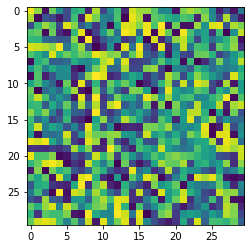

In [57]:
%%time
fig = plt.figure()
ave_M2, Cv, pics = SW_algorithm(L=30, T_i=0, T_f=2, T_steps=30, relaxation_time=5, extra_time=5)

In [58]:
temps = np.linspace(0,2,30)

In [59]:
%matplotlib inline
ani = animation.ArtistAnimation(fig, pics, interval=300, blit=True,
                                repeat_delay=1)
HTML(ani.to_html5_video())

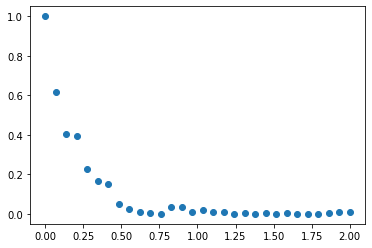

In [60]:
plt.scatter(temps,ave_M2)

<ipython-input-61-eaa8a3ad284a>:1: RuntimeWarning: invalid value encountered in true_divide
  plt.scatter(temps,Cv/(temps**2*30**2))


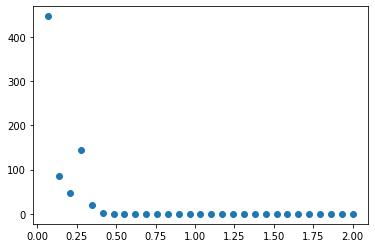

In [61]:
plt.scatter(temps,Cv/(temps**2*30**2))

In [ ]:
L = 10
spins = 

In [ ]:
projection=0.5
T=1

In [ ]:
1-np.exp(-2*projection/T)